In [ ]:
import json
import os
import itertools
import matplotlib.pyplot as plt
import matplotlib.cm as cm # For colorbar
import matplotlib.colors as mcolors # For colorbar
import matplotlib.patches as mpatches
from matplotlib.ticker import PercentFormatter, MaxNLocator, LogFormatterSciNotation, ScalarFormatter, FuncFormatter
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats

# --- Configuration & Styling (ACL/EMNLP Best Practices) ---
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'serif'],
    'font.sans-serif': ['DejaVu Sans', 'sans-serif'],
    'font.size': 10,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 0.8,
    'grid.color': 'grey',
    'grid.linestyle': ':',
    'grid.linewidth': 0.5,
    'xtick.major.pad': 2,
    'ytick.major.pad': 2,
    'figure.autolayout': False
})

colors = sns.color_palette("colorblind", 10)
bright_colors = sns.color_palette("bright", 10)
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'H']

OUTPUT_DIR = None # Updated by main function

# --- Speaker and Resource Metadata ---
SPEAKER_METADATA = {
    'ABA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'SKA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'YBAA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ZHAA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'BWC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'LXC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'NCC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TXHC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'ASI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'RRBI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'SVBI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TNI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HJK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'HKK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'YDCK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'YKWK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'EBVS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ERMS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'MBMPS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'NJS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HQTV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'PNV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'THV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TLV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'bdl': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slt': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'jmk': {'l1': 'Canadian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'awb': {'l1': 'Scottish English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'rms': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'clb': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'ksp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aew': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ahw': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aup': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'axb': {'l1': 'Indian English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'eey': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'fem': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'gka': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ljm': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'lnh': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'rxr': {'l1': 'Israeli English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
}
RESOURCE_MAPPING = {
    'l2-arctic': {'name': 'L2-Arctic', 'category': 'Low-resource'},
    'hisp-eng': {'name': 'HEC', 'category': 'Low-resource'},
    'saa': {'name': 'SAA', 'category': 'Low-resource'},
    'sandi': {'name': 'SANDI', 'category': 'Low-resource'},
    'cmu-arctic': {'name': 'CMU-Arctic', 'category': 'High-resource'},
}
RESOURCE_CATEGORY_PALETTE = {
    'High-resource': bright_colors[0],
    'Low-resource': bright_colors[1],
    'Unknown': 'grey'
}

HISP_ENG_ORIGINS = {
    '0': None, '1': 'Argentina', '2': 'Mexico', '3': 'Argentina', '4': 'Argentina',
    '5': 'Argentina', '6': 'Argentina', '7': None, '8': None, '9': None, '10': None,
    '11': None, '12': None, '13': None, '14': None, '15': None, '16': None, '17': None,
    '18': 'Argentina', '19': 'Chile'
}
CMU_ARCTIC_VARIETIES = {
    'aew': 'US English', 'ahw': 'German English', 'aup': 'Indian English',
    'axb': 'Indian English', 'eey': 'US English', 'fem': 'German English',
    'gka': 'Indian English', 'ljm': 'US English', 'lnh': 'US English',
    'rxr': 'Israeli English', 'slp': 'Indian English'
}
LANGUAGE_FAMILIES = {
    'afrikaans': 'Germanic', 'agni': 'Niger-Congo', 'albanian': 'Indo-European (Albanian)',
    'amharic': 'Afro-Asiatic (Cushitic)', 'arabic': 'Afro-Asiatic (Semitic)',
    'armenian': 'Indo-European (Armenian)', 'azerbaijani': 'Turkic', 'bafang': 'Niger-Congo',
    'baga': 'Niger-Congo', 'bai': 'Sino-Tibetan', 'bambara': 'Niger-Congo',
    'bamun': 'Niger-Congo', 'basque': 'Language Isolate', 'bengali': 'Indo-European (Indo-Aryan)',
    'bosnian': 'Indo-European (Slavic)', 'bulgarian': 'Indo-European (Slavic)',
    'cantonese': 'Sino-Tibetan', 'carolinian': 'Austronesian', 'catalan': 'Indo-European (Romance)',
    'chamorro': 'Austronesian', 'czech': 'Indo-European (Slavic)', 'danish': 'Germanic',
    'dari': 'Indo-European (Iranian)', 'dutch': 'Germanic', 'ebira': 'Niger-Congo',
    'edo': 'Niger-Congo', 'english': 'Germanic'
}

# --- Utility and Data Extraction Functions ---
def load_results(file_path):
    with open(file_path, 'r') as f: return json.load(f)

# NEW: Helper function to split composite speaker IDs
def split_composite_speaker(s):
    """
    Accepts '3_BWC' → returns ('3', 'BWC').
    If no underscore, returns (None, s).
    """
    if isinstance(s, str) and '_' in s:
        code, speaker = s.split('_', 1)
        return code, speaker
    return None, s

def calculate_mean_se(wer_values):
    """
    Calculates mean, standard error (SE), and count (n) for a list of WER values.
    Filters out NaN and negative values.
    Returns (mean, se, n). SE is 0.0 if n <= 1 or if all values are identical.
    """
    if not isinstance(wer_values, (list, np.ndarray, pd.Series)):
        if isinstance(wer_values, (int, float)) and pd.notna(wer_values) and wer_values >= 0:
            return wer_values, 0.0, 1
        return np.nan, np.nan, 0

    if isinstance(wer_values, pd.Series): wer_values = wer_values.tolist()
    elif isinstance(wer_values, np.ndarray): wer_values = wer_values.tolist()
    if not wer_values: return np.nan, np.nan, 0

    valid_wers = [w for w in wer_values if pd.notna(w) and w >= 0]
    n = len(valid_wers)

    if n == 0: return np.nan, np.nan, 0
    elif n == 1: return valid_wers[0], 0.0, 1
    else:
        mean = np.mean(valid_wers)
        se = stats.sem(valid_wers, ddof=1, nan_policy='omit')
        if pd.isna(se) or np.isclose(se, 0): se = 0.0
        return mean, se, n

# UPDATED: Extract function with composite speaker handling
def extract_full_data_with_trials(results_data, speaker_metadata_map, resource_map):
    trial_records = []
    speaker_shot_records = []

    for dataset_key, ds_content in results_data.items():
        if dataset_key not in resource_map:
            continue

        ds_meta = resource_map[dataset_key]
        for prompt_type, prompt_content in ds_content.items():
            for shot_tag, shot_block in prompt_content.items():
                if not shot_tag.startswith("shot"):
                    continue
                shot = int(shot_tag[4:])

                if "speakers" not in shot_block:
                    continue

                # UPDATED: Handle composite speaker IDs
                for raw_key, spk_json in shot_block["speakers"].items():
                    var_code, spk_code = split_composite_speaker(raw_key)

                    # lookup now uses the cleaned code
                    meta = speaker_metadata_map.get(spk_code.upper(), {})
                    l1     = meta.get("l1", "Unknown")
                    gender = meta.get("gender", "Unknown")

                    wer_vals = spk_json.get(f"{shot_tag}_wer_values", [])
                    mean, se, n = calculate_mean_se(wer_vals)

                    # -------- speaker‑level row (with VarietyID) ------------
                    speaker_shot_records.append({
                        "DatasetKey":      dataset_key,
                        "Corpus":          ds_meta["name"],
                        "ResourceCategory":ds_meta["category"],
                        "Speaker":         spk_code,     # cleaned code
                        "VarietyID":       var_code,     # may be None
                        "L1":              l1,
                        "Gender":          gender,
                        "PromptType":      prompt_type,
                        "Shot":            shot,
                        "WER_Speaker_Mean":mean,
                        "WER_Speaker_SE":  se,
                        "Num_Trials_Speaker": n,
                    })

                    # -------- trial‑level rows --------------
                    for w in wer_vals:
                        if pd.notna(w) and w >= 0:
                            trial_records.append({
                                "DatasetKey": dataset_key,
                                "Corpus":     ds_meta["name"],
                                "ResourceCategory": ds_meta["category"],
                                "Speaker":    spk_code,     # cleaned code
                                "VarietyID":  var_code,     # may be None
                                "L1":         l1,
                                "Gender":     gender,
                                "PromptType": prompt_type,
                                "Shot":       shot,
                                "WER_Trial":  w,
                            })

    df_speaker_shot = pd.DataFrame(speaker_shot_records)
    df_trials = pd.DataFrame(trial_records)
    for df in [df_speaker_shot, df_trials]:
        if not df.empty:
            numeric_cols = ['WER_Speaker_Mean', 'WER_Speaker_SE', 'Num_Trials_Speaker', 'WER_Trial', 'Shot']
            for col in numeric_cols:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
    return df_speaker_shot, df_trials

def find_overall_max_shot(results_data, resource_map):
    max_shot = -1
    for ds_key, ds_content in results_data.items():
        if ds_key not in resource_map:
            continue
        for prompt_content in ds_content.values():
            for shot_tag in prompt_content:
                if shot_tag.startswith("shot"):
                    try:
                        max_shot = max(max_shot, int(shot_tag[4:]))
                    except ValueError:
                        pass
    return max_shot if max_shot >= 0 else 0

# UPDATED: Add variety column with VarietyID support
def add_variety_column(df, cmu_varieties_map, hisp_origins_map, lang_families_map):
    df_out = df.copy()
    df_out['Variety'] = df_out['L1']

    for index, row in df_out.iterrows():
        corpus_key = row['DatasetKey']
        speaker_lc = str(row['Speaker']).lower()
        l1_lc = str(row['L1']).lower()

        if corpus_key == 'cmu-arctic':
            if speaker_lc in cmu_varieties_map:
                df_out.loc[index, 'Variety'] = cmu_varieties_map[speaker_lc]
        elif corpus_key == 'l2-arctic':
            # UPDATED: Use VarietyID for L2-Arctic
            num_code = str(row.get('VarietyID', ''))
            df_out.loc[index, 'Variety'] = {
                '1': 'Hindi',
                '2': 'Korean',
                '3': 'Mandarin',
                '4': 'Spanish',
                '5': 'Vietnamese',
            }.get(num_code, "Unknown")
        elif corpus_key == 'hisp-eng':
            origin = hisp_origins_map.get(speaker_lc)
            if origin is not None:
                df_out.loc[index, 'Variety'] = origin
        elif corpus_key == 'saa':
            family = lang_families_map.get(l1_lc)
            if family:
                df_out.loc[index, 'Variety'] = family
    return df_out

# --- Plotting Functions (Using SE) ---
def plot_scaling_law_by_category_prompt(df_trials, max_shot_plot, output_filename="plot1_scaling_law_category_prompt.pdf"):
    if df_trials.empty: print(f"{output_filename}: No trial data."); return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_plot].copy()
    if df_plot.empty: print(f"{output_filename}: No trial data up to {max_shot_plot} shots."); return

    agg_df = df_plot.groupby(['ResourceCategory', 'PromptType', 'Shot'])['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_df['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_df = pd.concat([agg_df.drop('list_of_wers', axis=1), stats_calc], axis=1)
    agg_df = agg_df[agg_df['n_trials'] > 0]
    if agg_df.empty: print(f"{output_filename}: No aggregated data."); return

    fig, ax = plt.subplots(figsize=(6, 4))
    unique_groups = agg_df[['ResourceCategory', 'PromptType']].drop_duplicates().values.tolist()
    for i, (rc, pt) in enumerate(unique_groups):
        group_data = agg_df[(agg_df['ResourceCategory'] == rc) & (agg_df['PromptType'] == pt)].sort_values('Shot')
        if group_data.empty: continue
        color_val = RESOURCE_CATEGORY_PALETTE.get(rc, colors[i % len(colors)])
        label = f"{rc} ({pt.title()})"; linestyle = line_styles[ (i // len(colors)) % len(line_styles) ]
        ax.plot(group_data['Shot'], group_data['mean_wer'], marker=markers[i % len(markers)], markersize=4, label=label, color=color_val, linestyle=linestyle, linewidth=1.5)
        ax.fill_between(group_data['Shot'], group_data['mean_wer'] - group_data['se_wer'], group_data['mean_wer'] + group_data['se_wer'], color=color_val, alpha=0.15, where=group_data['se_wer'] > 0)

    ax.set_xlabel('Number of Shots'); ax.set_ylabel('Average WER (± SE)'); ax.grid(True)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True, nbins=min(max_shot_plot + 1, 6)))
    ax.legend(title="Category (Prompt)", loc='best')
    min_wer_limit = (agg_df['mean_wer'] - agg_df['se_wer']).min(); max_wer_limit = (agg_df['mean_wer'] + agg_df['se_wer']).max()
    y_low = max(0, min_wer_limit * 0.9 if pd.notna(min_wer_limit) and min_wer_limit > 0 else -0.02)
    y_high = min(1.0, max_wer_limit * 1.1 if pd.notna(max_wer_limit) and max_wer_limit < 1 else 1.0)
    if pd.notna(y_low) and pd.notna(y_high) and y_low >= y_high : y_high = y_low + 0.1
    elif not (pd.notna(y_low) and pd.notna(y_high)): y_low, y_high = 0, 0.5
    ax.set_ylim(y_low, y_high)
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_iterative_shot_effect_scatter_v4(df_speaker_shot, max_shot_plot, datasets_to_include=['l2-arctic', 'cmu-arctic'], output_filename="plot2_iterative_shot_effect.pdf"):
    df_filtered = df_speaker_shot[(df_speaker_shot['DatasetKey'].isin(datasets_to_include)) & (df_speaker_shot['Num_Trials_Speaker'] > 0) & (df_speaker_shot['Shot'] <= max_shot_plot)].copy()
    df_avg_prompt = df_filtered.groupby(['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    if df_avg_prompt.empty: print(f"{output_filename}: No data after averaging prompts."); return
    all_transitions_data = []
    for shot_n in range(max_shot_plot):
        shot_n_plus_1 = shot_n + 1
        df_shot_n = df_avg_prompt[df_avg_prompt['Shot'] == shot_n]; df_shot_n_plus_1 = df_avg_prompt[df_avg_prompt['Shot'] == shot_n_plus_1]
        merged_df = pd.merge(df_shot_n, df_shot_n_plus_1, on=['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1'], suffixes=('_N', '_N+1')).dropna(subset=['WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1'])
        if not merged_df.empty: merged_df['Shot_N_Value'] = shot_n; all_transitions_data.append(merged_df[['Speaker', 'ResourceCategory', 'Shot_N_Value', 'WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1']])
    if not all_transitions_data: print(f"{output_filename}: No valid N vs N+1 shot transitions found."); return
    final_plot_df = pd.concat(all_transitions_data);
    if final_plot_df.empty: print(f"{output_filename}: Final plot dataframe is empty."); return

    fig, ax = plt.subplots(figsize=(6, 5)); unique_shot_n_values = sorted(final_plot_df['Shot_N_Value'].unique())
    cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1); norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))
    scatter = ax.scatter(final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1'], c=final_plot_df['Shot_N_Value'], cmap=cmap, norm=norm, alpha=0.5, s=30, marker='o')
    all_wers = pd.concat([final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1']]).dropna(); legend_handles = []
    if not all_wers.empty:
        lim_min = max(0, all_wers.min() - 0.05); lim_max = min(1.0, all_wers.max() + 0.05)
        if lim_min >= lim_max: lim_max = lim_min + 0.1
        ax.plot([lim_min, lim_max], [lim_min, lim_max], 'k--', alpha=0.7, linewidth=1); legend_handles.append(plt.Line2D([0], [0], color='k', linestyle='--', label='y=x (R²=1.00)'))
        ax.set_xlim(lim_min, lim_max); ax.set_ylim(lim_min, lim_max)
        x_reg = final_plot_df['WER_Speaker_Mean_N'].dropna(); y_reg = final_plot_df['WER_Speaker_Mean_N+1'].dropna()
        common_indices = x_reg.index.intersection(y_reg.index); x_reg_clean = x_reg.loc[common_indices]; y_reg_clean = y_reg.loc[common_indices]
        if len(x_reg_clean) > 1:
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_reg_clean, y_reg_clean); r_squared = r_value**2
            reg_x_points = np.array([lim_min, lim_max]); reg_y_points = slope * reg_x_points + intercept
            ax.plot(reg_x_points, reg_y_points, color=bright_colors[3], linestyle='-', linewidth=1.5); legend_handles.append(plt.Line2D([0], [0], color=bright_colors[3], linestyle='-', label=f'Lin. Reg. (R²={r_squared:.2f})'))
    ax.set_xlabel('WER at Shot N'); ax.set_ylabel('WER at Shot N+1'); ax.grid(True)
    ax.xaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    if unique_shot_n_values: cbar = fig.colorbar(scatter, ax=ax, ticks=unique_shot_n_values, format='%d'); cbar.set_label('Shot N (in N→N+1)', rotation=270, labelpad=15)
    if legend_handles: ax.legend(handles=legend_handles, loc='lower right')
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_avg_wer_by_shot_category(df_speaker_shot_agg, max_shot_plot, output_filename="plot3_avg_wer_by_shot_category.pdf"):
    if df_speaker_shot_agg.empty: print(f"{output_filename}: Input dataframe is empty."); return
    df_avg_prompts = df_speaker_shot_agg.groupby(['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    agg_df = df_avg_prompts[df_avg_prompts['Shot'] <= max_shot_plot].groupby(['ResourceCategory', 'Shot'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = agg_df['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_speakers']))
    agg_df = pd.concat([agg_df.drop('list_of_means', axis=1), stats_calc], axis=1)
    agg_df = agg_df[agg_df['n_speakers'] > 0]
    if agg_df.empty: print(f"{output_filename}: No data after aggregation."); return

    fig, ax = plt.subplots(figsize=(6, 4))
    resource_order = [rc for rc in ['High-resource', 'Low-resource'] if rc in agg_df['ResourceCategory'].unique()]; other_categories = [rc for rc in sorted(agg_df['ResourceCategory'].unique()) if rc not in resource_order]; final_resource_order = resource_order + other_categories
    for i, rc in enumerate(final_resource_order):
        rc_data = agg_df[agg_df['ResourceCategory'] == rc].sort_values('Shot')
        if rc_data.empty: continue
        color_val = RESOURCE_CATEGORY_PALETTE.get(rc, colors[i % len(colors)])
        ax.plot(rc_data['Shot'], rc_data['mean_wer'], marker='o', markersize=4, label=rc, color=color_val, linewidth=1.5)
        ax.fill_between(rc_data['Shot'], rc_data['mean_wer'] - rc_data['se_wer'], rc_data['mean_wer'] + rc_data['se_wer'], color=color_val, alpha=0.15, where=rc_data['se_wer'] > 0)

    ax.set_xlabel('Number of Shots'); ax.set_ylabel('Average WER (± SE, Prompt Aggr.)'); ax.grid(True)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=min(max_shot_plot + 1, 6)))
    ax.legend(title="Resource Category")
    min_wer_limit = (agg_df['mean_wer'] - agg_df['se_wer']).min(); max_wer_limit = (agg_df['mean_wer'] + agg_df['se_wer']).max()
    y_low = max(0, min_wer_limit * 0.9 if pd.notna(min_wer_limit) and min_wer_limit > 0 else -0.02)
    y_high = min(1.0, max_wer_limit * 1.1 if pd.notna(max_wer_limit) and max_wer_limit < 1 else 1.0)
    if pd.notna(y_low) and pd.notna(y_high) and y_low >= y_high : y_high = y_low + 0.1
    elif not (pd.notna(y_low) and pd.notna(y_high)): y_low, y_high = 0, 0.5
    ax.set_ylim(y_low, y_high)
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_aggregated_speaker_wer_violin_log_scale(df_trials_global, datasets_to_aggregate, shots_to_plot_global, output_filename="plot4_agg_speaker_var_violin_log.pdf"):
    df_agg = df_trials_global[(df_trials_global['DatasetKey'].isin(datasets_to_aggregate)) & (df_trials_global['Shot'].isin(shots_to_plot_global))].copy()
    if df_agg.empty: print(f"{output_filename}: No data for datasets {datasets_to_aggregate}, shots {shots_to_plot_global}."); return
    df_agg = df_agg[df_agg['ResourceCategory'].isin(['High-resource', 'Low-resource'])]
    if df_agg.empty: print(f"{output_filename}: No data with 'High-resource' or 'Low-resource' categories."); return
    epsilon = 1e-4; df_agg['WER_Trial_Log'] = np.log10(df_agg['WER_Trial'].clip(lower=epsilon)); df_agg = df_agg[df_agg['WER_Trial'] >= 0]
    num_shots = len(shots_to_plot_global); fig, axes = plt.subplots(1, num_shots, figsize=(3.5 * num_shots, 4.5), sharey=True)
    if num_shots == 1: axes = [axes]
    resource_order = ['High-resource', 'Low-resource']
    for i, shot in enumerate(shots_to_plot_global):
        ax = axes[i]; shot_data = df_agg[df_agg['Shot'] == shot]
        if shot_data.empty: ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes); ax.set_title(f'{shot}-shot'); continue
        sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
        for rc_idx, rc_val in enumerate(resource_order):
            rc_specific_data = shot_data[shot_data['ResourceCategory'] == rc_val]
            if not rc_specific_data.empty:
                jitter_strength = 0.15; x_jitters = np.random.uniform(-jitter_strength, jitter_strength, size=len(rc_specific_data)) + rc_idx
                point_color = RESOURCE_CATEGORY_PALETTE.get(rc_val, 'grey'); ax.scatter(x_jitters, rc_specific_data['WER_Trial_Log'], color=point_color, s=4, alpha=0.3, zorder=5)
        for rc_idx, rc in enumerate(resource_order):
            rc_mean_wer_orig = shot_data[shot_data['ResourceCategory'] == rc]['WER_Trial'].mean()
            if pd.notna(rc_mean_wer_orig) and rc_mean_wer_orig >= epsilon: rc_mean_wer_log = np.log10(rc_mean_wer_orig); ax.plot([rc_idx - 0.25, rc_idx + 0.25], [rc_mean_wer_log, rc_mean_wer_log], color='black', linestyle='-', linewidth=1.5, alpha=0.9, zorder=10)
        ax.set_title(f'{shot}-shot'); ax.set_ylabel('WER (log scale)' if i == 0 else ''); ax.grid(True, axis='y'); ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{10**y:.2%}'))
    all_log_wers = df_agg['WER_Trial_Log'].dropna()
    if not all_log_wers.empty:
        min_y_log, max_y_log = all_log_wers.min(), all_log_wers.max(); padding = (max_y_log - min_y_log) * 0.05 if (max_y_log - min_y_log) > 0 else 0.1
        y_low_log = min_y_log - padding; y_high_log = max_y_log + padding
        if y_low_log >= y_high_log : y_high_log = y_low_log + 0.2
        y_high_log = max(y_high_log, np.log10(epsilon) + 0.1)
        for ax_sub in axes: ax_sub.set_ylim(y_low_log, y_high_log)
    else:
        for ax_sub in axes: ax_sub.set_ylim(np.log10(epsilon), np.log10(1.0))
    handles = [mpatches.Patch(color=RESOURCE_CATEGORY_PALETTE[cat], label=cat) for cat in resource_order if cat in RESOURCE_CATEGORY_PALETTE and cat in df_agg['ResourceCategory'].unique()]
    if handles: fig.legend(handles=handles, title="Category", loc='upper center', bbox_to_anchor=(0.5, 0.03), ncol=len(handles), frameon=False)
    plt.tight_layout(pad=0.5, rect=[0, 0.05, 1, 0.98])
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_delta_wer_0_vs_10_shot_by_speaker(df_speaker_shot, shot_high=10, shot_low=0, output_filename="plot5_delta_wer_0_vs_10_shot.pdf"):
    df_prompt_avg = df_speaker_shot.groupby(['Speaker', 'Corpus', 'ResourceCategory', 'DatasetKey', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_pivot = df_prompt_avg.pivot_table(index=['Speaker', 'Corpus', 'ResourceCategory', 'DatasetKey'], columns='Shot', values='WER_Speaker_Mean').reset_index()
    if shot_low not in df_pivot.columns or shot_high not in df_pivot.columns: print(f"{output_filename}: Data for {shot_low}-shot or {shot_high}-shot missing."); return
    df_delta = df_pivot.dropna(subset=[shot_low, shot_high]);
    if df_delta.empty: print(f"{output_filename}: No speakers with data for both {shot_low}-shot and {shot_high}-shot."); return
    delta_col_name = f'DeltaWER_{shot_low}_vs_{shot_high}'; df_delta[delta_col_name] = df_delta[shot_low] - df_delta[shot_high]
    df_delta_agg_speaker = df_delta.sort_values(by=[delta_col_name], ascending=[False])
    num_speakers = len(df_delta_agg_speaker);
    if num_speakers == 0: print(f"{output_filename}: No speaker data after processing."); return
    fig_height = max(4, num_speakers * 0.18); fig, ax = plt.subplots(figsize=(7, fig_height))
    sns.barplot(x=delta_col_name, y='Speaker', data=df_delta_agg_speaker, ax=ax, hue='ResourceCategory', palette=RESOURCE_CATEGORY_PALETTE, dodge=False, hue_order=['High-resource', 'Low-resource'])
    ax.set_xlabel(f'WER Improvement ({shot_low}-shot − {shot_high}-shot)'); ax.set_ylabel('Speaker (Corpus)'); ax.axvline(0, color='black', linestyle='--', linewidth=0.8); ax.grid(True, axis='x'); ax.xaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    corpus_speakers = {}; speaker_numbers = {}
    for corpus, spk in zip(df_delta_agg_speaker['Corpus'], df_delta_agg_speaker['Speaker']):
        if corpus not in corpus_speakers: corpus_speakers[corpus] = []
        if spk not in corpus_speakers[corpus]: corpus_speakers[corpus].append(spk)
    for corpus, speakers in corpus_speakers.items():
        for idx, spk in enumerate(sorted(speakers), 1): speaker_numbers[(corpus, spk)] = idx
    new_ylabels = [f"{corpus}-{speaker_numbers[(corpus, spk)]}" for corpus, spk in zip(df_delta_agg_speaker['Corpus'], df_delta_agg_speaker['Speaker'])]
    ax.set_yticklabels(new_ylabels); ax.tick_params(axis='y', labelsize=max(6, 9 - num_speakers // 15)); current_handles, current_labels = ax.get_legend_handles_labels()
    ordered_handles = []; ordered_labels = []
    for cat_label in ['High-resource', 'Low-resource']:
        if cat_label in RESOURCE_CATEGORY_PALETTE and cat_label in current_labels: idx = current_labels.index(cat_label); ordered_handles.append(current_handles[idx]); ordered_labels.append(current_labels[idx])
    if ordered_handles: ax.legend(handles=ordered_handles, labels=ordered_labels, title="Category", loc="lower right", frameon=True, facecolor='white', framealpha=0.7)
    elif ax.get_legend() is not None: ax.get_legend().remove()
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

# UPDATED plot_corpus_aggregated_shot_ranges_se function with 0-2, 3-6, 7-10 bins
def plot_corpus_aggregated_shot_ranges_se(df_speaker_shot, max_shot_available_overall,
                                           output_filename="plot6_corpus_aggregated_shot_bins_02_36_710.pdf"): # Updated filename
    """ Plots aggregated WER by corpus for specified shot bins (0-2, 3-6, 7-10) using SE """
    if df_speaker_shot.empty: print(f"{output_filename}: Input dataframe is empty."); return
    df_filtered = df_speaker_shot[df_speaker_shot['Shot'] <= max_shot_available_overall].copy()
    if df_filtered.empty: print(f"{output_filename}: No data within max shot {max_shot_available_overall}."); return

    # Define the NEW shot grouping function: 0-2, 3-6, 7-10
    def assign_shot_group_02_36_710(shot):
        if 0 <= shot <= 2: return "0-2 shot"
        elif 3 <= shot <= 6: return "3-6 shot"
        elif 7 <= shot <= 10: return "7-10 shot"
        return None

    df_filtered['ShotGroup'] = df_filtered['Shot'].apply(assign_shot_group_02_36_710)
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_filtered.empty: print(f"{output_filename}: No data falls into the defined shot groups (0-2, 3-6, 7-10) within max shot."); return

    df_corpus_agg = df_filtered.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_corpus_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_corpus_agg = pd.concat([df_corpus_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_plot = df_corpus_agg.dropna(subset=['mean_wer']); df_plot = df_plot[df_plot['n_points'] > 0]
    if df_plot.empty: print(f"{output_filename}: No corpora with aggregated data for shot groups."); return

    order_df = df_plot[df_plot['ShotGroup'] == "0-2 shot"].sort_values('mean_wer', ascending=False)
    corpus_order = order_df['Corpus'].unique().tolist()
    all_corpora = sorted(df_plot['Corpus'].unique()); [corpus_order.append(c) for c in all_corpora if c not in corpus_order]

    fig, ax = plt.subplots(figsize=(max(6, len(corpus_order) * 0.9), 5.5))
    shot_group_order = ["0-2 shot", "3-6 shot", "7-10 shot"]
    shot_group_order_present = [sg for sg in shot_group_order if sg in df_plot['ShotGroup'].unique()]
    if not shot_group_order_present: print(f"{output_filename}: No data found for any shot group label ({shot_group_order}). Skipping plot."); plt.close(fig); return

    num_hue_groups = len(shot_group_order_present)
    palette_map = {group: colors[i % len(colors)] for i, group in enumerate(shot_group_order_present)}
    sns.barplot(x='Corpus', y='mean_wer', hue='ShotGroup', data=df_plot, order=corpus_order, hue_order=shot_group_order_present, ax=ax, palette=palette_map, errorbar=None)

    for i, c_name in enumerate(corpus_order):
        for j, sg_name in enumerate(shot_group_order_present):
            row = df_plot[(df_plot['Corpus'] == c_name) & (df_plot['ShotGroup'] == sg_name)]
            if not row.empty:
                mean = row['mean_wer'].iloc[0]; se = row['se_wer'].iloc[0]
                bar_group_total_width = 0.8; bar_width_single = bar_group_total_width / num_hue_groups
                offset = (j - (num_hue_groups - 1) / 2) * bar_width_single; x_pos = i + offset
                if pd.notna(mean) and pd.notna(se) and se > 0: ax.errorbar(x_pos, mean, yerr=se, fmt='none', color='black', capsize=3, elinewidth=0.8, zorder=10)

    ax.set_xlabel('Corpus'); ax.set_ylabel('Average WER (± SE, Aggregated Shot Bins)'); ax.grid(True, axis='y'); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    handles, labels = ax.get_legend_handles_labels(); ax.legend(handles=handles, labels=labels, title="Shot Group", loc='upper right')
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR:
        save_path = os.path.join(OUTPUT_DIR, output_filename)
        try: plt.savefig(save_path); print(f"Saved: {save_path}")
        except Exception as e: print(f"Error saving plot {save_path}: {e}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show() # Uncomment to display plot interactively
    plt.close(fig)

def plot_shot_grouped_bar_by_resource(df_speaker_shot, max_shot_plot, output_filename="plot7_shot_grouped_bar_resource.pdf"):
    shots_to_display = list(range(max_shot_plot + 1))
    df_filtered = df_speaker_shot[(df_speaker_shot['Shot'].isin(shots_to_display)) & (df_speaker_shot['Num_Trials_Speaker'] > 0)].copy()
    df_prompt_avg = df_filtered.groupby(['ResourceCategory', 'Speaker', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_plot = df_prompt_avg.groupby(['ResourceCategory', 'Shot'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_plot['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_speakers']))
    df_plot = pd.concat([df_plot.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_plot = df_plot[df_plot['n_speakers'] > 0]
    if df_plot.empty: print(f"{output_filename}: No data for selected shots and datasets after aggregation."); return

    fig, ax = plt.subplots(figsize=(max(6, len(shots_to_display) * 0.8) , 5))
    sns.barplot(x='Shot', y='mean_wer', hue='ResourceCategory', data=df_plot, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, hue_order=['High-resource', 'Low-resource'], errorbar=None)
    hue_categories = ['High-resource', 'Low-resource']; hue_categories_present = [hc for hc in hue_categories if hc in df_plot['ResourceCategory'].unique()]; num_hue_categories = len(hue_categories_present)
    for i, shot_val in enumerate(shots_to_display):
        for j, rc_val in enumerate(hue_categories_present):
            row = df_plot[(df_plot['Shot'] == shot_val) & (df_plot['ResourceCategory'] == rc_val)]
            if not row.empty:
                mean = row['mean_wer'].iloc[0]; se = row['se_wer'].iloc[0]
                bar_group_width = 0.8; bar_width_single = bar_group_width / num_hue_categories; offset = (j - (num_hue_categories - 1) / 2) * bar_width_single; x_pos = i + offset
                if pd.notna(mean) and pd.notna(se) and se > 0: ax.errorbar(x_pos, mean, yerr=se, fmt='none', color='black', capsize=3, elinewidth=0.8)
    overall_avg_wer = df_plot['mean_wer'].mean()
    if pd.notna(overall_avg_wer): ax.axhline(overall_avg_wer, color='grey', linestyle=':', linewidth=1.2, label=f'Overall Avg WER ({overall_avg_wer:.0%})')
    ax.set_xlabel('Number of Shots'); ax.set_ylabel('Average WER (± SE, across Speakers & Prompts)'); ax.grid(True, axis='y'); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    handles, legend_labels = ax.get_legend_handles_labels(); legend_dict = dict(zip(legend_labels, handles)); ordered_legend_labels = []
    if 'High-resource' in legend_dict: ordered_legend_labels.append('High-resource')
    if 'Low-resource' in legend_dict: ordered_legend_labels.append('Low-resource')
    overall_avg_label_text = f'Overall Avg WER ({overall_avg_wer:.0%})'
    if pd.notna(overall_avg_wer) and overall_avg_label_text in legend_dict: ordered_legend_labels.append(overall_avg_label_text)
    [ordered_legend_labels.append(lab) for lab in legend_labels if lab not in ordered_legend_labels]
    ordered_handles = [legend_dict[lab] for lab in ordered_legend_labels]; ax.legend(handles=ordered_handles, labels=ordered_legend_labels, title="Resource Category")
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_relative_wer_improvement_speaker(df_speaker_shot_data, max_shot_for_comparison, output_filename="new_plot1_relative_improvement.pdf"):
    if df_speaker_shot_data.empty: print(f"{output_filename}: Input dataframe empty."); return
    df_agg_prompts = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_0_shot = df_agg_prompts[df_agg_prompts['Shot'] == 0]; df_n_shot = df_agg_prompts[df_agg_prompts['Shot'] == max_shot_for_comparison]
    if df_0_shot.empty or df_n_shot.empty: print(f"{output_filename}: Missing data for 0-shot or {max_shot_for_comparison}-shot."); return
    df_merged = pd.merge(df_0_shot, df_n_shot, on=['Corpus', 'ResourceCategory', 'Speaker', 'L1'], suffixes=('_0', f'_{max_shot_for_comparison}'))
    df_merged = df_merged.rename(columns={f'WER_Speaker_Mean_0': 'WER_0_shot', f'WER_Speaker_Mean_{max_shot_for_comparison}': f'WER_{max_shot_for_comparison}_shot'})
    df_merged['RelativeImprovement'] = np.where(df_merged['WER_0_shot'] > 1e-6, (df_merged['WER_0_shot'] - df_merged[f'WER_{max_shot_for_comparison}_shot']) / df_merged['WER_0_shot'], 0); df_merged['RelativeImprovement'] = df_merged['RelativeImprovement'].fillna(0)
    df_merged = df_merged.sort_values('RelativeImprovement', ascending=False)
    num_speakers = len(df_merged);
    if num_speakers == 0: print(f"{output_filename}: No speaker data after merging shots."); return
    fig_height = max(4, num_speakers * 0.20); fig, ax = plt.subplots(figsize=(8, fig_height))
    sns.barplot(x='RelativeImprovement', y='Speaker', data=df_merged, hue='ResourceCategory', palette=RESOURCE_CATEGORY_PALETTE, hue_order=['High-resource', 'Low-resource'], dodge=False, ax=ax)
    ax.set_xlabel(f'Relative WER Improvement ((0-shot - {max_shot_for_comparison}-shot) / 0-shot)'); ax.set_ylabel('Speaker (Corpus)'); ax.xaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.axvline(0, color='grey', linestyle='--', linewidth=0.8); ax.grid(True, axis='x', linestyle=':', alpha=0.7)
    new_ylabels = [f"{spk} ({corpus.split('-')[0]})" for spk, corpus in zip(df_merged['Speaker'], df_merged['Corpus'])]; ax.set_yticklabels(new_ylabels); ax.tick_params(axis='y', labelsize=max(6, 9 - num_speakers // 20))
    handles, labels = ax.get_legend_handles_labels(); ordered_handles = []; ordered_labels = []
    for cat_label in ['High-resource', 'Low-resource']:
        if cat_label in labels: idx = labels.index(cat_label); ordered_handles.append(handles[idx]); ordered_labels.append(labels[idx])
    if ordered_handles: ax.legend(handles=ordered_handles, labels=ordered_labels, title="Resource Category", loc="lower right")
    elif ax.get_legend() is not None: ax.get_legend().remove()
    plt.title(f'Relative WER Improvement by Speaker (0 vs. {max_shot_for_comparison}-shot)'); plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_wer_distribution_l1_shotgroup(df_speaker_shot_data, max_shot_available, output_filename="new_plot2_wer_l1_shotgroup.pdf"):
    if df_speaker_shot_data.empty: print(f"{output_filename}: Input dataframe empty."); return
    df_copy = df_speaker_shot_data.copy(); upper_bound_group2 = min(10, max_shot_available)
    def assign_shot_group_detailed(shot):
        if shot == 0: return "0-shot"
        elif 1 <= shot <= 4: return "1-4 shot"
        elif 5 <= shot <= upper_bound_group2 and upper_bound_group2 >= 5: return f"5-10 shot"
        return None
    df_copy['ShotGroup'] = df_copy['Shot'].apply(assign_shot_group_detailed)
    df_copy = df_copy[df_copy['Shot'] <= max_shot_available]; df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean', 'L1'])
    df_plot_data = df_copy.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'ShotGroup'])['WER_Speaker_Mean'].mean().reset_index()
    if df_plot_data.empty: print(f"{output_filename}: No data after grouping for L1 plot."); return
    l1_order = sorted(df_plot_data['L1'].unique())
    potential_shot_groups = ["0-shot", "1-4 shot"];
    if upper_bound_group2 >= 5: potential_shot_groups.append("5-10 shot")
    shot_group_order = [sg for sg in potential_shot_groups if sg in df_plot_data['ShotGroup'].unique()]
    if not shot_group_order: print(f"{output_filename}: No valid shot groups found."); return
    num_l1s = len(l1_order); fig_width = max(8, num_l1s * 1.5); fig = plt.figure(figsize=(fig_width, 6))
    palette = {group: colors[i % len(colors)] for i, group in enumerate(shot_group_order)}
    sns.boxplot(x='L1', y='WER_Speaker_Mean', hue='ShotGroup', data=df_plot_data, order=l1_order, hue_order=shot_group_order, palette=palette, showfliers=False, linewidth=1.2)
    plt.xlabel("Native Language (L1)"); plt.ylabel("Average Speaker WER (Prompt-Aggregated)"); plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); plt.xticks(rotation=45, ha='right'); plt.grid(True, axis='y', linestyle=':', alpha=0.7); plt.legend(title="Shot Group", loc='upper right'); plt.title("WER Distribution by L1 and Shot Group")
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

def plot_overall_aggregated_shot_bins_se(df_trials, max_shot_available, output_filename="new_plot3_overall_shot_bins.pdf"):
    if df_trials.empty: print(f"{output_filename}: Trial data is empty."); return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_available].copy()
    if df_plot.empty: print(f"{output_filename}: No trial data within max shot {max_shot_available}."); return
    upper_bound_group2 = min(10, max_shot_available)
    def assign_overall_shot_group(shot):
        if 0 <= shot <= 5: return "0-5 shot"
        elif 6 <= shot <= upper_bound_group2 : return "6-10 shot"
        return None
    df_plot['OverallShotGroup'] = df_plot['Shot'].apply(assign_overall_shot_group); df_plot = df_plot.dropna(subset=['OverallShotGroup', 'WER_Trial'])
    if df_plot.empty: print(f"{output_filename}: No data in defined shot groups (0-5, 6-10) within max shot."); return
    agg_data = df_plot.groupby('OverallShotGroup')['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_data['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_data = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1); agg_data = agg_data[agg_data['n_trials'] > 0]
    group_order = [];
    if "0-5 shot" in agg_data['OverallShotGroup'].values: group_order.append("0-5 shot")
    if "6-10 shot" in agg_data['OverallShotGroup'].values: group_order.append("6-10 shot")
    agg_data = agg_data[agg_data['OverallShotGroup'].isin(group_order)].set_index('OverallShotGroup').reindex(group_order).reset_index()
    if agg_data.empty: print(f"{output_filename}: No aggregated data for shot groups after filtering."); return

    fig, ax = plt.subplots(figsize=(5, 4)); bar_colors = [colors[c % len(colors)] for c in range(len(agg_data))]
    ax.bar(agg_data['OverallShotGroup'], agg_data['mean_wer'], color=bar_colors, width=0.6)
    for i, group_name in enumerate(agg_data['OverallShotGroup']):
        row = agg_data[agg_data['OverallShotGroup'] == group_name]
        if not row.empty:
            mean = row['mean_wer'].iloc[0]; se = row['se_wer'].iloc[0]
            if pd.notna(mean) and pd.notna(se) and se > 0: ax.errorbar(i, mean, yerr=se, fmt='none', color='black', capsize=5, elinewidth=1)
    ax.set_ylabel('Average WER (± SE)'); ax.set_xlabel('Shot Group'); ax.set_title(f'Overall Aggregated WER by Shot Bins'); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    if not agg_data.empty:
        min_val = (agg_data['mean_wer'] - agg_data['se_wer']).min(); max_val = (agg_data['mean_wer'] + agg_data['se_wer']).max()
        y_min_limit = max(0, min_val * 0.9 if pd.notna(min_val) else 0); y_max_limit = min(1.0, max_val * 1.1 if pd.notna(max_val) else 1)
        if y_min_limit >= y_max_limit : y_max_limit = y_min_limit + 0.1
        ax.set_ylim(y_min_limit, y_max_limit)
    plt.tight_layout(pad=0.5)
    if OUTPUT_DIR: plt.savefig(os.path.join(OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")
    plt.show(); plt.close(fig)

# --- LaTeX Table Generation Functions (Using SE) ---
def format_wer_se_latex(mean, se, precision=1):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if isinstance(se, pd.Series):
        se = se.iloc[0] if not se.empty else np.nan

    if pd.isna(mean) or mean is None: return "-"
    mean_pct = mean * 100
    if pd.isna(se) or se is None or abs(se * 100) < (0.1**(precision + 1)): return f"{mean_pct:.{precision}f}"
    se_pct = abs(se * 100)
    return f"{mean_pct:.{precision}f}~($\\pm${se_pct:.{precision}f})"

def format_wer_latex(mean, precision=1):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean): return "-"
    return f"{mean * 100:.{precision}f}"

def format_wer_latex_simple(mean, precision=1, as_percentage=True):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean) or mean is None: return "-"
    value = mean * 100 if as_percentage else mean
    return f"{value:.{precision}f}"

def generate_table1_core_results(df_speaker_shot_data, shots_to_report, caption, label):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 1}\n"
    df_agg = df_speaker_shot_data[df_speaker_shot_data['Shot'].isin(shots_to_report)].groupby(['ResourceCategory', 'Shot'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_agg = pd.concat([df_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_agg.pivot_table(index='ResourceCategory', columns='Shot', values=['mean_wer', 'se_wer'])
    expected_metrics = ['mean_wer', 'se_wer']; shots_to_report_int = [int(s) for s in shots_to_report]
    expected_cols_tuples = pd.MultiIndex.from_product([expected_metrics, shots_to_report_int], names=['metric', 'Shot'])
    if not df_pivot.empty:
        df_pivot.columns = pd.MultiIndex.from_tuples([(col[0], int(col[1])) for col in df_pivot.columns], names=['metric', 'Shot'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples)
    else:
        known_categories = pd.Index(df_speaker_shot_data['ResourceCategory'].unique(), name='ResourceCategory')
        df_pivot = pd.DataFrame(columns=expected_cols_tuples, index=known_categories)
    latex_str = "\\begin{table*}[htbp]\n\\centering\n"
    latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shots_to_report_int); col_format = "l" + "c" * num_shot_cols
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header = "Resource Category & " + " & ".join([f"{s}-shot WER (\%)" for s in shots_to_report_int]) + " \\\\\n\\midrule\n"; latex_str += header
    categories = ['High-resource', 'Low-resource']
    for cat in categories:
        cat_latex = cat.replace('-', '\\textnormal{-}')
        if cat in df_pivot.index:
            row_data = [cat_latex]
            for shot in shots_to_report_int:
                # Extract scalar values safely
                if ('mean_wer', shot) in df_pivot.columns:
                    mean_val = df_pivot.loc[cat, ('mean_wer', shot)]
                    mean_val = mean_val.iloc[0] if isinstance(mean_val, pd.Series) else mean_val
                else:
                    mean_val = np.nan

                if ('se_wer', shot) in df_pivot.columns:
                    se_val = df_pivot.loc[cat, ('se_wer', shot)]
                    se_val = se_val.iloc[0] if isinstance(se_val, pd.Series) else se_val
                else:
                    se_val = np.nan

                row_data.append(format_wer_se_latex(mean_val, se_val))
            latex_str += " & ".join(row_data) + " \\\\\n"
        else: latex_str += f"{cat_latex} & " + " & ".join(["-"] * num_shot_cols) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_table2_appendix_full(df_speaker_shot_data, max_shot_to_display, caption, label):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 2}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'DatasetKey', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_pivot = df_prompt_agg[df_prompt_agg['Shot'] <= max_shot_to_display].pivot_table(index=['Corpus', 'Speaker', 'L1', 'ResourceCategory'], columns='Shot', values='WER_Speaker_Mean').reset_index()
    df_pivot = df_pivot.sort_values(['Corpus', 'Speaker'])
    shot_columns = sorted([s for s in df_pivot.columns if isinstance(s, int) and s <= max_shot_to_display])
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns); col_format = "lllr" + "c" * num_shot_cols; latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-sh" for s in shot_columns]); header = "Corpus & Speaker & L1 & Resource & " + header_shots + " \\\\\n\\midrule\n"; latex_str += header
    for _, row in df_pivot.iterrows():
        l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A'; res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A'; res_cat_fmt = res_cat_str.replace('-resource','').title()
        row_data = [row['Corpus'], row['Speaker'], l1_str, res_cat_fmt]
        for shot in shot_columns: row_data.append(format_wer_latex(row.get(shot, np.nan)))
        latex_str += " & ".join(map(str, row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_table3_best_worst_speakers(df_speaker_shot_data, n_shot_compare, num_speakers_each=5, caption="Best and Worst Performing Speakers", label="tab:best_worst_speakers"):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 3}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_0_shot = df_prompt_agg[df_prompt_agg['Shot'] == 0].rename(columns={'WER_Speaker_Mean': 'WER_0_shot'}); df_n_shot = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_compare].rename(columns={'WER_Speaker_Mean': f'WER_{n_shot_compare}_shot'})
    if df_0_shot.empty or df_n_shot.empty: return f"\\textit{{Missing shot data for Table 3 (0-shot or {n_shot_compare}-shot).}}\n"
    df_merged = pd.merge(df_0_shot[['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'WER_0_shot']], df_n_shot[['Speaker', f'WER_{n_shot_compare}_shot']], on='Speaker', how='inner')
    if df_merged.empty: return f"\\textit{{No speakers with both 0-shot and {n_shot_compare}-shot data for Table 3.}}\n"
    df_merged['Delta_WER'] = df_merged['WER_0_shot'] - df_merged[f'WER_{n_shot_compare}_shot']
    sections = {
        f"Top {num_speakers_each} by 0-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, 'WER_0_shot'),
        f"Bottom {num_speakers_each} by 0-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, 'WER_0_shot'),
        f"Top {num_speakers_each} by {n_shot_compare}-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Bottom {num_speakers_each} by {n_shot_compare}-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Top {num_speakers_each} by Delta WER (Largest Improvement)": df_merged.nlargest(num_speakers_each, 'Delta_WER'),
    }
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption} (0-shot vs. {n_shot_compare}-shot WERs as percentages).}}\n\\label{{{label}}}\n"
    latex_str += "\\begin{tabular}{lllccccc}\n\\toprule\n"; latex_str += "Category & Corpus & Speaker & L1 & Resource & 0-shot & N-shot & Delta \\\\\n\\midrule\n"
    first_section = True
    for title, df_section in sections.items():
        if not first_section: latex_str += "\\midrule\n"; first_section = False
        latex_str += f"\\multicolumn{{8}}{{l}}{{\\textit{{{title}}}}} \\\\\n"
        if df_section.empty: latex_str += "\\multicolumn{8}{l}{\\textit{No data for this section}} \\\\\n"; continue
        for _, row in df_section.iterrows():
            l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A'; res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A'; res_cat_fmt = res_cat_str.replace('-resource','').title()
            row_data = ["", row['Corpus'], row['Speaker'], l1_str, res_cat_fmt, format_wer_latex(row['WER_0_shot']), format_wer_latex(row[f'WER_{n_shot_compare}_shot']), format_wer_latex(row['Delta_WER'])]
            latex_str += " & ".join(map(str,row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

# FIXED function generate_table4_l1_shot_groups to handle MergeError
def generate_table4_l1_shot_groups(df_speaker_shot_data, max_shot_overall, caption, label):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 4}\n"
    df_copy = df_speaker_shot_data.copy()
    upper_bound_group2 = min(10, max_shot_overall)
    def assign_shot_group_table(shot):
        if 0 <= shot <= 4: return "0-4 shot"
        if 5 <= shot <= upper_bound_group2 and upper_bound_group2 >= 5: return f"5-10 shot"
        return None
    df_copy['ShotGroup'] = df_copy['Shot'].apply(assign_shot_group_table)
    df_copy = df_copy[df_copy['Shot'] <= max_shot_overall]
    df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean', 'L1'])
    if df_copy.empty: return "\\textit{No data after shot grouping for Table 4}\n"

    df_l1_agg = df_copy.groupby(['L1', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    num_speakers_per_l1 = df_copy.groupby('L1')['Speaker'].nunique().reset_index().rename(columns={'Speaker': 'num_speakers_unique'})
    stats_calc = df_l1_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_l1_agg = pd.concat([df_l1_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_l1_agg.pivot_table(index='L1', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    potential_shot_groups = ["0-4 shot"]
    if upper_bound_group2 >= 5: potential_shot_groups.append("5-10 shot")
    shot_group_cols_present = [sg for sg in potential_shot_groups if sg in df_l1_agg['ShotGroup'].unique()]
    expected_metrics = ['mean_wer', 'se_wer']

    # Ensure df_pivot has the expected structure, handling empty cases
    if not df_pivot.empty and shot_group_cols_present:
        expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples_l1) # Reindex columns to ensure all expected are present
        df_pivot = df_pivot.reindex(index=sorted(df_pivot.index)) # Sort index L1
    else: # Handle cases where pivot might be empty or no shot groups exist
        unique_l1s = pd.Index(df_copy['L1'].unique(), name='L1').sort_values()
        if shot_group_cols_present:
            expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
            df_pivot = pd.DataFrame(columns=expected_cols_tuples_l1, index=unique_l1s)
        else: # No shot groups, create empty df with just index
            df_pivot = pd.DataFrame(index=unique_l1s)

    # --- FIX: attach speaker counts without triggering a MultiIndex merge ---
    df_pivot_reset = df_pivot.reset_index()                          # L1 is now a column

    # Remove duplicate columns if they exist
    df_pivot_reset = df_pivot_reset.loc[:, ~df_pivot_reset.columns.duplicated()]

    speaker_count_map = (
        num_speakers_per_l1
            .set_index('L1')['num_speakers_unique']                  # Series: L1 → count
            .to_dict()
    )

    # Safely map speaker counts
    if 'L1' in df_pivot_reset.columns:
        df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
    else:
        # If L1 is not in columns, it might be in the index
        df_pivot_reset = df_pivot_reset.reset_index()
        if 'L1' in df_pivot_reset.columns:
            df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
        else:
            # Fallback: add zeros for speaker counts
            df_pivot_reset['num_speakers_unique'] = 0

    df_merged_pivot = df_pivot_reset                                # keep the name used later
    # --- END FIX ---


    latex_str = "\\begin{table}[htbp]\n\\centering\n"; latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    header_groups_display_names = shot_group_cols_present
    col_format = "lc" + "c" * len(header_groups_display_names); latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_text_groups = " & ".join([f"WER {sg} (\%)" for sg in header_groups_display_names])
    latex_str += "L1 & Num. Spk. & " + header_text_groups + " \\\\\n\\midrule\n"

    # Iterate over the merged DataFrame
    for _, row in df_merged_pivot.iterrows():
        # ---- L1: make sure it's scalar and a string ----
        l1_val = row['L1']
        if isinstance(l1_val, pd.Series):
            l1_val = l1_val.iloc[0]
        l1 = str(l1_val)
        # -----------------------------------------------
        # --- robust speaker‑count extraction ---
        num_spk_val = row.get('num_speakers_unique', np.nan)
        if isinstance(num_spk_val, pd.Series):
            num_spk_val = num_spk_val.iloc[0]
        # ----------------------------------------
        num_spk_str = str(int(num_spk_val)) if pd.notna(num_spk_val) else "-"
        row_data = [l1, num_spk_str]
        for sg in header_groups_display_names:
             # Access columns using the tuple format for MultiIndex columns
            mean_val = row.get(('mean_wer', sg), np.nan)
            se_val = row.get(('se_wer', sg), np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table}\n"; return latex_str

def generate_table_corpus_variety_shot_wers(df_speaker_shot_augmented, max_shot_to_display, caption, label):
    if df_speaker_shot_augmented.empty: return "\\textit{No data available for Corpus/Variety WER table.}\n"
    df_corpus_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Shot'])['WER_Speaker_Mean'].mean().reset_index(); df_corpus_pivot = df_corpus_agg.pivot_table(index='Corpus', columns='Shot', values='WER_Speaker_Mean')
    df_variety_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Variety', 'Shot'])['WER_Speaker_Mean'].mean().reset_index(); df_variety_pivot = df_variety_agg.pivot_table(index=['Corpus', 'Variety'], columns='Shot', values='WER_Speaker_Mean')
    shots_in_corpus_pivot = set(df_corpus_pivot.columns) if not df_corpus_pivot.empty else set(); shots_in_variety_pivot = set(df_variety_pivot.columns) if not df_variety_pivot.empty else set()
    all_present_shots = sorted([s for s in shots_in_corpus_pivot.union(shots_in_variety_pivot) if isinstance(s, (int, float))])
    shot_columns = [s for s in all_present_shots if s <= max_shot_to_display]
    if not shot_columns:
        if 0 <= max_shot_to_display and (0 in shots_in_corpus_pivot or 0 in shots_in_variety_pivot): shot_columns = [0]
        else: return "\\textit{No shot data for Corpus/Variety WER table columns.}\n"
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns); col_format = "l" + "c" * num_shot_cols; latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-shot" for s in shot_columns]); header = "Corpus / Variety & " + header_shots + " \\\\\n\\midrule\n"; latex_str += header
    corpora = sorted(df_speaker_shot_augmented['Corpus'].unique())
    for corpus_name in corpora:
        corpus_row_data = [f"\\textbf{{{corpus_name}}}"]
        if corpus_name in df_corpus_pivot.index:
            for shot in shot_columns: val = df_corpus_pivot.loc[corpus_name, shot] if shot in df_corpus_pivot.columns else np.nan; corpus_row_data.append(format_wer_latex_simple(val))
        else: corpus_row_data.extend(["-"] * num_shot_cols)
        latex_str += " & ".join(corpus_row_data) + " \\\\\n"
        if not df_variety_pivot.empty and corpus_name in df_variety_pivot.index.get_level_values('Corpus'): varieties_in_corpus = sorted([v for v in df_variety_pivot.loc[corpus_name].index.unique().tolist() if pd.notna(v)])
        else: varieties_in_corpus = []
        for variety_name in varieties_in_corpus:
            variety_display_name = str(variety_name).replace('_', ' '); variety_row_data = [f"\\hspace*{{1em}}\\textit{{{variety_display_name}}}"]
            if (corpus_name, variety_name) in df_variety_pivot.index:
                variety_shot_data = df_variety_pivot.loc[(corpus_name, variety_name)]
                for shot in shot_columns: val = variety_shot_data.get(shot, np.nan); variety_row_data.append(format_wer_latex_simple(val))
            else: variety_row_data.extend(["-"] * num_shot_cols)
            latex_str += " & ".join(map(str, variety_row_data)) + " \\\\\n"
        if corpus_name != corpora[-1]: latex_str += "\\midrule\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_detailed_core_results_table_mod3(df_speaker_shot_data, caption, label):
    """ Generates the detailed core results table with grouped shots, N, rel gain, and SE. """
    if df_speaker_shot_data.empty: return "\\textit{No data available for the detailed core results table.}\n"
    max_shot_overall = df_speaker_shot_data['Shot'].max() if not df_speaker_shot_data.empty else -1
    if max_shot_overall < 0: return "\\textit{No shot data found for the detailed core results table.}\n"
    n_shot_for_gain = min(10, max_shot_overall)

    corpus_speaker_counts = df_speaker_shot_data.groupby('Corpus')['Speaker'].nunique()
    resource_speaker_counts = df_speaker_shot_data.groupby('ResourceCategory')['Speaker'].nunique()
    df_copy = df_speaker_shot_data[df_speaker_shot_data['Shot'] <= max_shot_overall].copy()
    def assign_shot_group_mod3(shot): # Using 0-3, 4-7, 8-10 grouping
        if 0 <= shot <= 3: return "0-3 shot"
        elif 4 <= shot <= 7: return "4-7 shot"
        elif 8 <= shot <= 10: return "8-10 shot"
        return None
    df_copy['ShotGroup'] = df_copy['Shot'].apply(assign_shot_group_mod3)
    df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])

    grouped_stats = df_copy.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = grouped_stats['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    grouped_stats = pd.concat([grouped_stats.drop('list_of_means', axis=1), stats_calc], axis=1)
    pivot_grouped_corpus = grouped_stats.pivot_table(index='Corpus', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    resource_grouped_stats = df_copy.groupby(['ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc_res = resource_grouped_stats['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    resource_grouped_stats = pd.concat([resource_grouped_stats.drop('list_of_means', axis=1), stats_calc_res], axis=1)
    pivot_grouped_resource = resource_grouped_stats.pivot_table(index='ResourceCategory', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    relative_gain_corpus = pd.Series(dtype=float); relative_gain_resource = pd.Series(dtype=float)
    if n_shot_for_gain > 0:
        df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
        df_shot_0 = df_prompt_agg[df_prompt_agg['Shot'] == 0]; df_shot_n = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_for_gain]
        mean_wer_0_corpus = df_shot_0.groupby('Corpus')['WER_Speaker_Mean'].mean(); mean_wer_n_corpus = df_shot_n.groupby('Corpus')['WER_Speaker_Mean'].mean()
        mean_wer_0_corpus, mean_wer_n_corpus = mean_wer_0_corpus.align(mean_wer_n_corpus, join='left')
        relative_gain_corpus = (mean_wer_0_corpus - mean_wer_n_corpus) / mean_wer_0_corpus; relative_gain_corpus[np.isclose(mean_wer_0_corpus, 0)] = np.nan; relative_gain_corpus = relative_gain_corpus.fillna(0)
        mean_wer_0_resource = df_shot_0.groupby('ResourceCategory')['WER_Speaker_Mean'].mean(); mean_wer_n_resource = df_shot_n.groupby('ResourceCategory')['WER_Speaker_Mean'].mean()
        mean_wer_0_resource, mean_wer_n_resource = mean_wer_0_resource.align(mean_wer_n_resource, join='left')
        relative_gain_resource = (mean_wer_0_resource - mean_wer_n_resource) / mean_wer_0_resource; relative_gain_resource[np.isclose(mean_wer_0_resource, 0)] = np.nan; relative_gain_resource = relative_gain_resource.fillna(0)

    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    shot_group_order = ["0-3 shot", "4-7 shot", "8-10 shot"] # Based on assign_shot_group_mod3
    present_groups = [sg for sg in shot_group_order if sg in grouped_stats['ShotGroup'].unique()]
    num_group_cols = len(present_groups); col_format = "lc" + "c" * num_group_cols + "c"; latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_groups = " & ".join([f"{sg} WER (\%)" for sg in present_groups])
    delta_header = f"Rel. $\\Delta$ ({0}$\\to${n_shot_for_gain}-sh)" if n_shot_for_gain > 0 else "Rel. $\\Delta$ (N/A)"; header = f"Group/Corpus & N & {header_groups} & {delta_header} (\%) \\\\\n\\midrule\n"; latex_str += header
    all_corpora = sorted(df_speaker_shot_data['Corpus'].unique())
    for corpus_name in all_corpora:
        n_speakers = corpus_speaker_counts.get(corpus_name, 0); row_data = [corpus_name, str(n_speakers)]
        for sg in present_groups:
            # Access pivot data carefully, checking for MultiIndex keys
            mean_val = pivot_grouped_corpus.get(('mean_wer', sg), {}).get(corpus_name, np.nan)
            se_val = pivot_grouped_corpus.get(('se_wer', sg), {}).get(corpus_name, np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        gain_val = relative_gain_corpus.get(corpus_name, np.nan) if n_shot_for_gain > 0 else np.nan; row_data.append(format_wer_latex_simple(gain_val, as_percentage=True))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\midrule\n"
    resource_categories_in_data = df_speaker_shot_data['ResourceCategory'].unique(); desired_resource_categories = [cat for cat in ['High-resource', 'Low-resource'] if cat in resource_categories_in_data]
    for resource_cat_name in desired_resource_categories:
        n_speakers = resource_speaker_counts.get(resource_cat_name, 0); cat_name_latex = resource_cat_name.replace('-', '\\textnormal{-}'); row_data = [cat_name_latex, str(n_speakers)]
        for sg in present_groups:
            mean_val = pivot_grouped_resource.get(('mean_wer', sg), {}).get(resource_cat_name, np.nan)
            se_val = pivot_grouped_resource.get(('se_wer', sg), {}).get(resource_cat_name, np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        gain_val = relative_gain_resource.get(resource_cat_name, np.nan) if n_shot_for_gain > 0 else np.nan; row_data.append(format_wer_latex_simple(gain_val, as_percentage=True))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

# Additional helper functions for the final plots
def plot_scaling_law_by_prompt_only_json(
        results_json: str | dict,
        *,
        max_shot_plot: int | None = None,
        output_filename: str = "plot1_scaling_law_prompt_only.pdf",
        show: bool = True,
        resource_map: dict[str, dict] = RESOURCE_MAPPING,
        speaker_meta: dict[str, dict] = SPEAKER_METADATA,
) -> None:
    """
    Create "Plot 1" without the High/Low‑resource split:
        • 1 faint trajectory per *PromptType*  (alpha = 0.5)
        • Bold overall mean ± SE across all prompts.
    """
    # Load JSON & extract trial‑level dataframe
    if isinstance(results_json, str):
        if not os.path.exists(results_json):
            raise FileNotFoundError(f"results_json path not found: {results_json}")
        results_dict = load_results(results_json)
    else:
        results_dict = results_json

    df_speaker_shot, df_trials = extract_full_data_with_trials(
        results_dict, speaker_meta, resource_map
    )
    if df_trials.empty:
        print(f"{output_filename}: No trial data found in provided JSON.")
        return

    # Determine max shot to plot
    if max_shot_plot is None:
        max_shot_plot = find_overall_max_shot(results_dict, resource_map)

    if max_shot_plot < 0:
        print(f"{output_filename}: Could not identify any shot keys.")
        return

    # Trim data
    df_plot = df_trials[df_trials["Shot"] <= max_shot_plot].copy()
    if df_plot.empty:
        print(f"{output_filename}: No data up to {max_shot_plot} shots.")
        return

    # Compute statistics
    # Per‑prompt mean/SE
    prompt_stats = (
        df_plot.groupby(["PromptType", "Shot"])["WER_Trial"]
               .agg(list_of_wers=list)
               .reset_index()
    )
    prompt_stats = pd.concat(
        [
            prompt_stats.drop(columns="list_of_wers"),
            prompt_stats["list_of_wers"]
                .apply(lambda x: pd.Series(calculate_mean_se(x),
                                            index=["mean", "se", "n"]))
        ],
        axis=1
    )

    # Overall mean/SE
    overall_stats = (
        df_plot.groupby("Shot")["WER_Trial"]
               .agg(list_of_wers=list)
               .reset_index()
    )
    overall_stats = pd.concat(
        [
            overall_stats.drop(columns="list_of_wers"),
            overall_stats["list_of_wers"]
                .apply(lambda x: pd.Series(calculate_mean_se(x),
                                            index=["mean", "se", "n"]))
        ],
        axis=1
    )

    # Plot
    fig, ax = plt.subplots(figsize=(6, 4))

    prompt_palette = sns.color_palette("colorblind",
                                       len(prompt_stats["PromptType"].unique()))

    for i, (prompt, grp) in enumerate(
            prompt_stats.groupby("PromptType", sort=True)):
        grp = grp.sort_values("Shot")
        ax.plot(grp["Shot"], grp["mean"],
                label=prompt.title(),
                color=prompt_palette[i],
                marker=markers[i % len(markers)],
                linewidth=1.2,
                alpha=0.5)

    # Bold overall trajectory
    ax.plot(overall_stats["Shot"], overall_stats["mean"],
            color="black", linewidth=2.0,
            marker="o", markersize=5,
            label="Overall")

    ax.fill_between(overall_stats["Shot"],
                    overall_stats["mean"] - overall_stats["se"],
                    overall_stats["mean"] + overall_stats["se"],
                    color="black", alpha=0.15, where=overall_stats["se"] > 0)

    # Labels, formatting
    ax.set_xlabel("Number of Shots")
    ax.set_ylabel("Average WER (± SE)")
    ax.grid(True)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True,
                                           nbins=min(max_shot_plot + 1, 6)))
    ax.legend(title="Prompt Type", loc="best")

    # Reasonable y‑limits
    y_low = max(0, (overall_stats["mean"] - overall_stats["se"]).min() * 0.9)
    y_high = min(1.0, (overall_stats["mean"] + overall_stats["se"]).max() * 1.1)
    if y_low >= y_high:
        y_high = y_low + 0.1
    ax.set_ylim(y_low, y_high)

    plt.tight_layout(pad=0.5)

    # Save + Show / Close
    if OUTPUT_DIR:
        save_path = os.path.join(OUTPUT_DIR, output_filename)
        try:
            plt.savefig(save_path)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")

    if show:
        plt.show()
    else:
        plt.close(fig)

def plot_iterative_shot_effect_json(
        results_json: str | dict,
        *,
        datasets_to_include: list[str] | None = None,
        max_shot_plot: int | None = None,
        output_filename: str = "plot2_iterative_shot_effect.pdf",
        show: bool = True,
        speaker_meta: dict[str, dict] = SPEAKER_METADATA,
        resource_map: dict[str, dict] = RESOURCE_MAPPING,
) -> None:
    """
    Re‑creates "Plot 2 – Iterative Shot Effect":
      • one point per speaker for every (N, N+1) pair
      • colour‑coded by *Shot N* (Viridis)
      • identity line y = x labelled with its true R²
      • least‑squares regression line + R²
    """
    # Load JSON and explode to speaker‑shot dataframe
    if isinstance(results_json, str):
        if not os.path.exists(results_json):
            raise FileNotFoundError(results_json)
        results_dict = load_results(results_json)
    else:
        results_dict = results_json

    df_speaker_shot, _ = extract_full_data_with_trials(
        results_dict, speaker_meta, resource_map
    )
    if df_speaker_shot.empty:
        print(f"{output_filename}: No speaker–shot data found.")
        return

    # Filter datasets + determine max shot
    if datasets_to_include is None:
        datasets_to_include = ["l2-arctic", "cmu-arctic"]

    df_speaker_shot = df_speaker_shot[
        df_speaker_shot["DatasetKey"].isin(datasets_to_include)
        & (df_speaker_shot["Num_Trials_Speaker"] > 0)
    ]
    if df_speaker_shot.empty:
        print(f"{output_filename}: No data after dataset filter.")
        return

    if max_shot_plot is None:
        max_shot_plot = int(df_speaker_shot["Shot"].max())

    df_speaker_shot = df_speaker_shot[df_speaker_shot["Shot"] <= max_shot_plot]

    # Average over prompt types -> one WER per speaker per shot
    df_avg = (
        df_speaker_shot.groupby(["Speaker", "Shot"])["WER_Speaker_Mean"]
                       .mean()
                       .reset_index()
    )

    # Collect all (N, N+1) pairs
    pairs = []
    for n in range(max_shot_plot):
        m = n + 1
        df_n  = df_avg[df_avg["Shot"] == n]
        df_m  = df_avg[df_avg["Shot"] == m]
        merged = pd.merge(df_n, df_m, on="Speaker",
                          suffixes=("_N", "_N1"))
        if not merged.empty:
            merged["Shot_N"] = n
            pairs.append(merged[["Speaker", "WER_Speaker_Mean_N",
                                 "WER_Speaker_Mean_N1", "Shot_N"]])

    if not pairs:
        print(f"{output_filename}: No valid N→N+1 pairs.")
        return

    df_pairs = pd.concat(pairs, ignore_index=True)

    # Compute R² for identity line  y = x
    x = df_pairs["WER_Speaker_Mean_N"].values
    y = df_pairs["WER_Speaker_Mean_N1"].values
    y_mean = y.mean()
    sst = np.sum((y - y_mean) ** 2)
    sse_identity = np.sum((y - x) ** 2)
    r2_identity = 1 - sse_identity / sst if sst > 0 else np.nan

    # Linear regression (slope/intercept) + R²
    slope, intercept, r, _pval, _stderr = stats.linregress(x, y)
    r2_reg = r ** 2

    # Plot
    fig, ax = plt.subplots(figsize=(6, 5))

    unique_n = sorted(df_pairs["Shot_N"].unique())
    cmap = cm.get_cmap("viridis_r", len(unique_n))
    norm = mcolors.Normalize(vmin=min(unique_n), vmax=max(unique_n))

    sc = ax.scatter(
        df_pairs["WER_Speaker_Mean_N"],
        df_pairs["WER_Speaker_Mean_N1"],
        c=df_pairs["Shot_N"],
        cmap=cmap,
        norm=norm,
        alpha=0.6,
        s=30,
        marker="o",
    )

    # Identity line
    xlim = [0, min(1.0, max(x.max(), y.max()) + 0.05)]
    ax.plot(xlim, xlim, "k--", linewidth=1,
            label=f"y = x  (R$^2$ = {r2_identity:.2f})")

    # Regression line
    reg_y = slope * np.array(xlim) + intercept
    ax.plot(xlim, reg_y, color=bright_colors[3], linewidth=1.5,
            label=f"Lin. reg. (R$^2$ = {r2_reg:.2f})")

    # Formatting
    ax.set_xlim(xlim)
    ax.set_ylim(xlim)
    ax.set_xlabel("WER at Shot N")
    ax.set_ylabel("WER at Shot N + 1")
    ax.grid(True)
    ax.xaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))

    # Color‑bar
    cbar = fig.colorbar(sc, ax=ax, ticks=unique_n, format="%d")
    cbar.set_label("Shot N (in N→N+1)", rotation=270, labelpad=15)

    ax.legend(loc="lower right")
    plt.tight_layout(pad=0.5)

    # Save + Show
    if OUTPUT_DIR:
        save_path = os.path.join(OUTPUT_DIR, output_filename)
        try:
            plt.savefig(save_path)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")

    if show:
        plt.show()
    else:
        plt.close(fig)

def plot_marginal_wer_by_shot_corpus_lines_json(
        results_json: str | dict,
        *,
        max_shot_plot: int | None = None,
        output_filename: str = "plot_marginal_wer_by_shot_corpus_lines.pdf",
        show: bool = True,
        speaker_meta: dict[str, dict] = SPEAKER_METADATA,
        resource_map: dict[str, dict] = RESOURCE_MAPPING,
) -> None:
    # Load & explode
    if isinstance(results_json, str):
        if not os.path.exists(results_json):
            raise FileNotFoundError(results_json)
        results_dict = load_results(results_json)
    else:
        results_dict = results_json

    df_speaker_shot, _ = extract_full_data_with_trials(
        results_dict, speaker_meta, resource_map
    )

    if df_speaker_shot.empty:
        print(f"{output_filename}: No speaker–shot data.")
        return

    # Max shot & filtering
    if max_shot_plot is None:
        max_shot_plot = int(df_speaker_shot["Shot"].max())
    shot_range = set(range(max_shot_plot + 1))
    df_speaker_shot = df_speaker_shot[df_speaker_shot["Shot"] <= max_shot_plot]

    per_spk_shot = (
        df_speaker_shot.groupby(["Corpus", "Speaker", "Shot"])["WER_Speaker_Mean"]
                       .mean()
                       .reset_index()
    )
    corpus_means = (
        per_spk_shot.groupby(["Corpus", "Shot"])["WER_Speaker_Mean"]
                    .mean()
                    .reset_index()
    )
    valid_corpora = [
        c for c, g in corpus_means.groupby("Corpus") if set(g["Shot"]) >= shot_range
    ]
    corpus_means = corpus_means[corpus_means["Corpus"].isin(valid_corpora)]
    if corpus_means.empty:
        print(f"{output_filename}: No corpus has complete shots 0…{max_shot_plot}.")
        return

    overall_means = (
        per_spk_shot.groupby("Shot")["WER_Speaker_Mean"]
                    .mean()
                    .reset_index()
    )

    palette = {c: colors[i % len(colors)] for i, c in enumerate(sorted(valid_corpora))}

    # Plot
    fig, ax = plt.subplots(figsize=(6, 4))

    for corpus, color in palette.items():
        sub = corpus_means[corpus_means["Corpus"] == corpus].sort_values("Shot")
        y0 = sub[sub["Shot"] == 0]["WER_Speaker_Mean"].iloc[0]
        ax.scatter(0, y0, s=35, color=color, zorder=5)
        y1 = sub[sub["Shot"] == 1]["WER_Speaker_Mean"].iloc[0]
        ax.plot([0, 1], [y0, y1], color=color, linestyle="--",
                linewidth=1.5, label="_nolegend_")
        ax.plot(sub[sub["Shot"] >= 1]["Shot"],
                sub[sub["Shot"] >= 1]["WER_Speaker_Mean"],
                color=color, linewidth=1.5, label=corpus)

    # Overall trend (grey)
    overall_sorted = overall_means.sort_values("Shot")
    y0_o = overall_sorted.loc[overall_sorted["Shot"] == 0,
                              "WER_Speaker_Mean"].iloc[0]
    ax.scatter(0, y0_o, s=45, color="grey", zorder=6, label="_nolegend_")
    y1_o = overall_sorted.loc[overall_sorted["Shot"] == 1,
                              "WER_Speaker_Mean"].iloc[0]
    ax.plot([0, 1], [y0_o, y1_o], color="grey", linestyle="--",
            linewidth=2.2, label="_nolegend_")
    ax.plot(overall_sorted[overall_sorted["Shot"] >= 1]["Shot"],
            overall_sorted[overall_sorted["Shot"] >= 1]["WER_Speaker_Mean"],
            color="grey", linewidth=2.2, label="Overall")

    # Axes / legend
    ax.set_xlabel("Number of Shots", fontsize=13)
    ax.set_ylabel("Average WER", fontsize=13)
    ax.grid(True, linestyle=":", alpha=0.7)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_xticks(range(max_shot_plot + 1))  # one tick per shot explicitly
    ax.tick_params(axis='both', labelsize=12)

    y_min = corpus_means["WER_Speaker_Mean"].min() * 0.9
    y_max = min(1.0, corpus_means["WER_Speaker_Mean"].max() * 1.1)
    if y_min >= y_max:
        y_max = y_min + 0.1
    ax.set_ylim(max(0, y_min), y_max)

    handles, labels = ax.get_legend_handles_labels()
    unique = {lab: h for lab, h in zip(labels, handles) if lab != "_nolegend_"}
    ax.legend(unique.values(), unique.keys(), title="Corpus", loc="best",
              fontsize=11, title_fontsize=12)

    plt.tight_layout(pad=0.5)

    # Save / show
    if OUTPUT_DIR:
        save_path = os.path.join(OUTPUT_DIR, output_filename)
        try:
            plt.savefig(save_path)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")

    if show:
        plt.show()
    else:
        plt.close(fig)

def generate_newplot3_and_plot6(json_path: str,
                                output_dir: str = "final_plots",
                                *,
                                speaker_meta: dict = SPEAKER_METADATA,
                                resource_map: dict = RESOURCE_MAPPING) -> None:
    """
    • new_plot3_overall_shot_bins_three.pdf  (overall 0‑2 / 3‑6 / 7‑10, ±SE)
    • plot6_corpus_bins_combined.pdf        (Average + corpora, compact gap,
                                             significance star, SAA removed)
    """

    # Setup folder
    global OUTPUT_DIR
    OUTPUT_DIR = output_dir
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    # Load + explode
    if not os.path.exists(json_path):
        print(f"[generate_newplot3_and_plot6] File not found: {json_path}")
        return
    results = load_results(json_path)
    df_speaker_shot, df_trials = extract_full_data_with_trials(
        results, speaker_meta, resource_map
    )
    if df_speaker_shot.empty:
        print("[generate_newplot3_and_plot6] No speaker–shot data.")
        return
    max_shot = int(df_speaker_shot["Shot"].max())

    # Palette / helpers
    GROUPS = ["0-2 shot", "3-6 shot", "7-10 shot"]
    PALETTE = dict(zip(GROUPS, sns.color_palette("Blues", 4)[1:]))

    def grp(s: int | float):
        return ("0-2 shot" if 0 <= s <= 2 else
                "3-6 shot" if 3 <= s <= 6 else
                "7-10 shot" if 7 <= s <= 10 else None)

    # OVERALL THREE‑BIN PLOT
    def overall_three(df_t, fname):
        d = df_t[df_t["Shot"] <= max_shot].copy()
        d["ShotGroup"] = d["Shot"].apply(grp)
        d = d.dropna(subset=["ShotGroup", "WER_Trial"])
        if d.empty:
            print(f"{fname}: no data."); return
        stats = (d.groupby("ShotGroup")["WER_Trial"]
                   .agg(list_of=list).reset_index())
        stats2 = stats["list_of"].apply(
            lambda x: pd.Series(calculate_mean_se(x), index=["mean", "se", "n"]))
        stats = pd.concat([stats.drop(columns="list_of"), stats2], axis=1)
        stats["order"] = stats["ShotGroup"].map({g: i for i, g in enumerate(GROUPS)})
        stats = stats.sort_values("order")

        fig, ax = plt.subplots(figsize=(4.5, 4))
        ax.bar(stats["ShotGroup"], stats["mean"],
               color=[PALETTE[g] for g in stats["ShotGroup"]], width=0.6)
        for _, r in stats.iterrows():
            if r["se"] > 0:
                ax.errorbar(r["order"], r["mean"], yerr=r["se"],
                            fmt='none', color='black', capsize=5, linewidth=1)
        ax.set_ylabel("Average WER")
        ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
        ax.grid(True, axis='y', linestyle=':', alpha=0.7)
        ax.legend([mpatches.Patch(color=PALETTE[g], label=g) for g in GROUPS],
                  GROUPS, title="Shot Group", loc="upper right")
        plt.tight_layout(pad=0.5)
        plt.savefig(os.path.join(OUTPUT_DIR, fname))
        print("Saved:", fname)
        plt.show(); plt.close(fig)

    overall_three(df_trials, "new_plot3_overall_shot_bins_three.pdf")

    # COMBINED CORPUS PLOT  (compact gap, ★ significance, no SAA)
    def combined_plot(d_ss, fname):
        d = d_ss[d_ss["Corpus"] != "SAA"].copy()
        d = d[d["Shot"] <= max_shot]
        d["ShotGroup"] = d["Shot"].apply(grp)
        d = d.dropna(subset=["ShotGroup", "WER_Speaker_Mean"])
        if d.empty:
            print(f"{fname}: no data."); return

        # Per‑corpus means
        corpus_mean = (d.groupby(["Corpus", "ShotGroup"])
                        ["WER_Speaker_Mean"].mean().reset_index())

        # Ordering by worst 0‑2 WER
        corpus_order = (corpus_mean[corpus_mean["ShotGroup"] == "0-2 shot"]
                        .sort_values("WER_Speaker_Mean", ascending=False)
                        ["Corpus"].tolist())
        corpus_order += [c for c in sorted(corpus_mean["Corpus"].unique())
                        if c not in corpus_order]

        # Overall stats (for error bars + significance)
        overall = (d.groupby("ShotGroup")["WER_Speaker_Mean"]
                    .agg(list).reset_index())
        overall["mean"] = overall["WER_Speaker_Mean"].apply(np.mean)
        overall["se"]   = overall["WER_Speaker_Mean"].apply(
            lambda x: calculate_mean_se(x)[1])
        list_dict = dict(zip(overall["ShotGroup"], overall["WER_Speaker_Mean"]))
        overall = overall[["ShotGroup", "mean", "se"]].assign(Corpus="Average")

        plot_df = pd.concat([
            overall.assign(se_col=overall["se"]),
            corpus_mean.rename(columns={"WER_Speaker_Mean": "mean"})
                      .assign(se_col=np.nan)
        ], ignore_index=True)
        cat_order = ["Average"] + corpus_order
        plot_df["Corpus"] = pd.Categorical(plot_df["Corpus"],
                                          categories=cat_order, ordered=True)

        # Plotting
        fig_w = max(6, 0.9 * len(cat_order))
        fig, ax = plt.subplots(figsize=(fig_w, 5.5))
        sns.barplot(x="Corpus", y="mean", hue="ShotGroup",
                    data=plot_df, order=cat_order, hue_order=GROUPS,
                    palette=PALETTE, errorbar=None, ax=ax)

        # Error bars (Average only)
        total_w, bw = 0.8, 0.8 / len(GROUPS)
        for _, row in overall.iterrows():
            h_idx = GROUPS.index(row["ShotGroup"])
            x_c = 0 - total_w/2 + bw/2 + h_idx*bw
            if row["se"] > 0:
                ax.errorbar(x_c, row["mean"], yerr=row["se"],
                            fmt='none', color='black', capsize=5, linewidth=1)

        # Significance star (0‑2 vs 7‑10)
        from scipy.stats import ttest_ind
        a, b = list_dict.get("0-2 shot", []), list_dict.get("7-10 shot", [])
        if a and b:
            p = ttest_ind(a, b, equal_var=False, nan_policy="omit").pvalue
            star = "***" if p < .001 else "**" if p < .01 else "*" if p < .05 else ""
            if star:
                h0 = overall.loc[overall["ShotGroup"]=="0-2 shot","mean"].iloc[0]
                h1 = overall.loc[overall["ShotGroup"]=="7-10 shot","mean"].iloc[0]
                y_bar = max(h0, h1)*1.15
                x0 = 0 - total_w/2 + bw/2 + GROUPS.index("0-2 shot")*bw
                x1 = 0 - total_w/2 + bw/2 + GROUPS.index("7-10 shot")*bw
                ax.plot([x0, x0, x1, x1], [y_bar, y_bar*1.03, y_bar*1.03, y_bar],
                        color='black', linewidth=1)
                ax.text((x0+x1)/2, y_bar*1.06, star,
                        ha='center', va='bottom', fontsize=12)

        # Separator
        ax.axvline(0.5, color='black', linewidth=1)

        # Styling (font sizes match your other plot)
        ax.set_xlabel("Corpus", fontsize=13)
        ax.set_ylabel("Average WER", fontsize=13)
        ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
        ax.grid(True, axis='y', linestyle=':', alpha=0.7)
        ax.tick_params(axis='both', labelsize=12)
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

        legend = ax.legend(title="Shot Group", loc="upper right",
                          fontsize=11, title_fontsize=12)
        for t in legend.get_texts():
            t.set_fontsize(11)

        plt.tight_layout(pad=0.5)
        save_p = os.path.join(OUTPUT_DIR, fname)
        plt.savefig(save_p)
        print("Saved:", save_p)
        plt.show(); plt.close(fig)

    combined_plot(df_speaker_shot, "plot6_corpus_bins_combined.pdf")

    print("✓ Figures generated.")

# --- THE UNIFIED FUNCTION ---
def generate_all_code_and_plots(
        json_path: str,
        *,
        out_root: str = "all_outputs",
        speaker_meta: dict = SPEAKER_METADATA,
        resource_map: dict = RESOURCE_MAPPING
    ) -> dict[str, str]:
    """
    One‑stop entry point that:
      1. loads + explodes JSON
      2. fixes composite speaker IDs
      3. generates *all* publication plots
      4. prints / returns every LaTeX table string

    Returns a dict {table_label: latex_string}
    so callers can write them to disk if they like.
    """
    # -------------------------------------------------- #
    # 1. I/O + global OUTPUT_DIR
    # -------------------------------------------------- #
    global OUTPUT_DIR
    if not os.path.exists(json_path):
        raise FileNotFoundError(json_path)

    results = load_results(json_path)
    OUTPUT_DIR = out_root                  # master folder
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    # -------------------------------------------------- #
    # 2. Explode JSON once, reuse everywhere
    # -------------------------------------------------- #
    df_speaker_shot, df_trials = extract_full_data_with_trials(
        results, speaker_meta, resource_map
    )
    max_shot = int(df_speaker_shot["Shot"].max())

    # Attach Variety column right here
    df_speaker_shot = add_variety_column(
        df_speaker_shot, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES
    )
    df_trials = add_variety_column(
        df_trials, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES
    )

    # === PLOTS ===================================================== #
    plot_scaling_law_by_category_prompt(df_trials, max_shot)
    plot_iterative_shot_effect_scatter_v4(df_speaker_shot, max_shot)
    plot_avg_wer_by_shot_category(df_speaker_shot, max_shot)
    plot_aggregated_speaker_wer_violin_log_scale(
        df_trials, ['l2-arctic', 'cmu-arctic'], [0, 5, 10] if max_shot >= 10 else [0, max_shot]
    )
    if max_shot >= 10:
        plot_delta_wer_0_vs_10_shot_by_speaker(df_speaker_shot, shot_high=10)
    plot_corpus_aggregated_shot_ranges_se(df_speaker_shot, max_shot)
    plot_shot_grouped_bar_by_resource(df_speaker_shot, max_shot)
    plot_relative_wer_improvement_speaker(df_speaker_shot, max_shot)
    plot_wer_distribution_l1_shotgroup(df_speaker_shot, max_shot)
    plot_overall_aggregated_shot_bins_se(df_trials, max_shot)

    # Duo‑plot helper that generates two PDFs
    generate_newplot3_and_plot6(json_path, output_dir=os.path.join(out_root, "final_plots"))

    # === TABLES ==================================================== #
    tables = {}

    shots_core = [s for s in (0, 5, min(10, max_shot)) if s <= max_shot]
    tables['tab:core_results'] = generate_table1_core_results(
        df_speaker_shot, shots_core,
        caption="Core Results", label="tab:core_results"
    )
    tables['tab:appendix_full'] = generate_table2_appendix_full(
        df_speaker_shot, max_shot,
        caption="Full speaker results", label="tab:appendix_full"
    )
    if max_shot >= 1:
        tables['tab:best_worst'] = generate_table3_best_worst_speakers(
            df_speaker_shot, n_shot_compare=min(10, max_shot),
            caption="Best / worst speakers", label="tab:best_worst"
        )
    tables['tab:l1_groups'] = generate_table4_l1_shot_groups(
        df_speaker_shot, max_shot,
        caption="L1 vs shot groups", label="tab:l1_groups"
    )
    tables['tab:corpus_variety'] = generate_table_corpus_variety_shot_wers(
        df_speaker_shot, max_shot,
        caption="WER by corpus & variety", label="tab:corpus_variety"
    )
    tables['tab:detailed_core'] = generate_detailed_core_results_table_mod3(
        df_speaker_shot,
        caption="Detailed core results", label="tab:detailed_core"
    )

    # Print them nicely (optional)
    for lbl, tex in tables.items():
        print(f"\n%% ---------- {lbl} ----------")
        print(tex)

    return tables


Saved: all_outputs/plot1_scaling_law_category_prompt.pdf


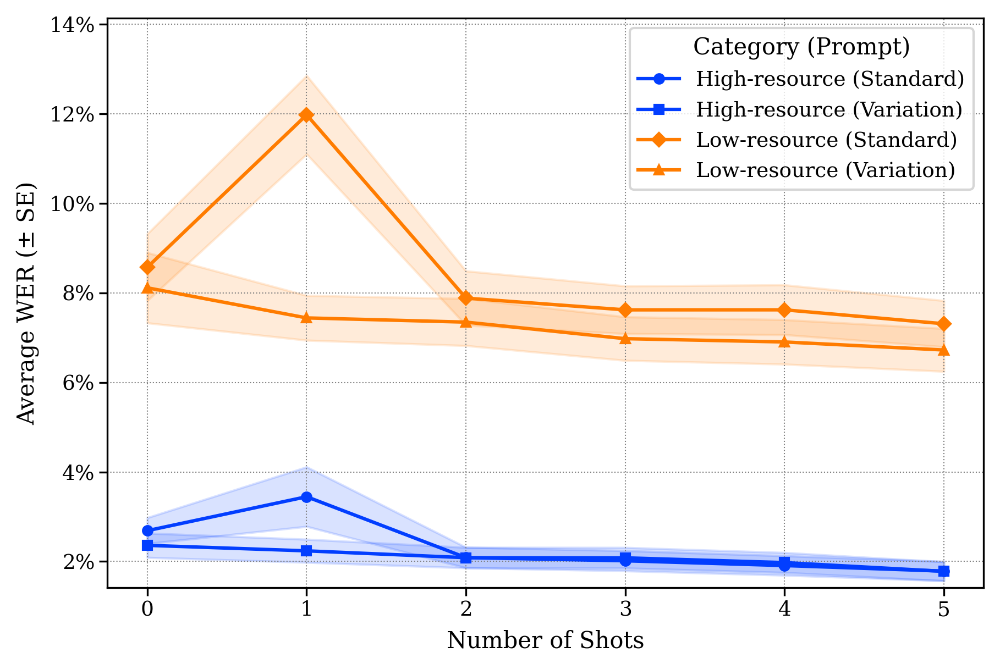

<ipython-input-21-a19f8474240d>:323: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1); norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))


Saved: all_outputs/plot2_iterative_shot_effect.pdf


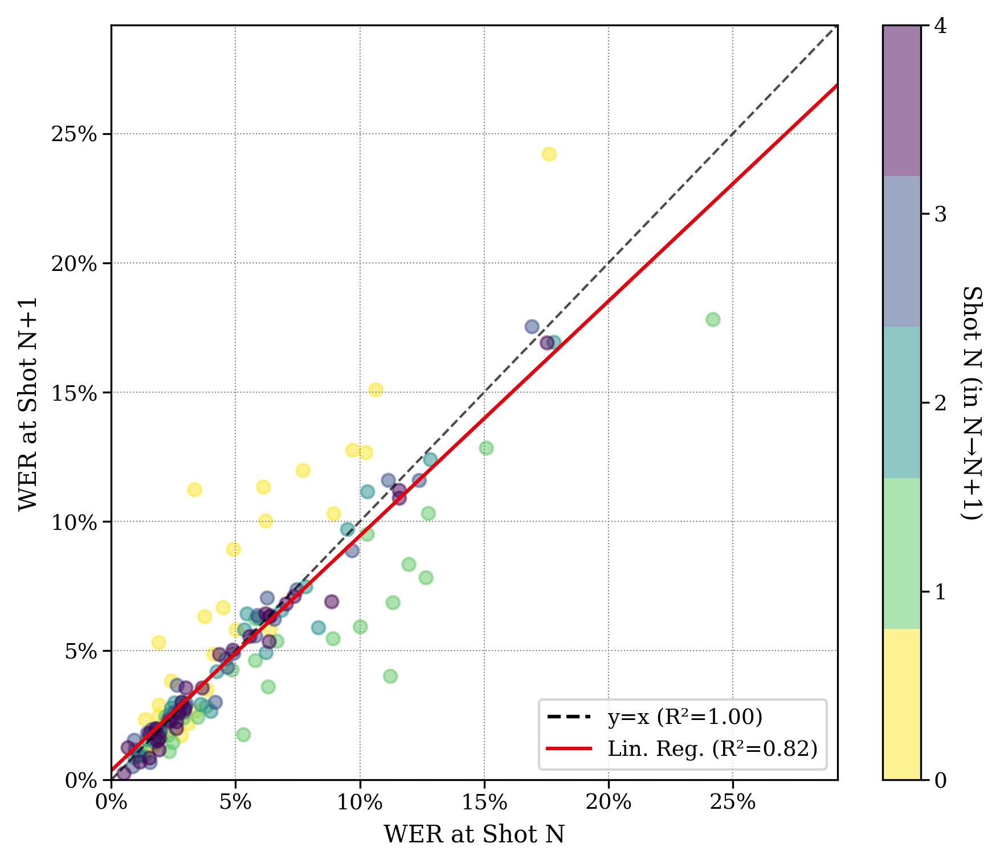

Saved: all_outputs/plot3_avg_wer_by_shot_category.pdf


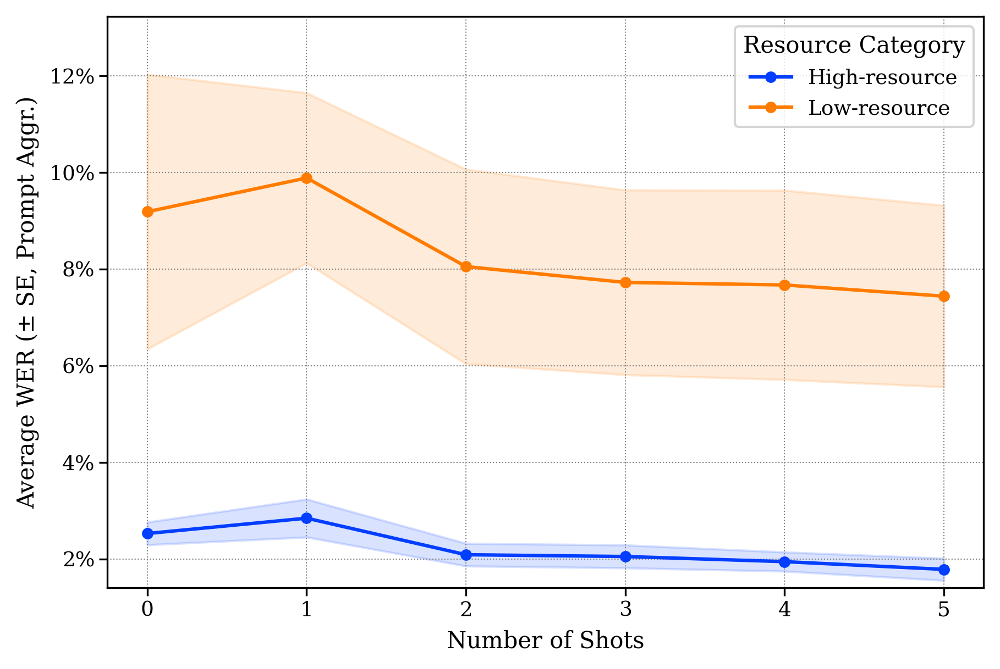

<ipython-input-21-a19f8474240d>:390: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-21-a19f8474240d>:390: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)


Saved: all_outputs/plot4_agg_speaker_var_violin_log.pdf


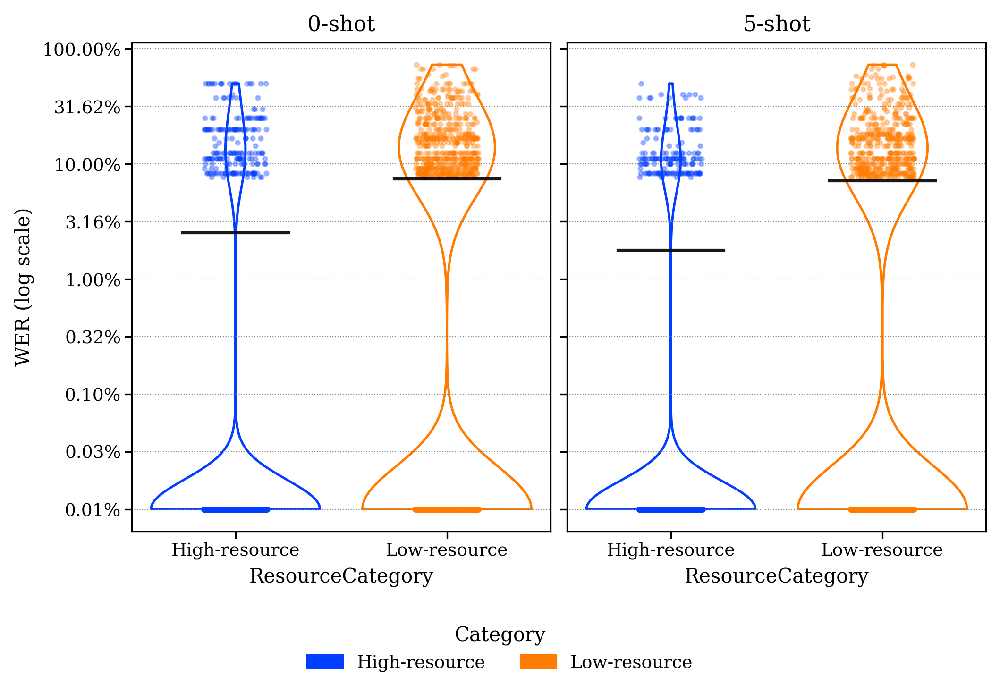

Saved: all_outputs/plot6_corpus_aggregated_shot_bins_02_36_710.pdf


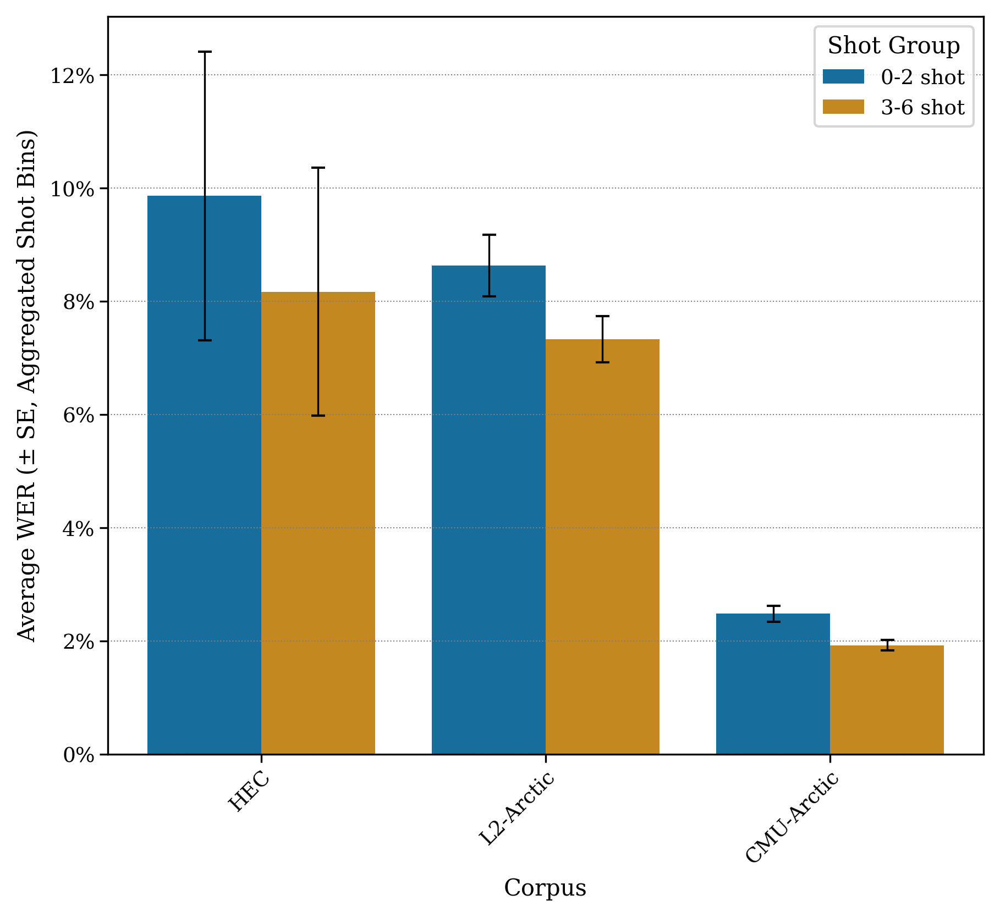

Saved: all_outputs/plot7_shot_grouped_bar_resource.pdf


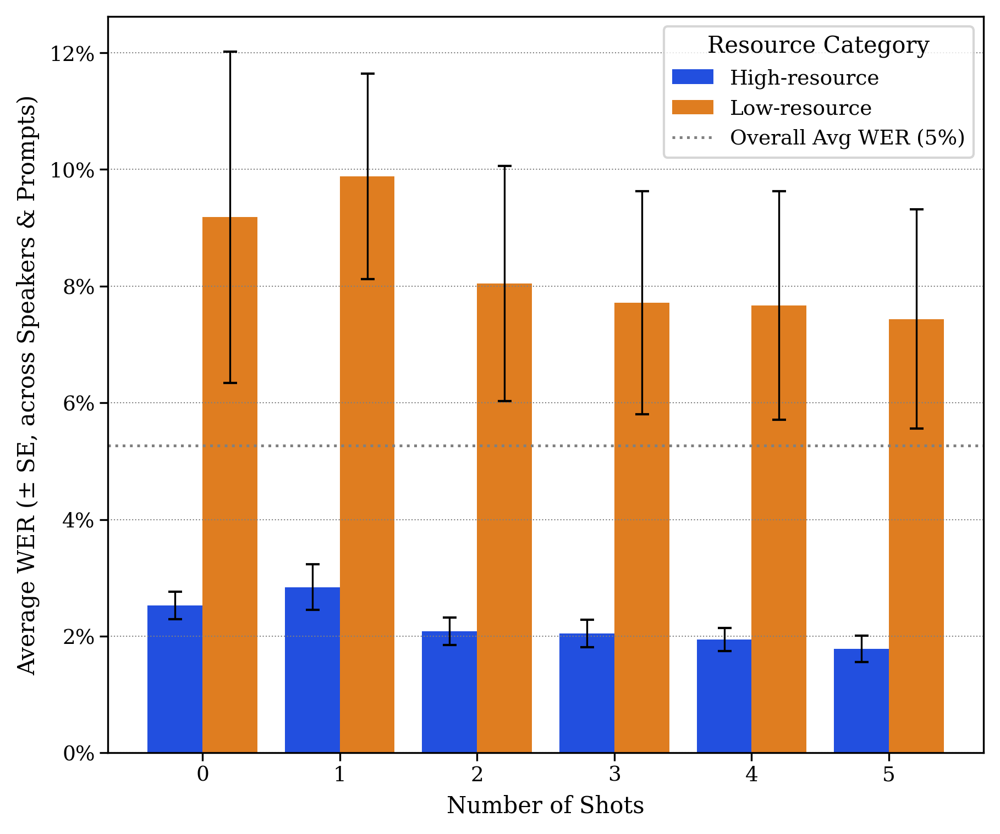

<ipython-input-21-a19f8474240d>:555: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  new_ylabels = [f"{spk} ({corpus.split('-')[0]})" for spk, corpus in zip(df_merged['Speaker'], df_merged['Corpus'])]; ax.set_yticklabels(new_ylabels); ax.tick_params(axis='y', labelsize=max(6, 9 - num_speakers // 20))


Saved: all_outputs/new_plot1_relative_improvement.pdf


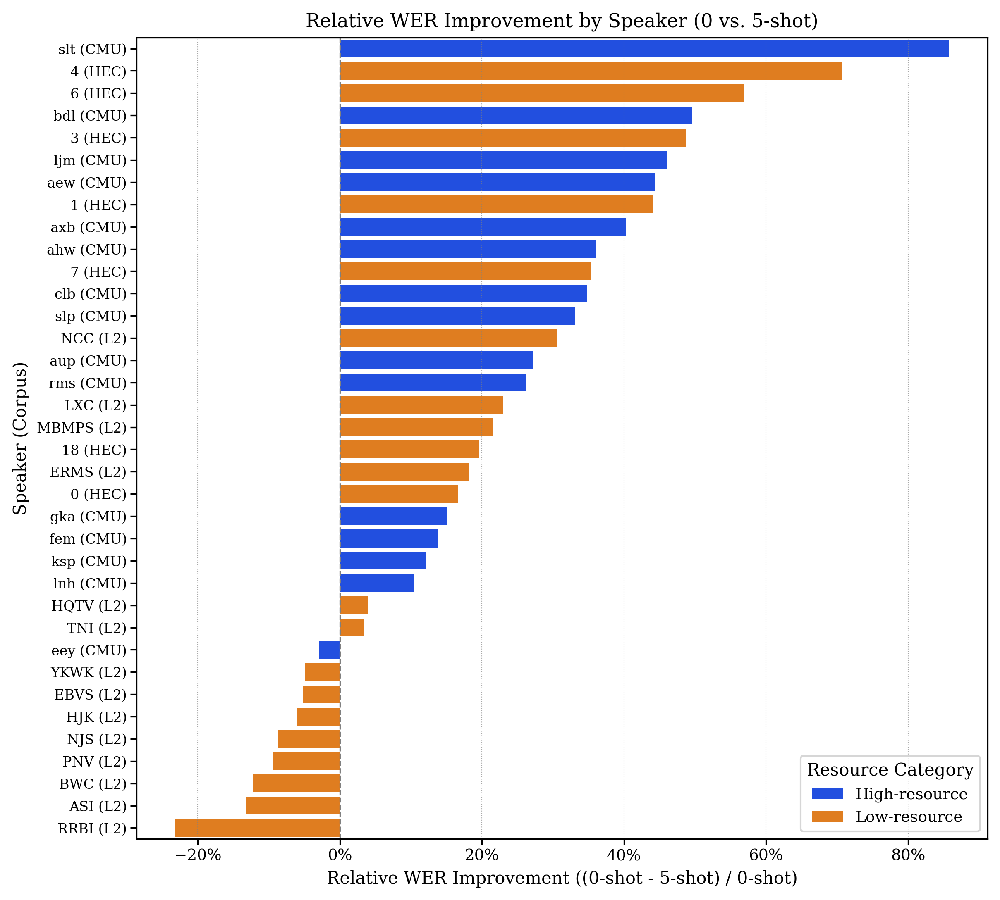

Saved: all_outputs/new_plot2_wer_l1_shotgroup.pdf


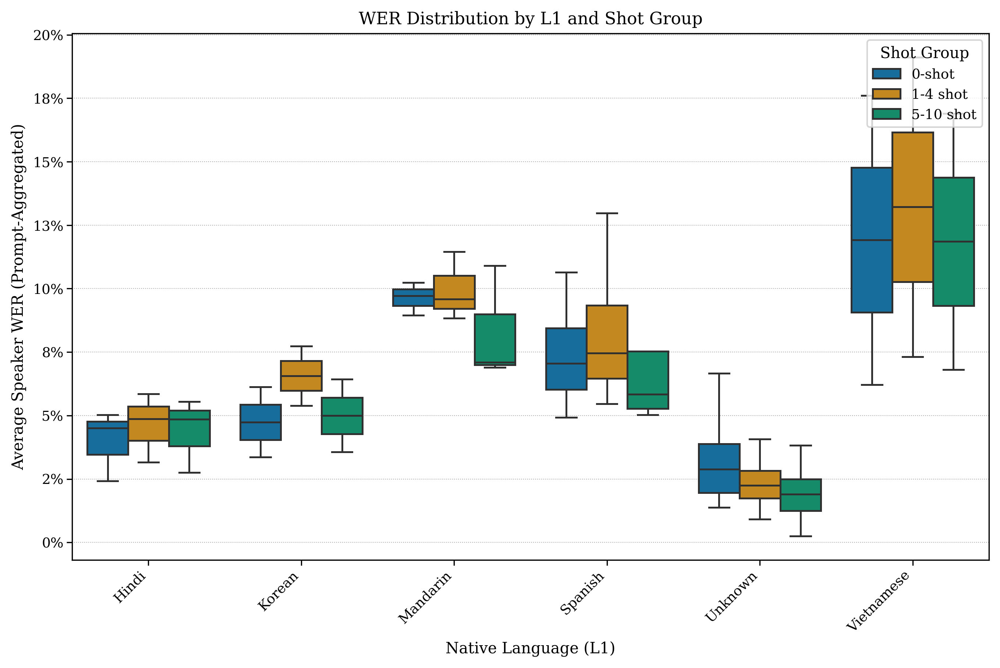

Saved: all_outputs/new_plot3_overall_shot_bins.pdf


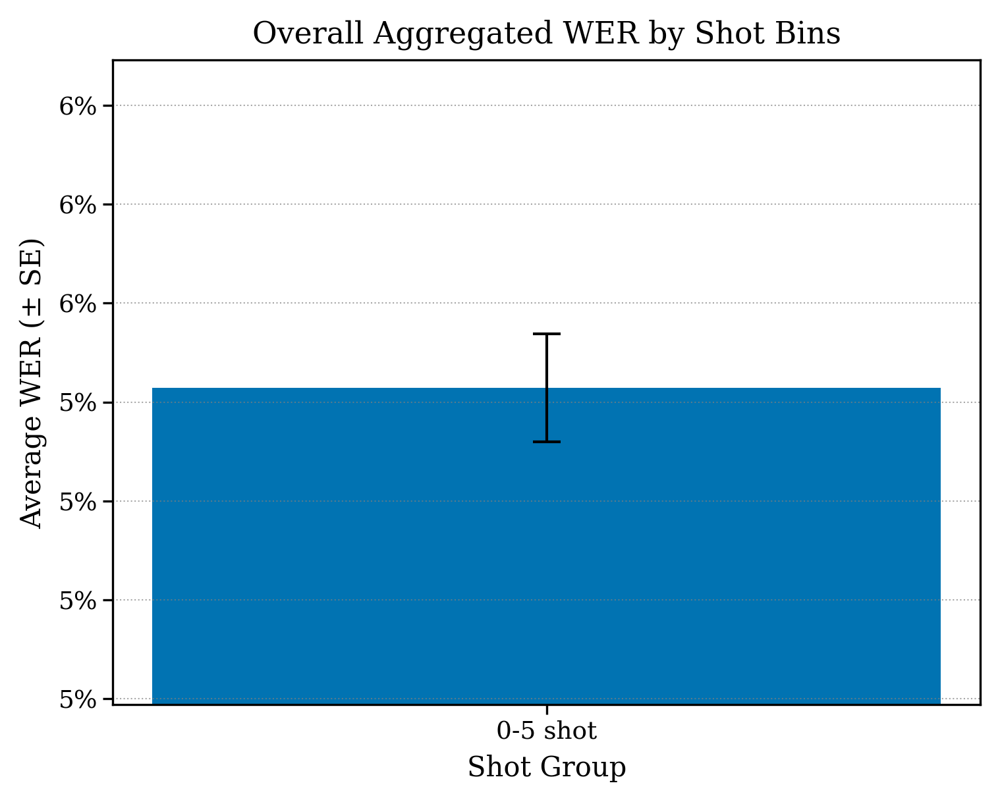

Saved: new_plot3_overall_shot_bins_three.pdf


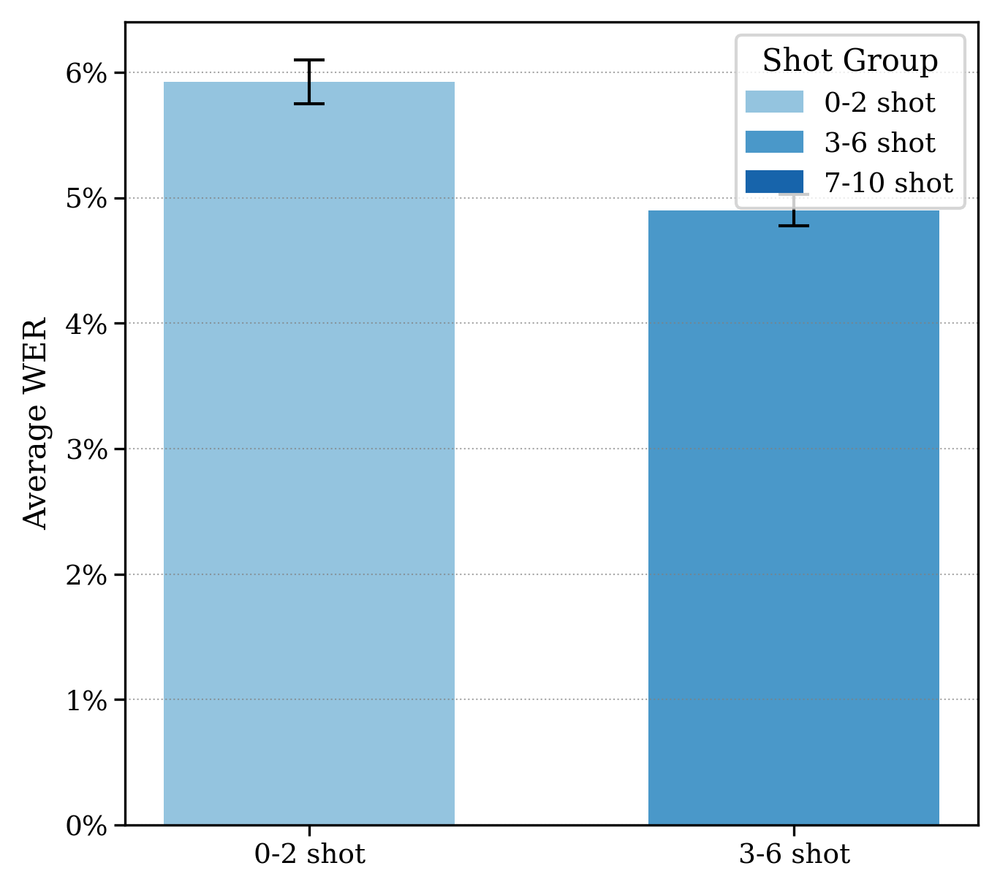

Saved: all_outputs/final_plots/plot6_corpus_bins_combined.pdf


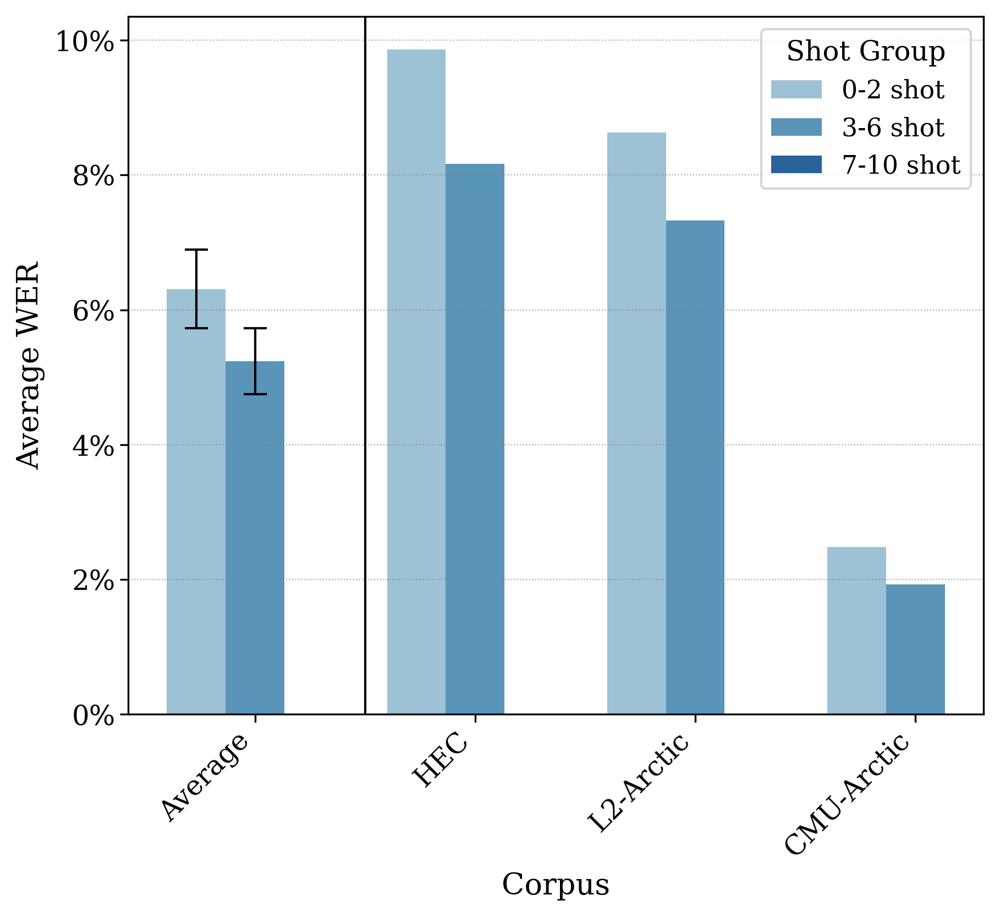

✓ Figures generated.

%% ---------- tab:core_results ----------
\begin{table*}[htbp]
\centering
\caption{Core Results}
\label{tab:core_results}
\begin{tabular}{lccc}
\toprule
Resource Category & 0-shot WER (\%) & 5-shot WER (\%) & 5-shot WER (\%) \\
\midrule
High\textnormal{-}resource & 2.5~($\pm$0.2) & 1.8~($\pm$0.2) & 1.8~($\pm$0.2) \\
Low\textnormal{-}resource & 9.2~($\pm$2.0) & 7.4~($\pm$1.3) & 7.4~($\pm$1.3) \\
\bottomrule
\end{tabular}
\end{table*}


%% ---------- tab:appendix_full ----------
\begin{table*}[htbp]
\centering
\small
\caption{Full speaker results}
\label{tab:appendix_full}
\begin{tabular}{lllrcccccc}
\toprule
Corpus & Speaker & L1 & Resource & 0-sh & 1-sh & 2-sh & 3-sh & 4-sh & 5-sh \\
\midrule
CMU-Arctic & aew & Unknown & High & 1.5 & 1.2 & 1.2 & 0.9 & 1.5 & 0.8 \\
CMU-Arctic & ahw & Unknown & High & 2.8 & 1.7 & 1.8 & 1.8 & 1.5 & 1.8 \\
CMU-Arctic & aup & Unknown & High & 3.1 & 2.2 & 2.4 & 2.3 & 2.3 & 2.3 \\
CMU-Arctic & axb & Unknown & High & 3.8 & 6.3 & 3.6 & 2.9

{'tab:core_results': '\\begin{table*}[htbp]\n\\centering\n\\caption{Core Results}\n\\label{tab:core_results}\n\\begin{tabular}{lccc}\n\\toprule\nResource Category & 0-shot WER (\\%) & 5-shot WER (\\%) & 5-shot WER (\\%) \\\\\n\\midrule\nHigh\\textnormal{-}resource & 2.5~($\\pm$0.2) & 1.8~($\\pm$0.2) & 1.8~($\\pm$0.2) \\\\\nLow\\textnormal{-}resource & 9.2~($\\pm$2.0) & 7.4~($\\pm$1.3) & 7.4~($\\pm$1.3) \\\\\n\\bottomrule\n\\end{tabular}\n\\end{table*}\n',
 'tab:appendix_full': '\\begin{table*}[htbp]\n\\centering\n\\small\n\\caption{Full speaker results}\n\\label{tab:appendix_full}\n\\begin{tabular}{lllrcccccc}\n\\toprule\nCorpus & Speaker & L1 & Resource & 0-sh & 1-sh & 2-sh & 3-sh & 4-sh & 5-sh \\\\\n\\midrule\nCMU-Arctic & aew & Unknown & High & 1.5 & 1.2 & 1.2 & 0.9 & 1.5 & 0.8 \\\\\nCMU-Arctic & ahw & Unknown & High & 2.8 & 1.7 & 1.8 & 1.8 & 1.5 & 1.8 \\\\\nCMU-Arctic & aup & Unknown & High & 3.1 & 2.2 & 2.4 & 2.3 & 2.3 & 2.3 \\\\\nCMU-Arctic & axb & Unknown & High & 3.8 & 6.3 & 3.

In [ ]:
_ = generate_all_code_and_plots("/content/all_results_summary_same.json")

Saved: all_outputs/plot1_scaling_law_category_prompt.pdf


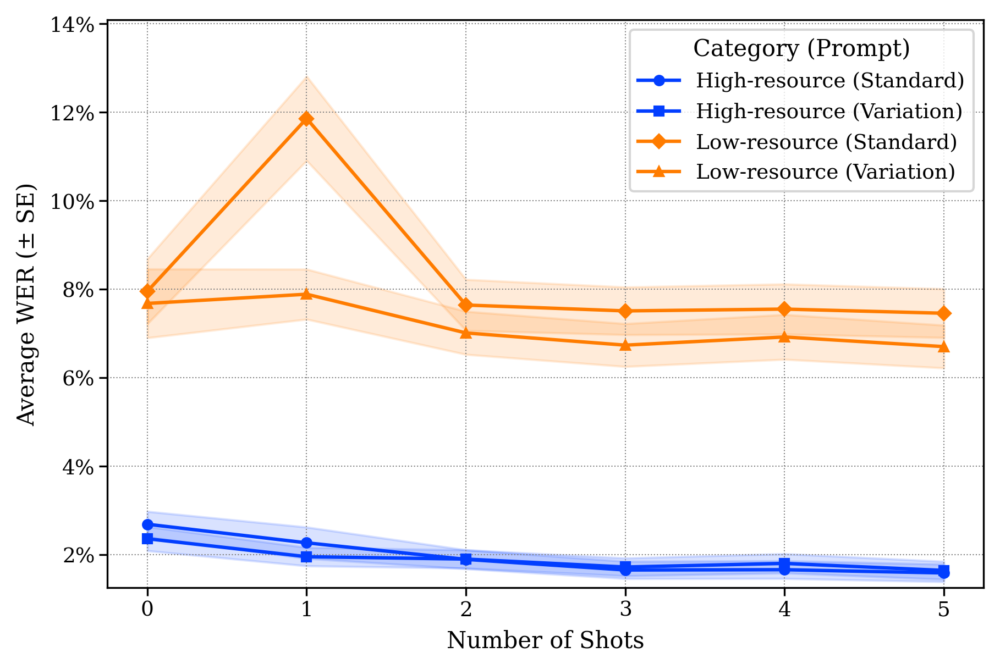

<ipython-input-21-a19f8474240d>:323: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1); norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))


Saved: all_outputs/plot2_iterative_shot_effect.pdf


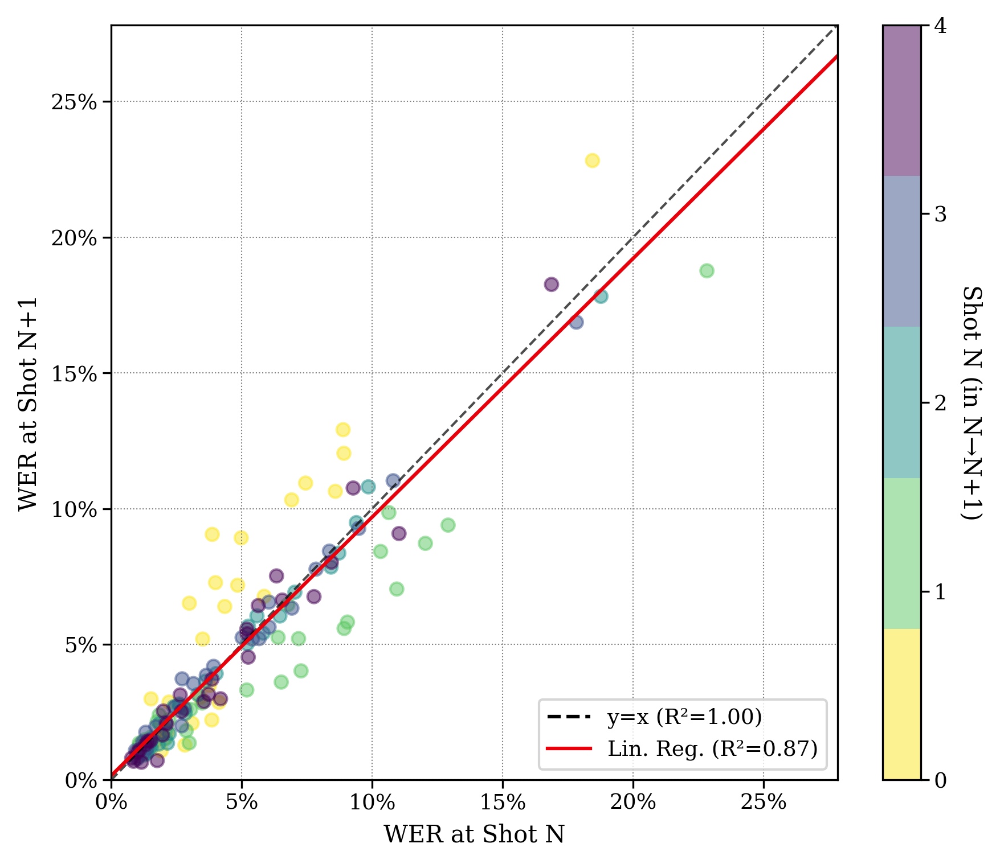

Saved: all_outputs/plot3_avg_wer_by_shot_category.pdf


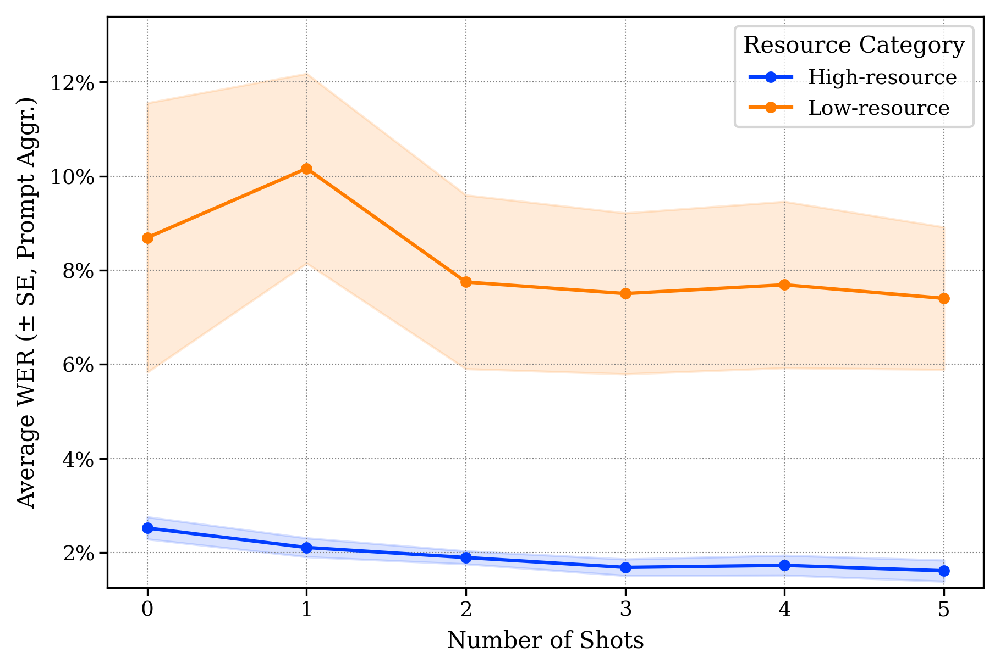

<ipython-input-21-a19f8474240d>:390: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-21-a19f8474240d>:390: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)


Saved: all_outputs/plot4_agg_speaker_var_violin_log.pdf


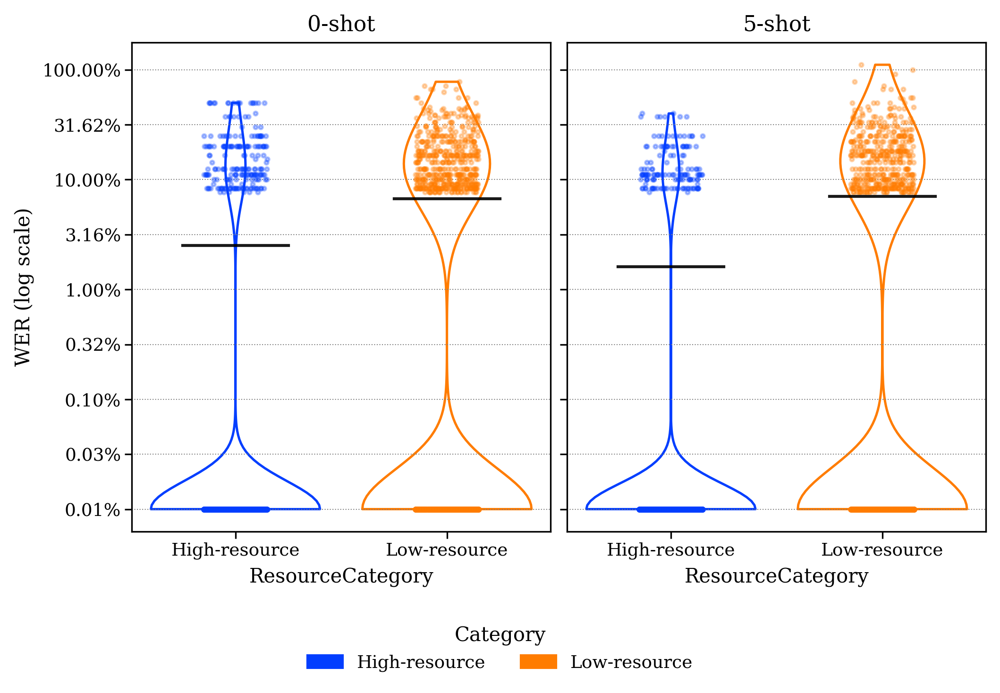

Saved: all_outputs/plot6_corpus_aggregated_shot_bins_02_36_710.pdf


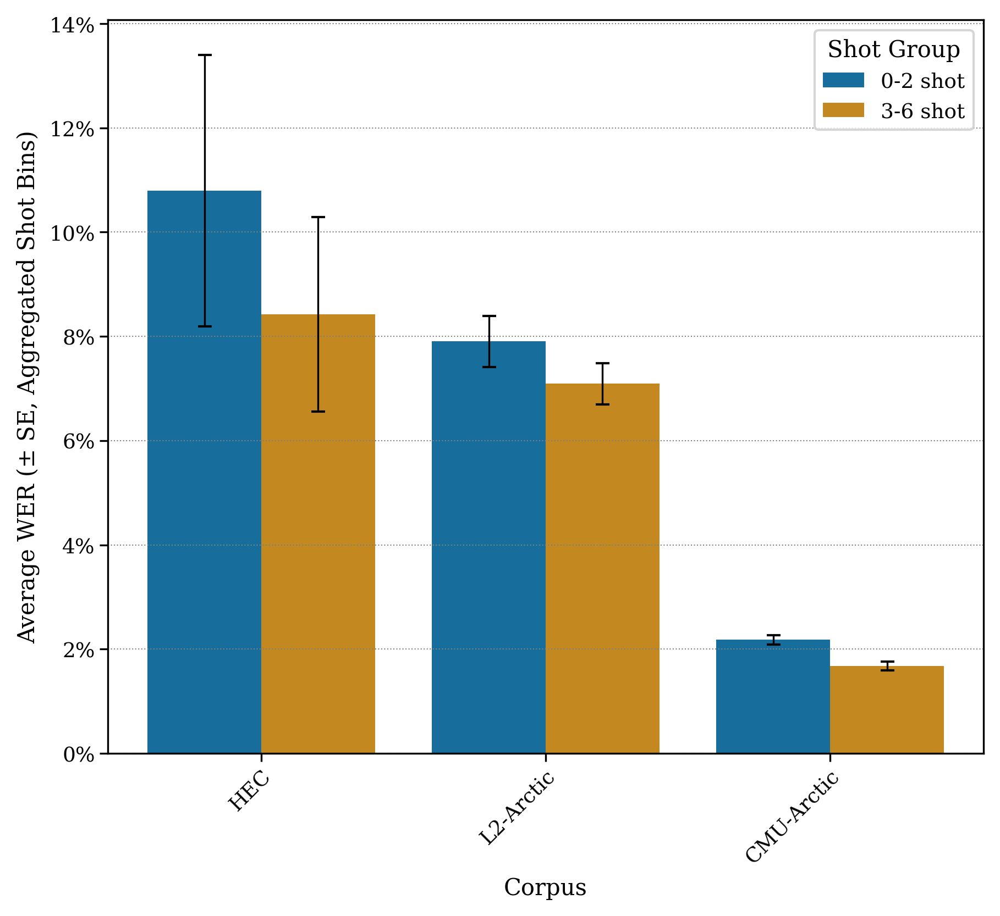

Saved: all_outputs/plot7_shot_grouped_bar_resource.pdf


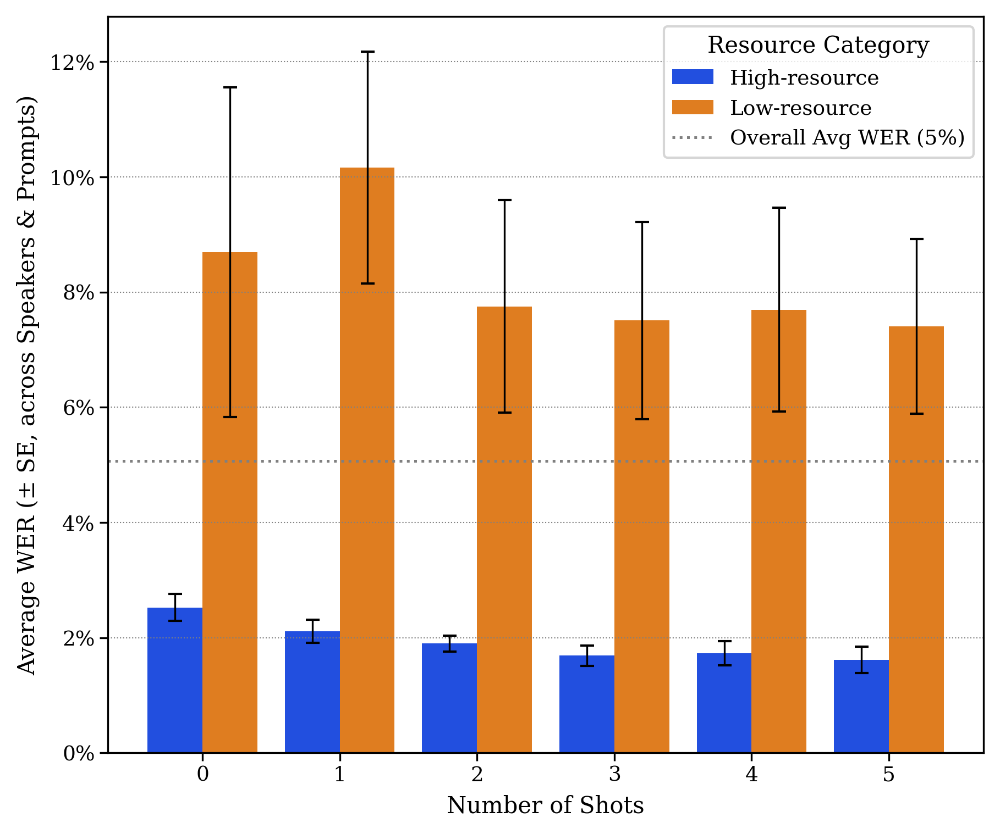

<ipython-input-21-a19f8474240d>:555: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  new_ylabels = [f"{spk} ({corpus.split('-')[0]})" for spk, corpus in zip(df_merged['Speaker'], df_merged['Corpus'])]; ax.set_yticklabels(new_ylabels); ax.tick_params(axis='y', labelsize=max(6, 9 - num_speakers // 20))


Saved: all_outputs/new_plot1_relative_improvement.pdf


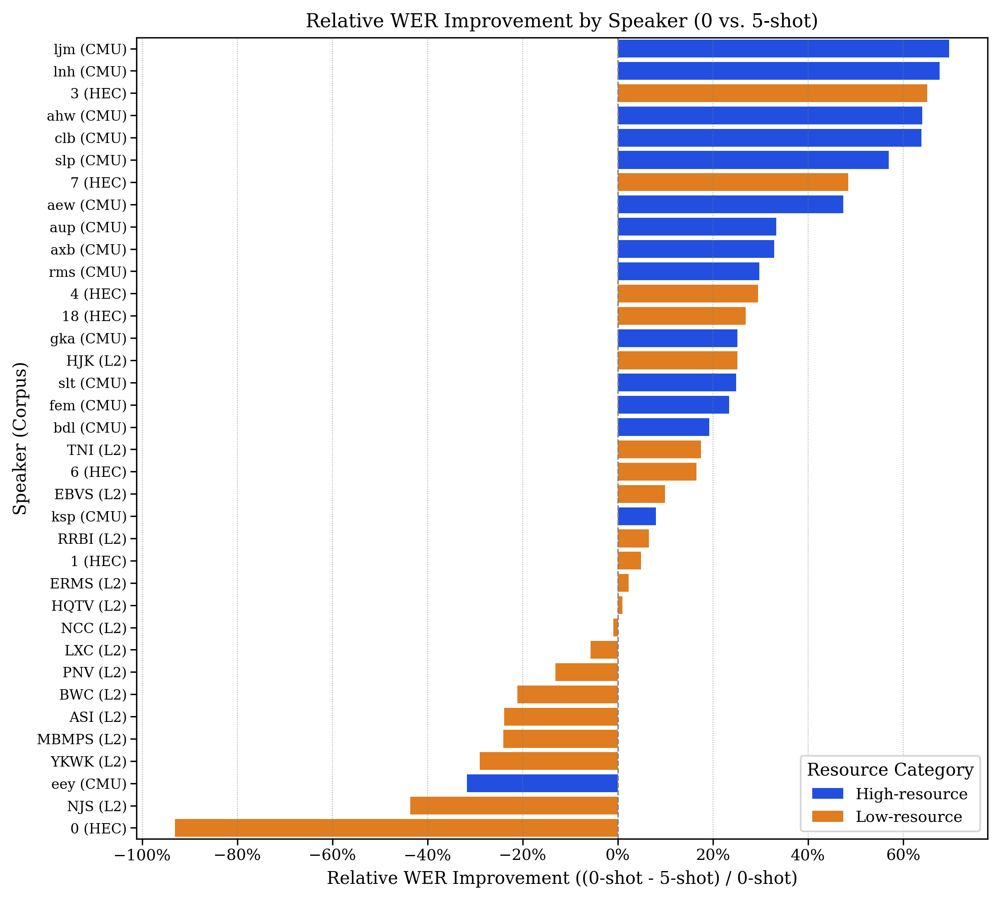

Saved: all_outputs/new_plot2_wer_l1_shotgroup.pdf


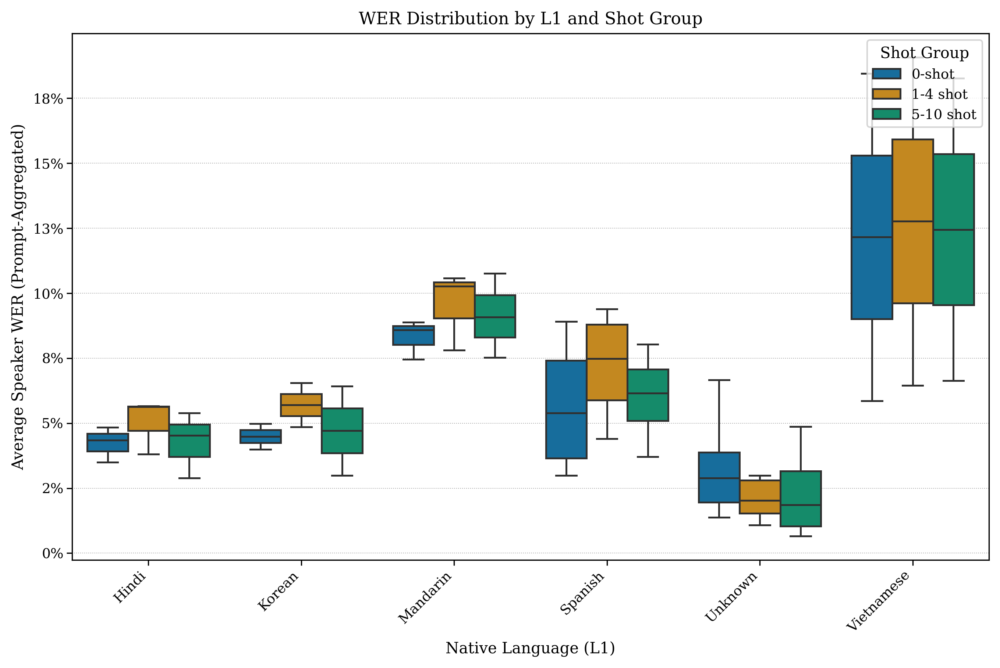

Saved: all_outputs/new_plot3_overall_shot_bins.pdf


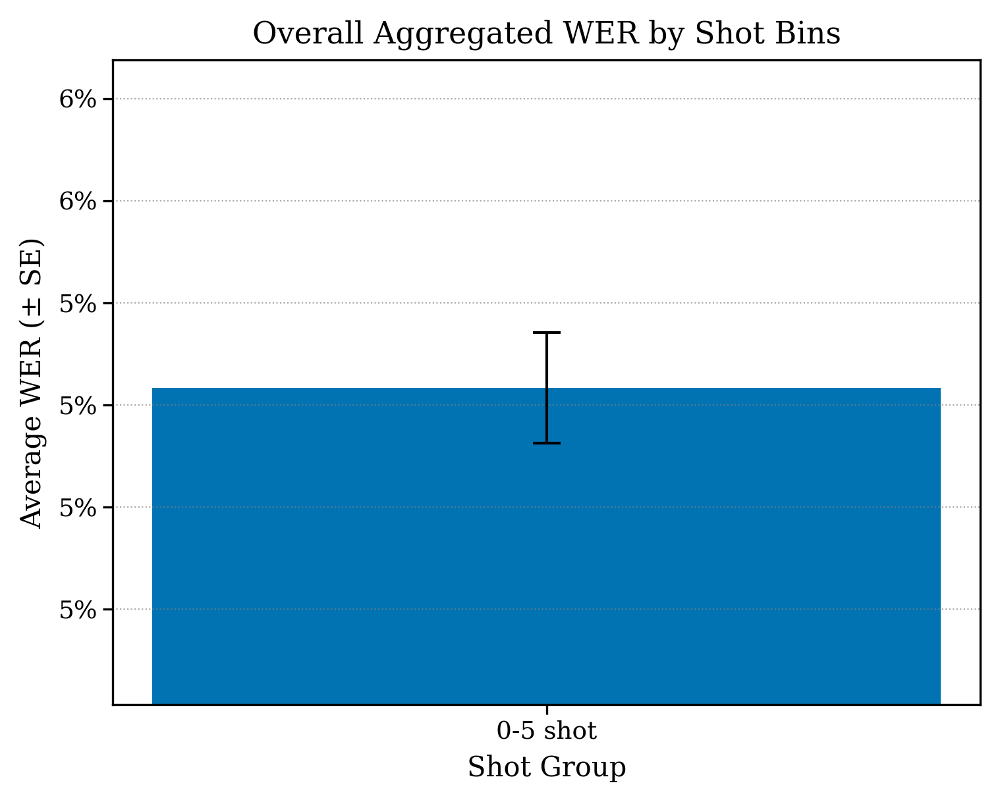

Saved: new_plot3_overall_shot_bins_three.pdf


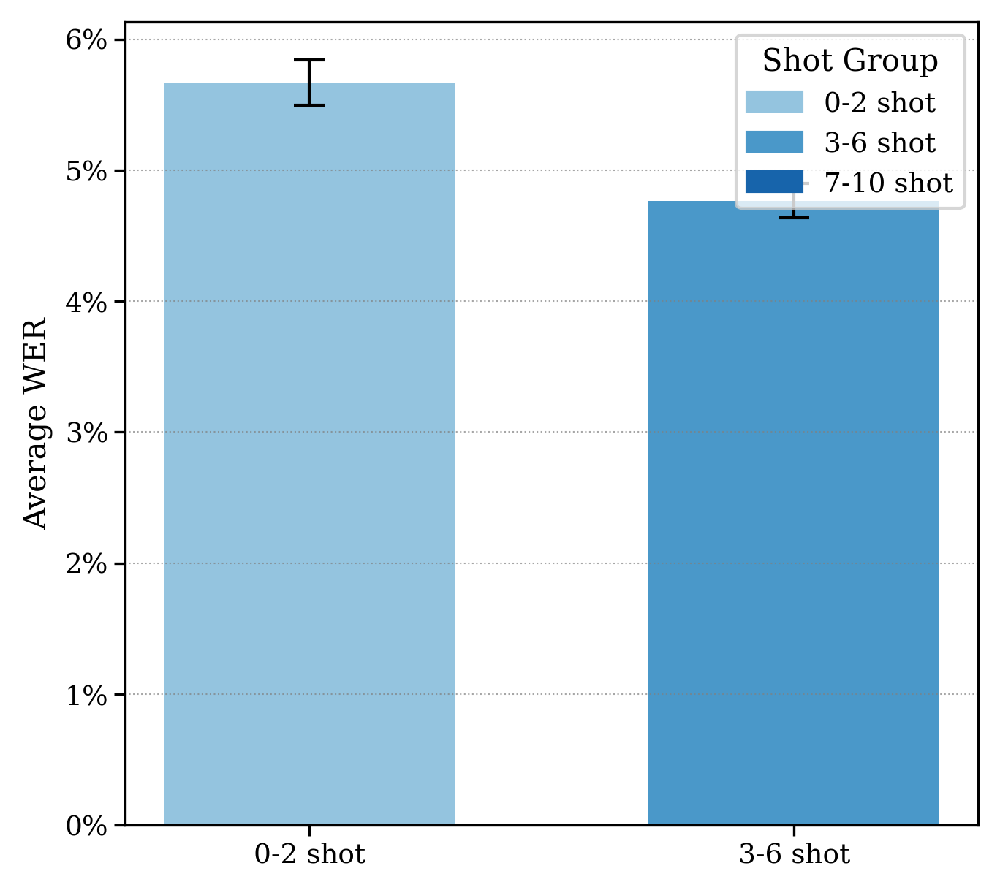

Saved: all_outputs/final_plots/plot6_corpus_bins_combined.pdf


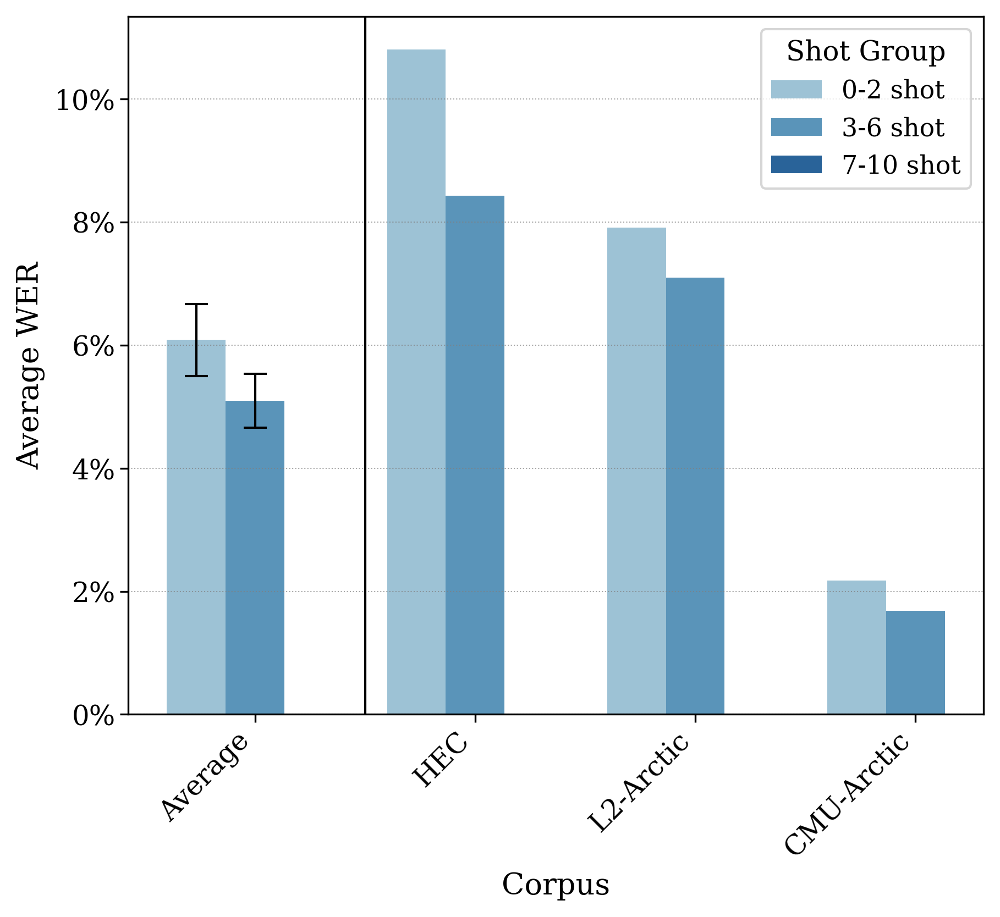

✓ Figures generated.

%% ---------- tab:core_results ----------
\begin{table*}[htbp]
\centering
\caption{Core Results}
\label{tab:core_results}
\begin{tabular}{lccc}
\toprule
Resource Category & 0-shot WER (\%) & 5-shot WER (\%) & 5-shot WER (\%) \\
\midrule
High\textnormal{-}resource & 2.5~($\pm$0.2) & 1.6~($\pm$0.2) & 1.6~($\pm$0.2) \\
Low\textnormal{-}resource & 8.7~($\pm$2.0) & 7.4~($\pm$1.1) & 7.4~($\pm$1.1) \\
\bottomrule
\end{tabular}
\end{table*}


%% ---------- tab:appendix_full ----------
\begin{table*}[htbp]
\centering
\small
\caption{Full speaker results}
\label{tab:appendix_full}
\begin{tabular}{lllrcccccc}
\toprule
Corpus & Speaker & L1 & Resource & 0-sh & 1-sh & 2-sh & 3-sh & 4-sh & 5-sh \\
\midrule
CMU-Arctic & aew & Unknown & High & 1.5 & 3.0 & 1.4 & 1.0 & 0.8 & 0.8 \\
CMU-Arctic & ahw & Unknown & High & 2.8 & 1.3 & 1.5 & 1.2 & 1.0 & 1.0 \\
CMU-Arctic & aup & Unknown & High & 3.1 & 2.1 & 1.9 & 2.1 & 2.1 & 2.1 \\
CMU-Arctic & axb & Unknown & High & 3.8 & 3.5 & 2.8 & 2.5

{'tab:core_results': '\\begin{table*}[htbp]\n\\centering\n\\caption{Core Results}\n\\label{tab:core_results}\n\\begin{tabular}{lccc}\n\\toprule\nResource Category & 0-shot WER (\\%) & 5-shot WER (\\%) & 5-shot WER (\\%) \\\\\n\\midrule\nHigh\\textnormal{-}resource & 2.5~($\\pm$0.2) & 1.6~($\\pm$0.2) & 1.6~($\\pm$0.2) \\\\\nLow\\textnormal{-}resource & 8.7~($\\pm$2.0) & 7.4~($\\pm$1.1) & 7.4~($\\pm$1.1) \\\\\n\\bottomrule\n\\end{tabular}\n\\end{table*}\n',
 'tab:appendix_full': '\\begin{table*}[htbp]\n\\centering\n\\small\n\\caption{Full speaker results}\n\\label{tab:appendix_full}\n\\begin{tabular}{lllrcccccc}\n\\toprule\nCorpus & Speaker & L1 & Resource & 0-sh & 1-sh & 2-sh & 3-sh & 4-sh & 5-sh \\\\\n\\midrule\nCMU-Arctic & aew & Unknown & High & 1.5 & 3.0 & 1.4 & 1.0 & 0.8 & 0.8 \\\\\nCMU-Arctic & ahw & Unknown & High & 2.8 & 1.3 & 1.5 & 1.2 & 1.0 & 1.0 \\\\\nCMU-Arctic & aup & Unknown & High & 3.1 & 2.1 & 1.9 & 2.1 & 2.1 & 2.1 \\\\\nCMU-Arctic & axb & Unknown & High & 3.8 & 3.5 & 2.

In [ ]:
_ = generate_all_code_and_plots("/content/all_results_summary_diff.json")

In [ ]:
def plot_same_vs_diff_speaker_comparison(
    same_json_path: str,
    diff_json_path: str,
    *,
    output_filename: str = "same_vs_diff_speaker_comparison.pdf",
    show: bool = True,
    speaker_meta: dict = SPEAKER_METADATA,
    resource_map: dict = RESOURCE_MAPPING,
) -> None:
    """
    Compare 2-shot and 5-shot performance for same speaker vs different speaker conditions.

    Creates a grouped bar chart with:
    - 2-shot comparison (same vs diff speakers)
    - 5-shot comparison (same vs diff speakers)
    - Error bars showing standard error
    - Normalization against 0-shot baseline (ΔWER)

    Only includes speakers that appear in both same and different speaker datasets
    to ensure fair comparison.

    Parameters
    ----------
    same_json_path : str
        Path to JSON file with same speaker results
    diff_json_path : str
        Path to JSON file with different speaker results
    output_filename : str
        Name of output PDF file
    show : bool
        Whether to display the plot
    """

    # Set EMNLP best practices rcParams
    plt.rcParams.update({
        'font.family':       'serif',
        'font.serif':        ['Times New Roman', 'DejaVu Serif'],
        'font.size':         10,
        'axes.titlesize':    11,
        'axes.labelsize':    10,
        'xtick.labelsize':   9,
        'ytick.labelsize':   9,
        'legend.fontsize':   9,
        'figure.dpi':        300,
        'savefig.dpi':       300,
        'savefig.format':    'pdf',
        'savefig.bbox':      'tight',
        'axes.edgecolor':    'black',
        'axes.linewidth':    0.8,
        'grid.color':        'grey',
        'grid.linestyle':    ':',
        'grid.linewidth':    0.5,
    })

    # Load both JSON files
    print("Loading same speaker results...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    same_results = load_results(same_json_path)

    print("Loading different speaker results...")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_speaker, df_same_trials = extract_full_data_with_trials(
        same_results, speaker_meta, resource_map
    )

    print("Extracting different speaker data...")
    df_diff_speaker, df_diff_trials = extract_full_data_with_trials(
        diff_results, speaker_meta, resource_map
    )

    # Find intersection of speakers
    same_speakers = set(df_same_trials['Speaker'].unique())
    diff_speakers = set(df_diff_trials['Speaker'].unique())
    common_speakers = same_speakers.intersection(diff_speakers)

    print(f"Same speaker dataset: {len(same_speakers)} speakers")
    print(f"Different speaker dataset: {len(diff_speakers)} speakers")
    print(f"Common speakers: {len(common_speakers)} speakers")
    print(f"Common speakers list: {sorted(common_speakers)}")

    if not common_speakers:
        raise ValueError("No common speakers found between same and different speaker datasets!")

    # Filter both datasets to only include common speakers
    df_same_trials_filtered = df_same_trials[df_same_trials['Speaker'].isin(common_speakers)].copy()
    df_diff_trials_filtered = df_diff_trials[df_diff_trials['Speaker'].isin(common_speakers)].copy()

    # Filter for 0-shot, 2-shot, and 5-shot data (0-shot needed for normalization)
    shots_for_calculation = [0, 2, 5]
    shots_to_display = [2, 5]  # Only show 2-shot and 5-shot on plot

    # Filter and prepare same speaker data
    df_same_filtered = df_same_trials_filtered[df_same_trials_filtered['Shot'].isin(shots_for_calculation)].copy()
    df_same_filtered['Condition'] = 'Same Speaker'

    # Filter and prepare different speaker data
    df_diff_filtered = df_diff_trials_filtered[df_diff_trials_filtered['Shot'].isin(shots_for_calculation)].copy()
    df_diff_filtered['Condition'] = 'Different Speaker'

    # Combine both datasets
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)

    if df_combined.empty:
        print(f"{output_filename}: No data found for 0-shot, 2-shot, and 5-shot comparison.")
        return

    # Print data counts for verification
    print("\nData counts after filtering to common speakers:")
    count_summary = df_combined.groupby(['Condition', 'Shot']).agg({
        'WER_Trial': 'count',
        'Speaker': 'nunique'
    }).round(2)
    print(count_summary)

    print("Computing statistics...")
    # Aggregate by condition and shot (averaging over trials, speakers, and prompt types)
    agg_data = (
        df_combined.groupby(['Condition', 'Shot'])['WER_Trial']
                   .agg(list_of_wers=list)
                   .reset_index()
    )

    # Calculate mean, SE, and count for each group
    stats_calc = agg_data['list_of_wers'].apply(
        lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials'])
    )
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)

    # Normalize every Shot relative to its 0-shot baseline
    zero_baseline = (
        agg_stats[agg_stats['Shot'] == 0]
          .set_index('Condition')[['mean_wer','se_wer']]
          .rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    )
    agg_stats = (
        agg_stats
          .merge(zero_baseline, left_on='Condition', right_index=True)
          .assign(
            mean_wer_norm = lambda df: df['mean_wer']  - df['mean_0'],
            se_wer_norm   = lambda df: np.sqrt(df['se_wer']**2 + df['se_0']**2)
          )
    )

    # Print detailed statistics
    print("\nDetailed statistics:")
    for _, row in agg_stats.iterrows():
        if row['Shot'] in shots_to_display:  # Only print displayed shots
            print(f"{row['Condition']} {row['Shot']}-shot: "
                  f"Mean WER = {row['mean_wer']:.1%} ± {row['se_wer']:.1%} "
                  f"(ΔWER = {row['mean_wer_norm']:.1%} ± {row['se_wer_norm']:.1%}) "
                  f"(n = {row['n_trials']} trials)")

    # Pivot for easier plotting using normalized values
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]
    mean_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='mean_wer_norm')
    se_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='se_wer_norm')

    # Create the plot
    print("Creating plot...")
    fig, ax = plt.subplots(figsize=(10, 7))

    # Set up plotting parameters
    shots = shots_to_display
    n_shots = len(shots)
    conditions = ['Same Speaker', 'Different Speaker']
    n_conds = len(conditions)
    bar_width = 0.35

    # Positions for the bars
    x_positions = np.arange(n_shots)

    # Pick a colorblind palette
    import seaborn as sns
    palette = sns.color_palette("colorblind", n_colors=n_conds)

    # Plot the bars
    for j, cond in enumerate(conditions):
        means = [mean_pivot.loc[shot, cond] for shot in shots]
        ses = [se_pivot.loc[shot, cond] for shot in shots]

        ax.bar(
            x_positions + (j - 0.5) * bar_width,
            means, bar_width,
            yerr=ses, capsize=3,
            label=cond,
            color=palette[j],
            edgecolor='black',
            linewidth=0.8,
        )

    # Set x-axis labels and ticks
    x_labels = [f"{s}-shot" for s in shots]
    ax.set_xticks(x_positions)
    ax.set_xticklabels(x_labels, fontsize=9)

    # Customization
    ax.set_xlabel('Shot Condition', fontsize=10)
    ax.set_ylabel('ΔWER vs. 0-shot (± SE)', fontsize=10)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, decimals=2))
    ax.legend(title='Speaker Condition', loc='upper right', frameon=False)
    ax.grid(True, axis='y')
    plt.tight_layout(pad=0.2)

    # Statistical significance tests
    from scipy.stats import ttest_ind

    print("\n=== Statistical Tests ===")

    # Test for each shot condition
    for shot in shots_to_display:
        same_data = df_same_filtered[df_same_filtered['Shot'] == shot]['WER_Trial'].dropna()
        diff_data = df_diff_filtered[df_diff_filtered['Shot'] == shot]['WER_Trial'].dropna()

        if len(same_data) > 0 and len(diff_data) > 0:
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            significance = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
            print(f"{shot}-shot same vs different: t={t_stat:.3f}, p={p_val:.4f} {significance}")

            if significance:
                # Add significance annotation
                shot_idx = shots_to_display.index(shot)
                y_max_shot = max(mean_pivot.loc[shot, 'Same Speaker'] + se_pivot.loc[shot, 'Same Speaker'],
                               mean_pivot.loc[shot, 'Different Speaker'] + se_pivot.loc[shot, 'Different Speaker'])
                ax.plot([x_positions[shot_idx] - bar_width/2, x_positions[shot_idx] + bar_width/2],
                       [y_max_shot + 0.005, y_max_shot + 0.005], 'k-', linewidth=1)
                ax.text(x_positions[shot_idx], y_max_shot + 0.01, significance, ha='center', va='bottom', fontsize=10)

    # Print summary statistics
    print("\n=== Summary Statistics (ΔWER vs 0-shot) ===")
    for shot in shots_to_display:
        if shot in mean_pivot.index:
            for cond in conditions:
                if cond in mean_pivot.columns:
                    mean_val = mean_pivot.loc[shot, cond]
                    se_val = se_pivot.loc[shot, cond]
                    print(f"  {shot}-shot {cond}: ΔWER = {mean_val:.2%} ± {se_val:.2%}")

    # Calculate improvement percentages relative to 0-shot
    print("\n=== Improvement from 0-shot ===")
    orig_agg = agg_stats.pivot_table(index='Shot', columns='Condition', values='mean_wer')
    for cond in conditions:
        print(f"\n{cond}:")
        for shot in shots_to_display:
            if shot in orig_agg.index and cond in orig_agg.columns:
                zero_wer = orig_agg.loc[0, cond] if 0 in orig_agg.index else None
                shot_wer = orig_agg.loc[shot, cond]
                if zero_wer is not None and not pd.isna(zero_wer) and not pd.isna(shot_wer) and zero_wer > 0:
                    improvement = (zero_wer - shot_wer) / zero_wer * 100
                    print(f"  {shot}-shot: {improvement:.1f}% improvement")

    # Calculate difference between conditions at each shot level
    print("\n=== Condition Differences (Different - Same) ===")
    for shot in shots_to_display:
        if shot in mean_pivot.index:
            same_wer = mean_pivot.loc[shot, 'Same Speaker']
            diff_wer = mean_pivot.loc[shot, 'Different Speaker']
            if not pd.isna(same_wer) and not pd.isna(diff_wer):
                diff_value = diff_wer - same_wer
                print(f"  {shot}-shot: ΔWER difference = {diff_value:.2%}")

    # Save the plot
    if OUTPUT_DIR:
        save_path = os.path.join(OUTPUT_DIR, output_filename)
        try:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (OUTPUT_DIR is None).")

    # Show or close
    if show:
        plt.show()
    else:
        plt.close(fig)

Loading same speaker results...
Loading different speaker results...
Extracting same speaker data...
Extracting different speaker data...
Same speaker dataset: 36 speakers
Different speaker dataset: 36 speakers
Common speakers: 36 speakers
Common speakers list: ['1_ASI', '1_RRBI', '1_TNI', '2_HJK', '2_YKWK', '3_BWC', '3_LXC', '3_NCC', '4_EBVS', '4_ERMS', '4_MBMPS', '4_NJS', '5_HQTV', '5_PNV', 'Argentina_1', 'Argentina_18', 'Argentina_3', 'Argentina_4', 'Argentina_6', 'German English_ahw', 'German English_fem', 'Indian English_aup', 'Indian English_axb', 'Indian English_gka', 'Indian English_ksp', 'Indian English_slp', 'None_0', 'None_7', 'US English_aew', 'US English_bdl', 'US English_clb', 'US English_eey', 'US English_ljm', 'US English_lnh', 'US English_rms', 'US English_slt']

Data counts after filtering to common speakers:
                        WER_Trial  Speaker
Condition         Shot                    
Different Speaker 0          3458       36
                  2          331

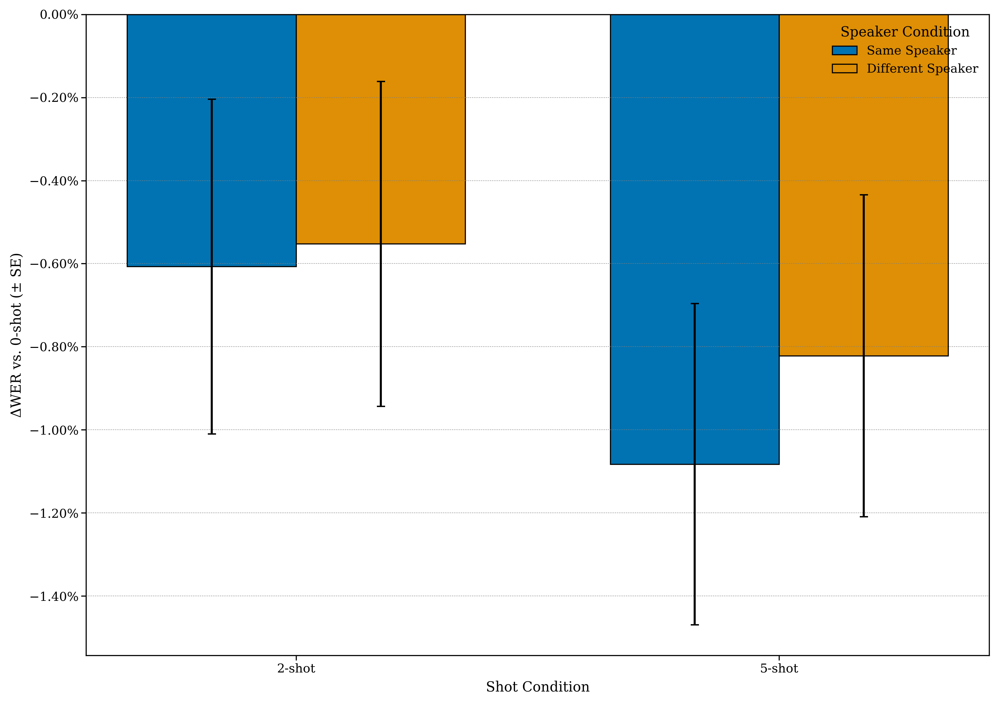

In [ ]:
# Make sure OUTPUT_DIR is set
global OUTPUT_DIR
OUTPUT_DIR = "same_vs_diff_analysis"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Plot the comparison
plot_same_vs_diff_speaker_comparison(
    "/content/all_results_summary_same.json",
    "/content/all_results_summary_diff.json"
)

In [ ]:
create_latex_table_same_vs_diff_speaker(
    "/content/all_results_summary_same.json",
    "/content/all_results_summary_diff.json"
)

Loading same speaker results...
Loading different speaker results...
Extracting same speaker data...
Extracting different speaker data...
Same speaker dataset: 36 speakers
Different speaker dataset: 36 speakers
Common speakers: 36 speakers
Computing statistics...
Computing statistical significance...
Creating LaTeX table...

=== LaTeX Table Summary ===
Table values (ΔWER vs 0-shot):

1-shot:
  Same Speaker: 0.91% ± 0.46%
  Different Speaker: 0.98% ± 0.46%
  Significance: t=0.472, p=0.6371 

2-shot:
  Same Speaker: -0.61% ± 0.40%
  Different Speaker: -0.55% ± 0.39%
  Significance: t=0.730, p=0.4657 

3-shot:
  Same Speaker: -0.80% ± 0.39%
  Different Speaker: -0.76% ± 0.39%
  Significance: t=0.821, p=0.4119 

4-shot:
  Same Speaker: -0.87% ± 0.39%
  Different Speaker: -0.68% ± 0.39%
  Significance: t=0.326, p=0.7443 

5-shot:
  Same Speaker: -1.08% ± 0.39%
  Different Speaker: -0.82% ± 0.39%
  Significance: t=0.116, p=0.9073 

Saved LaTeX table: same_vs_diff_analysis/same_vs_diff_speake

'\\begin{table*}[ht]\n\\centering\n\\small\n\\begin{tabular}{lcc}\n\\toprule\nShot & Same Speaker & Different Speaker \\\\\n\\midrule\n1-shot & 0.91% & 0.98% \\\\\n2-shot & -0.61% & -0.55% \\\\\n3-shot & -0.80% & -0.76% \\\\\n4-shot & -0.87% & -0.68% \\\\\n5-shot & -1.08% & -0.82% \\\\\n\\bottomrule\n\\end{tabular}\n\\caption{\nComparison of same speaker vs. different speaker few-shot performance. \nValues show $\\Delta$WER vs. 0-shot baseline ± standard error. \nStatistical significance of differences between conditions indicated by \n$^*$\\,$p < 0.05$, $^{**}$\\,$p < 0.01$, $^{***}$\\,$p < 0.001$.\n}\n\\label{tab:same_vs_diff_speaker}\n\\end{table*}'

In [ ]:
import json
import os
import itertools
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.ticker import PercentFormatter, MaxNLocator, LogFormatterSciNotation, ScalarFormatter, FuncFormatter
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import ttest_ind

# --- Configuration & Styling (ACL/EMNLP Best Practices) ---
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'serif'],
    'font.sans-serif': ['DejaVu Sans', 'sans-serif'],
    'font.size': 10,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 0.8,
    'grid.color': 'grey',
    'grid.linestyle': ':',
    'grid.linewidth': 0.5,
    'xtick.major.pad': 2,
    'ytick.major.pad': 2,
    'figure.autolayout': False
})

colors = sns.color_palette("colorblind", 10)
bright_colors = sns.color_palette("bright", 10)
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'H']

# --- Speaker and Resource Metadata ---
SPEAKER_METADATA = {
    'ABA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'SKA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'YBAA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ZHAA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'BWC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'LXC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'NCC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TXHC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'ASI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'RRBI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'SVBI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TNI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HJK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'HKK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'YDCK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'YKWK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'EBVS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ERMS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'MBMPS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'NJS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HQTV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'PNV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'THV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TLV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'bdl': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slt': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'jmk': {'l1': 'Canadian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'awb': {'l1': 'Scottish English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'rms': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'clb': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'ksp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aew': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ahw': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aup': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'axb': {'l1': 'Indian English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'eey': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'fem': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'gka': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ljm': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'lnh': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'rxr': {'l1': 'Israeli English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
}

RESOURCE_MAPPING = {
    'l2-arctic': {'name': 'L2-Arctic', 'category': 'Low-resource'},
    'hisp-eng': {'name': 'HEC', 'category': 'Low-resource'},
    'saa': {'name': 'SAA', 'category': 'Low-resource'},
    'sandi': {'name': 'SANDI', 'category': 'Low-resource'},
    'cmu-arctic': {'name': 'CMU-Arctic', 'category': 'High-resource'},
}

RESOURCE_CATEGORY_PALETTE = {
    'High-resource': bright_colors[0],
    'Low-resource': bright_colors[1],
    'Unknown': 'grey'
}

HISP_ENG_ORIGINS = {
    '0': None, '1': 'Argentina', '2': 'Mexico', '3': 'Argentina', '4': 'Argentina',
    '5': 'Argentina', '6': 'Argentina', '7': None, '8': None, '9': None, '10': None,
    '11': None, '12': None, '13': None, '14': None, '15': None, '16': None, '17': None,
    '18': 'Argentina', '19': 'Chile'
}

CMU_ARCTIC_VARIETIES = {
    'aew': 'US English', 'ahw': 'German English', 'aup': 'Indian English',
    'axb': 'Indian English', 'eey': 'US English', 'fem': 'German English',
    'gka': 'Indian English', 'ljm': 'US English', 'lnh': 'US English',
    'rxr': 'Israeli English', 'slp': 'Indian English'
}

LANGUAGE_FAMILIES = {
    'afrikaans': 'Germanic', 'agni': 'Niger-Congo', 'albanian': 'Indo-European (Albanian)',
    'amharic': 'Afro-Asiatic (Cushitic)', 'arabic': 'Afro-Asiatic (Semitic)',
    'armenian': 'Indo-European (Armenian)', 'azerbaijani': 'Turkic', 'bafang': 'Niger-Congo',
    'baga': 'Niger-Congo', 'bai': 'Sino-Tibetan', 'bambara': 'Niger-Congo',
    'bamun': 'Niger-Congo', 'basque': 'Language Isolate', 'bengali': 'Indo-European (Indo-Aryan)',
    'bosnian': 'Indo-European (Slavic)', 'bulgarian': 'Indo-European (Slavic)',
    'cantonese': 'Sino-Tibetan', 'carolinian': 'Austronesian', 'catalan': 'Indo-European (Romance)',
    'chamorro': 'Austronesian', 'czech': 'Indo-European (Slavic)', 'danish': 'Germanic',
    'dari': 'Indo-European (Iranian)', 'dutch': 'Germanic', 'ebira': 'Niger-Congo',
    'edo': 'Niger-Congo', 'english': 'Germanic'
}

# --- Utility and Data Extraction Functions ---
def load_results(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

def split_composite_speaker(s):
    """
    Accepts '3_BWC' → returns ('3', 'BWC').
    If no underscore, returns (None, s).
    """
    if isinstance(s, str) and '_' in s:
        code, speaker = s.split('_', 1)
        return code, speaker
    return None, s

def calculate_mean_se(wer_values):
    """
    Calculates mean, standard error (SE), and count (n) for a list of WER values.
    Filters out NaN and negative values.
    Returns (mean, se, n). SE is 0.0 if n <= 1 or if all values are identical.
    """
    if not isinstance(wer_values, (list, np.ndarray, pd.Series)):
        if isinstance(wer_values, (int, float)) and pd.notna(wer_values) and wer_values >= 0:
            return wer_values, 0.0, 1
        return np.nan, np.nan, 0

    if isinstance(wer_values, pd.Series):
        wer_values = wer_values.tolist()
    elif isinstance(wer_values, np.ndarray):
        wer_values = wer_values.tolist()
    if not wer_values:
        return np.nan, np.nan, 0

    valid_wers = [w for w in wer_values if pd.notna(w) and w >= 0]
    n = len(valid_wers)

    if n == 0:
        return np.nan, np.nan, 0
    elif n == 1:
        return valid_wers[0], 0.0, 1
    else:
        mean = np.mean(valid_wers)
        se = stats.sem(valid_wers, ddof=1, nan_policy='omit')
        if pd.isna(se) or np.isclose(se, 0):
            se = 0.0
        return mean, se, n

def extract_full_data_with_trials(results_data, speaker_metadata_map, resource_map):
    trial_records = []
    speaker_shot_records = []

    for dataset_key, ds_content in results_data.items():
        if dataset_key not in resource_map:
            continue

        ds_meta = resource_map[dataset_key]
        for prompt_type, prompt_content in ds_content.items():
            for shot_tag, shot_block in prompt_content.items():
                if not shot_tag.startswith("shot"):
                    continue
                shot = int(shot_tag[4:])

                if "speakers" not in shot_block:
                    continue

                # Handle composite speaker IDs
                for raw_key, spk_json in shot_block["speakers"].items():
                    var_code, spk_code = split_composite_speaker(raw_key)

                    # lookup now uses the cleaned code
                    meta = speaker_metadata_map.get(spk_code.upper(), {})
                    l1     = meta.get("l1", "Unknown")
                    gender = meta.get("gender", "Unknown")

                    wer_vals = spk_json.get(f"{shot_tag}_wer_values", [])
                    mean, se, n = calculate_mean_se(wer_vals)

                    # Speaker-level row
                    speaker_shot_records.append({
                        "DatasetKey":      dataset_key,
                        "Corpus":          ds_meta["name"],
                        "ResourceCategory":ds_meta["category"],
                        "Speaker":         spk_code,     # cleaned code
                        "VarietyID":       var_code,     # may be None
                        "L1":              l1,
                        "Gender":          gender,
                        "PromptType":      prompt_type,
                        "Shot":            shot,
                        "WER_Speaker_Mean":mean,
                        "WER_Speaker_SE":  se,
                        "Num_Trials_Speaker": n,
                    })

                    # Trial-level rows
                    for w in wer_vals:
                        if pd.notna(w) and w >= 0:
                            trial_records.append({
                                "DatasetKey": dataset_key,
                                "Corpus":     ds_meta["name"],
                                "ResourceCategory": ds_meta["category"],
                                "Speaker":    spk_code,     # cleaned code
                                "VarietyID":  var_code,     # may be None
                                "L1":         l1,
                                "Gender":     gender,
                                "PromptType": prompt_type,
                                "Shot":       shot,
                                "WER_Trial":  w,
                            })

    df_speaker_shot = pd.DataFrame(speaker_shot_records)
    df_trials = pd.DataFrame(trial_records)
    for df in [df_speaker_shot, df_trials]:
        if not df.empty:
            numeric_cols = ['WER_Speaker_Mean', 'WER_Speaker_SE', 'Num_Trials_Speaker', 'WER_Trial', 'Shot']
            for col in numeric_cols:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
    return df_speaker_shot, df_trials

def add_variety_column(df, cmu_varieties_map, hisp_origins_map, lang_families_map):
    df_out = df.copy()
    df_out['Variety'] = df_out['L1']

    for index, row in df_out.iterrows():
        corpus_key = row['DatasetKey']
        speaker_lc = str(row['Speaker']).lower()
        l1_lc = str(row['L1']).lower()

        if corpus_key == 'cmu-arctic':
            if speaker_lc in cmu_varieties_map:
                df_out.loc[index, 'Variety'] = cmu_varieties_map[speaker_lc]
        elif corpus_key == 'l2-arctic':
            # Use VarietyID for L2-Arctic
            num_code = str(row.get('VarietyID', ''))
            df_out.loc[index, 'Variety'] = {
                '1': 'Hindi',
                '2': 'Korean',
                '3': 'Mandarin',
                '4': 'Spanish',
                '5': 'Vietnamese',
            }.get(num_code, "Unknown")
        elif corpus_key == 'hisp-eng':
            origin = hisp_origins_map.get(speaker_lc)
            if origin is not None:
                df_out.loc[index, 'Variety'] = origin
        elif corpus_key == 'saa':
            family = lang_families_map.get(l1_lc)
            if family:
                df_out.loc[index, 'Variety'] = family
    return df_out

# --- LaTeX Table Generation Functions ---
def format_wer_se_latex(mean, se, precision=1):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if isinstance(se, pd.Series):
        se = se.iloc[0] if not se.empty else np.nan

    if pd.isna(mean) or mean is None:
        return "-"
    mean_pct = mean * 100
    if pd.isna(se) or se is None or abs(se * 100) < (0.1**(precision + 1)):
        return f"{mean_pct:.{precision}f}"
    se_pct = abs(se * 100)
    return f"{mean_pct:.{precision}f}~($\\pm${se_pct:.{precision}f})"

def format_wer_latex(mean, precision=1):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean):
        return "-"
    return f"{mean * 100:.{precision}f}"

def format_wer_latex_simple(mean, precision=1, as_percentage=True):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean) or mean is None:
        return "-"
    value = mean * 100 if as_percentage else mean
    return f"{value:.{precision}f}"

# --- Table Generation Functions ---
def generate_table1_core_results(df_speaker_shot_data, shots_to_report, caption, label):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 1}\n"
    df_agg = df_speaker_shot_data[df_speaker_shot_data['Shot'].isin(shots_to_report)].groupby(['ResourceCategory', 'Shot'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_agg = pd.concat([df_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_agg.pivot_table(index='ResourceCategory', columns='Shot', values=['mean_wer', 'se_wer'])
    expected_metrics = ['mean_wer', 'se_wer'];
    shots_to_report_int = [int(s) for s in shots_to_report]
    expected_cols_tuples = pd.MultiIndex.from_product([expected_metrics, shots_to_report_int], names=['metric', 'Shot'])
    if not df_pivot.empty:
        df_pivot.columns = pd.MultiIndex.from_tuples([(col[0], int(col[1])) for col in df_pivot.columns], names=['metric', 'Shot'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples)
    else:
        known_categories = pd.Index(df_speaker_shot_data['ResourceCategory'].unique(), name='ResourceCategory')
        df_pivot = pd.DataFrame(columns=expected_cols_tuples, index=known_categories)
    latex_str = "\\begin{table*}[htbp]\n\\centering\n"
    latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shots_to_report_int);
    col_format = "l" + "c" * num_shot_cols
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header = "Resource Category & " + " & ".join([f"{s}-shot WER (\%)" for s in shots_to_report_int]) + " \\\\\n\\midrule\n";
    latex_str += header
    categories = ['High-resource', 'Low-resource']
    for cat in categories:
        cat_latex = cat.replace('-', '\\textnormal{-}')
        if cat in df_pivot.index:
            row_data = [cat_latex]
            for shot in shots_to_report_int:
                # Extract scalar values safely
                if ('mean_wer', shot) in df_pivot.columns:
                    mean_val = df_pivot.loc[cat, ('mean_wer', shot)]
                    mean_val = mean_val.iloc[0] if isinstance(mean_val, pd.Series) else mean_val
                else:
                    mean_val = np.nan

                if ('se_wer', shot) in df_pivot.columns:
                    se_val = df_pivot.loc[cat, ('se_wer', shot)]
                    se_val = se_val.iloc[0] if isinstance(se_val, pd.Series) else se_val
                else:
                    se_val = np.nan

                row_data.append(format_wer_se_latex(mean_val, se_val))
            latex_str += " & ".join(row_data) + " \\\\\n"
        else:
            latex_str += f"{cat_latex} & " + " & ".join(["-"] * num_shot_cols) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_table2_appendix_full(df_speaker_shot_data, max_shot_to_display, caption, label):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 2}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'DatasetKey', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_pivot = df_prompt_agg[df_prompt_agg['Shot'] <= max_shot_to_display].pivot_table(index=['Corpus', 'Speaker', 'L1', 'ResourceCategory'], columns='Shot', values='WER_Speaker_Mean').reset_index()
    df_pivot = df_pivot.sort_values(['Corpus', 'Speaker'])
    shot_columns = sorted([s for s in df_pivot.columns if isinstance(s, int) and s <= max_shot_to_display])
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns);
    col_format = "lllr" + "c" * num_shot_cols;
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-sh" for s in shot_columns]);
    header = "Corpus & Speaker & L1 & Resource & " + header_shots + " \\\\\n\\midrule\n";
    latex_str += header
    for _, row in df_pivot.iterrows():
        l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A';
        res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A';
        res_cat_fmt = res_cat_str.replace('-resource','').title()
        row_data = [row['Corpus'], row['Speaker'], l1_str, res_cat_fmt]
        for shot in shot_columns:
            row_data.append(format_wer_latex(row.get(shot, np.nan)))
        latex_str += " & ".join(map(str, row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_table3_best_worst_speakers(df_speaker_shot_data, n_shot_compare, num_speakers_each=5, caption="Best and Worst Performing Speakers", label="tab:best_worst_speakers"):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 3}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_0_shot = df_prompt_agg[df_prompt_agg['Shot'] == 0].rename(columns={'WER_Speaker_Mean': 'WER_0_shot'});
    df_n_shot = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_compare].rename(columns={'WER_Speaker_Mean': f'WER_{n_shot_compare}_shot'})
    if df_0_shot.empty or df_n_shot.empty:
        return f"\\textit{{Missing shot data for Table 3 (0-shot or {n_shot_compare}-shot).}}\n"
    df_merged = pd.merge(df_0_shot[['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'WER_0_shot']], df_n_shot[['Speaker', f'WER_{n_shot_compare}_shot']], on='Speaker', how='inner')
    if df_merged.empty:
        return f"\\textit{{No speakers with both 0-shot and {n_shot_compare}-shot data for Table 3.}}\n"
    df_merged['Delta_WER'] = df_merged['WER_0_shot'] - df_merged[f'WER_{n_shot_compare}_shot']
    sections = {
        f"Top {num_speakers_each} by 0-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, 'WER_0_shot'),
        f"Bottom {num_speakers_each} by 0-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, 'WER_0_shot'),
        f"Top {num_speakers_each} by {n_shot_compare}-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Bottom {num_speakers_each} by {n_shot_compare}-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Top {num_speakers_each} by Delta WER (Largest Improvement)": df_merged.nlargest(num_speakers_each, 'Delta_WER'),
    }
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption} (0-shot vs. {n_shot_compare}-shot WERs as percentages).}}\n\\label{{{label}}}\n"
    latex_str += "\\begin{tabular}{lllccccc}\n\\toprule\n";
    latex_str += "Category & Corpus & Speaker & L1 & Resource & 0-shot & N-shot & Delta \\\\\n\\midrule\n"
    first_section = True
    for title, df_section in sections.items():
        if not first_section:
            latex_str += "\\midrule\n";
        first_section = False
        latex_str += f"\\multicolumn{{8}}{{l}}{{\\textit{{{title}}}}} \\\\\n"
        if df_section.empty:
            latex_str += "\\multicolumn{8}{l}{\\textit{No data for this section}} \\\\\n";
            continue
        for _, row in df_section.iterrows():
            l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A';
            res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A';
            res_cat_fmt = res_cat_str.replace('-resource','').title()
            row_data = ["", row['Corpus'], row['Speaker'], l1_str, res_cat_fmt, format_wer_latex(row['WER_0_shot']), format_wer_latex(row[f'WER_{n_shot_compare}_shot']), format_wer_latex(row['Delta_WER'])]
            latex_str += " & ".join(map(str,row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_table4_l1_shot_groups(df_speaker_shot_data, max_shot_overall, caption, label):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 4}\n"
    df_copy = df_speaker_shot_data.copy()
    upper_bound_group2 = min(10, max_shot_overall)
    def assign_shot_group_table(shot):
        if 0 <= shot <= 4:
            return "0-4 shot"
        if 5 <= shot <= upper_bound_group2 and upper_bound_group2 >= 5:
            return f"5-10 shot"
        return None
    df_copy['ShotGroup'] = df_copy['Shot'].apply(assign_shot_group_table)
    df_copy = df_copy[df_copy['Shot'] <= max_shot_overall]
    df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean', 'L1'])
    if df_copy.empty:
        return "\\textit{No data after shot grouping for Table 4}\n"

    df_l1_agg = df_copy.groupby(['L1', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    num_speakers_per_l1 = df_copy.groupby('L1')['Speaker'].nunique().reset_index().rename(columns={'Speaker': 'num_speakers_unique'})
    stats_calc = df_l1_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_l1_agg = pd.concat([df_l1_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_l1_agg.pivot_table(index='L1', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    potential_shot_groups = ["0-4 shot"]
    if upper_bound_group2 >= 5:
        potential_shot_groups.append("5-10 shot")
    shot_group_cols_present = [sg for sg in potential_shot_groups if sg in df_l1_agg['ShotGroup'].unique()]
    expected_metrics = ['mean_wer', 'se_wer']

    # Ensure df_pivot has the expected structure, handling empty cases
    if not df_pivot.empty and shot_group_cols_present:
        expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples_l1) # Reindex columns to ensure all expected are present
        df_pivot = df_pivot.reindex(index=sorted(df_pivot.index)) # Sort index L1
    else: # Handle cases where pivot might be empty or no shot groups exist
        unique_l1s = pd.Index(df_copy['L1'].unique(), name='L1').sort_values()
        if shot_group_cols_present:
            expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
            df_pivot = pd.DataFrame(columns=expected_cols_tuples_l1, index=unique_l1s)
        else: # No shot groups, create empty df with just index
            df_pivot = pd.DataFrame(index=unique_l1s)

    # Attach speaker counts without triggering a MultiIndex merge
    df_pivot_reset = df_pivot.reset_index()                          # L1 is now a column

    # Remove duplicate columns if they exist
    df_pivot_reset = df_pivot_reset.loc[:, ~df_pivot_reset.columns.duplicated()]

    speaker_count_map = (
        num_speakers_per_l1
            .set_index('L1')['num_speakers_unique']                  # Series: L1 → count
            .to_dict()
    )

    # Safely map speaker counts
    if 'L1' in df_pivot_reset.columns:
        df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
    else:
        # If L1 is not in columns, it might be in the index
        df_pivot_reset = df_pivot_reset.reset_index()
        if 'L1' in df_pivot_reset.columns:
            df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
        else:
            # Fallback: add zeros for speaker counts
            df_pivot_reset['num_speakers_unique'] = 0

    df_merged_pivot = df_pivot_reset                                # keep the name used later

    latex_str = "\\begin{table}[htbp]\n\\centering\n";
    latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    header_groups_display_names = shot_group_cols_present
    col_format = "lc" + "c" * len(header_groups_display_names);
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_text_groups = " & ".join([f"WER {sg} (\%)" for sg in header_groups_display_names])
    latex_str += "L1 & Num. Spk. & " + header_text_groups + " \\\\\n\\midrule\n"

    # Iterate over the merged DataFrame
    for _, row in df_merged_pivot.iterrows():
        # L1: make sure it's scalar and a string
        l1_val = row['L1']
        if isinstance(l1_val, pd.Series):
            l1_val = l1_val.iloc[0]
        l1 = str(l1_val)
        # Robust speaker-count extraction
        num_spk_val = row.get('num_speakers_unique', np.nan)
        if isinstance(num_spk_val, pd.Series):
            num_spk_val = num_spk_val.iloc[0]
        num_spk_str = str(int(num_spk_val)) if pd.notna(num_spk_val) else "-"
        row_data = [l1, num_spk_str]
        for sg in header_groups_display_names:
             # Access columns using the tuple format for MultiIndex columns
            mean_val = row.get(('mean_wer', sg), np.nan)
            se_val = row.get(('se_wer', sg), np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table}\n";
    return latex_str

def generate_table_corpus_variety_shot_wers(df_speaker_shot_augmented, max_shot_to_display, caption, label):
    if df_speaker_shot_augmented.empty:
        return "\\textit{No data available for Corpus/Variety WER table.}\n"
    df_corpus_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Shot'])['WER_Speaker_Mean'].mean().reset_index();
    df_corpus_pivot = df_corpus_agg.pivot_table(index='Corpus', columns='Shot', values='WER_Speaker_Mean')
    df_variety_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Variety', 'Shot'])['WER_Speaker_Mean'].mean().reset_index();
    df_variety_pivot = df_variety_agg.pivot_table(index=['Corpus', 'Variety'], columns='Shot', values='WER_Speaker_Mean')
    shots_in_corpus_pivot = set(df_corpus_pivot.columns) if not df_corpus_pivot.empty else set();
    shots_in_variety_pivot = set(df_variety_pivot.columns) if not df_variety_pivot.empty else set()
    all_present_shots = sorted([s for s in shots_in_corpus_pivot.union(shots_in_variety_pivot) if isinstance(s, (int, float))])
    shot_columns = [s for s in all_present_shots if s <= max_shot_to_display]
    if not shot_columns:
        if 0 <= max_shot_to_display and (0 in shots_in_corpus_pivot or 0 in shots_in_variety_pivot):
            shot_columns = [0]
        else:
            return "\\textit{No shot data for Corpus/Variety WER table columns.}\n"
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns);
    col_format = "l" + "c" * num_shot_cols;
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-shot" for s in shot_columns]);
    header = "Corpus / Variety & " + header_shots + " \\\\\n\\midrule\n";
    latex_str += header
    corpora = sorted(df_speaker_shot_augmented['Corpus'].unique())
    for corpus_name in corpora:
        corpus_row_data = [f"\\textbf{{{corpus_name}}}"]
        if corpus_name in df_corpus_pivot.index:
            for shot in shot_columns:
                val = df_corpus_pivot.loc[corpus_name, shot] if shot in df_corpus_pivot.columns else np.nan;
                corpus_row_data.append(format_wer_latex_simple(val))
        else:
            corpus_row_data.extend(["-"] * num_shot_cols)
        latex_str += " & ".join(corpus_row_data) + " \\\\\n"
        if not df_variety_pivot.empty and corpus_name in df_variety_pivot.index.get_level_values('Corpus'):
            varieties_in_corpus = sorted([v for v in df_variety_pivot.loc[corpus_name].index.unique().tolist() if pd.notna(v)])
        else:
            varieties_in_corpus = []
        for variety_name in varieties_in_corpus:
            variety_display_name = str(variety_name).replace('_', ' ');
            variety_row_data = [f"\\hspace*{{1em}}\\textit{{{variety_display_name}}}"]
            if (corpus_name, variety_name) in df_variety_pivot.index:
                variety_shot_data = df_variety_pivot.loc[(corpus_name, variety_name)]
                for shot in shot_columns:
                    val = variety_shot_data.get(shot, np.nan);
                    variety_row_data.append(format_wer_latex_simple(val))
            else:
                variety_row_data.extend(["-"] * num_shot_cols)
            latex_str += " & ".join(map(str, variety_row_data)) + " \\\\\n"
        if corpus_name != corpora[-1]:
            latex_str += "\\midrule\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_detailed_core_results_table_mod3(df_speaker_shot_data, caption, label):
    """ Generates the detailed core results table with grouped shots, N, rel gain, and SE. """
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for the detailed core results table.}\n"
    max_shot_overall = df_speaker_shot_data['Shot'].max() if not df_speaker_shot_data.empty else -1
    if max_shot_overall < 0:
        return "\\textit{No shot data found for the detailed core results table.}\n"
    n_shot_for_gain = min(10, max_shot_overall)

    corpus_speaker_counts = df_speaker_shot_data.groupby('Corpus')['Speaker'].nunique()
    resource_speaker_counts = df_speaker_shot_data.groupby('ResourceCategory')['Speaker'].nunique()
    df_copy = df_speaker_shot_data[df_speaker_shot_data['Shot'] <= max_shot_overall].copy()
    def assign_shot_group_mod3(shot): # Using 0-3, 4-7, 8-10 grouping
        if 0 <= shot <= 3:
            return "0-3 shot"
        elif 4 <= shot <= 7:
            return "4-7 shot"
        elif 8 <= shot <= 10:
            return "8-10 shot"
        return None
    df_copy['ShotGroup'] = df_copy['Shot'].apply(assign_shot_group_mod3)
    df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])

    grouped_stats = df_copy.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = grouped_stats['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    grouped_stats = pd.concat([grouped_stats.drop('list_of_means', axis=1), stats_calc], axis=1)
    pivot_grouped_corpus = grouped_stats.pivot_table(index='Corpus', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    resource_grouped_stats = df_copy.groupby(['ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc_res = resource_grouped_stats['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    resource_grouped_stats = pd.concat([resource_grouped_stats.drop('list_of_means', axis=1), stats_calc_res], axis=1)
    pivot_grouped_resource = resource_grouped_stats.pivot_table(index='ResourceCategory', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    relative_gain_corpus = pd.Series(dtype=float);
    relative_gain_resource = pd.Series(dtype=float)
    if n_shot_for_gain > 0:
        df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
        df_shot_0 = df_prompt_agg[df_prompt_agg['Shot'] == 0];
        df_shot_n = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_for_gain]
        mean_wer_0_corpus = df_shot_0.groupby('Corpus')['WER_Speaker_Mean'].mean();
        mean_wer_n_corpus = df_shot_n.groupby('Corpus')['WER_Speaker_Mean'].mean()
        mean_wer_0_corpus, mean_wer_n_corpus = mean_wer_0_corpus.align(mean_wer_n_corpus, join='left')
        relative_gain_corpus = (mean_wer_0_corpus - mean_wer_n_corpus) / mean_wer_0_corpus;
        relative_gain_corpus[np.isclose(mean_wer_0_corpus, 0)] = np.nan;
        relative_gain_corpus = relative_gain_corpus.fillna(0)
        mean_wer_0_resource = df_shot_0.groupby('ResourceCategory')['WER_Speaker_Mean'].mean();
        mean_wer_n_resource = df_shot_n.groupby('ResourceCategory')['WER_Speaker_Mean'].mean()
        mean_wer_0_resource, mean_wer_n_resource = mean_wer_0_resource.align(mean_wer_n_resource, join='left')
        relative_gain_resource = (mean_wer_0_resource - mean_wer_n_resource) / mean_wer_0_resource;
        relative_gain_resource[np.isclose(mean_wer_0_resource, 0)] = np.nan;
        relative_gain_resource = relative_gain_resource.fillna(0)

    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    shot_group_order = ["0-3 shot", "4-7 shot", "8-10 shot"] # Based on assign_shot_group_mod3
    present_groups = [sg for sg in shot_group_order if sg in grouped_stats['ShotGroup'].unique()]
    num_group_cols = len(present_groups);
    col_format = "lc" + "c" * num_group_cols + "c";
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_groups = " & ".join([f"{sg} WER (\%)" for sg in present_groups])
    delta_header = f"Rel. $\\Delta$ ({0}$\\to${n_shot_for_gain}-sh)" if n_shot_for_gain > 0 else "Rel. $\\Delta$ (N/A)";
    header = f"Group/Corpus & N & {header_groups} & {delta_header} (\%) \\\\\n\\midrule\n";
    latex_str += header
    all_corpora = sorted(df_speaker_shot_data['Corpus'].unique())
    for corpus_name in all_corpora:
        n_speakers = corpus_speaker_counts.get(corpus_name, 0);
        row_data = [corpus_name, str(n_speakers)]
        for sg in present_groups:
            # Access pivot data carefully, checking for MultiIndex keys
            mean_val = pivot_grouped_corpus.get(('mean_wer', sg), {}).get(corpus_name, np.nan)
            se_val = pivot_grouped_corpus.get(('se_wer', sg), {}).get(corpus_name, np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        gain_val = relative_gain_corpus.get(corpus_name, np.nan) if n_shot_for_gain > 0 else np.nan;
        row_data.append(format_wer_latex_simple(gain_val, as_percentage=True))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\midrule\n"
    resource_categories_in_data = df_speaker_shot_data['ResourceCategory'].unique();
    desired_resource_categories = [cat for cat in ['High-resource', 'Low-resource'] if cat in resource_categories_in_data]
    for resource_cat_name in desired_resource_categories:
        n_speakers = resource_speaker_counts.get(resource_cat_name, 0);
        cat_name_latex = resource_cat_name.replace('-', '\\textnormal{-}');
        row_data = [cat_name_latex, str(n_speakers)]
        for sg in present_groups:
            mean_val = pivot_grouped_resource.get(('mean_wer', sg), {}).get(resource_cat_name, np.nan)
            se_val = pivot_grouped_resource.get(('se_wer', sg), {}).get(resource_cat_name, np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        gain_val = relative_gain_resource.get(resource_cat_name, np.nan) if n_shot_for_gain > 0 else np.nan;
        row_data.append(format_wer_latex_simple(gain_val, as_percentage=True))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def create_latex_table_same_vs_diff_speaker(same_json_path, diff_json_path, speaker_meta=SPEAKER_METADATA, resource_map=RESOURCE_MAPPING):
    """
    Create a LaTeX table comparing same vs different speaker conditions.
    """
    # Load both JSON files
    print("Loading same speaker results...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    same_results = load_results(same_json_path)

    print("Loading different speaker results...")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_speaker, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)

    print("Extracting different speaker data...")
    df_diff_speaker, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # Find intersection of speakers
    same_speakers = set(df_same_trials['Speaker'].unique())
    diff_speakers = set(df_diff_trials['Speaker'].unique())
    common_speakers = same_speakers.intersection(diff_speakers)

    print(f"Same speaker dataset: {len(same_speakers)} speakers")
    print(f"Different speaker dataset: {len(diff_speakers)} speakers")
    print(f"Common speakers: {len(common_speakers)} speakers")

    if not common_speakers:
        raise ValueError("No common speakers found between same and different speaker datasets!")

    # Filter both datasets to only include common speakers
    df_same_trials_filtered = df_same_trials[df_same_trials['Speaker'].isin(common_speakers)].copy()
    df_diff_trials_filtered = df_diff_trials[df_diff_trials['Speaker'].isin(common_speakers)].copy()

    # Filter for 0-shot through 5-shot data (0-shot needed for normalization)
    shots_for_calculation = [0, 1, 2, 3, 4, 5]
    shots_to_display = [1, 2, 3, 4, 5]

    # Filter and prepare data
    df_same_filtered = df_same_trials_filtered[df_same_trials_filtered['Shot'].isin(shots_for_calculation)].copy()
    df_same_filtered['Condition'] = 'Same Speaker'

    df_diff_filtered = df_diff_trials_filtered[df_diff_trials_filtered['Shot'].isin(shots_for_calculation)].copy()
    df_diff_filtered['Condition'] = 'Different Speaker'

    # Combine both datasets
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)

    if df_combined.empty:
        raise ValueError("No data found for 0-shot, 2-shot, and 5-shot comparison.")

    print("Computing statistics...")
    # Aggregate by condition and shot
    agg_data = (
        df_combined.groupby(['Condition', 'Shot'])['WER_Trial']
                   .agg(list_of_wers=list)
                   .reset_index()
    )

    # Calculate mean, SE, and count for each group
    stats_calc = agg_data['list_of_wers'].apply(
        lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials'])
    )
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)

    # Normalize every Shot relative to its 0-shot baseline
    zero_baseline = (
        agg_stats[agg_stats['Shot'] == 0]
          .set_index('Condition')[['mean_wer','se_wer']]
          .rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    )
    agg_stats = (
        agg_stats
          .merge(zero_baseline, left_on='Condition', right_index=True)
          .assign(
            mean_wer_norm = lambda df: df['mean_wer'] - df['mean_0'],
            se_wer_norm   = lambda df: np.sqrt(df['se_wer']**2 + df['se_0']**2)
          )
    )

    # Perform statistical significance tests
    print("Computing statistical significance...")
    significance_results = {}

    for shot in shots_to_display:
        same_data = df_same_filtered[df_same_filtered['Shot'] == shot]['WER_Trial'].dropna()
        diff_data = df_diff_filtered[df_diff_filtered['Shot'] == shot]['WER_Trial'].dropna()

        if len(same_data) > 0 and len(diff_data) > 0:
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            significance_results[shot] = {
                't_stat': t_stat,
                'p_val': p_val,
                'significance': "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
            }
        else:
            significance_results[shot] = {'t_stat': None, 'p_val': None, 'significance': ""}

    # Create the LaTeX table
    print("Creating LaTeX table...")

    # Get the normalized statistics for the table
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]

    # Start building the LaTeX table
    latex_lines = []
    latex_lines.append("\\begin{table*}[ht]")
    latex_lines.append("\\centering")
    latex_lines.append("\\small")
    latex_lines.append("\\begin{tabular}{lcc}")
    latex_lines.append("\\toprule")
    latex_lines.append("Shot & Same Speaker & Different Speaker \\\\")
    latex_lines.append("\\midrule")

    # Fill in the table rows
    for shot in shots_to_display:
        # Get values for same speaker condition
        same_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Same Speaker') &
                                      (agg_stats_display['Shot'] == shot)]
        diff_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Different Speaker') &
                                      (agg_stats_display['Shot'] == shot)]

        if not same_stats.empty and diff_stats.empty:
            same_mean = same_stats.iloc[0]['mean_wer_norm']
            same_se = same_stats.iloc[0]['se_wer_norm']
            diff_mean = diff_stats.iloc[0]['mean_wer_norm']
            diff_se = diff_stats.iloc[0]['se_wer_norm']

            # Format the values as percentages
            same_cell = f"{same_mean:.2%}"
            diff_cell = f"{diff_mean:.2%}"

            # Add significance indication to the different speaker cell if significant
            if shot in significance_results and significance_results[shot]['significance']:
                diff_cell += f"$^{{{significance_results[shot]['significance']}}}$"

            # Add the row to the table
            latex_lines.append(f"{shot}-shot & {same_cell} & {diff_cell} \\\\")

    # Close the table
    latex_lines.append("\\bottomrule")
    latex_lines.append("\\end{tabular}")

    # Add caption and label
    latex_lines.append("\\caption{")
    latex_lines.append("Comparison of same speaker vs. different speaker few-shot performance. ")
    latex_lines.append("Values show $\\Delta$WER vs. 0-shot baseline ± standard error. ")
    latex_lines.append("Statistical significance of differences between conditions indicated by ")
    latex_lines.append("$^*$\\,$p < 0.05$, $^{**}$\\,$p < 0.01$, $^{***}$\\,$p < 0.001$.")
    latex_lines.append("}")
    latex_lines.append("\\label{tab:same_vs_diff_speaker}")
    latex_lines.append("\\end{table*}")

    # Join all lines
    latex_table = "\n".join(latex_lines)

    # Print summary
    print("\n=== LaTeX Table Summary ===")
    print("Table values (ΔWER vs 0-shot):")
    for shot in shots_to_display:
        print(f"\n{shot}-shot:")
        same_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Same Speaker') &
                                      (agg_stats_display['Shot'] == shot)]
        diff_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Different Speaker') &
                                      (agg_stats_display['Shot'] == shot)]

        if not same_stats.empty and not diff_stats.empty:
            same_mean = same_stats.iloc[0]['mean_wer_norm']
            same_se = same_stats.iloc[0]['se_wer_norm']
            diff_mean = diff_stats.iloc[0]['mean_wer_norm']
            diff_se = diff_stats.iloc[0]['se_wer_norm']

            print(f"  Same Speaker: {same_mean:.2%} ± {same_se:.2%}")
            print(f"  Different Speaker: {diff_mean:.2%} ± {diff_se:.2%}")

            if shot in significance_results:
                sig_info = significance_results[shot]
                if sig_info['p_val'] is not None:
                    print(f"  Significance: t={sig_info['t_stat']:.3f}, p={sig_info['p_val']:.4f} {sig_info['significance']}")

    return latex_table

# --- Plotting Functions ---
def plot_scaling_law_by_category_prompt(df_trials, max_shot_plot, output_filename="plot1_scaling_law_category_prompt.pdf", output_dir=None, show=True):
    if df_trials.empty:
        print(f"{output_filename}: No trial data.");
        return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_plot].copy()
    if df_plot.empty:
        print(f"{output_filename}: No trial data up to {max_shot_plot} shots.");
        return

    agg_df = df_plot.groupby(['ResourceCategory', 'PromptType', 'Shot'])['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_df['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_df = pd.concat([agg_df.drop('list_of_wers', axis=1), stats_calc], axis=1)
    agg_df = agg_df[agg_df['n_trials'] > 0]
    if agg_df.empty:
        print(f"{output_filename}: No aggregated data.");
        return

    fig, ax = plt.subplots(figsize=(6, 4))
    unique_groups = agg_df[['ResourceCategory', 'PromptType']].drop_duplicates().values.tolist()
    for i, (rc, pt) in enumerate(unique_groups):
        group_data = agg_df[(agg_df['ResourceCategory'] == rc) & (agg_df['PromptType'] == pt)].sort_values('Shot')
        if group_data.empty:
            continue
        color_val = RESOURCE_CATEGORY_PALETTE.get(rc, colors[i % len(colors)])
        label = f"{rc} ({pt.title()})";
        linestyle = line_styles[ (i // len(colors)) % len(line_styles) ]
        ax.plot(group_data['Shot'], group_data['mean_wer'], marker=markers[i % len(markers)], markersize=4, label=label, color=color_val, linestyle=linestyle, linewidth=1.5)
        ax.fill_between(group_data['Shot'], group_data['mean_wer'] - group_data['se_wer'], group_data['mean_wer'] + group_data['se_wer'], color=color_val, alpha=0.15, where=group_data['se_wer'] > 0)

    ax.set_xlabel('Number of Shots');
    ax.set_ylabel('Average WER (± SE)');
    ax.grid(True)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True, nbins=min(max_shot_plot + 1, 6)))
    ax.legend(title="Category (Prompt)", loc='best')
    min_wer_limit = (agg_df['mean_wer'] - agg_df['se_wer']).min();
    max_wer_limit = (agg_df['mean_wer'] + agg_df['se_wer']).max()
    y_low = max(0, min_wer_limit * 0.9 if pd.notna(min_wer_limit) and min_wer_limit > 0 else -0.02)
    y_high = min(1.0, max_wer_limit * 1.1 if pd.notna(max_wer_limit) and max_wer_limit < 1 else 1.0)
    if pd.notna(y_low) and pd.notna(y_high) and y_low >= y_high :
        y_high = y_low + 0.1
    elif not (pd.notna(y_low) and pd.notna(y_high)):
        y_low, y_high = 0, 0.5
    ax.set_ylim(y_low, y_high)
    plt.tight_layout(pad=0.5)
    if output_dir:
        plt.savefig(os.path.join(output_dir, output_filename));
        print(f"Saved: {os.path.join(output_dir, output_filename)}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_iterative_shot_effect_scatter_v4(df_speaker_shot, max_shot_plot, datasets_to_include=['l2-arctic', 'cmu-arctic'], output_filename="plot2_iterative_shot_effect.pdf", output_dir=None, show=True):
    df_filtered = df_speaker_shot[(df_speaker_shot['DatasetKey'].isin(datasets_to_include)) & (df_speaker_shot['Num_Trials_Speaker'] > 0) & (df_speaker_shot['Shot'] <= max_shot_plot)].copy()
    df_avg_prompt = df_filtered.groupby(['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    if df_avg_prompt.empty:
        print(f"{output_filename}: No data after averaging prompts.");
        return
    all_transitions_data = []
    for shot_n in range(max_shot_plot):
        shot_n_plus_1 = shot_n + 1
        df_shot_n = df_avg_prompt[df_avg_prompt['Shot'] == shot_n];
        df_shot_n_plus_1 = df_avg_prompt[df_avg_prompt['Shot'] == shot_n_plus_1]
        merged_df = pd.merge(df_shot_n, df_shot_n_plus_1, on=['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1'], suffixes=('_N', '_N+1')).dropna(subset=['WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1'])
        if not merged_df.empty:
            merged_df['Shot_N_Value'] = shot_n;
            all_transitions_data.append(merged_df[['Speaker', 'ResourceCategory', 'Shot_N_Value', 'WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1']])
    if not all_transitions_data:
        print(f"{output_filename}: No valid N vs N+1 shot transitions found.");
        return
    final_plot_df = pd.concat(all_transitions_data);
    if final_plot_df.empty:
        print(f"{output_filename}: Final plot dataframe is empty.");
        return

    fig, ax = plt.subplots(figsize=(6, 5));
    unique_shot_n_values = sorted(final_plot_df['Shot_N_Value'].unique())
    cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1);
    norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))
    scatter = ax.scatter(final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1'], c=final_plot_df['Shot_N_Value'], cmap=cmap, norm=norm, alpha=0.5, s=30, marker='o')
    all_wers = pd.concat([final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1']]).dropna();
    legend_handles = []
    if not all_wers.empty:
        lim_min = max(0, all_wers.min() - 0.05);
        lim_max = min(1.0, all_wers.max() + 0.05)
        if lim_min >= lim_max:
            lim_max = lim_min + 0.1
        ax.plot([lim_min, lim_max], [lim_min, lim_max], 'k--', alpha=0.7, linewidth=1);
        legend_handles.append(plt.Line2D([0], [0], color='k', linestyle='--', label='y=x (R²=1.00)'))
        ax.set_xlim(lim_min, lim_max);
        ax.set_ylim(lim_min, lim_max)
        x_reg = final_plot_df['WER_Speaker_Mean_N'].dropna();
        y_reg = final_plot_df['WER_Speaker_Mean_N+1'].dropna()
        common_indices = x_reg.index.intersection(y_reg.index);
        x_reg_clean = x_reg.loc[common_indices];
        y_reg_clean = y_reg.loc[common_indices]
        if len(x_reg_clean) > 1:
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_reg_clean, y_reg_clean);
            r_squared = r_value**2
            reg_x_points = np.array([lim_min, lim_max]);
            reg_y_points = slope * reg_x_points + intercept
            ax.plot(reg_x_points, reg_y_points, color=bright_colors[3], linestyle='-', linewidth=1.5);
            legend_handles.append(plt.Line2D([0], [0], color=bright_colors[3], linestyle='-', label=f'Lin. Reg. (R²={r_squared:.2f})'))
    ax.set_xlabel('WER at Shot N');
    ax.set_ylabel('WER at Shot N+1');
    ax.grid(True)
    ax.xaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0));
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    if unique_shot_n_values:
        cbar = fig.colorbar(scatter, ax=ax, ticks=unique_shot_n_values, format='%d');
        cbar.set_label('Shot N (in N→N+1)', rotation=270, labelpad=15)
    if legend_handles:
        ax.legend(handles=legend_handles, loc='lower right')
    plt.tight_layout(pad=0.5)
    if output_dir:
        plt.savefig(os.path.join(output_dir, output_filename));
        print(f"Saved: {os.path.join(output_dir, output_filename)}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_aggregated_speaker_wer_violin_log_scale(df_trials_global, datasets_to_aggregate, shots_to_plot_global, output_filename="plot4_agg_speaker_var_violin_log.pdf", output_dir=None, show=True):
    df_agg = df_trials_global[(df_trials_global['DatasetKey'].isin(datasets_to_aggregate)) & (df_trials_global['Shot'].isin(shots_to_plot_global))].copy()
    if df_agg.empty:
        print(f"{output_filename}: No data for datasets {datasets_to_aggregate}, shots {shots_to_plot_global}.");
        return
    df_agg = df_agg[df_agg['ResourceCategory'].isin(['High-resource', 'Low-resource'])]
    if df_agg.empty:
        print(f"{output_filename}: No data with 'High-resource' or 'Low-resource' categories.");
        return
    epsilon = 1e-4;
    df_agg['WER_Trial_Log'] = np.log10(df_agg['WER_Trial'].clip(lower=epsilon));
    df_agg = df_agg[df_agg['WER_Trial'] >= 0]
    num_shots = len(shots_to_plot_global);
    fig, axes = plt.subplots(1, num_shots, figsize=(3.5 * num_shots, 4.5), sharey=True)
    if num_shots == 1:
        axes = [axes]
    resource_order = ['High-resource', 'Low-resource']
    for i, shot in enumerate(shots_to_plot_global):
        ax = axes[i];
        shot_data = df_agg[df_agg['Shot'] == shot]
        if shot_data.empty:
            ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes);
            ax.set_title(f'{shot}-shot');
            continue
        sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
        for rc_idx, rc_val in enumerate(resource_order):
            rc_specific_data = shot_data[shot_data['ResourceCategory'] == rc_val]
            if not rc_specific_data.empty:
                jitter_strength = 0.15;
                x_jitters = np.random.uniform(-jitter_strength, jitter_strength, size=len(rc_specific_data)) + rc_idx
                point_color = RESOURCE_CATEGORY_PALETTE.get(rc_val, 'grey');
                ax.scatter(x_jitters, rc_specific_data['WER_Trial_Log'], color=point_color, s=4, alpha=0.3, zorder=5)
        for rc_idx, rc in enumerate(resource_order):
            rc_mean_wer_orig = shot_data[shot_data['ResourceCategory'] == rc]['WER_Trial'].mean()
            if pd.notna(rc_mean_wer_orig) and rc_mean_wer_orig >= epsilon:
                rc_mean_wer_log = np.log10(rc_mean_wer_orig);
                ax.plot([rc_idx - 0.25, rc_idx + 0.25], [rc_mean_wer_log, rc_mean_wer_log], color='black', linestyle='-', linewidth=1.5, alpha=0.9, zorder=10)
        ax.set_title(f'{shot}-shot');
        ax.set_ylabel('WER (log scale)' if i == 0 else '');
        ax.grid(True, axis='y');
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{10**y:.2%}'))
    all_log_wers = df_agg['WER_Trial_Log'].dropna()
    if not all_log_wers.empty:
        min_y_log, max_y_log = all_log_wers.min(), all_log_wers.max();
        padding = (max_y_log - min_y_log) * 0.05 if (max_y_log - min_y_log) > 0 else 0.1
        y_low_log = min_y_log - padding;
        y_high_log = max_y_log + padding
        if y_low_log >= y_high_log :
            y_high_log = y_low_log + 0.2
        y_high_log = max(y_high_log, np.log10(epsilon) + 0.1)
        for ax_sub in axes:
            ax_sub.set_ylim(y_low_log, y_high_log)
    else:
        for ax_sub in axes:
            ax_sub.set_ylim(np.log10(epsilon), np.log10(1.0))
    handles = [mpatches.Patch(color=RESOURCE_CATEGORY_PALETTE[cat], label=cat) for cat in resource_order if cat in RESOURCE_CATEGORY_PALETTE and cat in df_agg['ResourceCategory'].unique()]
    if handles:
        fig.legend(handles=handles, title="Category", loc='upper center', bbox_to_anchor=(0.5, 0.03), ncol=len(handles), frameon=False)
    plt.tight_layout(pad=0.5, rect=[0, 0.05, 1, 0.98])
    if output_dir:
        plt.savefig(os.path.join(output_dir, output_filename));
        print(f"Saved: {os.path.join(output_dir, output_filename)}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_corpus_aggregated_shot_ranges_se(df_speaker_shot, max_shot_available_overall, output_filename="plot6_corpus_aggregated_shot_bins_02_36_710.pdf", output_dir=None, show=True):
    """ Plots aggregated WER by corpus for specified shot bins (0-2, 3-6, 7-10) using SE """
    if df_speaker_shot.empty:
        print(f"{output_filename}: Input dataframe is empty.");
        return
    df_filtered = df_speaker_shot[df_speaker_shot['Shot'] <= max_shot_available_overall].copy()
    if df_filtered.empty:
        print(f"{output_filename}: No data within max shot {max_shot_available_overall}.");
        return

    # Define the NEW shot grouping function: 0-2, 3-6, 7-10
    def assign_shot_group_02_36_710(shot):
        if 0 <= shot <= 2:
            return "0-2 shot"
        elif 3 <= shot <= 6:
            return "3-6 shot"
        elif 7 <= shot <= 10:
            return "7-10 shot"
        return None

    df_filtered['ShotGroup'] = df_filtered['Shot'].apply(assign_shot_group_02_36_710)
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_filtered.empty:
        print(f"{output_filename}: No data falls into the defined shot groups (0-2, 3-6, 7-10) within max shot.");
        return

    df_corpus_agg = df_filtered.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_corpus_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_corpus_agg = pd.concat([df_corpus_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_plot = df_corpus_agg.dropna(subset=['mean_wer']);
    df_plot = df_plot[df_plot['n_points'] > 0]
    if df_plot.empty:
        print(f"{output_filename}: No corpora with aggregated data for shot groups.");
        return

    order_df = df_plot[df_plot['ShotGroup'] == "0-2 shot"].sort_values('mean_wer', ascending=False)
    corpus_order = order_df['Corpus'].unique().tolist()
    all_corpora = sorted(df_plot['Corpus'].unique());
    [corpus_order.append(c) for c in all_corpora if c not in corpus_order]

    fig, ax = plt.subplots(figsize=(max(6, len(corpus_order) * 0.9), 5.5))
    shot_group_order = ["0-2 shot", "3-6 shot", "7-10 shot"] # Based on assign_shot_group_02_36_710
    shot_group_order_present = [sg for sg in shot_group_order if sg in df_plot['ShotGroup'].unique()]
    if not shot_group_order_present:
        print(f"{output_filename}: No data found for any shot group label ({shot_group_order}). Skipping plot.");
        plt.close(fig);
        return

    num_hue_groups = len(shot_group_order_present)
    palette_map = {group: colors[i % len(colors)] for i, group in enumerate(shot_group_order_present)}
    sns.barplot(x='Corpus', y='mean_wer', hue='ShotGroup', data=df_plot, order=corpus_order, hue_order=shot_group_order_present, ax=ax, palette=palette_map, errorbar=None)

    for i, c_name in enumerate(corpus_order):
        for j, sg_name in enumerate(shot_group_order_present):
            row = df_plot[(df_plot['Corpus'] == c_name) & (df_plot['ShotGroup'] == sg_name)]
            if not row.empty:
                mean = row['mean_wer'].iloc[0];
                se = row['se_wer'].iloc[0]
                bar_group_total_width = 0.8;
                bar_width_single = bar_group_total_width / num_hue_groups
                offset = (j - (num_hue_groups - 1) / 2) * bar_width_single;
                x_pos = i + offset
                if pd.notna(mean) and pd.notna(se) and se > 0:
                    ax.errorbar(x_pos, mean, yerr=se, fmt='none', color='black', capsize=3, elinewidth=0.8, zorder=10)

    ax.set_xlabel('Corpus');
    ax.set_ylabel('Average WER (± SE, Aggregated Shot Bins)');
    ax.grid(True, axis='y');
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    handles, labels = ax.get_legend_handles_labels();
    ax.legend(handles=handles, labels=labels, title="Shot Group", loc='upper right')
    plt.tight_layout(pad=0.5)
    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path);
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_marginal_wer_by_shot_corpus_lines_json(df_speaker_shot, max_shot_plot, output_filename="plot_marginal_wer_by_shot_corpus_lines.pdf", output_dir=None, show=True):
    # Max shot & filtering
    if max_shot_plot is None:
        max_shot_plot = int(df_speaker_shot["Shot"].max())
    shot_range = set(range(max_shot_plot + 1))
    df_speaker_shot = df_speaker_shot[df_speaker_shot["Shot"] <= max_shot_plot]

    per_spk_shot = (
        df_speaker_shot.groupby(["Corpus", "Speaker", "Shot"])["WER_Speaker_Mean"]
                       .mean()
                       .reset_index()
    )
    corpus_means = (
        per_spk_shot.groupby(["Corpus", "Shot"])["WER_Speaker_Mean"]
                    .mean()
                    .reset_index()
    )
    valid_corpora = [
        c for c, g in corpus_means.groupby("Corpus") if set(g["Shot"]) >= shot_range
    ]
    corpus_means = corpus_means[corpus_means["Corpus"].isin(valid_corpora)]
    if corpus_means.empty:
        print(f"{output_filename}: No corpus has complete shots 0…{max_shot_plot}.")
        return

    overall_means = (
        per_spk_shot.groupby("Shot")["WER_Speaker_Mean"]
                    .mean()
                    .reset_index()
    )

    palette = {c: colors[i % len(colors)] for i, c in enumerate(sorted(valid_corpora))}

    # Plot
    fig, ax = plt.subplots(figsize=(6, 4))

    for corpus, color in palette.items():
        sub = corpus_means[corpus_means["Corpus"] == corpus].sort_values("Shot")
        y0 = sub[sub["Shot"] == 0]["WER_Speaker_Mean"].iloc[0]
        ax.scatter(0, y0, s=35, color=color, zorder=5)
        y1 = sub[sub["Shot"] == 1]["WER_Speaker_Mean"].iloc[0]
        ax.plot([0, 1], [y0, y1], color=color, linestyle="--",
                linewidth=1.5, label="_nolegend_")
        ax.plot(sub[sub["Shot"] >= 1]["Shot"],
                sub[sub["Shot"] >= 1]["WER_Speaker_Mean"],
                color=color, linewidth=1.5, label=corpus)

    # Overall trend (grey)
    overall_sorted = overall_means.sort_values("Shot")
    y0_o = overall_sorted.loc[overall_sorted["Shot"] == 0,
                              "WER_Speaker_Mean"].iloc[0]
    ax.scatter(0, y0_o, s=45, color="grey", zorder=6, label="_nolegend_")
    y1_o = overall_sorted.loc[overall_sorted["Shot"] == 1,
                              "WER_Speaker_Mean"].iloc[0]
    ax.plot([0, 1], [y0_o, y1_o], color="grey", linestyle="--",
            linewidth=2.2, label="_nolegend_")
    ax.plot(overall_sorted[overall_sorted["Shot"] >= 1]["Shot"],
            overall_sorted[overall_sorted["Shot"] >= 1]["WER_Speaker_Mean"],
            color="grey", linewidth=2.2, label="Overall")

    # Axes / legend
    ax.set_xlabel("Number of Shots", fontsize=13)
    ax.set_ylabel("Average WER", fontsize=13)
    ax.grid(True, linestyle=":", alpha=0.7)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_xticks(range(max_shot_plot + 1))  # one tick per shot explicitly
    ax.tick_params(axis='both', labelsize=12)

    y_min = corpus_means["WER_Speaker_Mean"].min() * 0.9
    y_max = min(1.0, corpus_means["WER_Speaker_Mean"].max() * 1.1)
    if y_min >= y_max:
        y_max = y_min + 0.1
    ax.set_ylim(max(0, y_min), y_max)

    handles, labels = ax.get_legend_handles_labels()
    unique = {lab: h for lab, h in zip(labels, handles) if lab != "_nolegend_"}
    ax.legend(unique.values(), unique.keys(), title="Corpus", loc="best",
              fontsize=11, title_fontsize=12)

    plt.tight_layout(pad=0.5)

    # Save / show
    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()
    else:
        plt.close(fig)

def plot_overall_aggregated_shot_bins_se(df_trials, max_shot_available, output_filename="plot3_overall_shot_bins_three.pdf", output_dir=None, show=True):
    if df_trials.empty:
        print(f"{output_filename}: Trial data is empty.");
        return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_available].copy()
    if df_plot.empty:
        print(f"{output_filename}: No trial data within max shot {max_shot_available}.");
        return

    # Define shot groups: 0-2, 3-6, 7-10
    def assign_shot_group_new(shot):
        if 0 <= shot <= 2:
            return "0-2 shot"
        elif 3 <= shot <= 6:
            return "3-6 shot"
        elif 7 <= shot <= 10:
            return "7-10 shot"
        return None

    df_plot['ShotGroup'] = df_plot['Shot'].apply(assign_shot_group_new)
    df_plot = df_plot.dropna(subset=['ShotGroup', 'WER_Trial'])
    if df_plot.empty:
        print(f"{output_filename}: No data in defined shot groups (0-2, 3-6, 7-10) within max shot.");
        return

    # Aggregate data by shot group
    agg_data = df_plot.groupby('ShotGroup')['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_data['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_data = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)
    agg_data = agg_data[agg_data['n_trials'] > 0]

    # Order the shot groups
    GROUPS = ["0-2 shot", "3-6 shot", "7-10 shot"]
    agg_data['order'] = agg_data['ShotGroup'].map({g: i for i, g in enumerate(GROUPS)})
    agg_data = agg_data.sort_values('order')

    if agg_data.empty:
        print(f"{output_filename}: No aggregated data for shot groups after filtering.");
        return

    # Plot
    PALETTE = dict(zip(GROUPS, sns.color_palette("Blues", 4)[1:]))
    fig, ax = plt.subplots(figsize=(4.5, 4))

    # Create bars
    ax.bar(agg_data['ShotGroup'], agg_data['mean_wer'],
           color=[PALETTE.get(g, 'gray') for g in agg_data['ShotGroup']],
           width=0.6)

    # Add error bars
    for _, row in agg_data.iterrows():
        if row['se_wer'] > 0:
            ax.errorbar(row['order'], row['mean_wer'], yerr=row['se_wer'],
                        fmt='none', color='black', capsize=5, linewidth=1)

    # Formatting
    ax.set_ylabel('Average WER')
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)

    # Legend
    legend_patches = [mpatches.Patch(color=PALETTE.get(g, 'gray'), label=g)
                     for g in GROUPS if g in agg_data['ShotGroup'].values]
    ax.legend(legend_patches, [g for g in GROUPS if g in agg_data['ShotGroup'].values],
              title="Shot Group", loc="upper right")

    plt.tight_layout(pad=0.5)

    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        plt.savefig(save_path)
        print(f"Saved: {save_path}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()
    plt.close(fig)

def plot_combined_corpus_shot_bins_with_avg(df_speaker_shot, max_shot_available, output_filename="plot6_corpus_bins_combined.pdf", output_dir=None, show=True):
    """Combined corpus plot (Average + individual corpora), compact gap, significance star, no SAA"""
    # Remove SAA corpus
    df_filtered = df_speaker_shot[df_speaker_shot["Corpus"] != "SAA"].copy()
    df_filtered = df_filtered[df_filtered["Shot"] <= max_shot_available]

    # Define shot groups
    def assign_shot_group_new(shot):
        if 0 <= shot <= 2:
            return "0-2 shot"
        elif 3 <= shot <= 6:
            return "3-6 shot"
        elif 7 <= shot <= 10:
            return "7-10 shot"
        return None

    df_filtered['ShotGroup'] = df_filtered['Shot'].apply(assign_shot_group_new)
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_filtered.empty:
        print(f"{output_filename}: No data after filtering.");
        return

    # Per-corpus means
    corpus_mean = (df_filtered.groupby(["Corpus", "ShotGroup"])
                   ["WER_Speaker_Mean"].mean().reset_index())

    # Order corpora by worst 0-2 WER
    corpus_order = (corpus_mean[corpus_mean["ShotGroup"] == "0-2 shot"]
                   .sort_values("WER_Speaker_Mean", ascending=False)
                   ["Corpus"].tolist())
    corpus_order += [c for c in sorted(corpus_mean["Corpus"].unique())
                    if c not in corpus_order]

    # Overall stats (for error bars + significance)
    overall = (df_filtered.groupby("ShotGroup")["WER_Speaker_Mean"]
              .agg(list).reset_index())
    overall["mean"] = overall["WER_Speaker_Mean"].apply(np.mean)
    overall["se"] = overall["WER_Speaker_Mean"].apply(
        lambda x: calculate_mean_se(x)[1])
    list_dict = dict(zip(overall["ShotGroup"], overall["WER_Speaker_Mean"]))
    overall = overall[["ShotGroup", "mean", "se"]].assign(Corpus="Average")

    # Combine for plotting
    plot_df = pd.concat([
        overall.assign(se_col=overall["se"]),
        corpus_mean.rename(columns={"WER_Speaker_Mean": "mean"})
                  .assign(se_col=np.nan)
    ], ignore_index=True)

    cat_order = ["Average"] + corpus_order
    plot_df["Corpus"] = pd.Categorical(plot_df["Corpus"],
                                      categories=cat_order, ordered=True)

    # Plotting
    GROUPS = ["0-2 shot", "3-6 shot", "7-10 shot"]
    PALETTE = dict(zip(GROUPS, sns.color_palette("Blues", 4)[1:]))

    fig_w = max(6, 0.9 * len(cat_order))
    fig, ax = plt.subplots(figsize=(fig_w, 5.5))

    sns.barplot(x="Corpus", y="mean", hue="ShotGroup",
                data=plot_df, order=cat_order, hue_order=GROUPS,
                palette=PALETTE, errorbar=None, ax=ax)

    # Error bars (Average only)
    total_w, bw = 0.8, 0.8 / len(GROUPS)
    for _, row in overall.iterrows():
        h_idx = GROUPS.index(row["ShotGroup"])
        x_c = 0 - total_w/2 + bw/2 + h_idx*bw
        if row["se"] > 0:
            ax.errorbar(x_c, row["mean"], yerr=row["se"],
                        fmt='none', color='black', capsize=5, linewidth=1)

    # Significance star (0-2 vs 7-10)
    a, b = list_dict.get("0-2 shot", []), list_dict.get("7-10 shot", [])
    if a and b:
        p = ttest_ind(a, b, equal_var=False, nan_policy="omit").pvalue
        star = "***" if p < .001 else "**" if p < .01 else "*" if p < .05 else ""
        if star:
            h0 = overall.loc[overall["ShotGroup"]=="0-2 shot","mean"].iloc[0]
            h1 = overall.loc[overall["ShotGroup"]=="7-10 shot","mean"].iloc[0]
            y_bar = max(h0, h1)*1.15
            x0 = 0 - total_w/2 + bw/2 + GROUPS.index("0-2 shot")*bw
            x1 = 0 - total_w/2 + bw/2 + GROUPS.index("7-10 shot")*bw
            ax.plot([x0, x0, x1, x1], [y_bar, y_bar*1.03, y_bar*1.03, y_bar],
                    color='black', linewidth=1)
            ax.text((x0+x1)/2, y_bar*1.06, star,
                    ha='center', va='bottom', fontsize=12)

    # Separator line between Average and corpora
    ax.axvline(0.5, color='black', linewidth=1)

    # Styling
    ax.set_xlabel("Corpus", fontsize=13)
    ax.set_ylabel("Average WER", fontsize=13)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    ax.tick_params(axis='both', labelsize=12)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

    legend = ax.legend(title="Shot Group", loc="upper right",
                      fontsize=11, title_fontsize=12)
    for t in legend.get_texts():
        t.set_fontsize(11)

    plt.tight_layout(pad=0.5)

    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        plt.savefig(save_path)
        print(f"Saved: {save_path}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()
    plt.close(fig)

def plot_same_vs_diff_speaker_comparison(same_json_path, diff_json_path, output_filename="same_vs_diff_speaker_comparison.pdf", output_dir=None, show=True, speaker_meta=SPEAKER_METADATA, resource_map=RESOURCE_MAPPING):
    """
    Compare same vs different speaker conditions.
    Creates a grouped bar chart with 2-shot and 5-shot comparisons.
    """
    # Set EMNLP best practices rcParams
    plt.rcParams.update({
        'font.family': 'serif',
        'font.serif': ['Times New Roman', 'DejaVu Serif'],
        'font.size': 10,
        'axes.titlesize': 11,
        'axes.labelsize': 10,
        'xtick.labelsize': 9,
        'ytick.labelsize': 9,
        'legend.fontsize': 9,
        'figure.dpi': 300,
        'savefig.dpi': 300,
        'savefig.format': 'pdf',
        'savefig.bbox': 'tight',
        'axes.edgecolor': 'black',
        'axes.linewidth': 0.8,
        'grid.color': 'grey',
        'grid.linestyle': ':',
        'grid.linewidth': 0.5,
    })

    # Load both JSON files
    print("Loading same speaker results...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    same_results = load_results(same_json_path)

    print("Loading different speaker results...")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_speaker, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)

    print("Extracting different speaker data...")
    df_diff_speaker, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # Find intersection of speakers
    same_speakers = set(df_same_trials['Speaker'].unique())
    diff_speakers = set(df_diff_trials['Speaker'].unique())
    common_speakers = same_speakers.intersection(diff_speakers)

    print(f"Same speaker dataset: {len(same_speakers)} speakers")
    print(f"Different speaker dataset: {len(diff_speakers)} speakers")
    print(f"Common speakers: {len(common_speakers)} speakers")

    if not common_speakers:
        raise ValueError("No common speakers found between same and different speaker datasets!")

    # Filter both datasets to only include common speakers
    df_same_trials_filtered = df_same_trials[df_same_trials['Speaker'].isin(common_speakers)].copy()
    df_diff_trials_filtered = df_diff_trials[df_diff_trials['Speaker'].isin(common_speakers)].copy()

    # Filter for 0-shot, 2-shot, and 5-shot data (0-shot needed for normalization)
    shots_for_calculation = [0, 2, 5]
    shots_to_display = [2, 5]  # Only show 2-shot and 5-shot on plot

    # Filter and prepare same speaker data
    df_same_filtered = df_same_trials_filtered[df_same_trials_filtered['Shot'].isin(shots_for_calculation)].copy()
    df_same_filtered['Condition'] = 'Same Speaker'

    # Filter and prepare different speaker data
    df_diff_filtered = df_diff_trials_filtered[df_diff_trials_filtered['Shot'].isin(shots_for_calculation)].copy()
    df_diff_filtered['Condition'] = 'Different Speaker'

    # Combine both datasets
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)

    if df_combined.empty:
        print(f"{output_filename}: No data found for 0-shot, 2-shot, and 5-shot comparison.")
        return

    print("Computing statistics...")
    # Aggregate by condition and shot
    agg_data = (
        df_combined.groupby(['Condition', 'Shot'])['WER_Trial']
                   .agg(list_of_wers=list)
                   .reset_index()
    )

    # Calculate mean, SE, and count for each group
    stats_calc = agg_data['list_of_wers'].apply(
        lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials'])
    )
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)

    # Normalize every Shot relative to its 0-shot baseline
    zero_baseline = (
        agg_stats[agg_stats['Shot'] == 0]
          .set_index('Condition')[['mean_wer','se_wer']]
          .rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    )
    agg_stats = (
        agg_stats
          .merge(zero_baseline, left_on='Condition', right_index=True)
          .assign(
            mean_wer_norm = lambda df: df['mean_wer'] - df['mean_0'],
            se_wer_norm   = lambda df: np.sqrt(df['se_wer']**2 + df['se_0']**2)
          )
    )

    # Pivot for easier plotting using normalized values
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]
    mean_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='mean_wer_norm')
    se_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='se_wer_norm')

    # Create the plot
    print("Creating plot...")
    fig, ax = plt.subplots(figsize=(10, 7))

    # Set up plotting parameters
    shots = shots_to_display
    n_shots = len(shots)
    conditions = ['Same Speaker', 'Different Speaker']
    n_conds = len(conditions)
    bar_width = 0.35

    # Positions for the bars
    x_positions = np.arange(n_shots)

    # Pick a colorblind palette
    palette = sns.color_palette("colorblind", n_colors=n_conds)

    # Plot the bars
    for j, cond in enumerate(conditions):
        means = [mean_pivot.loc[shot, cond] for shot in shots]
        ses = [se_pivot.loc[shot, cond] for shot in shots]

        ax.bar(
            x_positions + (j - 0.5) * bar_width,
            means, bar_width,
            yerr=ses, capsize=3,
            label=cond,
            color=palette[j],
            edgecolor='black',
            linewidth=0.8,
        )

    # Set x-axis labels and ticks
    x_labels = [f"{s}-shot" for s in shots]
    ax.set_xticks(x_positions)
    ax.set_xticklabels(x_labels, fontsize=9)

    # Customization
    ax.set_xlabel('Shot Condition', fontsize=10)
    ax.set_ylabel('ΔWER vs. 0-shot (± SE)', fontsize=10)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, decimals=2))
    ax.legend(title='Speaker Condition', loc='upper right', frameon=False)
    ax.grid(True, axis='y')
    plt.tight_layout(pad=0.2)

    # Statistical significance tests
    print("\n=== Statistical Tests ===")

    # Test for each shot condition
    for shot in shots_to_display:
        same_data = df_same_filtered[df_same_filtered['Shot'] == shot]['WER_Trial'].dropna()
        diff_data = df_diff_filtered[df_diff_filtered['Shot'] == shot]['WER_Trial'].dropna()

        if len(same_data) > 0 and len(diff_data) > 0:
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            significance = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
            print(f"{shot}-shot same vs different: t={t_stat:.3f}, p={p_val:.4f} {significance}")

            if significance:
                # Add significance annotation
                shot_idx = shots_to_display.index(shot)
                y_max_shot = max(mean_pivot.loc[shot, 'Same Speaker'] + se_pivot.loc[shot, 'Same Speaker'],
                               mean_pivot.loc[shot, 'Different Speaker'] + se_pivot.loc[shot, 'Different Speaker'])
                ax.plot([x_positions[shot_idx] - bar_width/2, x_positions[shot_idx] + bar_width/2],
                       [y_max_shot + 0.005, y_max_shot + 0.005], 'k-', linewidth=1)
                ax.text(x_positions[shot_idx], y_max_shot + 0.01, significance, ha='center', va='bottom', fontsize=10)

    # Save the plot
    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    # Show or close
    if show:
        plt.show()
    else:
        plt.close(fig)

# --- THE UNIFIED FUNCTION ---
def generate_all_code_and_plots(
        same_json_path: str,
        diff_json_path: str,
        *,
        speaker_meta: dict = SPEAKER_METADATA,
        resource_map: dict = RESOURCE_MAPPING
    ) -> dict[str, str]:
    """
    Unified function following the roadmap that:
      1. Loads and explodes both JSONs (same and different speaker conditions)
      2. Pools the trial data for increased statistical power
      3. Generates all plots with pooled data (shows them, saves as PDFs)
      4. Generates same vs diff comparison plots separately
      5. Prints/returns every LaTeX table string

    Args:
        same_json_path: Path to JSON with same-speaker results
        diff_json_path: Path to JSON with different-speaker results
        speaker_meta: Speaker metadata dictionary
        resource_map: Resource mapping dictionary

    Returns:
        dict: {table_label: latex_string} for all generated tables
    """
    print("=" * 80)
    print("GENERATING ALL PLOTS AND TABLES")
    print("=" * 80)

    # -------------------------------------------------- #
    # 1. Load and explode both JSONs
    # -------------------------------------------------- #
    print(f"\n1. Loading JSON files...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")

    same_results = load_results(same_json_path)
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_spk, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)

    print("Extracting different speaker data...")
    df_diff_spk, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # -------------------------------------------------- #
    # 2. Tag for later table-building and pool the data
    # -------------------------------------------------- #
    print("\n2. Pooling data for increased statistical power...")
    df_same_trials["Condition"] = "same"
    df_diff_trials["Condition"] = "diff"
    df_same_spk["Condition"] = "same"
    df_diff_spk["Condition"] = "diff"

    # Pooled data frames - the key insight from the roadmap
    df_trials_all = pd.concat([df_same_trials, df_diff_trials], ignore_index=True)
    df_spkshot_all = pd.concat([df_same_spk, df_diff_spk], ignore_index=True)

    # Find max shot across both datasets
    max_shot = int(df_spkshot_all["Shot"].max()) if not df_spkshot_all.empty else 0
    print(f"Maximum shot found: {max_shot}")

    # Add variety columns to both pooled and individual dataframes
    df_spkshot_all = add_variety_column(df_spkshot_all, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)
    df_trials_all = add_variety_column(df_trials_all, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)
    df_same_spk = add_variety_column(df_same_spk, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)
    df_diff_spk = add_variety_column(df_diff_spk, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)

    # -------------------------------------------------- #
    # 3. Generate all plots with pooled data (always show=True)
    # -------------------------------------------------- #
    print("\n3. Generating plots with pooled data...")

    # Create output directory for plots
    output_dir = "all_generated_plots"
    os.makedirs(output_dir, exist_ok=True)
    print(f"Saving plots to: {output_dir}")

    # All plots use the pooled data for increased n and smaller SE
    print("\nGenerating scaling law plot...")
    plot_scaling_law_by_category_prompt(df_trials_all, max_shot, output_dir=output_dir)

    print("Generating iterative shot effect plot...")
    plot_iterative_shot_effect_scatter_v4(df_spkshot_all, max_shot, output_dir=output_dir)

    print("Generating violin plot (log scale)...")
    shots_for_violin = [0, 5, min(10, max_shot)] if max_shot >= 10 else [0, max_shot]
    plot_aggregated_speaker_wer_violin_log_scale(df_trials_all, ['l2-arctic', 'cmu-arctic'], shots_for_violin, output_dir=output_dir)

    print("Generating corpus shot bins plot...")
    plot_corpus_aggregated_shot_ranges_se(df_spkshot_all, max_shot, output_dir=output_dir)

    print("Generating marginal WER by corpus lines plot...")
    plot_marginal_wer_by_shot_corpus_lines_json(df_spkshot_all, max_shot, output_dir=output_dir)

    print("Generating overall shot bins plot...")
    plot_overall_aggregated_shot_bins_se(df_trials_all, max_shot, output_dir=output_dir)

    print("Generating combined corpus plot with average...")
    plot_combined_corpus_shot_bins_with_avg(df_spkshot_all, max_shot, output_dir=output_dir)

    # -------------------------------------------------- #
    # 4. Generate same vs diff comparison plots/tables
    # -------------------------------------------------- #
    print("\n4. Generating same vs different speaker comparison...")

    # These functions expect the file paths, not the pooled frames,
    # because they intentionally contrast the conditions before pooling
    print("Generating same vs diff comparison plot...")
    plot_same_vs_diff_speaker_comparison(same_json_path, diff_json_path, output_dir=output_dir)

    # -------------------------------------------------- #
    # 5. Generate and print all tables
    # -------------------------------------------------- #
    print("\n5. Generating tables...")

    tables = {}

    # Core results table
    shots_core = [s for s in (0, 5, min(10, max_shot)) if s <= max_shot]
    print(f"Generating core results table (shots: {shots_core})...")
    tables['tab:core_results'] = generate_table1_core_results(
        df_spkshot_all, shots_core,
        caption="Core Results (Pooled Data)",
        label="tab:core_results"
    )

    # Full appendix table
    print("Generating full speaker results table...")
    tables['tab:appendix_full'] = generate_table2_appendix_full(
        df_spkshot_all, max_shot,
        caption="Full speaker results (pooled data)",
        label="tab:appendix_full"
    )

    # Best/worst speakers table
    if max_shot >= 1:
        print("Generating best/worst speakers table...")
        tables['tab:best_worst'] = generate_table3_best_worst_speakers(
            df_spkshot_all, n_shot_compare=min(10, max_shot),
            caption="Best and worst performing speakers (pooled data)",
            label="tab:best_worst"
        )

    # L1 shot groups table
    print("Generating L1 shot groups table...")
    tables['tab:l1_groups'] = generate_table4_l1_shot_groups(
        df_spkshot_all, max_shot,
        caption="L1 performance by shot groups (pooled data)",
        label="tab:l1_groups"
    )

    # Corpus variety table
    print("Generating corpus/variety table...")
    tables['tab:corpus_variety'] = generate_table_corpus_variety_shot_wers(
        df_spkshot_all, max_shot,
        caption="WER by corpus and variety (pooled data)",
        label="tab:corpus_variety"
    )

    # Detailed core results table
    print("Generating detailed core results table...")
    tables['tab:detailed_core'] = generate_detailed_core_results_table_mod3(
        df_spkshot_all,
        caption="Detailed core results with shot groups (pooled data)",
        label="tab:detailed_core"
    )

    # Same vs different speaker table
    print("Generating same vs different speaker table...")
    tables['tab:same_vs_diff'] = create_latex_table_same_vs_diff_speaker(
        same_json_path, diff_json_path, speaker_meta=speaker_meta, resource_map=resource_map
    )

    # -------------------------------------------------- #
    # 6. Print all tables nicely
    # -------------------------------------------------- #
    print("\n6. Printing all generated tables...")
    print("=" * 80)
    for label, latex_content in tables.items():
        print(f"\n%% ---------- {label} ----------")
        print(latex_content)
        print("%" + "=" * 79)

    # -------------------------------------------------- #
    # 7. Summary
    # -------------------------------------------------- #
    print("\n" + "=" * 80)
    print("GENERATION COMPLETE")
    print("=" * 80)
    print(f"Generated {len(tables)} tables")
    print(f"Generated multiple plots in directory: {output_dir}")
    print("All plots have been shown and saved as PDFs")
    print("All tables have been printed above")
    print("=" * 80)

    return tables



GENERATING ALL PLOTS AND TABLES

1. Loading JSON files...
Extracting same speaker data...
Extracting different speaker data...

2. Pooling data for increased statistical power...
Maximum shot found: 5

3. Generating plots with pooled data...
Saving plots to: all_generated_plots

Generating scaling law plot...
Saved: all_generated_plots/plot1_scaling_law_category_prompt.pdf


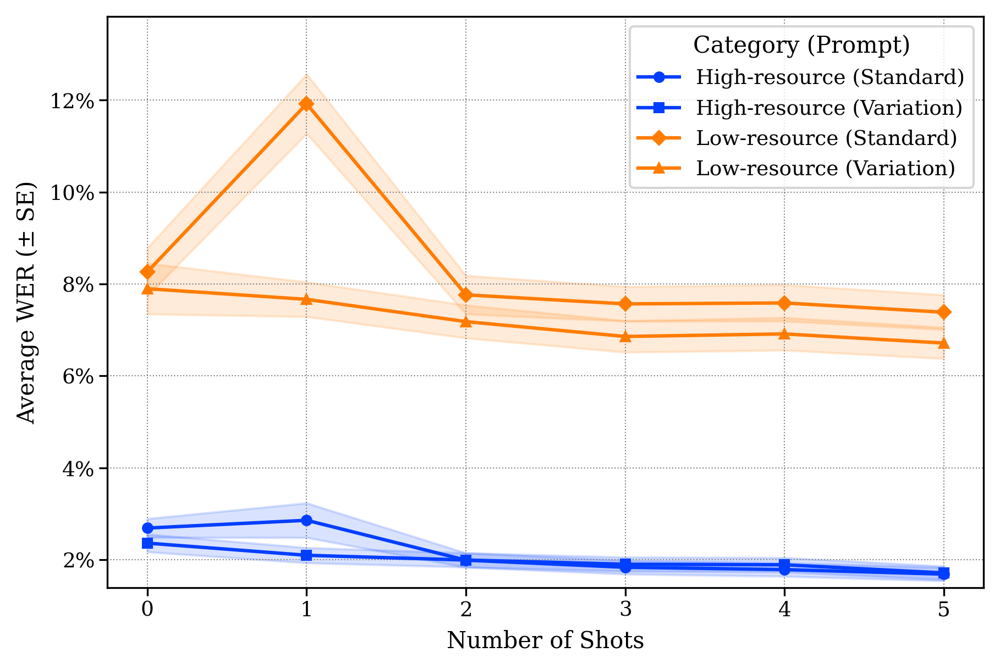

Generating iterative shot effect plot...


<ipython-input-98-ab258078eb8f>:924: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1);


Saved: all_generated_plots/plot2_iterative_shot_effect.pdf


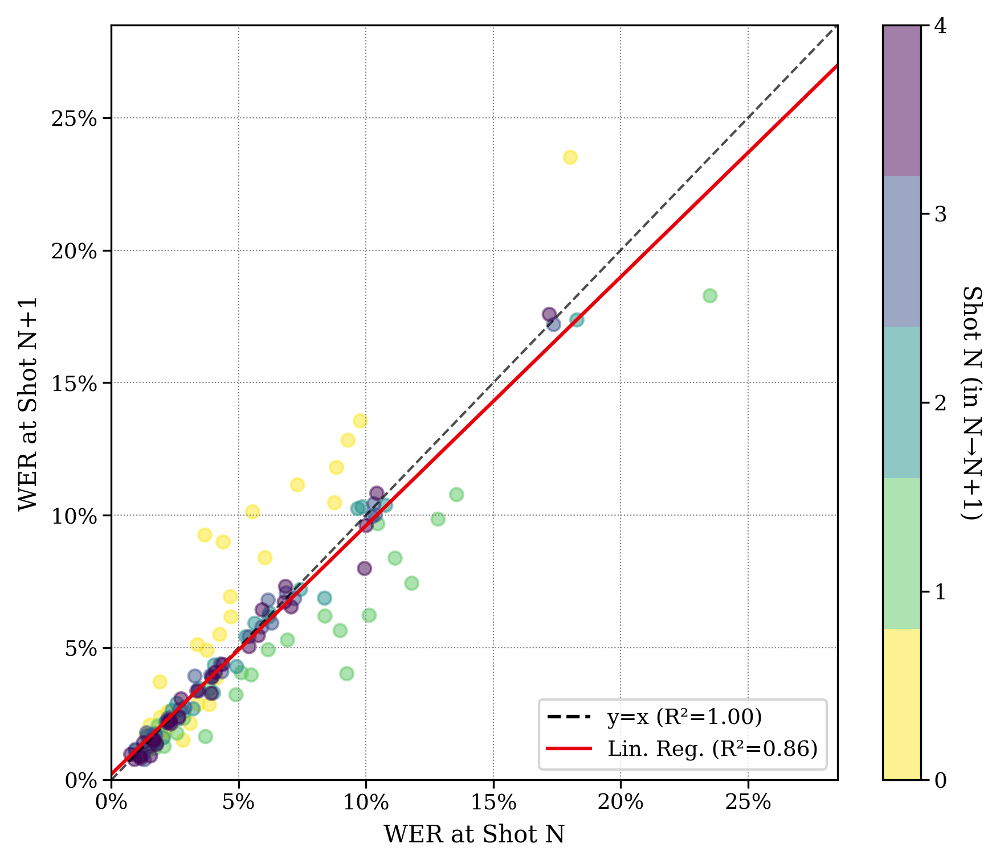

Generating violin plot (log scale)...


<ipython-input-98-ab258078eb8f>:994: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-98-ab258078eb8f>:994: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)


Saved: all_generated_plots/plot4_agg_speaker_var_violin_log.pdf


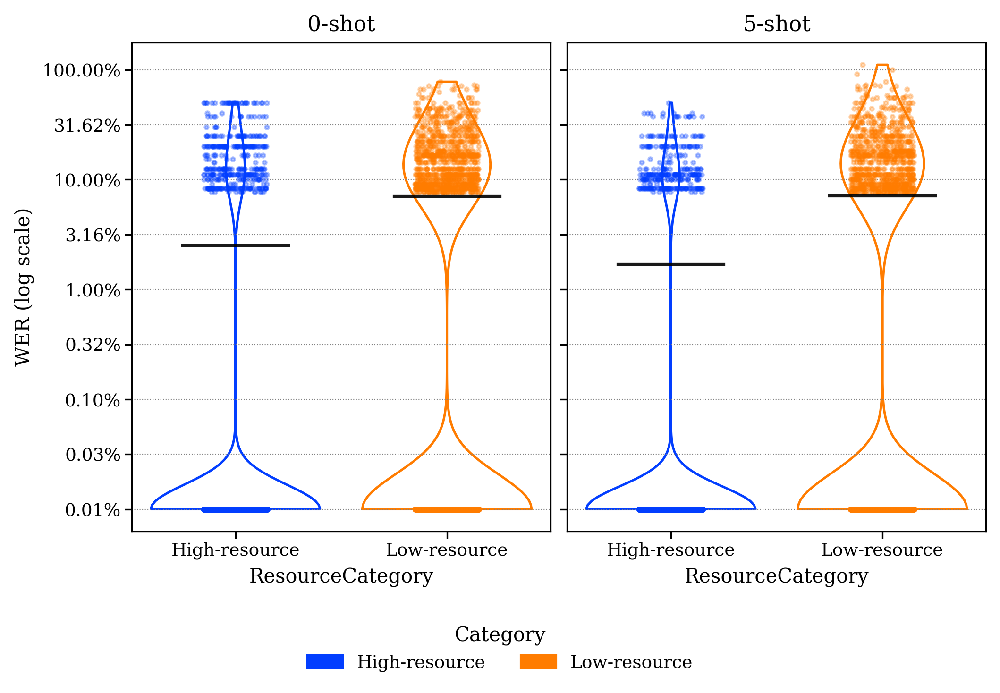

Generating corpus shot bins plot...
Saved: all_generated_plots/plot6_corpus_aggregated_shot_bins_02_36_710.pdf


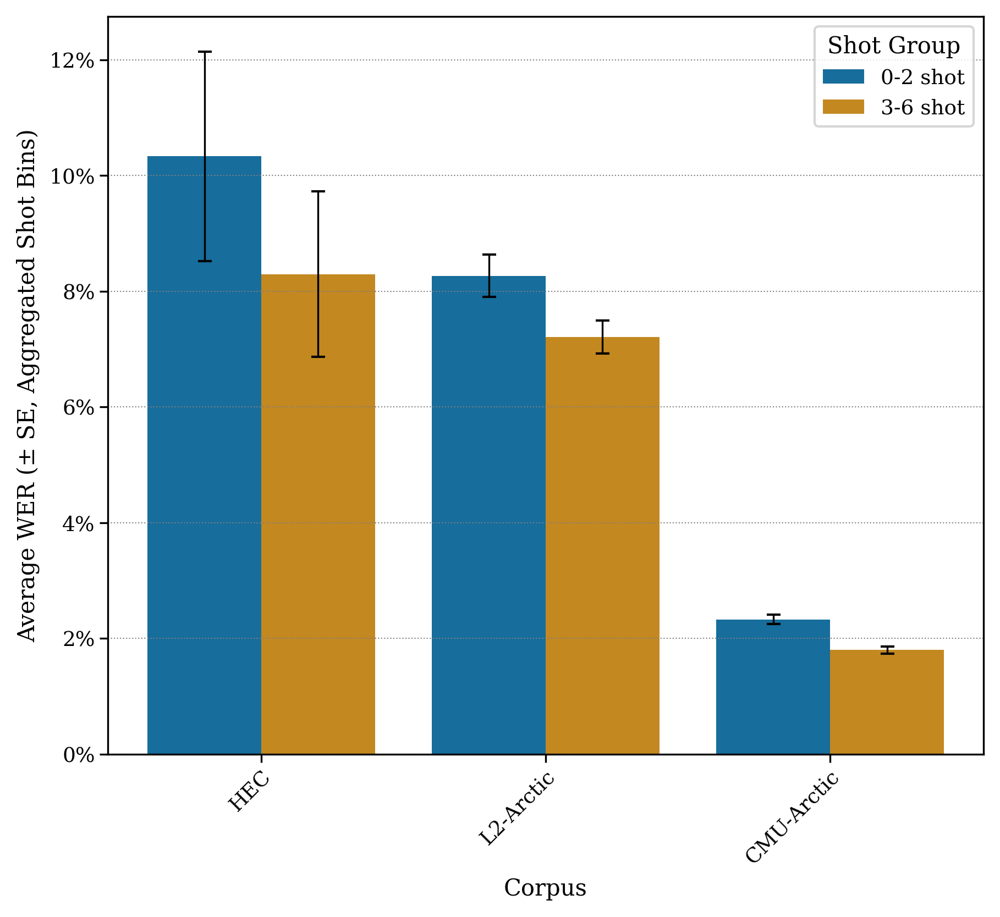

Generating marginal WER by corpus lines plot...
Saved: all_generated_plots/plot_marginal_wer_by_shot_corpus_lines.pdf


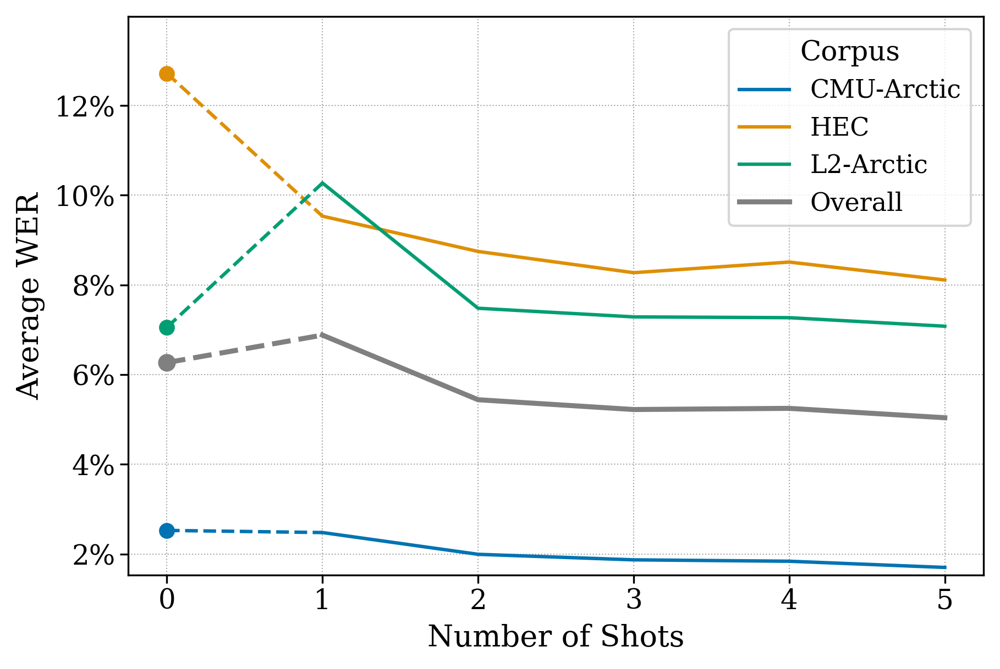

Generating overall shot bins plot...
Saved: all_generated_plots/plot3_overall_shot_bins_three.pdf


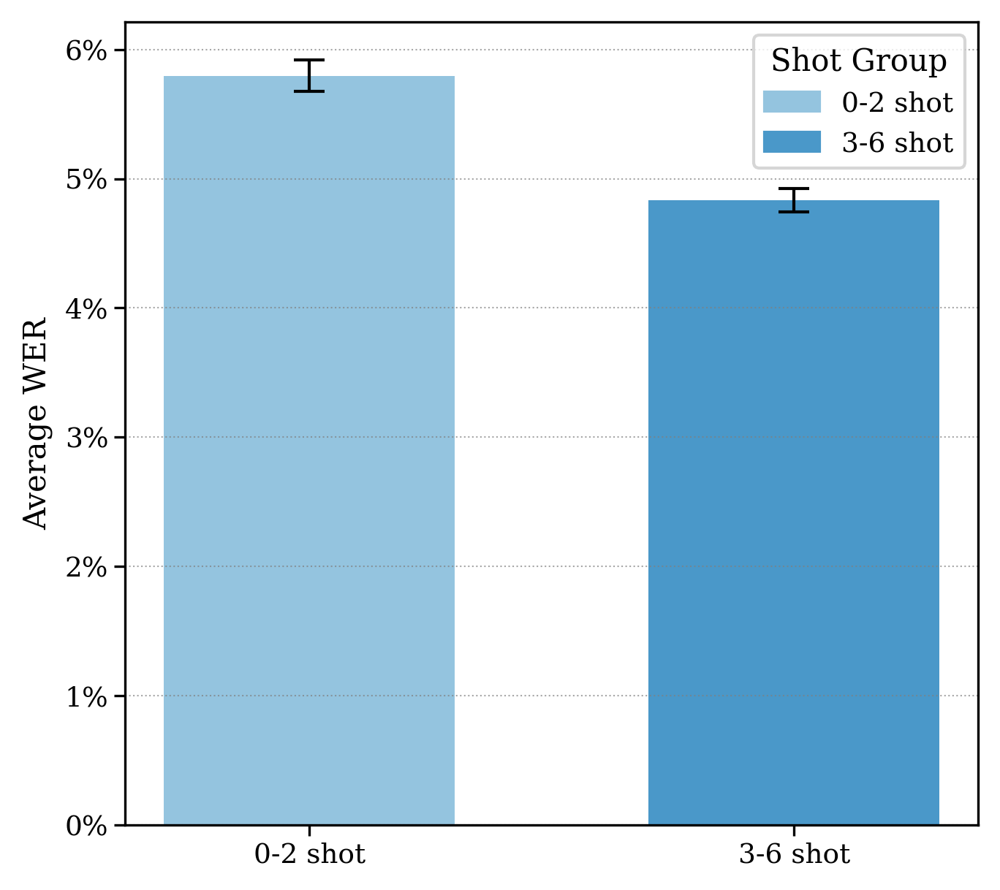

Generating combined corpus plot with average...
Saved: all_generated_plots/plot6_corpus_bins_combined.pdf


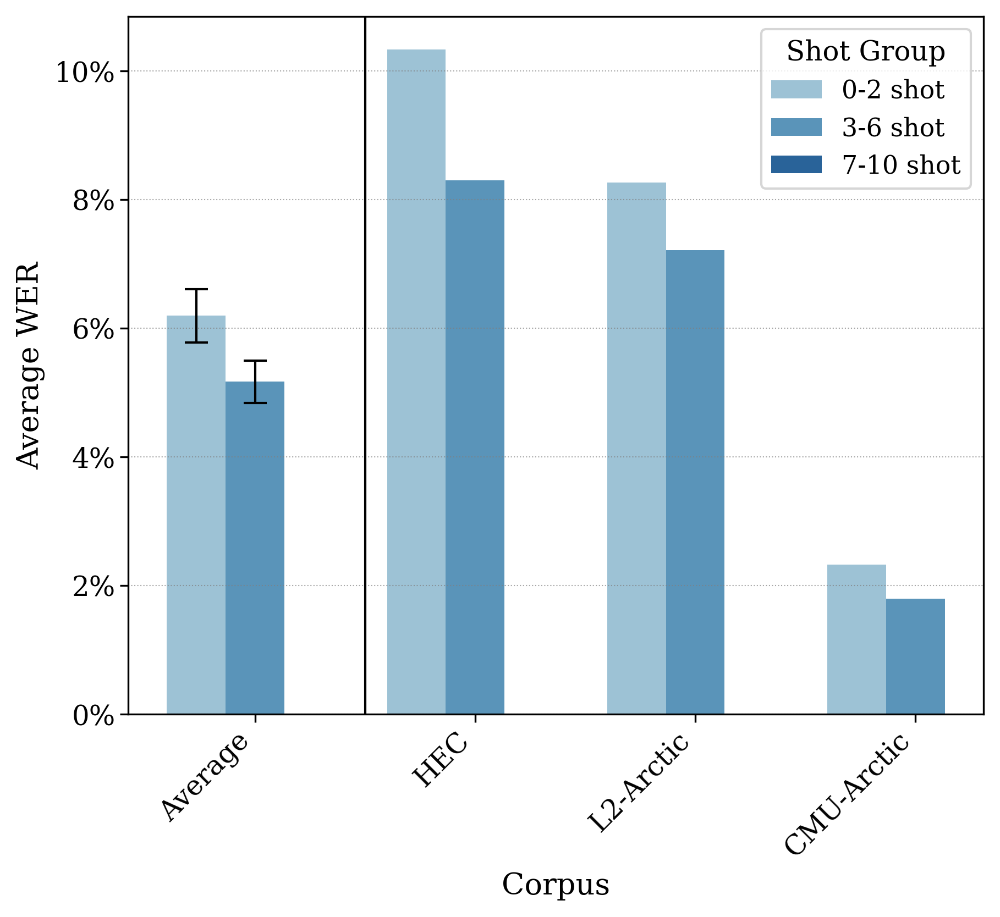


4. Generating same vs different speaker comparison...
Generating same vs diff comparison plot...
Loading same speaker results...
Loading different speaker results...
Extracting same speaker data...
Extracting different speaker data...
Same speaker dataset: 36 speakers
Different speaker dataset: 36 speakers
Common speakers: 36 speakers
Computing statistics...
Creating plot...

=== Statistical Tests ===
2-shot same vs different: t=0.730, p=0.4657 
5-shot same vs different: t=0.116, p=0.9073 
Saved: all_generated_plots/same_vs_diff_speaker_comparison.pdf


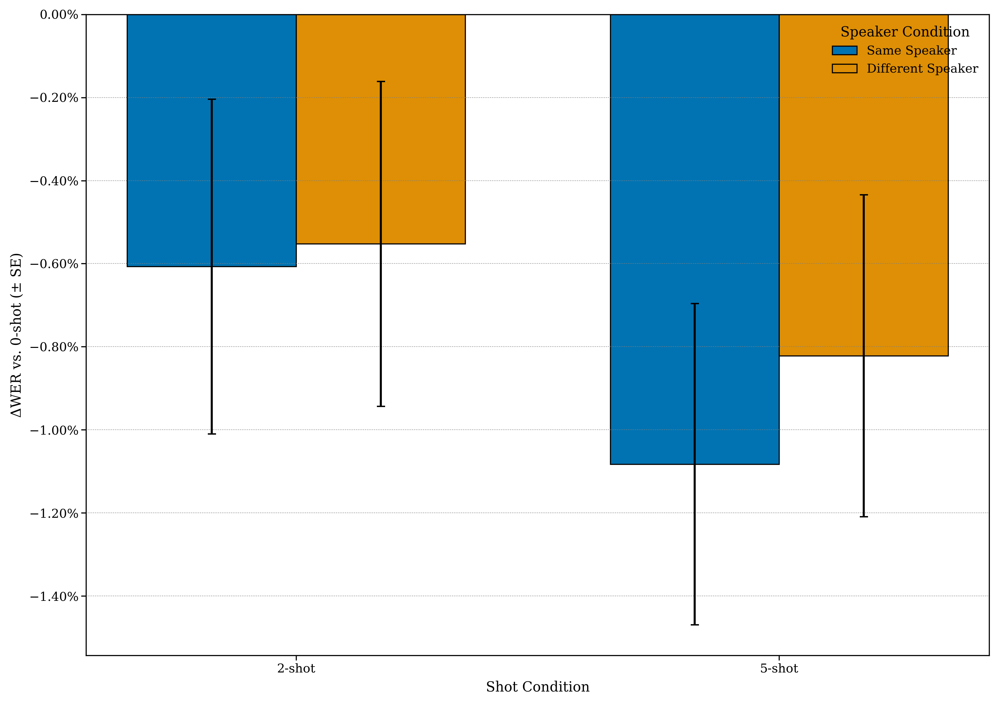


5. Generating tables...
Generating core results table (shots: [0, 5, 5])...
Generating full speaker results table...
Generating best/worst speakers table...
Generating L1 shot groups table...
Generating corpus/variety table...
Generating detailed core results table...
Generating same vs different speaker table...
Loading same speaker results...
Loading different speaker results...
Extracting same speaker data...
Extracting different speaker data...
Same speaker dataset: 36 speakers
Different speaker dataset: 36 speakers
Common speakers: 36 speakers
Computing statistics...
Computing statistical significance...
Creating LaTeX table...

=== LaTeX Table Summary ===
Table values (ΔWER vs 0-shot):

1-shot:
  Same Speaker: 0.91% ± 0.46%
  Different Speaker: 0.98% ± 0.46%
  Significance: t=0.472, p=0.6371 

2-shot:
  Same Speaker: -0.61% ± 0.40%
  Different Speaker: -0.55% ± 0.39%
  Significance: t=0.730, p=0.4657 

3-shot:
  Same Speaker: -0.80% ± 0.39%
  Different Speaker: -0.76% ± 0.39%
  

In [ ]:
tables = generate_all_code_and_plots(
    "all_results_summary_same.json",
    "all_results_summary_diff.json"
)

In [ ]:
import json
import os
import itertools
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.ticker import PercentFormatter, MaxNLocator, LogFormatterSciNotation, ScalarFormatter, FuncFormatter
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import ttest_ind

# --- Configuration & Styling (ACL/EMNLP Best Practices) ---
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'serif'],
    'font.sans-serif': ['DejaVu Sans', 'sans-serif'],
    'font.size': 10,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 0.8,
    'grid.color': 'grey',
    'grid.linestyle': ':',
    'grid.linewidth': 0.5,
    'xtick.major.pad': 2,
    'ytick.major.pad': 2,
    'figure.autolayout': False
})

# --- Shot Group Constants for Consistency ---
# MODIFIED Item 1: Updated SHOT_GROUPS_PRIMARY for plot 6 and related elements
SHOT_GROUPS_PRIMARY = {'0': (0, 0), '1-4': (1, 4), '5-8': (5, 8), '9-12': (9, 12)}
SHOT_GROUPS_ALTERNATIVE = {'0-4': (0, 4), '5-10': (5, 10)}
SHOT_GROUPS_LEGACY = {'0-3': (0, 3), '4-7': (4, 7), '8-10': (8, 10)}

def assign_shot_group(shot, group_type='primary'):
    """
    Assign shot groups consistently across the codebase.

    Args:
        shot: The shot number
        group_type: 'primary', 'alternative', or 'legacy'
    """
    if group_type == 'primary':
        groups = SHOT_GROUPS_PRIMARY
    elif group_type == 'alternative':
        groups = SHOT_GROUPS_ALTERNATIVE
    elif group_type == 'legacy':
        groups = SHOT_GROUPS_LEGACY
    else:
        raise ValueError(f"Unknown group_type: {group_type}")

    for group_name, (min_shot, max_shot) in groups.items():
        if min_shot <= shot <= max_shot:
            return group_name
    return None

colors = sns.color_palette("colorblind", 10)
bright_colors = sns.color_palette("bright", 10)
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'H']

# --- Speaker and Resource Metadata ---
SPEAKER_METADATA = {
    'ABA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'SKA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'YBAA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ZHAA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'BWC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'LXC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'NCC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TXHC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'ASI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'RRBI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'SVBI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TNI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HJK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'HKK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'YDCK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'YKWK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'EBVS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ERMS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'MBMPS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'NJS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HQTV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'PNV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'THV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TLV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'bdl': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slt': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'jmk': {'l1': 'Canadian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'awb': {'l1': 'Scottish English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'rms': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'clb': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'ksp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aew': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ahw': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aup': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'axb': {'l1': 'Indian English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'eey': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'fem': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'gka': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ljm': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'lnh': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'rxr': {'l1': 'Israeli English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
}

RESOURCE_MAPPING = {
    'l2-arctic': {'name': 'L2-Arctic', 'category': 'Low-resource'},
    'hisp-eng': {'name': 'HEC', 'category': 'Low-resource'},
    'saa': {'name': 'SAA', 'category': 'Low-resource'},
    'sandi': {'name': 'SANDI', 'category': 'Low-resource'},
    'cmu-arctic': {'name': 'CMU-Arctic', 'category': 'High-resource'},
}

RESOURCE_CATEGORY_PALETTE = {
    'High-resource': bright_colors[0],
    'Low-resource': bright_colors[1],
    'Unknown': 'grey'
}

HISP_ENG_ORIGINS = {
    '0': None, '1': 'Argentina', '2': 'Mexico', '3': 'Argentina', '4': 'Argentina',
    '5': 'Argentina', '6': 'Argentina', '7': None, '8': None, '9': None, '10': None,
    '11': None, '12': None, '13': None, '14': None, '15': None, '16': None, '17': None,
    '18': 'Argentina', '19': 'Chile'
}

CMU_ARCTIC_VARIETIES = {
    'aew': 'US English', 'ahw': 'German English', 'aup': 'Indian English',
    'axb': 'Indian English', 'eey': 'US English', 'fem': 'German English',
    'gka': 'Indian English', 'ljm': 'US English', 'lnh': 'US English',
    'rxr': 'Israeli English', 'slp': 'Indian English'
}

LANGUAGE_FAMILIES = {
    'afrikaans': 'Germanic', 'agni': 'Niger-Congo', 'albanian': 'Indo-European (Albanian)',
    'amharic': 'Afro-Asiatic (Cushitic)', 'arabic': 'Afro-Asiatic (Semitic)',
    'armenian': 'Indo-European (Armenian)', 'azerbaijani': 'Turkic', 'bafang': 'Niger-Congo',
    'baga': 'Niger-Congo', 'bai': 'Sino-Tibetan', 'bambara': 'Niger-Congo',
    'bamun': 'Niger-Congo', 'basque': 'Language Isolate', 'bengali': 'Indo-European (Indo-Aryan)',
    'bosnian': 'Indo-European (Slavic)', 'bulgarian': 'Indo-European (Slavic)',
    'cantonese': 'Sino-Tibetan', 'carolinian': 'Austronesian', 'catalan': 'Indo-European (Romance)',
    'chamorro': 'Austronesian', 'czech': 'Indo-European (Slavic)', 'danish': 'Germanic',
    'dari': 'Indo-European (Iranian)', 'dutch': 'Germanic', 'ebira': 'Niger-Congo',
    'edo': 'Niger-Congo', 'english': 'Germanic'
}

# --- Utility and Data Extraction Functions ---
def load_results(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

def split_composite_speaker(s):
    """
    Accepts '3_BWC' → returns ('3', 'BWC').
    If no underscore, returns (None, s).
    """
    if isinstance(s, str) and '_' in s:
        code, speaker = s.split('_', 1)
        return code, speaker
    return None, s

def calculate_mean_se(wer_values):
    """
    Calculates mean, standard error (SE), and count (n) for a list of WER values.
    Filters out NaN and negative values.
    Returns (mean, se, n). SE is 0.0 if n <= 1 or if all values are identical.
    """
    if not isinstance(wer_values, (list, np.ndarray, pd.Series)):
        if isinstance(wer_values, (int, float)) and pd.notna(wer_values) and wer_values >= 0:
            return wer_values, 0.0, 1
        return np.nan, np.nan, 0

    if isinstance(wer_values, pd.Series):
        wer_values = wer_values.tolist()
    elif isinstance(wer_values, np.ndarray):
        wer_values = wer_values.tolist()
    if not wer_values:
        return np.nan, np.nan, 0

    valid_wers = [w for w in wer_values if pd.notna(w) and w >= 0]
    n = len(valid_wers)

    if n == 0:
        return np.nan, np.nan, 0
    elif n == 1:
        return valid_wers[0], 0.0, 1
    else:
        mean = np.mean(valid_wers)
        se = stats.sem(valid_wers, ddof=1, nan_policy='omit')
        if pd.isna(se) or np.isclose(se, 0):
            se = 0.0
        return mean, se, n

def extract_full_data_with_trials(results_data, speaker_metadata_map, resource_map):
    trial_records = []
    speaker_shot_records = []

    for dataset_key, ds_content in results_data.items():
        if dataset_key not in resource_map:
            continue

        ds_meta = resource_map[dataset_key]
        for prompt_type, prompt_content in ds_content.items():
            for shot_tag, shot_block in prompt_content.items():
                if not shot_tag.startswith("shot"):
                    continue
                shot = int(shot_tag[4:])

                if "speakers" not in shot_block:
                    continue

                # Handle composite speaker IDs
                for raw_key, spk_json in shot_block["speakers"].items():
                    var_code, spk_code = split_composite_speaker(raw_key)

                    # lookup now uses the cleaned code
                    meta = speaker_metadata_map.get(spk_code.upper(), {})
                    l1     = meta.get("l1", "Unknown")
                    gender = meta.get("gender", "Unknown")

                    wer_vals = spk_json.get(f"{shot_tag}_wer_values", [])
                    mean, se, n = calculate_mean_se(wer_vals)

                    # Speaker-level row
                    speaker_shot_records.append({
                        "DatasetKey":      dataset_key,
                        "Corpus":          ds_meta["name"],
                        "ResourceCategory":ds_meta["category"],
                        "Speaker":         spk_code,     # cleaned code
                        "VarietyID":       var_code,     # may be None
                        "L1":              l1,
                        "Gender":          gender,
                        "PromptType":      prompt_type,
                        "Shot":            shot,
                        "WER_Speaker_Mean":mean,
                        "WER_Speaker_SE":  se,
                        "Num_Trials_Speaker": n,
                    })

                    # Trial-level rows
                    for w in wer_vals:
                        if pd.notna(w) and w >= 0:
                            trial_records.append({
                                "DatasetKey": dataset_key,
                                "Corpus":     ds_meta["name"],
                                "ResourceCategory": ds_meta["category"],
                                "Speaker":    spk_code,     # cleaned code
                                "VarietyID":  var_code,     # may be None
                                "L1":         l1,
                                "Gender":     gender,
                                "PromptType": prompt_type,
                                "Shot":       shot,
                                "WER_Trial":  w,
                            })

    df_speaker_shot = pd.DataFrame(speaker_shot_records)
    df_trials = pd.DataFrame(trial_records)
    for df in [df_speaker_shot, df_trials]:
        if not df.empty:
            numeric_cols = ['WER_Speaker_Mean', 'WER_Speaker_SE', 'Num_Trials_Speaker', 'WER_Trial', 'Shot']
            for col in numeric_cols:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
    return df_speaker_shot, df_trials

def add_variety_column(df, cmu_varieties_map, hisp_origins_map, lang_families_map):
    """
    Fixed and vectorized variety mapping following the roadmap.
    Performance optimized to avoid iterrows().
    """
    df_out = df.copy()
    df_out['Variety'] = df_out['L1']  # default everyone to their L1

    # Vectorized approach - much faster than iterrows()

    # CMU-Arctic: Use speaker code mapping
    cmu_mask = df_out['DatasetKey'] == 'cmu-arctic'
    if cmu_mask.any():
        speaker_lower = df_out.loc[cmu_mask, 'Speaker'].str.lower()
        df_out.loc[cmu_mask, 'Variety'] = speaker_lower.map(cmu_varieties_map).fillna('–')

    # L2-Arctic: Use VarietyID mapping
    l2_mask = df_out['DatasetKey'] == 'l2-arctic'
    if l2_mask.any():
        l2_map = {'1': 'Hindi', '2': 'Korean', '3': 'Mandarin', '4': 'Spanish', '5': 'Vietnamese'}
        variety_id_str = df_out.loc[l2_mask, 'VarietyID'].astype(str).str.strip()
        df_out.loc[l2_mask, 'Variety'] = variety_id_str.map(l2_map).fillna('–')

    # HispEng: Use VarietyID for origins (FIXED)
    hisp_mask = df_out['DatasetKey'] == 'hisp-eng'
    if hisp_mask.any():
        variety_id_str = df_out.loc[hisp_mask, 'VarietyID'].astype(str).str.strip()
        df_out.loc[hisp_mask, 'Variety'] = variety_id_str.map(hisp_origins_map).fillna('–')

    # SAA: Collapse all to 'SAA' (FIXED)
    saa_mask = df_out['DatasetKey'] == 'saa'
    if saa_mask.any():
        df_out.loc[saa_mask, 'Variety'] = 'SAA'

    return df_out

# --- LaTeX Table Generation Functions ---
def format_wer_se_latex(mean, se, precision=1):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if isinstance(se, pd.Series):
        se = se.iloc[0] if not se.empty else np.nan

    if pd.isna(mean) or mean is None:
        return "–"
    mean_pct = mean * 100
    if pd.isna(se) or se is None or abs(se * 100) < (0.1**(precision + 1)):
        return f"{mean_pct:.{precision}f}"
    se_pct = abs(se * 100)
    return f"{mean_pct:.{precision}f}~($\\pm${se_pct:.{precision}f})"

def format_wer_latex(mean, precision=1):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean):
        return "–"
    return f"{mean * 100:.{precision}f}"

def format_wer_latex_simple(mean, precision=1, as_percentage=True):
    # Handle Series inputs by extracting scalar values
    if isinstance(mean, pd.Series):
        mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean) or mean is None:
        return "–"
    value = mean * 100 if as_percentage else mean
    return f"{value:.{precision}f}"

# --- Table Generation Functions ---
def generate_table1_core_results(df_speaker_shot_data, shots_to_report, caption, label):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 1}\n"
    df_agg = df_speaker_shot_data[df_speaker_shot_data['Shot'].isin(shots_to_report)].groupby(['ResourceCategory', 'Shot'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_agg = pd.concat([df_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_agg.pivot_table(index='ResourceCategory', columns='Shot', values=['mean_wer', 'se_wer'])
    expected_metrics = ['mean_wer', 'se_wer'];
    shots_to_report_int = [int(s) for s in shots_to_report]
    expected_cols_tuples = pd.MultiIndex.from_product([expected_metrics, shots_to_report_int], names=['metric', 'Shot'])
    if not df_pivot.empty:
        df_pivot.columns = pd.MultiIndex.from_tuples([(col[0], int(col[1])) for col in df_pivot.columns], names=['metric', 'Shot'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples)
    else:
        known_categories = pd.Index(df_speaker_shot_data['ResourceCategory'].unique(), name='ResourceCategory')
        df_pivot = pd.DataFrame(columns=expected_cols_tuples, index=known_categories)
    latex_str = "\\begin{table*}[htbp]\n\\centering\n"
    latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shots_to_report_int);
    col_format = "l" + "c" * num_shot_cols
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header = "Resource Category & " + " & ".join([f"{s}-shot WER (\%)" for s in shots_to_report_int]) + " \\\\\n\\midrule\n";
    latex_str += header
    categories = ['High-resource', 'Low-resource']
    for cat in categories:
        cat_latex = cat.replace('-', '\\textnormal{-}')
        if cat in df_pivot.index:
            row_data = [cat_latex]
            for shot in shots_to_report_int:
                # Extract scalar values safely
                if ('mean_wer', shot) in df_pivot.columns:
                    mean_val = df_pivot.loc[cat, ('mean_wer', shot)]
                    mean_val = mean_val.iloc[0] if isinstance(mean_val, pd.Series) else mean_val
                else:
                    mean_val = np.nan

                if ('se_wer', shot) in df_pivot.columns:
                    se_val = df_pivot.loc[cat, ('se_wer', shot)]
                    se_val = se_val.iloc[0] if isinstance(se_val, pd.Series) else se_val
                else:
                    se_val = np.nan

                row_data.append(format_wer_se_latex(mean_val, se_val))
            latex_str += " & ".join(row_data) + " \\\\\n"
        else:
            latex_str += f"{cat_latex} & " + " & ".join(["–"] * num_shot_cols) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_table2_appendix_full(df_speaker_shot_data, max_shot_to_display, caption, label):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 2}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'DatasetKey', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_pivot = df_prompt_agg[df_prompt_agg['Shot'] <= max_shot_to_display].pivot_table(index=['Corpus', 'Speaker', 'L1', 'ResourceCategory'], columns='Shot', values='WER_Speaker_Mean').reset_index()
    df_pivot = df_pivot.sort_values(['Corpus', 'Speaker'])
    shot_columns = sorted([s for s in df_pivot.columns if isinstance(s, int) and s <= max_shot_to_display])
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns);
    col_format = "lllr" + "c" * num_shot_cols;
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-sh" for s in shot_columns]);
    header = "Corpus & Speaker & L1 & Resource & " + header_shots + " \\\\\n\\midrule\n";
    latex_str += header
    for _, row in df_pivot.iterrows():
        l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A';
        res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A';
        res_cat_fmt = res_cat_str.replace('-resource','').title()
        row_data = [row['Corpus'], row['Speaker'], l1_str, res_cat_fmt]
        for shot in shot_columns:
            row_data.append(format_wer_latex(row.get(shot, np.nan)))
        latex_str += " & ".join(map(str, row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_table3_best_worst_speakers(df_speaker_shot_data, n_shot_compare, num_speakers_each=5, caption="Best and Worst Performing Speakers", label="tab:best_worst_speakers"):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 3}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_0_shot = df_prompt_agg[df_prompt_agg['Shot'] == 0].rename(columns={'WER_Speaker_Mean': 'WER_0_shot'});
    df_n_shot = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_compare].rename(columns={'WER_Speaker_Mean': f'WER_{n_shot_compare}_shot'})
    if df_0_shot.empty or df_n_shot.empty:
        return f"\\textit{{Missing shot data for Table 3 (0-shot or {n_shot_compare}-shot).}}\n"
    df_merged = pd.merge(df_0_shot[['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'WER_0_shot']], df_n_shot[['Speaker', f'WER_{n_shot_compare}_shot']], on='Speaker', how='inner')
    if df_merged.empty:
        return f"\\textit{{No speakers with both 0-shot and {n_shot_compare}-shot data for Table 3.}}\n"
    df_merged['Delta_WER'] = df_merged['WER_0_shot'] - df_merged[f'WER_{n_shot_compare}_shot']
    sections = {
        f"Top {num_speakers_each} by 0-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, 'WER_0_shot'),
        f"Bottom {num_speakers_each} by 0-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, 'WER_0_shot'),
        f"Top {num_speakers_each} by {n_shot_compare}-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Bottom {num_speakers_each} by {n_shot_compare}-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Top {num_speakers_each} by Delta WER (Largest Improvement)": df_merged.nlargest(num_speakers_each, 'Delta_WER'),
    }
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption} (0-shot vs. {n_shot_compare}-shot WERs as percentages).}}\n\\label{{{label}}}\n"
    latex_str += "\\begin{tabular}{lllccccc}\n\\toprule\n";
    latex_str += "Category & Corpus & Speaker & L1 & Resource & 0-shot & N-shot & Delta \\\\\n\\midrule\n"
    first_section = True
    for title, df_section in sections.items():
        if not first_section:
            latex_str += "\\midrule\n";
        first_section = False
        latex_str += f"\\multicolumn{{8}}{{l}}{{\\textit{{{title}}}}} \\\\\n"
        if df_section.empty:
            latex_str += "\\multicolumn{8}{l}{\\textit{No data for this section}} \\\\\n";
            continue
        for _, row in df_section.iterrows():
            l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A';
            res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A';
            res_cat_fmt = res_cat_str.replace('-resource','').title()
            row_data = ["", row['Corpus'], row['Speaker'], l1_str, res_cat_fmt, format_wer_latex(row['WER_0_shot']), format_wer_latex(row[f'WER_{n_shot_compare}_shot']), format_wer_latex(row['Delta_WER'])]
            latex_str += " & ".join(map(str,row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_table4_l1_shot_groups(df_speaker_shot_data, max_shot_overall, caption, label):
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for Table 4}\n"
    df_copy = df_speaker_shot_data.copy()

    # Use consistent shot grouping
    df_copy['ShotGroup'] = df_copy['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df_copy = df_copy[df_copy['Shot'] <= max_shot_overall]
    df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean', 'L1'])
    if df_copy.empty:
        return "\\textit{No data after shot grouping for Table 4}\n"

    df_l1_agg = df_copy.groupby(['L1', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    num_speakers_per_l1 = df_copy.groupby('L1')['Speaker'].nunique().reset_index().rename(columns={'Speaker': 'num_speakers_unique'})
    stats_calc = df_l1_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_l1_agg = pd.concat([df_l1_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_l1_agg.pivot_table(index='L1', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    # Get available shot groups from data
    shot_group_cols_present = sorted([sg for sg in SHOT_GROUPS_PRIMARY.keys() if sg in df_l1_agg['ShotGroup'].unique()], key=lambda x: list(SHOT_GROUPS_PRIMARY.keys()).index(x)) # Keep order
    expected_metrics = ['mean_wer', 'se_wer']

    # Ensure df_pivot has the expected structure, handling empty cases
    if not df_pivot.empty and shot_group_cols_present:
        expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples_l1) # Reindex columns to ensure all expected are present
        df_pivot = df_pivot.reindex(index=sorted(df_pivot.index)) # Sort index L1
    else: # Handle cases where pivot might be empty or no shot groups exist
        unique_l1s = pd.Index(df_copy['L1'].unique(), name='L1').sort_values()
        if shot_group_cols_present:
            expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
            df_pivot = pd.DataFrame(columns=expected_cols_tuples_l1, index=unique_l1s)
        else: # No shot groups, create empty df with just index
            df_pivot = pd.DataFrame(index=unique_l1s)

    # Attach speaker counts without triggering a MultiIndex merge
    df_pivot_reset = df_pivot.reset_index()                          # L1 is now a column

    # Remove duplicate columns if they exist
    df_pivot_reset = df_pivot_reset.loc[:, ~df_pivot_reset.columns.duplicated()]

    speaker_count_map = (
        num_speakers_per_l1
            .set_index('L1')['num_speakers_unique']                  # Series: L1 → count
            .to_dict()
    )

    # Safely map speaker counts
    if 'L1' in df_pivot_reset.columns:
        df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
    else:
        # If L1 is not in columns, it might be in the index
        df_pivot_reset = df_pivot_reset.reset_index()
        if 'L1' in df_pivot_reset.columns:
            df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
        else:
            # Fallback: add zeros for speaker counts
            df_pivot_reset['num_speakers_unique'] = 0

    df_merged_pivot = df_pivot_reset                                # keep the name used later

    latex_str = "\\begin{table}[htbp]\n\\centering\n";
    latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    header_groups_display_names = shot_group_cols_present
    col_format = "lc" + "c" * len(header_groups_display_names);
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    # MODIFIED Item 1: Use "Shots" for header to be generic if group names are short like "0"
    header_text_groups = " & ".join([f"WER {sg} Shots (\%)" if len(sg) > 2 else f"WER {sg}-Shot (\%)" for sg in header_groups_display_names])
    latex_str += "L1 & Num. Spk. & " + header_text_groups + " \\\\\n\\midrule\n"

    # Iterate over the merged DataFrame
    for _, row in df_merged_pivot.iterrows():
        # L1: make sure it's scalar and a string
        l1_val = row['L1']
        if isinstance(l1_val, pd.Series):
            l1_val = l1_val.iloc[0]
        l1 = str(l1_val)
        # Robust speaker-count extraction
        num_spk_val = row.get('num_speakers_unique', np.nan)
        if isinstance(num_spk_val, pd.Series):
            num_spk_val = num_spk_val.iloc[0]
        num_spk_str = str(int(num_spk_val)) if pd.notna(num_spk_val) else "–"
        row_data = [l1, num_spk_str]
        for sg in header_groups_display_names:
             # Access columns using the tuple format for MultiIndex columns
            mean_val = row.get(('mean_wer', sg), np.nan)
            se_val = row.get(('se_wer', sg), np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table}\n";
    return latex_str

def generate_table_corpus_variety_shot_wers(df_speaker_shot_augmented, max_shot_to_display, caption, label):
    if df_speaker_shot_augmented.empty:
        return "\\textit{No data available for Corpus/Variety WER table.}\n"
    df_corpus_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Shot'])['WER_Speaker_Mean'].mean().reset_index();
    df_corpus_pivot = df_corpus_agg.pivot_table(index='Corpus', columns='Shot', values='WER_Speaker_Mean')
    df_variety_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Variety', 'Shot'])['WER_Speaker_Mean'].mean().reset_index();
    df_variety_pivot = df_variety_agg.pivot_table(index=['Corpus', 'Variety'], columns='Shot', values='WER_Speaker_Mean')
    shots_in_corpus_pivot = set(df_corpus_pivot.columns) if not df_corpus_pivot.empty else set();
    shots_in_variety_pivot = set(df_variety_pivot.columns) if not df_variety_pivot.empty else set()
    all_present_shots = sorted([s for s in shots_in_corpus_pivot.union(shots_in_variety_pivot) if isinstance(s, (int, float))])
    shot_columns = [s for s in all_present_shots if s <= max_shot_to_display]
    if not shot_columns:
        if 0 <= max_shot_to_display and (0 in shots_in_corpus_pivot or 0 in shots_in_variety_pivot):
            shot_columns = [0]
        else:
            return "\\textit{No shot data for Corpus/Variety WER table columns.}\n"
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns);
    col_format = "l" + "c" * num_shot_cols;
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-shot" for s in shot_columns]);
    header = "Corpus / Variety & " + header_shots + " \\\\\n\\midrule\n";
    latex_str += header
    corpora = sorted(df_speaker_shot_augmented['Corpus'].unique())
    for corpus_name in corpora:
        corpus_row_data = [f"\\textbf{{{corpus_name}}}"]
        if corpus_name in df_corpus_pivot.index:
            for shot in shot_columns:
                val = df_corpus_pivot.loc[corpus_name, shot] if shot in df_corpus_pivot.columns else np.nan;
                corpus_row_data.append(format_wer_latex_simple(val))
        else:
            corpus_row_data.extend(["–"] * num_shot_cols)
        latex_str += " & ".join(corpus_row_data) + " \\\\\n"
        if not df_variety_pivot.empty and corpus_name in df_variety_pivot.index.get_level_values('Corpus'):
            varieties_in_corpus = sorted([v for v in df_variety_pivot.loc[corpus_name].index.unique().tolist() if pd.notna(v)])
        else:
            varieties_in_corpus = []
        for variety_name in varieties_in_corpus:
            variety_display_name = str(variety_name).replace('_', ' ');
            variety_row_data = [f"\\hspace*{{1em}}\\textit{{{variety_display_name}}}"]
            if (corpus_name, variety_name) in df_variety_pivot.index:
                variety_shot_data = df_variety_pivot.loc[(corpus_name, variety_name)]
                for shot in shot_columns:
                    val = variety_shot_data.get(shot, np.nan);
                    variety_row_data.append(format_wer_latex_simple(val))
            else:
                variety_row_data.extend(["–"] * num_shot_cols)
            latex_str += " & ".join(map(str, variety_row_data)) + " \\\\\n"
        if corpus_name != corpora[-1]:
            latex_str += "\\midrule\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

def generate_detailed_core_results_table_mod3(df_speaker_shot_data, caption, label):
    """ Generates the detailed core results table with grouped shots, N, rel gain, and SE. """
    if df_speaker_shot_data.empty:
        return "\\textit{No data available for the detailed core results table.}\n"
    max_shot_overall = df_speaker_shot_data['Shot'].max() if not df_speaker_shot_data.empty else -1
    if max_shot_overall < 0:
        return "\\textit{No shot data found for the detailed core results table.}\n"
    n_shot_for_gain = min(10, max_shot_overall)

    corpus_speaker_counts = df_speaker_shot_data.groupby('Corpus')['Speaker'].nunique()
    resource_speaker_counts = df_speaker_shot_data.groupby('ResourceCategory')['Speaker'].nunique()
    df_copy = df_speaker_shot_data[df_speaker_shot_data['Shot'] <= max_shot_overall].copy()

    # Use consistent shot grouping (legacy for this table)
    df_copy['ShotGroup'] = df_copy['Shot'].apply(lambda x: assign_shot_group(x, 'legacy'))
    df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])

    grouped_stats = df_copy.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = grouped_stats['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    grouped_stats = pd.concat([grouped_stats.drop('list_of_means', axis=1), stats_calc], axis=1)
    pivot_grouped_corpus = grouped_stats.pivot_table(index='Corpus', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    resource_grouped_stats = df_copy.groupby(['ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc_res = resource_grouped_stats['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    resource_grouped_stats = pd.concat([resource_grouped_stats.drop('list_of_means', axis=1), stats_calc_res], axis=1)
    pivot_grouped_resource = resource_grouped_stats.pivot_table(index='ResourceCategory', columns='ShotGroup', values=['mean_wer', 'se_wer'])

    relative_gain_corpus = pd.Series(dtype=float);
    relative_gain_resource = pd.Series(dtype=float)
    if n_shot_for_gain > 0:
        df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
        df_shot_0 = df_prompt_agg[df_prompt_agg['Shot'] == 0];
        df_shot_n = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_for_gain]
        mean_wer_0_corpus = df_shot_0.groupby('Corpus')['WER_Speaker_Mean'].mean();
        mean_wer_n_corpus = df_shot_n.groupby('Corpus')['WER_Speaker_Mean'].mean()
        mean_wer_0_corpus, mean_wer_n_corpus = mean_wer_0_corpus.align(mean_wer_n_corpus, join='left')
        relative_gain_corpus = (mean_wer_0_corpus - mean_wer_n_corpus) / mean_wer_0_corpus;
        relative_gain_corpus[np.isclose(mean_wer_0_corpus, 0)] = np.nan;
        relative_gain_corpus = relative_gain_corpus.fillna(0)
        mean_wer_0_resource = df_shot_0.groupby('ResourceCategory')['WER_Speaker_Mean'].mean();
        mean_wer_n_resource = df_shot_n.groupby('ResourceCategory')['WER_Speaker_Mean'].mean()
        mean_wer_0_resource, mean_wer_n_resource = mean_wer_0_resource.align(mean_wer_n_resource, join='left')
        relative_gain_resource = (mean_wer_0_resource - mean_wer_n_resource) / mean_wer_0_resource;
        relative_gain_resource[np.isclose(mean_wer_0_resource, 0)] = np.nan;
        relative_gain_resource = relative_gain_resource.fillna(0)

    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n";
    latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    shot_group_order = list(SHOT_GROUPS_LEGACY.keys())  # Based on legacy grouping
    present_groups = [sg for sg in shot_group_order if sg in grouped_stats['ShotGroup'].unique()]
    num_group_cols = len(present_groups);
    col_format = "lc" + "c" * num_group_cols + "c";
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_groups = " & ".join([f"{sg} WER (\%)" for sg in present_groups])
    delta_header = f"Rel. $\\Delta$ ({0}$\\to${n_shot_for_gain}-sh)" if n_shot_for_gain > 0 else "Rel. $\\Delta$ (N/A)";
    header = f"Group/Corpus & N & {header_groups} & {delta_header} (\%) \\\\\n\\midrule\n";
    latex_str += header
    all_corpora = sorted(df_speaker_shot_data['Corpus'].unique())
    for corpus_name in all_corpora:
        n_speakers = corpus_speaker_counts.get(corpus_name, 0);
        row_data = [corpus_name, str(n_speakers)]
        for sg in present_groups:
            # Access pivot data carefully, checking for MultiIndex keys
            mean_val = pivot_grouped_corpus.get(('mean_wer', sg), {}).get(corpus_name, np.nan)
            se_val = pivot_grouped_corpus.get(('se_wer', sg), {}).get(corpus_name, np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        gain_val = relative_gain_corpus.get(corpus_name, np.nan) if n_shot_for_gain > 0 else np.nan;
        row_data.append(format_wer_latex_simple(gain_val, as_percentage=True))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\midrule\n"
    resource_categories_in_data = df_speaker_shot_data['ResourceCategory'].unique();
    desired_resource_categories = [cat for cat in ['High-resource', 'Low-resource'] if cat in resource_categories_in_data]
    for resource_cat_name in desired_resource_categories:
        n_speakers = resource_speaker_counts.get(resource_cat_name, 0);
        cat_name_latex = resource_cat_name.replace('-', '\\textnormal{-}');
        row_data = [cat_name_latex, str(n_speakers)]
        for sg in present_groups:
            mean_val = pivot_grouped_resource.get(('mean_wer', sg), {}).get(resource_cat_name, np.nan)
            se_val = pivot_grouped_resource.get(('se_wer', sg), {}).get(resource_cat_name, np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        gain_val = relative_gain_resource.get(resource_cat_name, np.nan) if n_shot_for_gain > 0 else np.nan;
        row_data.append(format_wer_latex_simple(gain_val, as_percentage=True))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n";
    return latex_str

# MODIFIED Item 1: Renamed function and updated logic for new SHOT_GROUPS_PRIMARY
def generate_detailed_shot_groups_table_custom_bins(df_spkshot_all, df_trials_all, caption, label):
    """
    Generate the detailed shot table with custom shot groups (from SHOT_GROUPS_PRIMARY)
    - N (num speakers)
    - Samples (in "k" format)
    - Mean WER for each shot group
    - Relative gains with bold formatting on maximum positive gain
    """
    if df_spkshot_all.empty or df_trials_all.empty:
        return "\\textit{No data available for detailed shot groups table.}\n"

    df = df_spkshot_all.copy()
    df['ShotGroup'] = df['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df = df.dropna(subset=['ShotGroup'])

    if df.empty:
        return "\\textit{No data for primary shot groups.}\n"

    speaker_counts = df.groupby('Corpus')['Speaker'].nunique()
    trial_counts = df_trials_all.groupby('Corpus').size()
    samples_k = (trial_counts / 1000).round(1).astype(str) + ' k'

    agg = (
        df.groupby(['Corpus', 'Variety', 'ShotGroup'])['WER_Speaker_Mean']
          .agg(list_of_wers=list)
          .reset_index()
    )

    stats_calc = agg['list_of_wers'].apply(
        lambda xs: pd.Series(calculate_mean_se(xs), index=['mean', 'se', 'n'])
    )
    agg = pd.concat([agg.drop('list_of_wers', axis=1), stats_calc], axis=1)

    mean_pivot = agg.pivot_table(index=['Corpus', 'Variety'],
                                columns='ShotGroup',
                                values='mean')
    # se_pivot = agg.pivot_table(index=['Corpus', 'Variety'], # se_pivot not used in current output
    #                           columns='ShotGroup',
    #                           values='se')

    shot_groups = list(SHOT_GROUPS_PRIMARY.keys())
    for grp in shot_groups:
        if grp not in mean_pivot.columns:
            mean_pivot[grp] = np.nan
            # if grp not in se_pivot.columns: se_pivot[grp] = np.nan

    mean_pivot = mean_pivot[shot_groups]
    # se_pivot = se_pivot[shot_groups]

    # Compute relative gains based on the new shot groups
    # Expecting SHOT_GROUPS_PRIMARY = {'0':..., '1-4':..., '5-8':..., '9-12':...}
    # Groups g0, g1, g2, g3
    g0, g1, g2, g3 = shot_groups[0], shot_groups[1], shot_groups[2], shot_groups[3]

    rel_gains = pd.DataFrame(index=mean_pivot.index)
    # Analogous to original Δ3–6→7–10 (second group to third group) -> use g1 to g2
    rel_gains[f'Δ{g1}→{g2}'] = (mean_pivot[g2] - mean_pivot[g1]) / mean_pivot[g1]
    # Analogous to original Δ0–2→3–6 (first group to second group) -> use g0 to g1
    rel_gains[f'Δ{g0}→{g1}'] = (mean_pivot[g1] - mean_pivot[g0]) / mean_pivot[g0]
    # Analogous to original Δ0–2→7–10 (first group to third group) -> use g0 to g2
    rel_gains[f'Δ{g0}→{g2}'] = (mean_pivot[g2] - mean_pivot[g0]) / mean_pivot[g0]

    latex_lines = []
    latex_lines.append("\\begin{table*}[htbp]")
    latex_lines.append("\\centering")
    latex_lines.append("\\fontsize{9.8pt}{12pt}\\selectfont") # Consider adjusting font if table is too wide
    latex_lines.append(f"\\caption{{{caption}}}")
    latex_lines.append(f"\\label{{{label}}}")

    # Updated LaTeX column headers
    shot_headers = " & ".join([f"{sg_name} Shots" if len(sg_name)>1 else f"{sg_name}-Shot" for sg_name in shot_groups])
    gain_headers_keys = [f'Δ{g1}→{g2}', f'Δ{g0}→{g1}', f'Δ{g0}→{g2}']
    gain_headers_latex = [f"$\\Delta\\text{{{key_part.split('→')[0].replace('-','-')}}}$" +
                          f"$\\to\\text{{{key_part.split('→')[1].replace('-','-')}}}$"
                          for key_part in [g1+"→"+g2, g0+"→"+g1, g0+"→"+g2]]
    gain_headers = " & ".join(gain_headers_latex)

    # Adjust column format based on number of shot groups (4 groups + 3 gains + N + Samples + Corpus/Variety)
    # l r r c c c c | r r r -> 10 cols + Corpus/Variety
    latex_lines.append(f"\\begin{{tabular}}{{lrr{'c'*len(shot_groups)}|rrr}}")
    latex_lines.append("\\toprule")
    latex_lines.append(f"Corpus / Variety & N & Samples & {shot_headers} & {gain_headers}\\\\")
    # Use cmidrule that spans all shot columns, e.g., 4 to 4+len(shot_groups)-1
    latex_lines.append(f"\\cmidrule(lr){{{ f'{4}-{4+len(shot_groups)-1}' }}}")
    latex_lines.append("& & & " + "& " * (len(shot_groups)-1) + "& & & & \\\\") # Spacing line

    corpus_order = sorted(df['Corpus'].unique())

    for corpus in corpus_order:
        corpus_varieties = [(c, v) for c, v in mean_pivot.index if c == corpus]
        corpus_varieties = sorted(corpus_varieties, key=lambda x: x[1])

        for corpus_name, variety_name in corpus_varieties:
            row_data = []

            if variety_name == corpus_name or len(corpus_varieties) == 1:
                row_data.append(f"\\textbf{{{corpus_name}}}")
            else:
                variety_display = variety_name.replace('_', ' ')
                row_data.append(f"\\hspace*{{1em}}\\textit{{{variety_display}}}")

            row_data.append(str(speaker_counts.get(corpus_name, 0)))
            row_data.append(samples_k.get(corpus_name, "0.0 k"))

            row_means = mean_pivot.loc[(corpus_name, variety_name)]
            for grp in shot_groups:
                if pd.notna(row_means[grp]):
                    row_data.append(f"{100 * row_means[grp]:.2f}")
                else:
                    row_data.append("–")

            row_gains = rel_gains.loc[(corpus_name, variety_name)]

            positive_gains = row_gains[row_gains > 0] if not row_gains.isna().all() else pd.Series()
            max_gain = positive_gains.max() if not positive_gains.empty else np.nan

            for col_key in gain_headers_keys: # Iterate using the keys for rel_gains
                val = row_gains[col_key]
                if pd.notna(val):
                    cell = f"{100 * val:.1f}\\%"
                    if val >= 0: cell = "+" + cell
                    if pd.notna(max_gain) and val == max_gain:
                        cell = f"\\textbf{{{cell}}}"
                    row_data.append(cell)
                else:
                    row_data.append("–")

            latex_lines.append(" & ".join(row_data) + " \\\\")

        if corpus != corpus_order[-1]:
            latex_lines.append("\\midrule")

    latex_lines.append("\\bottomrule")
    latex_lines.append("\\end{tabular}")
    latex_lines.append("\\end{table*}")

    return "\n".join(latex_lines)

def create_latex_table_same_vs_diff_speaker(same_json_path, diff_json_path, speaker_meta=SPEAKER_METADATA, resource_map=RESOURCE_MAPPING):
    """
    Create a LaTeX table comparing same vs different speaker conditions.
    """
    # Load both JSON files
    print("Loading same speaker results...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    same_results = load_results(same_json_path)

    print("Loading different speaker results...")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_speaker, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)

    print("Extracting different speaker data...")
    df_diff_speaker, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # Find union of speakers (use all available speakers)
    same_speakers = set(df_same_trials['Speaker'].unique())
    diff_speakers = set(df_diff_trials['Speaker'].unique())
    all_speakers = same_speakers.union(diff_speakers)

    print(f"Same speaker dataset: {len(same_speakers)} speakers")
    print(f"Different speaker dataset: {len(diff_speakers)} speakers")
    print(f"Total speakers (union): {len(all_speakers)} speakers")

    # Filter for 0-shot through 5-shot data (0-shot needed for normalization)
    shots_for_calculation = [0, 1, 2, 3, 4, 5]
    shots_to_display = [1, 2, 3, 4, 5]

    # Filter and prepare data (keep all speakers)
    df_same_filtered = df_same_trials[df_same_trials['Shot'].isin(shots_for_calculation)].copy()
    df_same_filtered['Condition'] = 'Same Speaker'

    df_diff_filtered = df_diff_trials[df_diff_trials['Shot'].isin(shots_for_calculation)].copy()
    df_diff_filtered['Condition'] = 'Different Speaker'

    # Combine both datasets
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)

    if df_combined.empty:
        raise ValueError("No data found for 0-shot, 2-shot, and 5-shot comparison.")

    print("Computing statistics...")
    # Aggregate by condition and shot
    agg_data = (
        df_combined.groupby(['Condition', 'Shot'])['WER_Trial']
                   .agg(list_of_wers=list)
                   .reset_index()
    )

    # Calculate mean, SE, and count for each group
    stats_calc = agg_data['list_of_wers'].apply(
        lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials'])
    )
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)

    # Normalize every Shot relative to its 0-shot baseline
    zero_baseline = (
        agg_stats[agg_stats['Shot'] == 0]
          .set_index('Condition')[['mean_wer','se_wer']]
          .rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    )
    agg_stats = (
        agg_stats
          .merge(zero_baseline, left_on='Condition', right_index=True, how='outer')
          .assign(
            mean_wer_norm = lambda df: df['mean_wer'] - df['mean_0'],
            se_wer_norm   = lambda df: np.sqrt(df['se_wer']**2 + df['se_0']**2)
          )
    )

    # Perform statistical significance tests
    print("Computing statistical significance...")
    significance_results = {}

    for shot in shots_to_display:
        same_data = df_same_filtered[df_same_filtered['Shot'] == shot]['WER_Trial'].dropna()
        diff_data = df_diff_filtered[df_diff_filtered['Shot'] == shot]['WER_Trial'].dropna()

        if len(same_data) > 0 and len(diff_data) > 0:
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            # MODIFIED Item 4: Significance levels updated
            significance_results[shot] = {
                't_stat': t_stat,
                'p_val': p_val,
                'significance': "***" if p_val < 0.01 else "**" if p_val < 0.05 else ""
            }
        else:
            significance_results[shot] = {'t_stat': None, 'p_val': None, 'significance': ""}

    # Create the LaTeX table
    print("Creating LaTeX table...")

    # Get the normalized statistics for the table
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]

    # Start building the LaTeX table
    latex_lines = []
    latex_lines.append("\\begin{table*}[ht]")
    latex_lines.append("\\centering")
    latex_lines.append("\\small")
    latex_lines.append("\\begin{tabular}{lcc}")
    latex_lines.append("\\toprule")
    latex_lines.append("Shot & Same Speaker & Different Speaker \\\\")
    latex_lines.append("\\midrule")

    # Fill in the table rows
    for shot in shots_to_display:
        # Get values for same speaker condition
        same_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Same Speaker') &
                                      (agg_stats_display['Shot'] == shot)]
        diff_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Different Speaker') &
                                      (agg_stats_display['Shot'] == shot)]

        if not same_stats.empty and not diff_stats.empty:
            same_mean = same_stats.iloc[0]['mean_wer_norm']
            # same_se = same_stats.iloc[0]['se_wer_norm'] # SE not used in this table version
            diff_mean = diff_stats.iloc[0]['mean_wer_norm']
            # diff_se = diff_stats.iloc[0]['se_wer_norm'] # SE not used in this table version

            # Format the values as percentages
            same_cell = f"{same_mean:.2%}"
            diff_cell = f"{diff_mean:.2%}"

            # Add significance indication to the different speaker cell if significant
            if shot in significance_results and significance_results[shot]['significance']:
                diff_cell += f"$^{{{significance_results[shot]['significance'].replace('*','*')}}}$" # ensure asterisks are rendered

            # Add the row to the table
            latex_lines.append(f"{shot}-shot & {same_cell} & {diff_cell} \\\\")

    # Close the table
    latex_lines.append("\\bottomrule")
    latex_lines.append("\\end{tabular}")

    # Add caption and label
    latex_lines.append("\\caption{")
    latex_lines.append("Comparison of same speaker vs. different speaker few-shot performance. ")
    latex_lines.append("Values show $\\Delta$WER vs. 0-shot baseline. ") # Removed "± standard error"
    # MODIFIED Item 4: Significance caption updated
    latex_lines.append("Statistical significance of differences between conditions indicated by ")
    latex_lines.append("$^{**}$\\,$p < 0.05$, $^{***}$\\,$p < 0.01$.")
    latex_lines.append("}")
    latex_lines.append("\\label{tab:same_vs_diff_speaker}")
    latex_lines.append("\\end{table*}")

    # Join all lines
    latex_table = "\n".join(latex_lines)

    # Print summary
    print("\n=== LaTeX Table Summary ===")
    print("Table values (ΔWER vs 0-shot):")
    for shot in shots_to_display:
        print(f"\n{shot}-shot:")
        same_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Same Speaker') &
                                      (agg_stats_display['Shot'] == shot)]
        diff_stats = agg_stats_display[(agg_stats_display['Condition'] == 'Different Speaker') &
                                      (agg_stats_display['Shot'] == shot)]

        if not same_stats.empty and not diff_stats.empty:
            same_mean = same_stats.iloc[0]['mean_wer_norm']
            same_se = same_stats.iloc[0]['se_wer_norm']
            diff_mean = diff_stats.iloc[0]['mean_wer_norm']
            diff_se = diff_stats.iloc[0]['se_wer_norm']

            print(f"  Same Speaker: {same_mean:.2%} ± {same_se:.2%}") # Keep SE here for console summary
            print(f"  Different Speaker: {diff_mean:.2%} ± {diff_se:.2%}")

            if shot in significance_results:
                sig_info = significance_results[shot]
                if sig_info['p_val'] is not None:
                    print(f"  Significance: t={sig_info['t_stat']:.3f}, p={sig_info['p_val']:.4f} {sig_info['significance']}")

    return latex_table

# --- Plotting Functions ---
def plot_scaling_law_by_category_prompt(df_trials, max_shot_plot, output_filename="plot1_scaling_law_category_prompt.pdf", output_dir=None, show=True):
    if df_trials.empty:
        print(f"{output_filename}: No trial data.");
        return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_plot].copy()
    if df_plot.empty:
        print(f"{output_filename}: No trial data up to {max_shot_plot} shots.");
        return

    agg_df = df_plot.groupby(['ResourceCategory', 'PromptType', 'Shot'])['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_df['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_df = pd.concat([agg_df.drop('list_of_wers', axis=1), stats_calc], axis=1)
    agg_df = agg_df[agg_df['n_trials'] > 0]
    if agg_df.empty:
        print(f"{output_filename}: No aggregated data.");
        return

    fig, ax = plt.subplots(figsize=(6, 4))
    unique_groups = agg_df[['ResourceCategory', 'PromptType']].drop_duplicates().values.tolist()
    for i, (rc, pt) in enumerate(unique_groups):
        group_data = agg_df[(agg_df['ResourceCategory'] == rc) & (agg_df['PromptType'] == pt)].sort_values('Shot')
        if group_data.empty:
            continue
        color_val = RESOURCE_CATEGORY_PALETTE.get(rc, colors[i % len(colors)])
        label = f"{rc} ({pt.title()})";
        linestyle = line_styles[ (i // len(colors)) % len(line_styles) ]
        ax.plot(group_data['Shot'], group_data['mean_wer'], marker=markers[i % len(markers)], markersize=4, label=label, color=color_val, linestyle=linestyle, linewidth=1.5)
        ax.fill_between(group_data['Shot'], group_data['mean_wer'] - group_data['se_wer'], group_data['mean_wer'] + group_data['se_wer'], color=color_val, alpha=0.15, where=group_data['se_wer'] > 0)

    ax.set_xlabel('Number of Shots');
    ax.set_ylabel('Average WER (± SE)');
    ax.grid(True)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True, nbins=min(max_shot_plot + 1, 6)))
    ax.legend(title="Category (Prompt)", loc='best')
    min_wer_limit = (agg_df['mean_wer'] - agg_df['se_wer']).min();
    max_wer_limit = (agg_df['mean_wer'] + agg_df['se_wer']).max()
    y_low = max(0, min_wer_limit * 0.9 if pd.notna(min_wer_limit) and min_wer_limit > 0 else -0.02)
    y_high = min(1.0, max_wer_limit * 1.1 if pd.notna(max_wer_limit) and max_wer_limit < 1 else 1.0)
    if pd.notna(y_low) and pd.notna(y_high) and y_low >= y_high :
        y_high = y_low + 0.1
    elif not (pd.notna(y_low) and pd.notna(y_high)):
        y_low, y_high = 0, 0.5
    ax.set_ylim(y_low, y_high)
    plt.tight_layout(pad=0.5)
    if output_dir:
        plt.savefig(os.path.join(output_dir, output_filename));
        print(f"Saved: {os.path.join(output_dir, output_filename)}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_iterative_shot_effect_scatter_v4(df_speaker_shot, max_shot_plot, datasets_to_include=['l2-arctic', 'cmu-arctic'], output_filename="plot2_iterative_shot_effect.pdf", output_dir=None, show=True):
    df_filtered = df_speaker_shot[(df_speaker_shot['DatasetKey'].isin(datasets_to_include)) & (df_speaker_shot['Num_Trials_Speaker'] > 0) & (df_speaker_shot['Shot'] <= max_shot_plot)].copy()
    df_avg_prompt = df_filtered.groupby(['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    if df_avg_prompt.empty:
        print(f"{output_filename}: No data after averaging prompts.");
        return
    all_transitions_data = []
    for shot_n in range(max_shot_plot):
        shot_n_plus_1 = shot_n + 1
        df_shot_n = df_avg_prompt[df_avg_prompt['Shot'] == shot_n];
        df_shot_n_plus_1 = df_avg_prompt[df_avg_prompt['Shot'] == shot_n_plus_1]
        merged_df = pd.merge(df_shot_n, df_shot_n_plus_1, on=['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1'], suffixes=('_N', '_N+1')).dropna(subset=['WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1'])
        if not merged_df.empty:
            merged_df['Shot_N_Value'] = shot_n;
            all_transitions_data.append(merged_df[['Speaker', 'ResourceCategory', 'Shot_N_Value', 'WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1']])
    if not all_transitions_data:
        print(f"{output_filename}: No valid N vs N+1 shot transitions found.");
        return
    final_plot_df = pd.concat(all_transitions_data);
    if final_plot_df.empty:
        print(f"{output_filename}: Final plot dataframe is empty.");
        return

    fig, ax = plt.subplots(figsize=(6, 5));
    unique_shot_n_values = sorted(final_plot_df['Shot_N_Value'].unique())
    cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1);
    norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))
    scatter = ax.scatter(final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1'], c=final_plot_df['Shot_N_Value'], cmap=cmap, norm=norm, alpha=0.5, s=30, marker='o')
    all_wers = pd.concat([final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1']]).dropna();
    legend_handles = []
    if not all_wers.empty:
        lim_min = max(0, all_wers.min() - 0.05);
        lim_max = min(1.0, all_wers.max() + 0.05)
        if lim_min >= lim_max:
            lim_max = lim_min + 0.1
        ax.plot([lim_min, lim_max], [lim_min, lim_max], 'k--', alpha=0.7, linewidth=1);
        legend_handles.append(plt.Line2D([0], [0], color='k', linestyle='--', label='y=x (R²=1.00)'))
        ax.set_xlim(lim_min, lim_max);
        ax.set_ylim(lim_min, lim_max)
        x_reg = final_plot_df['WER_Speaker_Mean_N'].dropna();
        y_reg = final_plot_df['WER_Speaker_Mean_N+1'].dropna()
        common_indices = x_reg.index.intersection(y_reg.index);
        x_reg_clean = x_reg.loc[common_indices];
        y_reg_clean = y_reg.loc[common_indices]
        if len(x_reg_clean) > 1:
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_reg_clean, y_reg_clean);
            r_squared = r_value**2
            reg_x_points = np.array([lim_min, lim_max]);
            reg_y_points = slope * reg_x_points + intercept
            ax.plot(reg_x_points, reg_y_points, color=bright_colors[3], linestyle='-', linewidth=1.5);
            legend_handles.append(plt.Line2D([0], [0], color=bright_colors[3], linestyle='-', label=f'Lin. Reg. (R²={r_squared:.2f})'))
    ax.set_xlabel('WER at Shot N');
    ax.set_ylabel('WER at Shot N+1');
    ax.grid(True)
    ax.xaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0));
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    if unique_shot_n_values:
        cbar = fig.colorbar(scatter, ax=ax, ticks=unique_shot_n_values, format='%d');
        cbar.set_label('Shot N (in N→N+1)', rotation=270, labelpad=15)
    if legend_handles:
        ax.legend(handles=legend_handles, loc='lower right')
    plt.tight_layout(pad=0.5)
    if output_dir:
        plt.savefig(os.path.join(output_dir, output_filename));
        print(f"Saved: {os.path.join(output_dir, output_filename)}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_aggregated_speaker_wer_violin_log_scale(df_trials_global, datasets_to_aggregate, shots_to_plot_global, output_filename="plot4_agg_speaker_var_violin_log.pdf", output_dir=None, show=True):
    df_agg = df_trials_global[(df_trials_global['DatasetKey'].isin(datasets_to_aggregate)) & (df_trials_global['Shot'].isin(shots_to_plot_global))].copy()
    if df_agg.empty:
        print(f"{output_filename}: No data for datasets {datasets_to_aggregate}, shots {shots_to_plot_global}.");
        return
    df_agg = df_agg[df_agg['ResourceCategory'].isin(['High-resource', 'Low-resource'])]
    if df_agg.empty:
        print(f"{output_filename}: No data with 'High-resource' or 'Low-resource' categories.");
        return
    epsilon = 1e-4;
    df_agg['WER_Trial_Log'] = np.log10(df_agg['WER_Trial'].clip(lower=epsilon));
    df_agg = df_agg[df_agg['WER_Trial'] >= 0]
    num_shots = len(shots_to_plot_global);
    fig, axes = plt.subplots(1, num_shots, figsize=(3.5 * num_shots, 4.5), sharey=True)
    if num_shots == 1:
        axes = [axes]
    resource_order = ['High-resource', 'Low-resource']
    for i, shot in enumerate(shots_to_plot_global):
        ax = axes[i];
        shot_data = df_agg[df_agg['Shot'] == shot]
        if shot_data.empty:
            ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes);
            ax.set_title(f'{shot}-shot');
            continue
        sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
        for rc_idx, rc_val in enumerate(resource_order):
            rc_specific_data = shot_data[shot_data['ResourceCategory'] == rc_val]
            if not rc_specific_data.empty:
                jitter_strength = 0.15;
                x_jitters = np.random.uniform(-jitter_strength, jitter_strength, size=len(rc_specific_data)) + rc_idx
                point_color = RESOURCE_CATEGORY_PALETTE.get(rc_val, 'grey');
                ax.scatter(x_jitters, rc_specific_data['WER_Trial_Log'], color=point_color, s=4, alpha=0.3, zorder=5)
        for rc_idx, rc in enumerate(resource_order):
            rc_mean_wer_orig = shot_data[shot_data['ResourceCategory'] == rc]['WER_Trial'].mean()
            if pd.notna(rc_mean_wer_orig) and rc_mean_wer_orig >= epsilon:
                rc_mean_wer_log = np.log10(rc_mean_wer_orig);
                ax.plot([rc_idx - 0.25, rc_idx + 0.25], [rc_mean_wer_log, rc_mean_wer_log], color='black', linestyle='-', linewidth=1.5, alpha=0.9, zorder=10)
        ax.set_title(f'{shot}-shot');
        ax.set_ylabel('WER (log scale)' if i == 0 else '');
        ax.grid(True, axis='y');
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{10**y:.2%}'))
    all_log_wers = df_agg['WER_Trial_Log'].dropna()
    if not all_log_wers.empty:
        min_y_log, max_y_log = all_log_wers.min(), all_log_wers.max();
        padding = (max_y_log - min_y_log) * 0.05 if (max_y_log - min_y_log) > 0 else 0.1
        y_low_log = min_y_log - padding;
        y_high_log = max_y_log + padding
        if y_low_log >= y_high_log :
            y_high_log = y_low_log + 0.2
        y_high_log = max(y_high_log, np.log10(epsilon) + 0.1)
        for ax_sub in axes:
            ax_sub.set_ylim(y_low_log, y_high_log)
    else:
        for ax_sub in axes:
            ax_sub.set_ylim(np.log10(epsilon), np.log10(1.0))
    handles = [mpatches.Patch(color=RESOURCE_CATEGORY_PALETTE[cat], label=cat) for cat in resource_order if cat in RESOURCE_CATEGORY_PALETTE and cat in df_agg['ResourceCategory'].unique()]
    if handles:
        fig.legend(handles=handles, title="Category", loc='upper center', bbox_to_anchor=(0.5, 0.03), ncol=len(handles), frameon=False)
    plt.tight_layout(pad=0.5, rect=[0, 0.05, 1, 0.98])
    if output_dir:
        plt.savefig(os.path.join(output_dir, output_filename));
        print(f"Saved: {os.path.join(output_dir, output_filename)}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

# MODIFIED Item 1: Updated output filename
# MODIFIED Item 3: Un-rotated x-axis labels
def plot_corpus_aggregated_shot_ranges_se(df_speaker_shot, max_shot_available_overall, output_filename="plot6_corpus_aggregated_shot_bins_custom_groups.pdf", output_dir=None, show=True):
    """ Plots aggregated WER by corpus for specified shot bins using consistent grouping """
    if df_speaker_shot.empty:
        print(f"{output_filename}: Input dataframe is empty.");
        return
    df_filtered = df_speaker_shot[df_speaker_shot['Shot'] <= max_shot_available_overall].copy()
    if df_filtered.empty:
        print(f"{output_filename}: No data within max shot {max_shot_available_overall}.");
        return

    # Use consistent shot grouping ('primary' now uses new groups)
    df_filtered['ShotGroup'] = df_filtered['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_filtered.empty:
        print(f"{output_filename}: No data falls into the defined shot groups within max shot.");
        return

    df_corpus_agg = df_filtered.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_corpus_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_corpus_agg = pd.concat([df_corpus_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_plot = df_corpus_agg.dropna(subset=['mean_wer']);
    df_plot = df_plot[df_plot['n_points'] > 0]
    if df_plot.empty:
        print(f"{output_filename}: No corpora with aggregated data for shot groups.");
        return

    # MODIFIED Item 1: Sort corpora by the first shot group performance (e.g., "0")
    shot_group_order = list(SHOT_GROUPS_PRIMARY.keys())
    first_shot_group_for_sort = shot_group_order[0] if shot_group_order else ""

    order_df = df_plot[df_plot['ShotGroup'] == first_shot_group_for_sort].sort_values('mean_wer', ascending=False)
    corpus_order = order_df['Corpus'].unique().tolist()
    all_corpora = sorted(df_plot['Corpus'].unique());
    [corpus_order.append(c) for c in all_corpora if c not in corpus_order]

    fig, ax = plt.subplots(figsize=(max(6, len(corpus_order) * 0.9), 5.5))

    # Ensure shot_group_order_present respects the order in SHOT_GROUPS_PRIMARY
    shot_group_order_present = [sg for sg in shot_group_order if sg in df_plot['ShotGroup'].unique()]

    if not shot_group_order_present:
        print(f"{output_filename}: No data found for any shot group label ({shot_group_order}). Skipping plot.");
        plt.close(fig);
        return

    num_hue_groups = len(shot_group_order_present)
    palette_map = {group: colors[i % len(colors)] for i, group in enumerate(shot_group_order_present)}
    sns.barplot(x='Corpus', y='mean_wer', hue='ShotGroup', data=df_plot, order=corpus_order, hue_order=shot_group_order_present, ax=ax, palette=palette_map, errorbar=None)

    for i, c_name in enumerate(corpus_order):
        for j, sg_name in enumerate(shot_group_order_present):
            row = df_plot[(df_plot['Corpus'] == c_name) & (df_plot['ShotGroup'] == sg_name)]
            if not row.empty:
                mean = row['mean_wer'].iloc[0];
                se = row['se_wer'].iloc[0]
                bar_group_total_width = 0.8;
                bar_width_single = bar_group_total_width / num_hue_groups
                offset = (j - (num_hue_groups - 1) / 2) * bar_width_single;
                x_pos = i + offset
                if pd.notna(mean) and pd.notna(se) and se > 0:
                    ax.errorbar(x_pos, mean, yerr=se, fmt='none', color='black', capsize=3, elinewidth=0.8, zorder=10)

    ax.set_xlabel('Corpus');
    ax.set_ylabel('Average WER (± SE, Aggregated Shot Bins)');
    ax.grid(True, axis='y');
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    # MODIFIED Item 3: Un-rotate x-axis labels
    plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
    handles, labels = ax.get_legend_handles_labels();
    ax.legend(handles=handles, labels=labels, title="Shot Group", loc='upper right')
    plt.tight_layout(pad=0.5)
    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path);
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")
    if show:
        plt.show()
    plt.close(fig)

def plot_marginal_wer_by_shot_corpus_lines_json(df_speaker_shot, max_shot_plot, output_filename="plot_marginal_wer_by_shot_corpus_lines.pdf", output_dir=None, show=True):
    # Max shot & filtering
    if max_shot_plot is None:
        max_shot_plot = int(df_speaker_shot["Shot"].max())
    shot_range = set(range(max_shot_plot + 1))
    df_speaker_shot = df_speaker_shot[df_speaker_shot["Shot"] <= max_shot_plot]

    per_spk_shot = (
        df_speaker_shot.groupby(["Corpus", "Speaker", "Shot"])["WER_Speaker_Mean"]
                       .mean()
                       .reset_index()
    )
    corpus_means = (
        per_spk_shot.groupby(["Corpus", "Shot"])["WER_Speaker_Mean"]
                    .mean()
                    .reset_index()
    )
    valid_corpora = [
        c for c, g in corpus_means.groupby("Corpus") if set(g["Shot"]) >= shot_range
    ]
    corpus_means = corpus_means[corpus_means["Corpus"].isin(valid_corpora)]
    if corpus_means.empty:
        print(f"{output_filename}: No corpus has complete shots 0…{max_shot_plot}.")
        return

    overall_means = (
        per_spk_shot.groupby("Shot")["WER_Speaker_Mean"]
                    .mean()
                    .reset_index()
    )

    palette = {c: colors[i % len(colors)] for i, c in enumerate(sorted(valid_corpora))}

    # Plot
    fig, ax = plt.subplots(figsize=(6, 4))

    for corpus, color in palette.items():
        sub = corpus_means[corpus_means["Corpus"] == corpus].sort_values("Shot")
        y0 = sub[sub["Shot"] == 0]["WER_Speaker_Mean"].iloc[0]
        ax.scatter(0, y0, s=35, color=color, zorder=5)
        y1 = sub[sub["Shot"] == 1]["WER_Speaker_Mean"].iloc[0]
        ax.plot([0, 1], [y0, y1], color=color, linestyle="--",
                linewidth=1.5, label="_nolegend_")
        ax.plot(sub[sub["Shot"] >= 1]["Shot"],
                sub[sub["Shot"] >= 1]["WER_Speaker_Mean"],
                color=color, linewidth=1.5, label=corpus)

    # Overall trend (grey)
    overall_sorted = overall_means.sort_values("Shot")
    y0_o = overall_sorted.loc[overall_sorted["Shot"] == 0,
                              "WER_Speaker_Mean"].iloc[0]
    ax.scatter(0, y0_o, s=45, color="grey", zorder=6, label="_nolegend_")
    y1_o = overall_sorted.loc[overall_sorted["Shot"] == 1,
                              "WER_Speaker_Mean"].iloc[0]
    ax.plot([0, 1], [y0_o, y1_o], color="grey", linestyle="--",
            linewidth=2.2, label="_nolegend_")
    ax.plot(overall_sorted[overall_sorted["Shot"] >= 1]["Shot"],
            overall_sorted[overall_sorted["Shot"] >= 1]["WER_Speaker_Mean"],
            color="grey", linewidth=2.2, label="Overall")

    # Axes / legend
    ax.set_xlabel("Number of Shots", fontsize=13)
    ax.set_ylabel("Average WER", fontsize=13)
    ax.grid(True, linestyle=":", alpha=0.7)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_xticks(range(max_shot_plot + 1))  # one tick per shot explicitly
    ax.tick_params(axis='both', labelsize=12)

    y_min = corpus_means["WER_Speaker_Mean"].min() * 0.9
    y_max = min(1.0, corpus_means["WER_Speaker_Mean"].max() * 1.1)
    if y_min >= y_max:
        y_max = y_min + 0.1
    ax.set_ylim(max(0, y_min), y_max)

    handles, labels = ax.get_legend_handles_labels()
    unique = {lab: h for lab, h in zip(labels, handles) if lab != "_nolegend_"}
    ax.legend(unique.values(), unique.keys(), title="Corpus", loc="best",
              fontsize=11, title_fontsize=12)

    plt.tight_layout(pad=0.5)

    # Save / show
    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()
    else:
        plt.close(fig)

# MODIFIED Item 1: Updated output filename
def plot_overall_aggregated_shot_bins_se(df_trials, max_shot_available, output_filename="plot3_overall_shot_bins_custom_groups.pdf", output_dir=None, show=True):
    if df_trials.empty:
        print(f"{output_filename}: Trial data is empty.");
        return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_available].copy()
    if df_plot.empty:
        print(f"{output_filename}: No trial data within max shot {max_shot_available}.");
        return

    # Use consistent shot grouping ('primary' now uses new groups)
    df_plot['ShotGroup'] = df_plot['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df_plot = df_plot.dropna(subset=['ShotGroup', 'WER_Trial'])
    if df_plot.empty:
        print(f"{output_filename}: No data in defined shot groups within max shot.");
        return

    # Aggregate data by shot group
    agg_data = df_plot.groupby('ShotGroup')['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_data['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_data = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)
    agg_data = agg_data[agg_data['n_trials'] > 0]

    # Order the shot groups according to SHOT_GROUPS_PRIMARY definition
    shot_groups_ordered_from_const = list(SHOT_GROUPS_PRIMARY.keys())
    agg_data['ShotGroup'] = pd.Categorical(agg_data['ShotGroup'], categories=shot_groups_ordered_from_const, ordered=True)
    agg_data = agg_data.sort_values('ShotGroup').dropna(subset=['ShotGroup']) # drop if any group from data not in const

    if agg_data.empty:
        print(f"{output_filename}: No aggregated data for shot groups after filtering.");
        return

    # Plot
    # Use a palette that matches the number of actual groups to plot
    present_shot_groups = agg_data['ShotGroup'].unique()
    palette = dict(zip(present_shot_groups, sns.color_palette("Blues", len(present_shot_groups)+1)[1:])) # +1 then slice to avoid lightest color

    fig, ax = plt.subplots(figsize=(max(4.5, 1.2 * len(present_shot_groups)), 4)) # Adjust width based on num groups

    # Create bars
    ax.bar(agg_data['ShotGroup'].astype(str), agg_data['mean_wer'], # x as string for categorical plotting
           color=[palette.get(g, 'gray') for g in agg_data['ShotGroup']],
           width=0.6)

    # Add error bars - iterate by original index to match bar positions
    for i, row_idx in enumerate(agg_data.index):
        row = agg_data.loc[row_idx]
        if row['se_wer'] > 0:
            ax.errorbar(i, row['mean_wer'], yerr=row['se_wer'], # Use numeric index for error bar position
                        fmt='none', color='black', capsize=5, linewidth=1)

    # Formatting
    ax.set_ylabel('Average WER')
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    ax.set_xlabel('Shot Group') # Added x-axis label

    # Legend - use the ordered groups that are present
    legend_patches = [mpatches.Patch(color=palette.get(g, 'gray'), label=g)
                     for g in present_shot_groups]
    ax.legend(legend_patches, [str(g) for g in present_shot_groups],
              title="Shot Group", loc="upper right")

    plt.tight_layout(pad=0.5)

    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        plt.savefig(save_path)
        print(f"Saved: {save_path}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()
    plt.close(fig)

# MODIFIED Item 1: Updated shot group logic (sorting, significance)
# MODIFIED Item 2: Adjusted bar width for separator space
# MODIFIED Item 3: Un-rotated x-axis labels
# MODIFIED Item 4: Significance star logic
def plot_combined_corpus_shot_bins_with_avg(df_speaker_shot, max_shot_available, output_filename="plot6_corpus_bins_combined.pdf", output_dir=None, show=True):
    """Combined corpus plot (Average + individual corpora), compact gap, significance star, no SAA"""
    # Remove SAA corpus
    df_filtered = df_speaker_shot[df_speaker_shot["Corpus"] != "SAA"].copy()
    df_filtered = df_filtered[df_filtered["Shot"] <= max_shot_available]

    # Use consistent shot grouping ('primary' now uses new groups)
    df_filtered['ShotGroup'] = df_filtered['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_filtered.empty:
        print(f"{output_filename}: No data after filtering.");
        return

    # Per-corpus means
    corpus_mean = (df_filtered.groupby(["Corpus", "ShotGroup"])
                   ["WER_Speaker_Mean"].mean().reset_index())

    # MODIFIED Item 1: Order corpora by worst WER in the first shot group
    shot_groups_ordered_const = list(SHOT_GROUPS_PRIMARY.keys())
    first_shot_group_for_sort = shot_groups_ordered_const[0] if shot_groups_ordered_const else ""

    corpus_order = (corpus_mean[corpus_mean["ShotGroup"] == first_shot_group_for_sort]
                   .sort_values("WER_Speaker_Mean", ascending=False)
                   ["Corpus"].tolist())
    corpus_order += [c for c in sorted(corpus_mean["Corpus"].unique())
                    if c not in corpus_order]

    # Overall stats (for error bars + significance)
    overall = (df_filtered.groupby("ShotGroup")["WER_Speaker_Mean"]
              .agg(list).reset_index())
    overall["mean"] = overall["WER_Speaker_Mean"].apply(np.mean)
    overall["se"] = overall["WER_Speaker_Mean"].apply(
        lambda x: calculate_mean_se(x)[1])
    list_dict = dict(zip(overall["ShotGroup"], overall["WER_Speaker_Mean"]))

    # Ensure overall respects shot group order from constants for significance testing
    overall['ShotGroup'] = pd.Categorical(overall['ShotGroup'], categories=shot_groups_ordered_const, ordered=True)
    overall = overall.sort_values('ShotGroup').dropna(subset=['ShotGroup'])

    overall = overall[["ShotGroup", "mean", "se"]].assign(Corpus="Average")


    # Combine for plotting
    plot_df = pd.concat([
        overall.assign(se_col=overall["se"]),
        corpus_mean.rename(columns={"WER_Speaker_Mean": "mean"})
                  .assign(se_col=np.nan)
    ], ignore_index=True)

    cat_order = ["Average"] + corpus_order
    plot_df["Corpus"] = pd.Categorical(plot_df["Corpus"],
                                      categories=cat_order, ordered=True)

    # Ensure ShotGroup is categorical and ordered for hue
    plot_df['ShotGroup'] = pd.Categorical(plot_df['ShotGroup'], categories=shot_groups_ordered_const, ordered=True)
    plot_df = plot_df.sort_values(['Corpus', 'ShotGroup'])


    # Plotting
    # Use the ordered list of shot groups that are actually present in the data for hue_order and palette
    present_shot_groups_ordered = [sg for sg in shot_groups_ordered_const if sg in plot_df['ShotGroup'].unique()]
    palette = dict(zip(present_shot_groups_ordered, sns.color_palette("Blues", len(present_shot_groups_ordered)+1)[1:]))

    fig_w = max(6, 0.9 * len(cat_order)) # Width can be adjusted if labels overlap
    fig, ax = plt.subplots(figsize=(fig_w, 5.5))

    sns.barplot(x="Corpus", y="mean", hue="ShotGroup",
                data=plot_df, order=cat_order, hue_order=present_shot_groups_ordered,
                palette=palette, errorbar=None, ax=ax)

    # MODIFIED Item 2: Adjust bar width for space
    total_w, bw = 0.75, 0.75 / len(present_shot_groups_ordered) # Use present_shot_groups_ordered

    # Error bars (Average only)
    avg_category_data = plot_df[plot_df['Corpus'] == "Average"]
    for _, row in avg_category_data.iterrows(): # Iterate avg_category_data to ensure correct 'se'
        if pd.notna(row['se_col']) and row['se_col'] > 0: # Check 'se_col' for SE value
            # Find hue index for current shot group
            try:
                h_idx = present_shot_groups_ordered.index(row["ShotGroup"])
                x_c = cat_order.index("Average") - total_w/2 + bw/2 + h_idx*bw # Centered around "Average" category index
                ax.errorbar(x_c, row["mean"], yerr=row["se_col"],
                            fmt='none', color='black', capsize=5, linewidth=1)
            except ValueError: # ShotGroup not in present_shot_groups_ordered (should not happen with correct filtering)
                pass


    # MODIFIED Item 1 & 4: Significance star between first and last group of "Average"
    if len(present_shot_groups_ordered) >= 2:
        first_group_data = list_dict.get(present_shot_groups_ordered[0], [])
        last_group_data = list_dict.get(present_shot_groups_ordered[-1], [])

        if first_group_data and last_group_data:
            p = ttest_ind(first_group_data, last_group_data, equal_var=False, nan_policy="omit").pvalue
            # MODIFIED Item 4: Updated star logic
            star = "***" if p < 0.01 else "**" if p < 0.05 else ""
            if star:
                h_first = overall.loc[overall["ShotGroup"]==present_shot_groups_ordered[0],"mean"].iloc[0]
                h_last = overall.loc[overall["ShotGroup"]==present_shot_groups_ordered[-1],"mean"].iloc[0]
                y_bar = max(h_first, h_last) * 1.15 # Position above bars

                # X-coordinates for the first and last bar in the "Average" group
                avg_cat_idx = cat_order.index("Average")
                x_first_bar = avg_cat_idx - total_w/2 + bw/2 + present_shot_groups_ordered.index(present_shot_groups_ordered[0])*bw
                x_last_bar = avg_cat_idx - total_w/2 + bw/2 + present_shot_groups_ordered.index(present_shot_groups_ordered[-1])*bw

                ax.plot([x_first_bar, x_first_bar, x_last_bar, x_last_bar],
                        [y_bar, y_bar*1.03, y_bar*1.03, y_bar], # Small vertical ticks for bracket
                        color='black', linewidth=1)
                ax.text((x_first_bar+x_last_bar)/2, y_bar*1.04, star, # Position star above bracket
                        ha='center', va='bottom', fontsize=12)

    # Separator line between Average and corpora
    ax.axvline(0.5, color='black', linewidth=1) # Assumes Average is at 0, first corpus at 1

    # Styling
    ax.set_xlabel("Corpus", fontsize=13)
    ax.set_ylabel("Average WER", fontsize=13)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    ax.tick_params(axis='both', labelsize=12)
    # MODIFIED Item 3: Un-rotate x-axis labels
    plt.setp(ax.get_xticklabels(), rotation=0, ha='center')

    legend = ax.legend(title="Shot Group", loc="upper right",
                      fontsize=11, title_fontsize=12)
    for t in legend.get_texts():
        t.set_fontsize(11)

    plt.tight_layout(pad=0.5)

    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        plt.savefig(save_path)
        print(f"Saved: {save_path}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()
    plt.close(fig)

# MODIFIED Item 4: Significance star logic
def plot_same_vs_diff_speaker_comparison(same_json_path, diff_json_path, output_filename="same_vs_diff_speaker_comparison.pdf", output_dir=None, show=True, speaker_meta=SPEAKER_METADATA, resource_map=RESOURCE_MAPPING):
    """
    Compare same vs different speaker conditions.
    Creates a grouped bar chart with 2-shot and 5-shot comparisons.
    """
    # Set EMNLP best practices rcParams
    plt.rcParams.update({
        'font.family': 'serif',
        'font.serif': ['Times New Roman', 'DejaVu Serif'],
        'font.size': 10,
        'axes.titlesize': 11,
        'axes.labelsize': 10,
        'xtick.labelsize': 9,
        'ytick.labelsize': 9,
        'legend.fontsize': 9,
        'figure.dpi': 300,
        'savefig.dpi': 300,
        'savefig.format': 'pdf',
        'savefig.bbox': 'tight',
        'axes.edgecolor': 'black',
        'axes.linewidth': 0.8,
        'grid.color': 'grey',
        'grid.linestyle': ':',
        'grid.linewidth': 0.5,
    })

    # Load both JSON files
    print("Loading same speaker results...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    same_results = load_results(same_json_path)

    print("Loading different speaker results...")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_speaker, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)

    print("Extracting different speaker data...")
    df_diff_speaker, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # Find union of speakers (use all available speakers)
    same_speakers = set(df_same_trials['Speaker'].unique())
    diff_speakers = set(df_diff_trials['Speaker'].unique())
    all_speakers = same_speakers.union(diff_speakers)

    print(f"Same speaker dataset: {len(same_speakers)} speakers")
    print(f"Different speaker dataset: {len(diff_speakers)} speakers")
    print(f"Total speakers (union): {len(all_speakers)} speakers")

    # Filter for 0-shot, 2-shot, and 5-shot data (0-shot needed for normalization)
    shots_for_calculation = [0, 2, 5]
    shots_to_display = [2, 5]  # Only show 2-shot and 5-shot on plot

    # Filter and prepare same speaker data
    df_same_filtered = df_same_trials[df_same_trials['Shot'].isin(shots_for_calculation)].copy()
    df_same_filtered['Condition'] = 'Same Speaker'

    # Filter and prepare different speaker data
    df_diff_filtered = df_diff_trials[df_diff_trials['Shot'].isin(shots_for_calculation)].copy()
    df_diff_filtered['Condition'] = 'Different Speaker'

    # Combine both datasets
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)

    if df_combined.empty:
        print(f"{output_filename}: No data found for 0-shot, 2-shot, and 5-shot comparison.")
        return

    print("Computing statistics...")
    # Aggregate by condition and shot
    agg_data = (
        df_combined.groupby(['Condition', 'Shot'])['WER_Trial']
                   .agg(list_of_wers=list)
                   .reset_index()
    )

    # Calculate mean, SE, and count for each group
    stats_calc = agg_data['list_of_wers'].apply(
        lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials'])
    )
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)

    # Normalize every Shot relative to its 0-shot baseline
    zero_baseline = (
        agg_stats[agg_stats['Shot'] == 0]
          .set_index('Condition')[['mean_wer','se_wer']]
          .rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    )
    agg_stats = (
        agg_stats
          .merge(zero_baseline, left_on='Condition', right_index=True, how='outer')
          .assign(
            mean_wer_norm = lambda df: df['mean_wer'] - df['mean_0'],
            se_wer_norm   = lambda df: np.sqrt(df['se_wer']**2 + df['se_0']**2)
          )
    )

    # Pivot for easier plotting using normalized values
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]
    mean_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='mean_wer_norm')
    se_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='se_wer_norm')

    # Create the plot
    print("Creating plot...")
    fig, ax = plt.subplots(figsize=(10, 7)) # figsize can be adjusted if needed, e.g. (6,4) or (7,5)

    # Set up plotting parameters
    shots = shots_to_display
    n_shots = len(shots)
    conditions = ['Same Speaker', 'Different Speaker']
    n_conds = len(conditions)
    bar_width = 0.35

    # Positions for the bars
    x_positions = np.arange(n_shots)

    # Pick a colorblind palette
    palette = sns.color_palette("colorblind", n_colors=n_conds)

    # Plot the bars
    for j, cond in enumerate(conditions):
        means = [mean_pivot.loc[shot, cond] for shot in shots]
        ses = [se_pivot.loc[shot, cond] for shot in shots]

        ax.bar(
            x_positions + (j - 0.5) * bar_width, # Adjust position for grouped bars
            means, bar_width,
            yerr=ses, capsize=3,
            label=cond,
            color=palette[j],
            edgecolor='black',
            linewidth=0.8,
        )

    # Set x-axis labels and ticks
    x_labels = [f"{s}-shot" for s in shots]
    ax.set_xticks(x_positions)
    ax.set_xticklabels(x_labels, fontsize=9)

    # Customization
    ax.set_xlabel('Shot Condition', fontsize=10)
    ax.set_ylabel('ΔWER vs. 0-shot (± SE)', fontsize=10)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, decimals=2)) # Keep decimals for ΔWER
    ax.legend(title='Speaker Condition', loc='upper right', frameon=False)
    ax.grid(True, axis='y')
    plt.tight_layout(pad=0.2) # Reduced padding

    # Statistical significance tests using original trial data
    print("\n=== Statistical Tests ===")

    # Test for each shot condition
    for shot_idx, shot_val in enumerate(shots_to_display): # Use enumerate for index
        same_data = df_same_trials[df_same_trials['Shot'] == shot_val]['WER_Trial'].dropna()
        diff_data = df_diff_trials[df_diff_trials['Shot'] == shot_val]['WER_Trial'].dropna()

        if len(same_data) > 0 and len(diff_data) > 0:
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            # MODIFIED Item 4: Significance star logic
            significance = "***" if p_val < 0.01 else "**" if p_val < 0.05 else ""
            print(f"{shot_val}-shot same vs different: t={t_stat:.3f}, p={p_val:.4f} {significance}")

            if significance:
                # Add significance annotation
                y_max_shot = max(mean_pivot.loc[shot_val, 'Same Speaker'] + se_pivot.loc[shot_val, 'Same Speaker'],
                               mean_pivot.loc[shot_val, 'Different Speaker'] + se_pivot.loc[shot_val, 'Different Speaker'])

                # Calculate x-coordinates of the bars being compared
                x_same_bar = x_positions[shot_idx] - 0.5 * bar_width
                x_diff_bar = x_positions[shot_idx] + 0.5 * bar_width

                # Bracket height factor
                bracket_height_factor = 0.005 # Adjusted for potentially smaller y-scale
                star_offset_factor = 0.002    # Adjusted for potentially smaller y-scale

                ax.plot([x_same_bar, x_same_bar, x_diff_bar, x_diff_bar],
                       [y_max_shot + bracket_height_factor,
                        y_max_shot + 2*bracket_height_factor,
                        y_max_shot + 2*bracket_height_factor,
                        y_max_shot + bracket_height_factor],
                       'k-', linewidth=1)
                ax.text(x_positions[shot_idx], y_max_shot + 2*bracket_height_factor + star_offset_factor,
                        significance.replace('*','*'), ha='center', va='bottom', fontsize=10) # ensure asterisks

    # Save the plot
    if output_dir:
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    # Show or close
    if show:
        plt.show()
    else:
        plt.close(fig)

# --- THE UNIFIED FUNCTION ---
def generate_all_code_and_plots(
        same_json_path: str,
        diff_json_path: str,
        *,
        speaker_meta: dict = SPEAKER_METADATA,
        resource_map: dict = RESOURCE_MAPPING
    ) -> dict[str, str]:
    """
    Unified function following the roadmap that:
      1. Loads and explodes both JSONs (same and different speaker conditions)
      2. Pools the trial data for increased statistical power
      3. Generates all plots with pooled data (shows them, saves as PDFs)
      4. Generates same vs diff comparison plots separately
      5. Prints/returns every LaTeX table string

    Args:
        same_json_path: Path to JSON with same-speaker results
        diff_json_path: Path to JSON with different-speaker results
        speaker_meta: Speaker metadata dictionary
        resource_map: Resource mapping dictionary

    Returns:
        dict: {table_label: latex_string} for all generated tables
    """
    print("=" * 80)
    print("GENERATING ALL PLOTS AND TABLES")
    print("=" * 80)

    # -------------------------------------------------- #
    # 1. Load and explode both JSONs
    # -------------------------------------------------- #
    print(f"\n1. Loading JSON files...")
    if not os.path.exists(same_json_path):
        raise FileNotFoundError(f"Same speaker file not found: {same_json_path}")
    if not os.path.exists(diff_json_path):
        raise FileNotFoundError(f"Different speaker file not found: {diff_json_path}")

    same_results = load_results(same_json_path)
    diff_results = load_results(diff_json_path)

    # Extract data for both conditions
    print("Extracting same speaker data...")
    df_same_spk, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)

    print("Extracting different speaker data...")
    df_diff_spk, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # -------------------------------------------------- #
    # 2. Tag for later table-building and pool the data
    # -------------------------------------------------- #
    print("\n2. Pooling data for increased statistical power...")
    df_same_trials["Condition"] = "same"
    df_diff_trials["Condition"] = "diff"
    df_same_spk["Condition"] = "same"
    df_diff_spk["Condition"] = "diff"

    # Pooled data frames - the key insight from the roadmap
    df_trials_all = pd.concat([df_same_trials, df_diff_trials], ignore_index=True)
    df_spkshot_all = pd.concat([df_same_spk, df_diff_spk], ignore_index=True)

    # Find max shot across both datasets
    max_shot = int(df_spkshot_all["Shot"].max()) if not df_spkshot_all.empty else 0
    print(f"Maximum shot found: {max_shot}")

    # Add variety columns to both pooled and individual dataframes
    df_spkshot_all = add_variety_column(df_spkshot_all, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)
    df_trials_all = add_variety_column(df_trials_all, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)
    df_same_spk = add_variety_column(df_same_spk, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)
    df_diff_spk = add_variety_column(df_diff_spk, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES)

    # -------------------------------------------------- #
    # 3. Generate all plots with pooled data (always show=True)
    # -------------------------------------------------- #
    print("\n3. Generating plots with pooled data...")

    # Create output directory for plots
    output_dir = "all_generated_plots"
    os.makedirs(output_dir, exist_ok=True)
    print(f"Saving plots to: {output_dir}")

    # All plots use the pooled data for increased n and smaller SE
    print("\nGenerating scaling law plot...")
    plot_scaling_law_by_category_prompt(df_trials_all, max_shot, output_dir=output_dir)

    print("Generating iterative shot effect plot...")
    plot_iterative_shot_effect_scatter_v4(df_spkshot_all, max_shot, output_dir=output_dir)

    print("Generating violin plot (log scale)...")
    shots_for_violin = [0, 5, min(10, max_shot)] if max_shot >= 10 else [0, max_shot]
    plot_aggregated_speaker_wer_violin_log_scale(df_trials_all, ['l2-arctic', 'cmu-arctic'], shots_for_violin, output_dir=output_dir)

    print("Generating corpus shot bins plot (custom groups)...") # MODIFIED plot name
    plot_corpus_aggregated_shot_ranges_se(df_spkshot_all, max_shot, output_dir=output_dir) # Filename updated inside function

    print("Generating marginal WER by corpus lines plot...")
    plot_marginal_wer_by_shot_corpus_lines_json(df_spkshot_all, max_shot, output_dir=output_dir)

    print("Generating overall shot bins plot (custom groups)...") # MODIFIED plot name
    plot_overall_aggregated_shot_bins_se(df_trials_all, max_shot, output_dir=output_dir) # Filename updated inside function

    print("Generating combined corpus plot with average (custom groups)...") # MODIFIED plot name
    plot_combined_corpus_shot_bins_with_avg(df_spkshot_all, max_shot, output_dir=output_dir)

    # -------------------------------------------------- #
    # 4. Generate same vs diff comparison plots/tables
    # -------------------------------------------------- #
    print("\n4. Generating same vs different speaker comparison...")

    # These functions expect the file paths, not the pooled frames,
    # because they intentionally contrast the conditions before pooling
    print("Generating same vs diff comparison plot...")
    plot_same_vs_diff_speaker_comparison(same_json_path, diff_json_path, output_dir=output_dir)

    # -------------------------------------------------- #
    # 5. Generate and print all tables
    # -------------------------------------------------- #
    print("\n5. Generating tables...")

    tables = {}

    # Core results table
    shots_core = [s for s in (0, 5, min(10, max_shot)) if s <= max_shot]
    print(f"Generating core results table (shots: {shots_core})...")
    tables['tab:core_results'] = generate_table1_core_results(
        df_spkshot_all, shots_core,
        caption="Core Results (Pooled Data)",
        label="tab:core_results"
    )

    # Full appendix table
    print("Generating full speaker results table...")
    tables['tab:appendix_full'] = generate_table2_appendix_full(
        df_spkshot_all, max_shot,
        caption="Full speaker results (pooled data)",
        label="tab:appendix_full"
    )

    # Best/worst speakers table
    if max_shot >= 1:
        print("Generating best/worst speakers table...")
        tables['tab:best_worst'] = generate_table3_best_worst_speakers(
            df_spkshot_all, n_shot_compare=min(10, max_shot), # Ensure n_shot_compare is valid
            caption="Best and worst performing speakers (pooled data)",
            label="tab:best_worst"
        )

    # L1 shot groups table (will use new SHOT_GROUPS_PRIMARY)
    print("Generating L1 shot groups table (custom groups)...")
    tables['tab:l1_groups'] = generate_table4_l1_shot_groups(
        df_spkshot_all, max_shot,
        caption="L1 performance by shot groups (pooled data, custom groups: " + ", ".join(SHOT_GROUPS_PRIMARY.keys()) + ")",
        label="tab:l1_groups_custom"
    )

    # Corpus variety table
    print("Generating corpus/variety table...")
    tables['tab:corpus_variety'] = generate_table_corpus_variety_shot_wers(
        df_spkshot_all, max_shot,
        caption="WER by corpus and variety (pooled data)",
        label="tab:corpus_variety"
    )

    # Detailed core results table (original, uses legacy groups)
    print("Generating detailed core results table (legacy groups)...")
    tables['tab:detailed_core_legacy_groups'] = generate_detailed_core_results_table_mod3(
        df_spkshot_all,
        caption="Detailed core results with legacy shot groups (pooled data)",
        label="tab:detailed_core_legacy_groups"
    )

    # MODIFIED Item 1: Call renamed function, updated key, caption, label
    print("Generating detailed shot groups table (custom groups)...")
    new_shot_group_names = list(SHOT_GROUPS_PRIMARY.keys())
    caption_custom_bins = f"Detailed results by corpus and variety with shot groups ({', '.join(new_shot_group_names)})"
    tables['tab:detailed_shot_groups_custom_bins'] = generate_detailed_shot_groups_table_custom_bins(
        df_spkshot_all, df_trials_all,
        caption=caption_custom_bins,
        label="tab:detailed_shot_groups_custom_bins"
    )

    # Same vs different speaker table
    print("Generating same vs different speaker table...")
    tables['tab:same_vs_diff'] = create_latex_table_same_vs_diff_speaker(
        same_json_path, diff_json_path, speaker_meta=speaker_meta, resource_map=resource_map
    )

    # -------------------------------------------------- #
    # 6. Print all tables nicely
    # -------------------------------------------------- #
    print("\n6. Printing all generated tables...")
    print("=" * 80)
    for label, latex_content in tables.items():
        print(f"\n%% ---------- {label} ----------")
        print(latex_content)
        print("%" + "=" * 79)

    # -------------------------------------------------- #
    # 7. Summary
    # -------------------------------------------------- #
    print("\n" + "=" * 80)
    print("GENERATION COMPLETE")
    print("=" * 80)
    print(f"Generated {len(tables)} tables")
    print(f"Generated multiple plots in directory: {output_dir}")
    print("All plots have been shown and saved as PDFs")
    print("All tables have been printed above")
    print("=" * 80)

    return tables

GENERATING ALL PLOTS AND TABLES

1. Loading JSON files...
Extracting same speaker data...
Extracting different speaker data...

2. Pooling data for increased statistical power...
Maximum shot found: 12

3. Generating plots with pooled data...
Saving plots to: all_generated_plots

Generating scaling law plot...
Saved: all_generated_plots/plot1_scaling_law_category_prompt.pdf


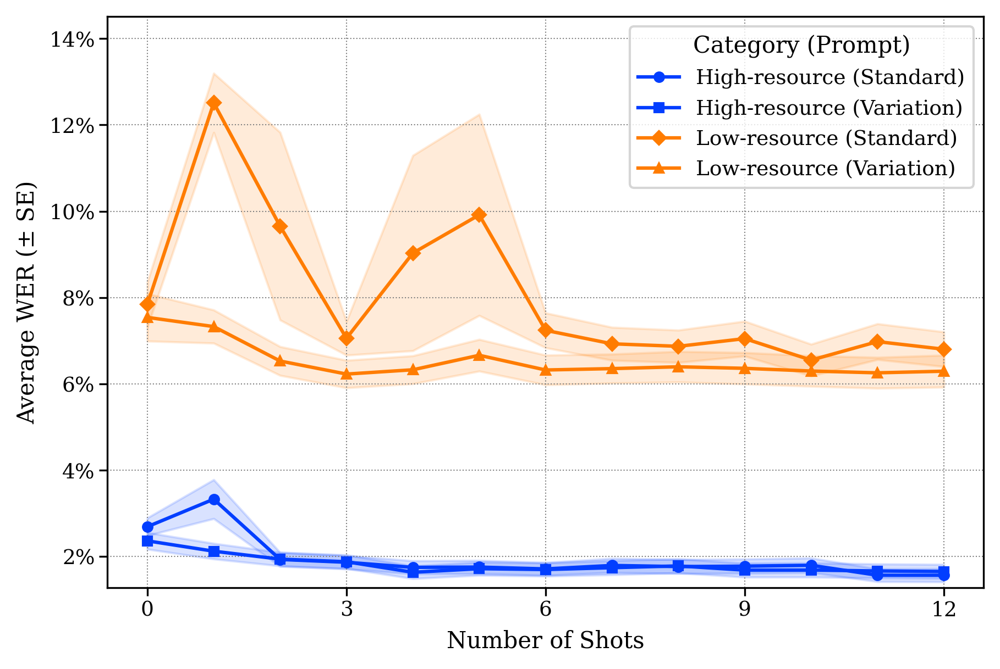

Generating iterative shot effect plot...


<ipython-input-45-5b0e44b11539>:1078: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1);


Saved: all_generated_plots/plot2_iterative_shot_effect.pdf


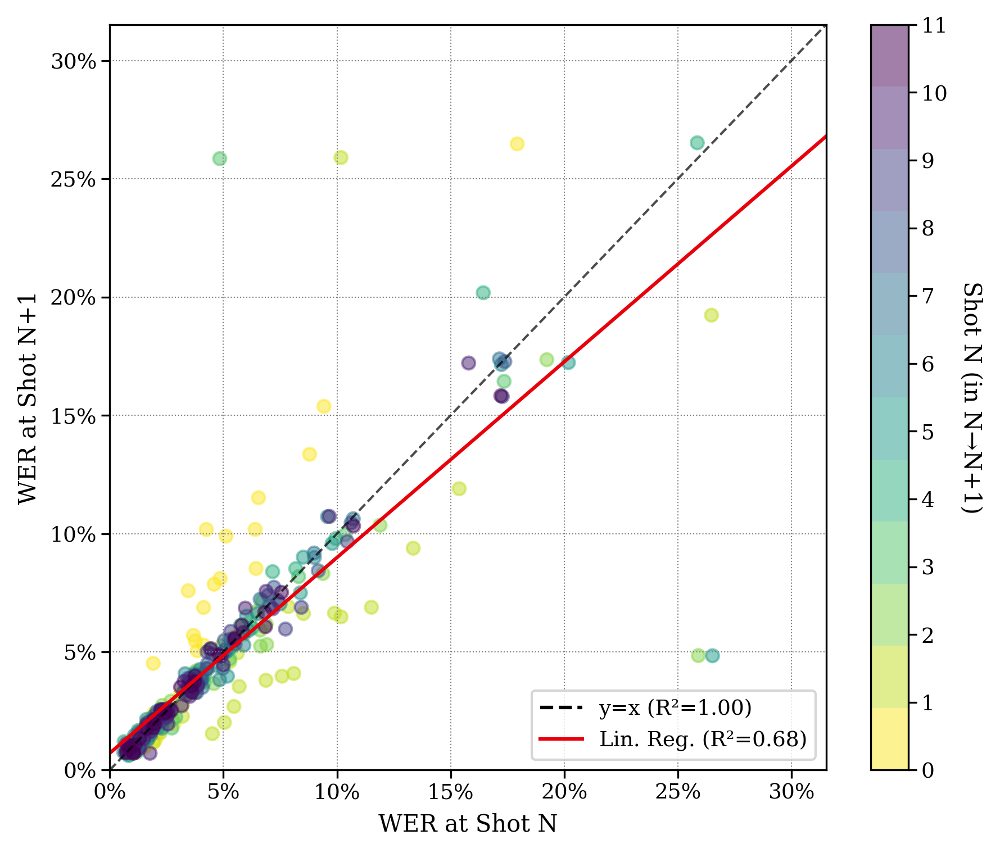

Generating violin plot (log scale)...


<ipython-input-45-5b0e44b11539>:1148: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-45-5b0e44b11539>:1148: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-45-5b0e44b11539>:1148: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
 

Saved: all_generated_plots/plot4_agg_speaker_var_violin_log.pdf


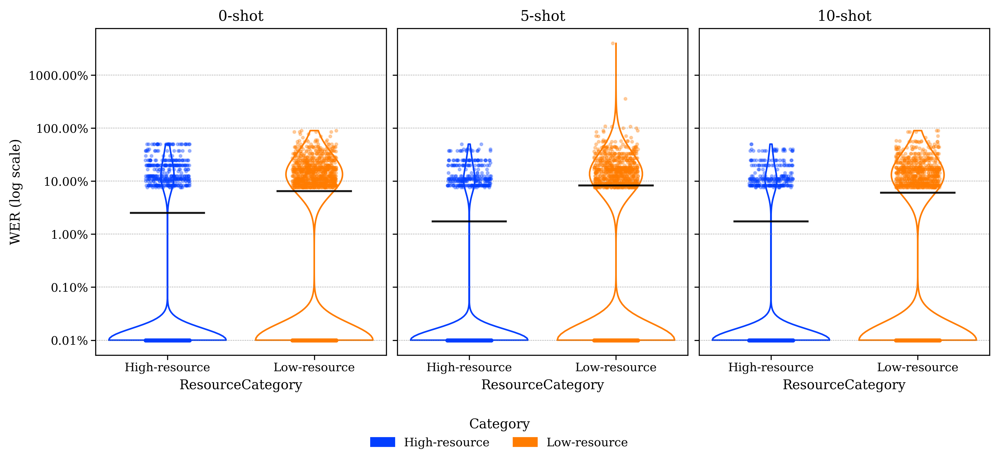

Generating corpus shot bins plot (custom groups)...
Saved: all_generated_plots/plot6_corpus_aggregated_shot_bins_custom_groups.pdf


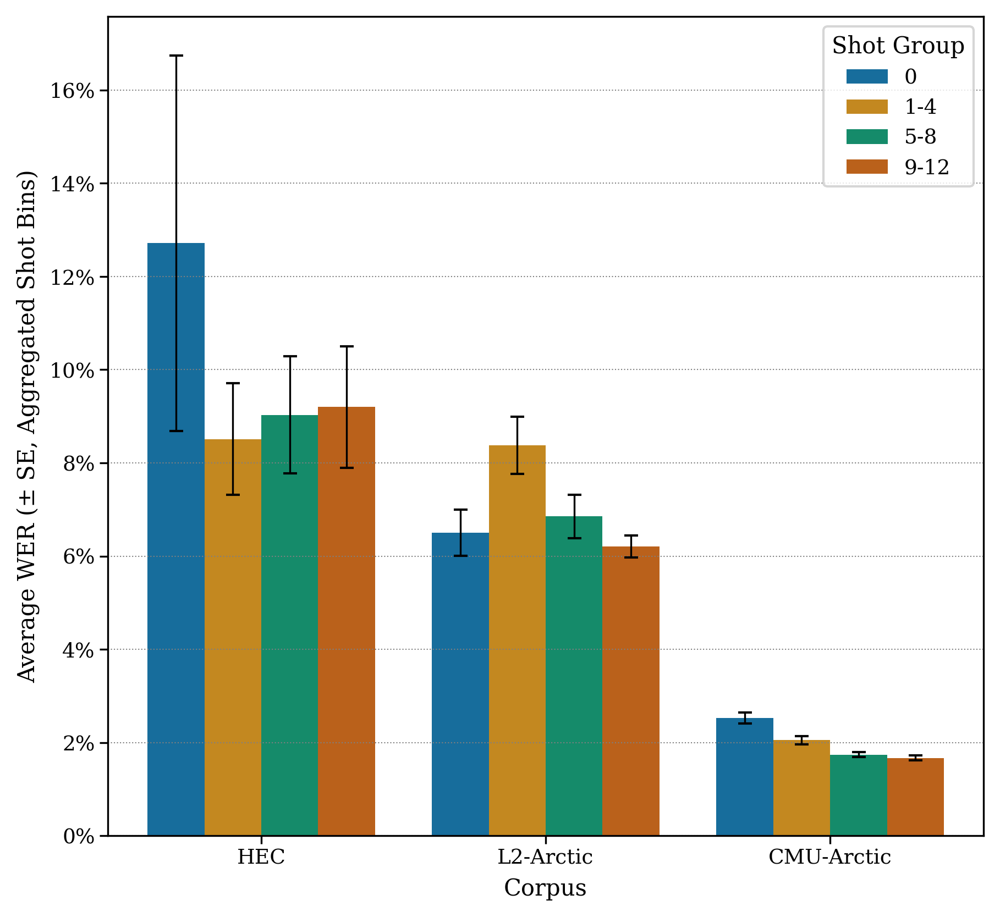

Generating marginal WER by corpus lines plot...
Saved: all_generated_plots/plot_marginal_wer_by_shot_corpus_lines.pdf


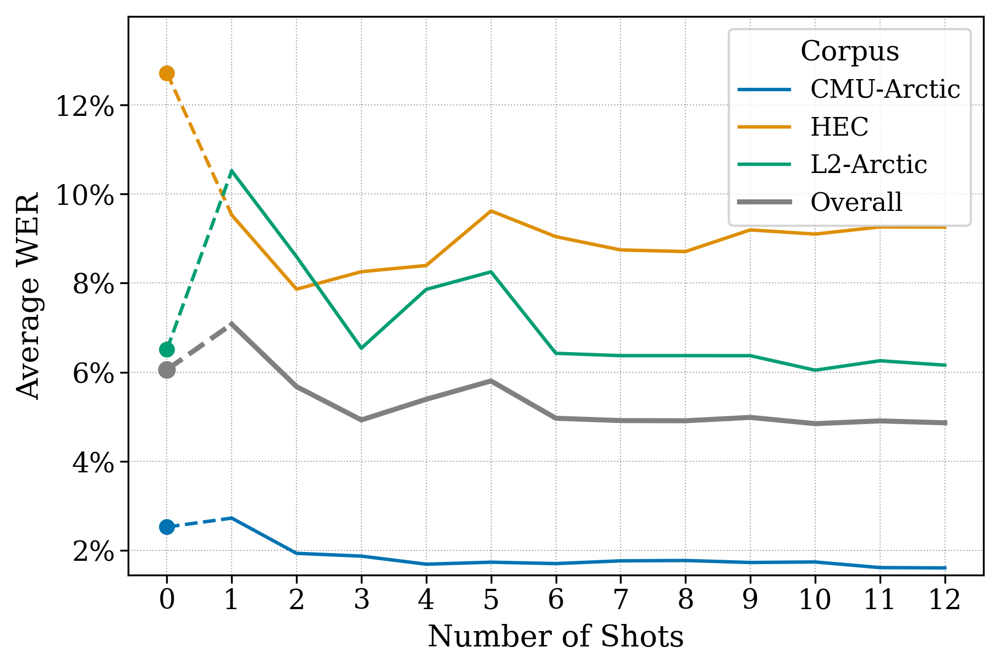

Generating overall shot bins plot (custom groups)...
Saved: all_generated_plots/plot3_overall_shot_bins_custom_groups.pdf


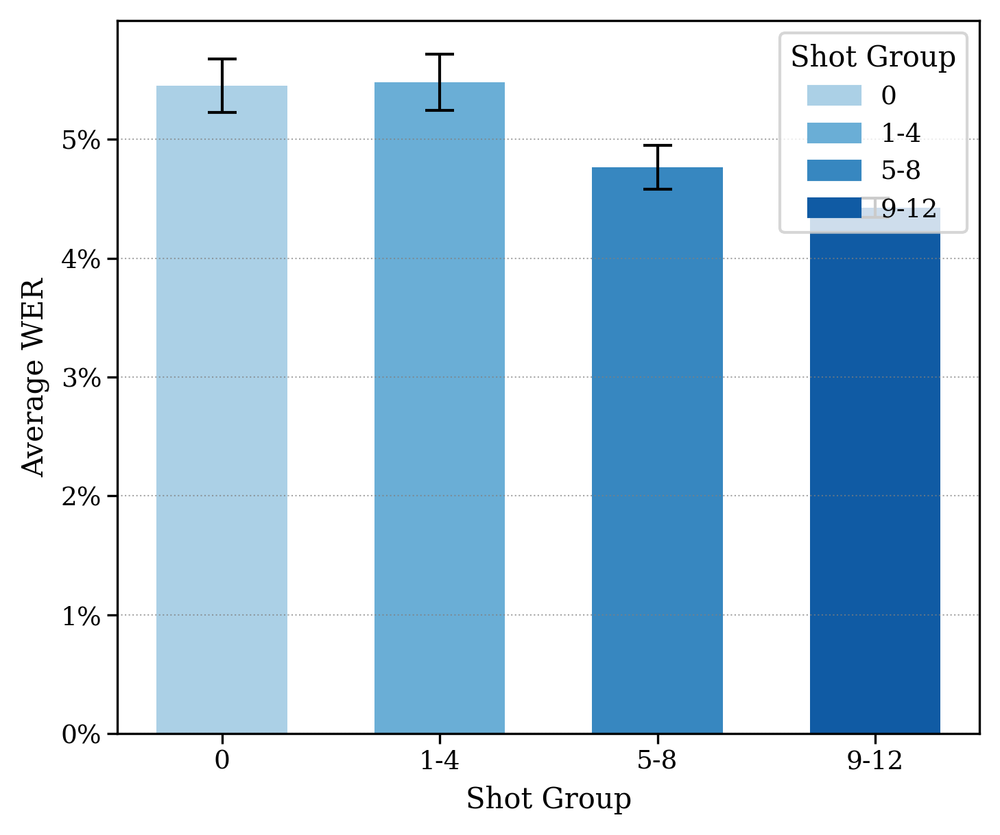

Generating combined corpus plot with average (custom groups)...
Saved: all_generated_plots/plot6_corpus_bins_combined.pdf


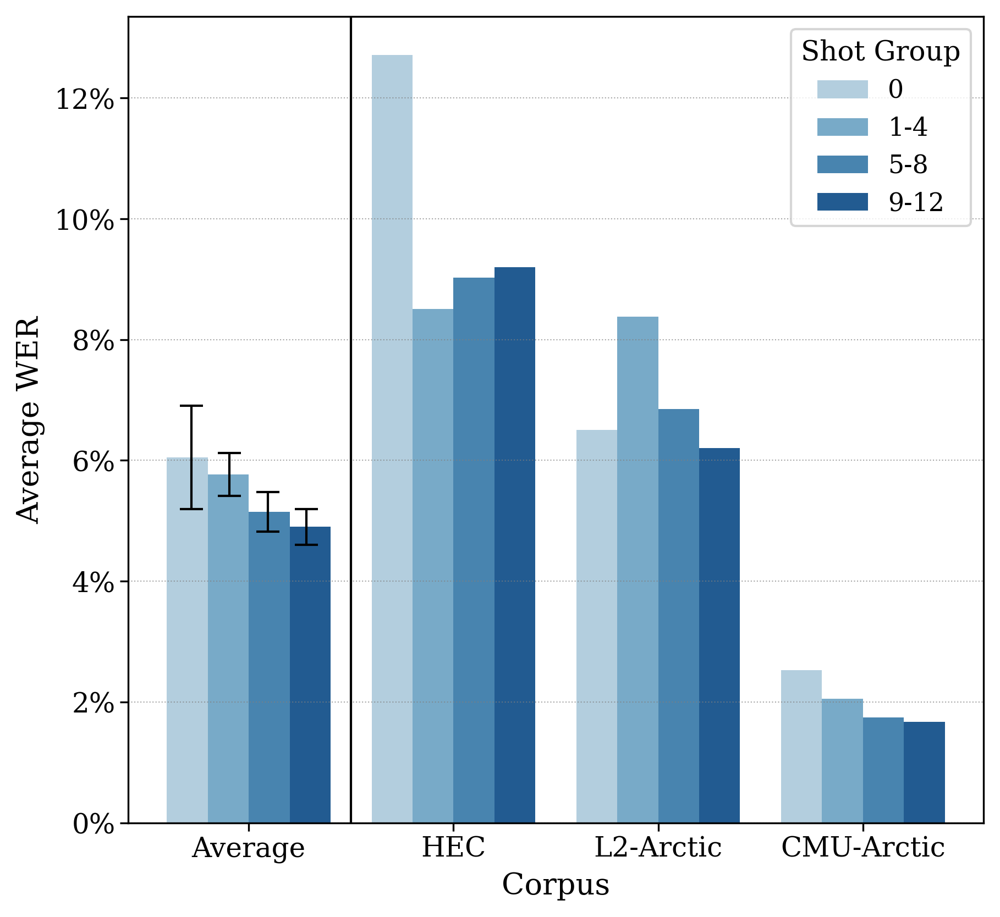


4. Generating same vs different speaker comparison...
Generating same vs diff comparison plot...
Loading same speaker results...
Loading different speaker results...
Extracting same speaker data...
Extracting different speaker data...
Same speaker dataset: 36 speakers
Different speaker dataset: 36 speakers
Total speakers (union): 36 speakers
Computing statistics...
Creating plot...

=== Statistical Tests ===
2-shot same vs different: t=-0.942, p=0.3463 
5-shot same vs different: t=-1.203, p=0.2291 
Saved: all_generated_plots/same_vs_diff_speaker_comparison.pdf


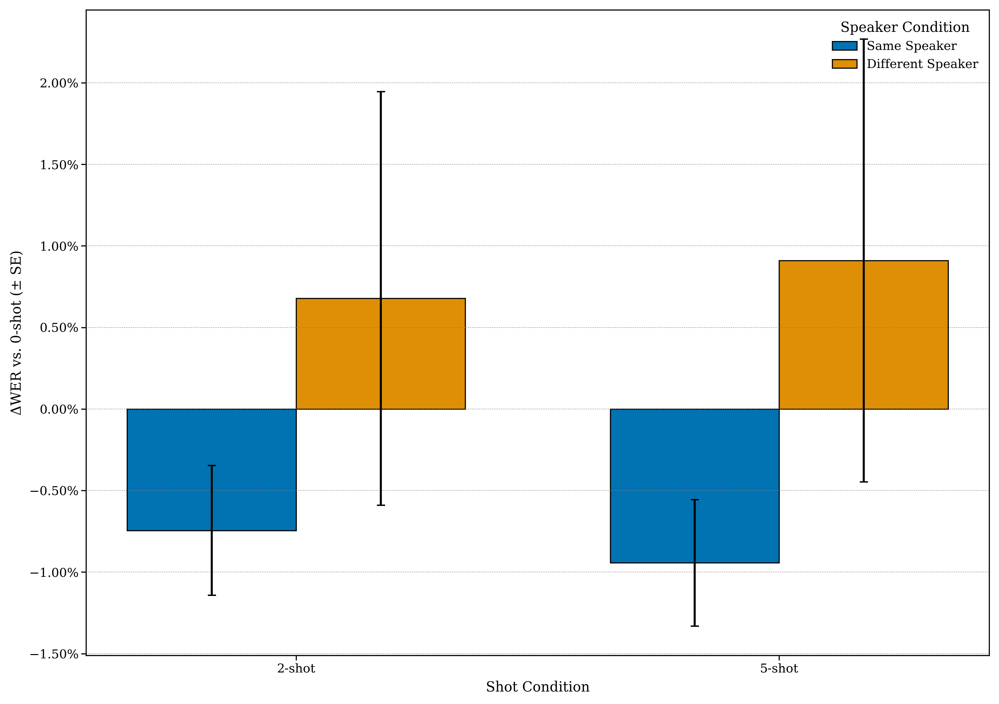


5. Generating tables...
Generating core results table (shots: [0, 5, 10])...
Generating full speaker results table...
Generating best/worst speakers table...
Generating L1 shot groups table (custom groups)...
Generating corpus/variety table...
Generating detailed core results table (legacy groups)...
Generating detailed shot groups table (custom groups)...
Generating same vs different speaker table...
Loading same speaker results...
Loading different speaker results...
Extracting same speaker data...
Extracting different speaker data...
Same speaker dataset: 36 speakers
Different speaker dataset: 36 speakers
Total speakers (union): 36 speakers
Computing statistics...
Computing statistical significance...
Creating LaTeX table...

=== LaTeX Table Summary ===
Table values (ΔWER vs 0-shot):

1-shot:
  Same Speaker: 1.48% ± 0.48%
  Different Speaker: 1.21% ± 0.47%
  Significance: t=1.027, p=0.3043 

2-shot:
  Same Speaker: -0.74% ± 0.40%
  Different Speaker: 0.68% ± 1.27%
  Significance: t

In [ ]:
# Example usage (uncomment to run):
tables = generate_all_code_and_plots(
    "all_results_summary_same.json",
    "all_results_summary_diff.json"
)

In [ ]:
SHOT_GROUPS_PRIMARY = {
    '0': (0, 0),
    **{f"{i}-{i+2}": (i, i + 2) for i in range(1, 13, 3)}
}


In [ ]:
import json
import os
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import ttest_ind # Ensure this is imported
from matplotlib.ticker import PercentFormatter # Added for ax.yaxis.set_major_formatter

# --- Assumed to be globally defined from your main script ---
# SPEAKER_METADATA, RESOURCE_MAPPING, CMU_ARCTIC_VARIETIES, HISP_ENG_ORIGINS, LANGUAGE_FAMILIES
# SHOT_GROUPS_PRIMARY = {'0': (0,0), '1-4': (1,4), '5-8': (5,8), '9-12': (9,12)}
# colors = sns.color_palette("colorblind", 10) # Or your specific palette
# load_results, extract_full_data_with_trials, add_variety_column,
# assign_shot_group, calculate_mean_se
# All plt.rcParams settings are also assumed to be active.
# --- End of assumed global definitions ---

def plot6_combined(
    same_json_path: str,
    diff_json_path: str,
    output_filename: str = "plot6_corpus_bins_combined_final.pdf",
    output_dir: str = "all_generated_plots",
    show: bool = True,
    # These can be passed if needed, but default to assumed globals
    speaker_meta: dict = None,
    resource_map: dict = None,
    cmu_varieties_map: dict = None,
    hisp_origins_map: dict = None,
    lang_families_map: dict = None,
    shot_groups_primary_map: dict = None,
    color_palette: list = None # This global 'colors' will be overridden by blue palette for this plot
):
    """
    Generates Plot 6 (Combined Corpus Shot Bins with Average) directly from JSON files.
    Assumes helper functions and constants are pre-defined or passed as arguments.
    """
    print(f"Generating {output_filename} from {same_json_path} and {diff_json_path}...")

    # Use passed arguments or fallback to assumed globals
    _speaker_meta = speaker_meta if speaker_meta is not None else SPEAKER_METADATA
    _resource_map = resource_map if resource_map is not None else RESOURCE_MAPPING
    _cmu_varieties = cmu_varieties_map if cmu_varieties_map is not None else CMU_ARCTIC_VARIETIES
    _hisp_origins = hisp_origins_map if hisp_origins_map is not None else HISP_ENG_ORIGINS
    _lang_families = lang_families_map if lang_families_map is not None else LANGUAGE_FAMILIES
    _shot_groups_primary = shot_groups_primary_map if shot_groups_primary_map is not None else SHOT_GROUPS_PRIMARY
    # _colors = color_palette if color_palette is not None else colors # Original line, kept for context but _colors won't be used for palette_final


    # 1. Load and explode both JSONs
    if not os.path.exists(same_json_path):
        print(f"Error: Same speaker file not found: {same_json_path}")
        return
    if not os.path.exists(diff_json_path):
        print(f"Error: Different speaker file not found: {diff_json_path}")
        return

    same_results = load_results(same_json_path)
    diff_results = load_results(diff_json_path)

    df_same_spk, _ = extract_full_data_with_trials(same_results, _speaker_meta, _resource_map)
    df_diff_spk, _ = extract_full_data_with_trials(diff_results, _speaker_meta, _resource_map)

    # 2. Pool the data
    df_spkshot_all = pd.concat([df_same_spk, df_diff_spk], ignore_index=True)

    if df_spkshot_all.empty:
        print(f"{output_filename}: No speaker-shot data after pooling JSONs.")
        return

    # 3. Determine max_shot_available
    max_shot_available = int(df_spkshot_all["Shot"].max()) if not df_spkshot_all.empty else 0
    print(f"Max shot available in pooled data for plot6: {max_shot_available}")

    # 4. Add 'Variety' column
    df_spkshot_all = add_variety_column(df_spkshot_all, _cmu_varieties, _hisp_origins, _lang_families)

    # --- Plotting logic adapted from plot_combined_corpus_shot_bins_with_avg ---
    df_plot_input = df_spkshot_all[df_spkshot_all["Corpus"] != "SAA"].copy()
    df_plot_input = df_plot_input[df_plot_input["Shot"] <= max_shot_available]

    df_plot_input['ShotGroup'] = df_plot_input['Shot'].apply(lambda x: assign_shot_group(x, 'primary')) # 'primary' uses updated groups
    df_plot_input = df_plot_input.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])

    if df_plot_input.empty:
        print(f"{output_filename}: No data after filtering for SAA, max_shot, and shot grouping.")
        return

    corpus_mean = (df_plot_input.groupby(["Corpus", "ShotGroup"])
                   ["WER_Speaker_Mean"].mean().reset_index())

    shot_groups_ordered_const = list(_shot_groups_primary.keys())
    first_shot_group_for_sort = shot_groups_ordered_const[0] if shot_groups_ordered_const else ""

    corpus_order = (corpus_mean[corpus_mean["ShotGroup"] == first_shot_group_for_sort]
                   .sort_values("WER_Speaker_Mean", ascending=False)
                   ["Corpus"].tolist())
    corpus_order += [c for c in sorted(corpus_mean["Corpus"].unique())
                    if c not in corpus_order]

    # Overall stats for "Average" category
    overall_list_wers_grouped = (df_plot_input.groupby("ShotGroup")["WER_Speaker_Mean"]
                                 .agg(list).reset_index())

    overall_means_list = []
    overall_ses_list = []
    overall_groups_list = []
    list_dict_for_ttest_plot6 = {}

    for group_name in shot_groups_ordered_const:
        if group_name in overall_list_wers_grouped['ShotGroup'].values:
            wers_list_current_group = overall_list_wers_grouped[overall_list_wers_grouped['ShotGroup'] == group_name]['WER_Speaker_Mean'].iloc[0]
            list_dict_for_ttest_plot6[group_name] = wers_list_current_group
            mean_val, se_val, _ = calculate_mean_se(wers_list_current_group)
            overall_means_list.append(mean_val)
            overall_ses_list.append(se_val)
            overall_groups_list.append(group_name)

    if not overall_groups_list:
        overall_plot_data = pd.DataFrame(columns=["ShotGroup", "mean", "se", "Corpus", "se_col"])
    else:
        overall_plot_data = pd.DataFrame({
            "ShotGroup": pd.Categorical(overall_groups_list, categories=shot_groups_ordered_const, ordered=True),
            "mean": overall_means_list,
            "se": overall_ses_list
        }).assign(Corpus="Average")
        overall_plot_data = overall_plot_data.sort_values("ShotGroup")
        overall_plot_data["se_col"] = overall_plot_data["se"] # For explicit SE plotting

    # Combine "Average" with per-corpus data
    plot_df_final = pd.concat([
        overall_plot_data,
        corpus_mean.rename(columns={"WER_Speaker_Mean": "mean"}).assign(se_col=np.nan)
    ], ignore_index=True)

    cat_order_final = ["Average"] + corpus_order
    plot_df_final["Corpus"] = pd.Categorical(plot_df_final["Corpus"],
                                             categories=cat_order_final, ordered=True)
    plot_df_final['ShotGroup'] = pd.Categorical(plot_df_final['ShotGroup'],
                                                categories=shot_groups_ordered_const, ordered=True)
    plot_df_final = plot_df_final.sort_values(['Corpus', 'ShotGroup']).dropna(subset=['ShotGroup'])

    present_shot_groups_ordered_final = [sg for sg in shot_groups_ordered_const if sg in plot_df_final['ShotGroup'].unique()]
    if not present_shot_groups_ordered_final:
        print(f"{output_filename}: No shot groups present in the final data for plotting.")
        return

    # MODIFICATION: Generate dark to light blue color palette
    num_colors = len(present_shot_groups_ordered_final)
    if num_colors > 0:
        # "Blues_r" palette goes from dark to light blue
        custom_blue_palette = sns.color_palette("Blues_r", n_colors=num_colors)
    else:
        custom_blue_palette = []
    palette_final = dict(zip(present_shot_groups_ordered_final, custom_blue_palette))


    fig_w_final = max(6.5, 0.95 * len(cat_order_final))
    fig, ax = plt.subplots(figsize=(fig_w_final, 5.8))

    # MODIFICATION: total_w_bars_final reduced for more space, and passed to barplot via 'width'
    total_w_bars_final = 0.7 # Reduced from 0.75 to create more space around the separator line

    sns.barplot(x="Corpus", y="mean", hue="ShotGroup",
                data=plot_df_final, order=cat_order_final, hue_order=present_shot_groups_ordered_final,
                palette=palette_final, errorbar=None, ax=ax, width=total_w_bars_final) # MODIFICATION: Added width

    # single_bar_width_final depends on total_w_bars_final, so it's updated implicitly
    single_bar_width_final = total_w_bars_final / len(present_shot_groups_ordered_final) if len(present_shot_groups_ordered_final) > 0 else 0
    avg_cat_idx_val_final = cat_order_final.index("Average") if "Average" in cat_order_final else -1

    if avg_cat_idx_val_final != -1 and single_bar_width_final > 0 : # Ensure single_bar_width_final is positive
        avg_category_data_for_ebar_final = plot_df_final[(plot_df_final['Corpus'] == "Average") & (plot_df_final['se_col'].notna())]
        for _, row in avg_category_data_for_ebar_final.iterrows():
            if row["se_col"] > 0:
                try:
                    h_idx = present_shot_groups_ordered_final.index(row["ShotGroup"])
                    # This calculation correctly centers the error bar on the bar
                    # when sns.barplot's 'width' matches total_w_bars_final.
                    x_center_of_bar = avg_cat_idx_val_final - total_w_bars_final/2 + single_bar_width_final/2 + h_idx*single_bar_width_final
                    ax.errorbar(x_center_of_bar, row["mean"], yerr=row["se_col"],
                                fmt='none', color='black', capsize=3, elinewidth=1, zorder=5)
                except ValueError:
                    pass

        # Significance star for "Average" category
        if len(present_shot_groups_ordered_final) >= 2:
            first_g_sig = present_shot_groups_ordered_final[0]
            last_g_sig = present_shot_groups_ordered_final[-1]
            data_first_g = list_dict_for_ttest_plot6.get(first_g_sig, [])
            data_last_g = list_dict_for_ttest_plot6.get(last_g_sig, [])

            data_first_g_clean = [x for x in data_first_g if pd.notna(x)]
            data_last_g_clean = [x for x in data_last_g if pd.notna(x)]

            if len(data_first_g_clean) > 1 and len(data_last_g_clean) > 1:
                p_val_sig = ttest_ind(data_first_g_clean, data_last_g_clean, equal_var=False, nan_policy="omit").pvalue
                star_txt_sig = "***" if p_val_sig < 0.01 else "**" if p_val_sig < 0.05 else ""

                if star_txt_sig:
                    mean_first_overall = overall_plot_data[overall_plot_data["ShotGroup"] == first_g_sig]["mean"].iloc[0]
                    mean_last_overall = overall_plot_data[overall_plot_data["ShotGroup"] == last_g_sig]["mean"].iloc[0]

                    y_bracket_base_sig = max(mean_first_overall, mean_last_overall) * 1.08
                    y_bracket_tip_sig  = max(mean_first_overall, mean_last_overall) * 1.11

                    x_first_bar_overall = avg_cat_idx_val_final - total_w_bars_final/2 + single_bar_width_final/2 + present_shot_groups_ordered_final.index(first_g_sig)*single_bar_width_final
                    x_last_bar_overall = avg_cat_idx_val_final - total_w_bars_final/2 + single_bar_width_final/2 + present_shot_groups_ordered_final.index(last_g_sig)*single_bar_width_final

                    ax.plot([x_first_bar_overall, x_first_bar_overall, x_last_bar_overall, x_last_bar_overall],
                            [y_bracket_base_sig, y_bracket_tip_sig, y_bracket_tip_sig, y_bracket_base_sig],
                            color='black', linewidth=0.8)
                    ax.text((x_first_bar_overall + x_last_bar_overall) / 2, y_bracket_tip_sig * 1.005, star_txt_sig,
                            ha='center', va='bottom', fontsize=10, color='black')

        # Separator line
        # The reduction of total_w_bars_final will create more space on either side of this line
        if len(cat_order_final) > 1 :
             ax.axvline(x=avg_cat_idx_val_final + 0.5, color='dimgrey', linewidth=1.0, linestyle=':')

    # Styling
    ax.set_xlabel("Corpus", fontsize=10)
    ax.set_ylabel("Average WER", fontsize=10)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.grid(True, axis='y', linestyle=':', alpha=0.5)
    ax.tick_params(axis='x', labelsize=9, pad=3)
    ax.tick_params(axis='y', labelsize=9)

    plt.setp(ax.get_xticklabels(), rotation=0, ha='center')

    legend_handles, legend_labels = ax.get_legend_handles_labels()
    ax.legend(legend_handles, legend_labels, title="Shot Group", loc="upper right",
              fontsize=8, title_fontsize=9, frameon=False)

    plt.subplots_adjust(bottom=0.15, left=0.1)
    # plt.tight_layout(pad=0.5)

    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        save_path = os.path.join(output_dir, output_filename)
        try:
            plt.savefig(save_path, dpi=300)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (output_dir is None).")

    if show:
        plt.show()

    plt.close(fig)

Generating plot6_corpus_bins_combined_final.pdf from /content/all_results_summary_same.json and /content/all_results_summary_diff.json...
Max shot available in pooled data for plot6: 12
Saved: all_generated_plots/plot6_corpus_bins_combined_final.pdf


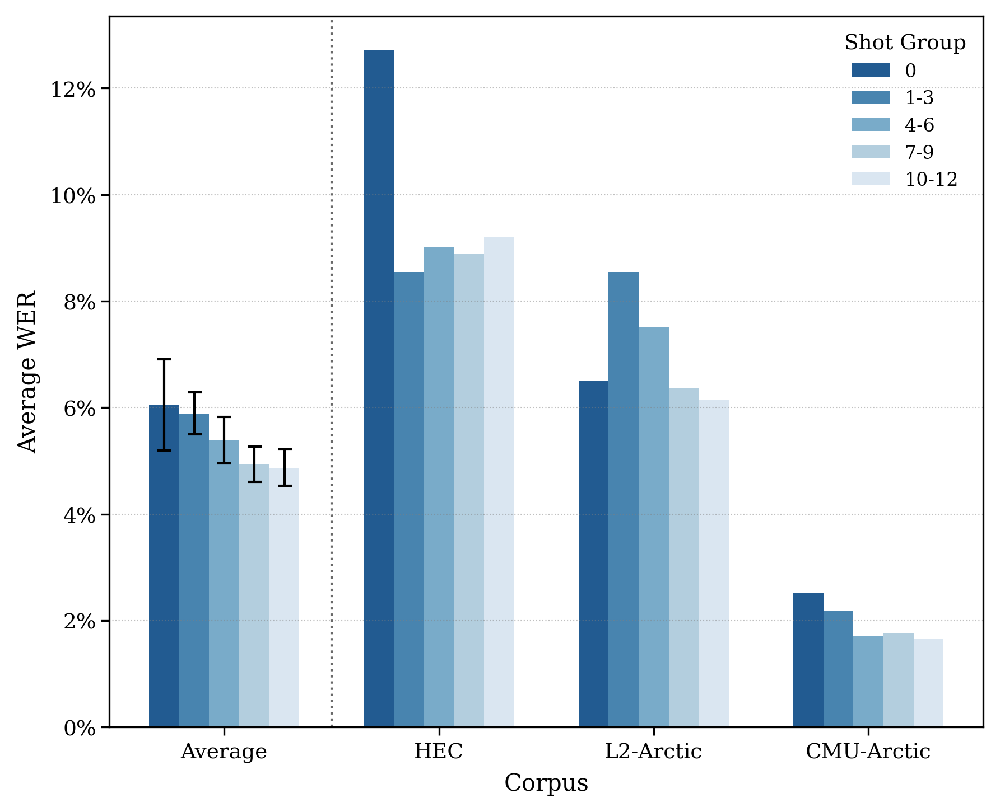

In [ ]:
plot6_combined(
    same_json_path="/content/all_results_summary_same.json",
    diff_json_path="/content/all_results_summary_diff.json",
    show=True
)

{'0': (0, 0), '1-6': (1, 6), '7-12': (7, 12)}

In [ ]:
import json
import os
import itertools
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.ticker import PercentFormatter, MaxNLocator, LogFormatterSciNotation, ScalarFormatter, FuncFormatter
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import ttest_ind

# --- Configuration & Styling (ACL/EMNLP Best Practices) ---
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'serif'],
    'font.sans-serif': ['DejaVu Sans', 'sans-serif'],
    'font.size': 10,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 0.8,
    'grid.color': 'grey',
    'grid.linestyle': ':',
    'grid.linewidth': 0.5,
    'xtick.major.pad': 2,
    'ytick.major.pad': 2,
    'figure.autolayout': False # Set to False to allow tight_layout to work as expected
})

# --- Shot Group Constants for Consistency ---
SHOT_GROUPS_PRIMARY = {
    '0-3': (0, 3),
    '4-8': (4,8),
    '9-12': (9,12)
}

SHOT_GROUPS_02_36_710 = {'0-2': (0, 2), '3-6': (3, 6), '7-10': (7, 10)}
SHOT_GROUPS_05_610 = {'0-5': (0, 5), '6-10': (6, 10)}


def assign_shot_group(shot: int, group_type: str = 'primary',
                      shot_groups_map_override: dict | None = None) -> str | None:
    """
    Assign shot groups consistently across the codebase.

    Args:
        shot: The shot number
        group_type: 'primary', '02_36_710', or '05_610'
        shot_groups_map_override: Optionally provide a custom map.
    """
    if shot_groups_map_override:
        groups_map = shot_groups_map_override
    elif group_type == 'primary':
        groups_map = SHOT_GROUPS_PRIMARY
    elif group_type == '02_36_710':
        groups_map = SHOT_GROUPS_02_36_710
    elif group_type == '05_610':
        groups_map = SHOT_GROUPS_05_610
    else:
        raise ValueError(f"Unknown group_type: {group_type}")

    for group_name, (min_shot, max_shot) in groups_map.items():
        if min_shot <= shot <= max_shot:
            return group_name
    return None

colors = sns.color_palette("colorblind", 10)
bright_colors = sns.color_palette("bright", 10)
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'H']

# --- Speaker and Resource Metadata ( 그대로 유지 )---
SPEAKER_METADATA = {
    'ABA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'SKA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'YBAA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ZHAA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'BWC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'LXC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'NCC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TXHC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'ASI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'RRBI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'SVBI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TNI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HJK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'HKK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'YDCK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'YKWK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'EBVS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ERMS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'MBMPS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'NJS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HQTV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'PNV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'THV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TLV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'bdl': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slt': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'jmk': {'l1': 'Canadian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'awb': {'l1': 'Scottish English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'rms': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'clb': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'ksp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aew': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ahw': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aup': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'axb': {'l1': 'Indian English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'eey': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'fem': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'gka': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ljm': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'lnh': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'rxr': {'l1': 'Israeli English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
}
RESOURCE_MAPPING = {
    'l2-arctic': {'name': 'L2-Arctic', 'category': 'Low-resource'},
    'hisp-eng': {'name': 'HEC', 'category': 'Low-resource'},
    'saa': {'name': 'SAA', 'category': 'Low-resource'},
    'sandi': {'name': 'SANDI', 'category': 'Low-resource'},
    'cmu-arctic': {'name': 'CMU-Arctic', 'category': 'High-resource'},
}
RESOURCE_CATEGORY_PALETTE = {
    'High-resource': bright_colors[0],
    'Low-resource': bright_colors[1],
    'Unknown': 'grey'
}
HISP_ENG_ORIGINS = {
    '0': None, '1': 'Argentina', '2': 'Mexico', '3': 'Argentina', '4': 'Argentina',
    '5': 'Argentina', '6': 'Argentina', '7': None, '8': None, '9': None, '10': None,
    '11': None, '12': None, '13': None, '14': None, '15': None, '16': None, '17': None,
    '18': 'Argentina', '19': 'Chile'
}
CMU_ARCTIC_VARIETIES = {
    'aew': 'US English', 'ahw': 'German English', 'aup': 'Indian English',
    'axb': 'Indian English', 'eey': 'US English', 'fem': 'German English',
    'gka': 'Indian English', 'ljm': 'US English', 'lnh': 'US English',
    'rxr': 'Israeli English', 'slp': 'Indian English'
}
LANGUAGE_FAMILIES = {
    'afrikaans': 'Germanic', 'agni': 'Niger-Congo', 'albanian': 'Indo-European (Albanian)',
    'amharic': 'Afro-Asiatic (Cushitic)', 'arabic': 'Afro-Asiatic (Semitic)',
    'armenian': 'Indo-European (Armenian)', 'azerbaijani': 'Turkic', 'bafang': 'Niger-Congo',
    'baga': 'Niger-Congo', 'bai': 'Sino-Tibetan', 'bambara': 'Niger-Congo',
    'bamun': 'Niger-Congo', 'basque': 'Language Isolate', 'bengali': 'Indo-European (Indo-Aryan)',
    'bosnian': 'Indo-European (Slavic)', 'bulgarian': 'Indo-European (Slavic)',
    'cantonese': 'Sino-Tibetan', 'carolinian': 'Austronesian', 'catalan': 'Indo-European (Romance)',
    'chamorro': 'Austronesian', 'czech': 'Indo-European (Slavic)', 'danish': 'Germanic',
    'dari': 'Indo-European (Iranian)', 'dutch': 'Germanic', 'ebira': 'Niger-Congo',
    'edo': 'Niger-Congo', 'english': 'Germanic'
}

# Global variable to be set by analyze_data() for plotting functions
_ANALYSIS_OUTPUT_DIR = None

# --- Utility and Data Extraction Functions ---
def load_results(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

def split_composite_speaker(s):
    if isinstance(s, str) and '_' in s:
        code, speaker = s.split('_', 1)
        return code, speaker
    return None, s

def calculate_mean_se(wer_values):
    if not isinstance(wer_values, (list, np.ndarray, pd.Series)):
        if isinstance(wer_values, (int, float)) and pd.notna(wer_values) and wer_values >= 0:
            return wer_values, 0.0, 1
        return np.nan, np.nan, 0
    if isinstance(wer_values, pd.Series): wer_values = wer_values.tolist()
    elif isinstance(wer_values, np.ndarray): wer_values = wer_values.tolist()
    if not wer_values: return np.nan, np.nan, 0
    valid_wers = [w for w in wer_values if pd.notna(w) and w >= 0]
    n = len(valid_wers)
    if n == 0: return np.nan, np.nan, 0
    elif n == 1: return valid_wers[0], 0.0, 1
    else:
        mean = np.mean(valid_wers)
        se = stats.sem(valid_wers, ddof=1, nan_policy='omit')
        if pd.isna(se) or np.isclose(se, 0): se = 0.0
        return mean, se, n

def extract_full_data_with_trials(results_data, speaker_metadata_map, resource_map):
    trial_records = []
    speaker_shot_records = []
    for dataset_key, ds_content in results_data.items():
        if dataset_key not in resource_map: continue
        ds_meta = resource_map[dataset_key]
        for prompt_type, prompt_content in ds_content.items():
            for shot_tag, shot_block in prompt_content.items():
                if not shot_tag.startswith("shot"): continue
                shot = int(shot_tag[4:])
                if "speakers" not in shot_block: continue
                for raw_key, spk_json in shot_block["speakers"].items():
                    var_code, spk_code = split_composite_speaker(raw_key)
                    meta = speaker_metadata_map.get(spk_code.upper(), {})
                    l1 = meta.get("l1", "Unknown"); gender = meta.get("gender", "Unknown")
                    wer_vals = spk_json.get(f"{shot_tag}_wer_values", [])
                    mean, se, n = calculate_mean_se(wer_vals)
                    speaker_shot_records.append({
                        "DatasetKey": dataset_key, "Corpus": ds_meta["name"],
                        "ResourceCategory": ds_meta["category"], "Speaker": spk_code,
                        "VarietyID": var_code, "L1": l1, "Gender": gender,
                        "PromptType": prompt_type, "Shot": shot,
                        "WER_Speaker_Mean": mean, "WER_Speaker_SE": se,
                        "Num_Trials_Speaker": n,
                    })
                    for w in wer_vals:
                        if pd.notna(w) and w >= 0:
                            trial_records.append({
                                "DatasetKey": dataset_key, "Corpus": ds_meta["name"],
                                "ResourceCategory": ds_meta["category"], "Speaker": spk_code,
                                "VarietyID": var_code, "L1": l1, "Gender": gender,
                                "PromptType": prompt_type, "Shot": shot, "WER_Trial": w,
                            })
    df_speaker_shot = pd.DataFrame(speaker_shot_records)
    df_trials = pd.DataFrame(trial_records)
    for df in [df_speaker_shot, df_trials]:
        if not df.empty:
            numeric_cols = ['WER_Speaker_Mean', 'WER_Speaker_SE', 'Num_Trials_Speaker', 'WER_Trial', 'Shot']
            for col in numeric_cols:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
    return df_speaker_shot, df_trials

def add_variety_column(df, cmu_varieties_map, hisp_origins_map, lang_families_map):
    df_out = df.copy()
    df_out['Variety'] = df_out['L1']
    cmu_mask = df_out['DatasetKey'] == 'cmu-arctic'
    if cmu_mask.any():
        speaker_lower = df_out.loc[cmu_mask, 'Speaker'].str.lower()
        df_out.loc[cmu_mask, 'Variety'] = speaker_lower.map(cmu_varieties_map).fillna('–')
    l2_mask = df_out['DatasetKey'] == 'l2-arctic'
    if l2_mask.any():
        l2_map = {'1': 'Hindi', '2': 'Korean', '3': 'Mandarin', '4': 'Spanish', '5': 'Vietnamese'}
        variety_id_str = df_out.loc[l2_mask, 'VarietyID'].astype(str).str.strip()
        df_out.loc[l2_mask, 'Variety'] = variety_id_str.map(l2_map).fillna('–')
    hisp_mask = df_out['DatasetKey'] == 'hisp-eng'
    if hisp_mask.any():
        variety_id_str = df_out.loc[hisp_mask, 'VarietyID'].astype(str).str.strip()
        df_out.loc[hisp_mask, 'Variety'] = variety_id_str.map(hisp_origins_map).fillna('–')
    saa_mask = df_out['DatasetKey'] == 'saa'
    if saa_mask.any(): df_out.loc[saa_mask, 'Variety'] = 'SAA'
    return df_out

# --- LaTeX Table Generation Functions ( 그대로 유지 )---
def format_wer_se_latex(mean, se, precision=1):
    if isinstance(mean, pd.Series): mean = mean.iloc[0] if not mean.empty else np.nan
    if isinstance(se, pd.Series): se = se.iloc[0] if not se.empty else np.nan
    if pd.isna(mean) or mean is None: return "–"
    mean_pct = mean * 100
    if pd.isna(se) or se is None or abs(se * 100) < (0.1**(precision + 1)): return f"{mean_pct:.{precision}f}"
    se_pct = abs(se * 100); return f"{mean_pct:.{precision}f}~($\\pm${se_pct:.{precision}f})"

def format_wer_latex(mean, precision=1):
    if isinstance(mean, pd.Series): mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean): return "–"; return f"{mean * 100:.{precision}f}"

def format_wer_latex_simple(mean, precision=1, as_percentage=True):
    if isinstance(mean, pd.Series): mean = mean.iloc[0] if not mean.empty else np.nan
    if pd.isna(mean) or mean is None: return "–"
    value = mean * 100 if as_percentage else mean; return f"{value:.{precision}f}"

def generate_table1_core_results(df_speaker_shot_data, shots_to_report, caption, label):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 1}\n"
    df_agg = df_speaker_shot_data[df_speaker_shot_data['Shot'].isin(shots_to_report)].groupby(['ResourceCategory', 'Shot'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_agg = pd.concat([df_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_agg.pivot_table(index='ResourceCategory', columns='Shot', values=['mean_wer', 'se_wer'])
    expected_metrics = ['mean_wer', 'se_wer']; shots_to_report_int = [int(s) for s in shots_to_report]
    expected_cols_tuples = pd.MultiIndex.from_product([expected_metrics, shots_to_report_int], names=['metric', 'Shot'])
    if not df_pivot.empty:
        df_pivot.columns = pd.MultiIndex.from_tuples([(col[0], int(col[1])) for col in df_pivot.columns], names=['metric', 'Shot'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples)
    else:
        known_categories = pd.Index(df_speaker_shot_data['ResourceCategory'].unique(), name='ResourceCategory')
        df_pivot = pd.DataFrame(columns=expected_cols_tuples, index=known_categories)
    latex_str = "\\begin{table*}[htbp]\n\\centering\n"
    latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shots_to_report_int); col_format = "l" + "c" * num_shot_cols
    latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header = "Resource Category & " + " & ".join([f"{s}-shot WER (\%)" for s in shots_to_report_int]) + " \\\\\n\\midrule\n"; latex_str += header
    categories = ['High-resource', 'Low-resource']
    for cat in categories:
        cat_latex = cat.replace('-', '\\textnormal{-}')
        if cat in df_pivot.index:
            row_data = [cat_latex]
            for shot in shots_to_report_int:
                if ('mean_wer', shot) in df_pivot.columns: mean_val = df_pivot.loc[cat, ('mean_wer', shot)]; mean_val = mean_val.iloc[0] if isinstance(mean_val, pd.Series) else mean_val
                else: mean_val = np.nan
                if ('se_wer', shot) in df_pivot.columns: se_val = df_pivot.loc[cat, ('se_wer', shot)]; se_val = se_val.iloc[0] if isinstance(se_val, pd.Series) else se_val
                else: se_val = np.nan
                row_data.append(format_wer_se_latex(mean_val, se_val))
            latex_str += " & ".join(row_data) + " \\\\\n"
        else: latex_str += f"{cat_latex} & " + " & ".join(["–"] * num_shot_cols) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_table2_appendix_full(df_speaker_shot_data, max_shot_to_display, caption, label):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 2}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'DatasetKey', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_pivot = df_prompt_agg[df_prompt_agg['Shot'] <= max_shot_to_display].pivot_table(index=['Corpus', 'Speaker', 'L1', 'ResourceCategory'], columns='Shot', values='WER_Speaker_Mean').reset_index()
    df_pivot = df_pivot.sort_values(['Corpus', 'Speaker'])
    shot_columns = sorted([s for s in df_pivot.columns if isinstance(s, int) and s <= max_shot_to_display])
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns); col_format = "lllr" + "c" * num_shot_cols; latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-sh" for s in shot_columns]); header = "Corpus & Speaker & L1 & Resource & " + header_shots + " \\\\\n\\midrule\n"; latex_str += header
    for _, row in df_pivot.iterrows():
        l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A'; res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A'; res_cat_fmt = res_cat_str.replace('-resource','').title()
        row_data = [row['Corpus'], row['Speaker'], l1_str, res_cat_fmt]
        for shot in shot_columns: row_data.append(format_wer_latex(row.get(shot, np.nan)))
        latex_str += " & ".join(map(str, row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_table3_best_worst_speakers(df_speaker_shot_data, n_shot_compare, num_speakers_each=5, caption="Best and Worst Performing Speakers", label="tab:best_worst_speakers"):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 3}\n"
    df_prompt_agg = df_speaker_shot_data.groupby(['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    df_0_shot = df_prompt_agg[df_prompt_agg['Shot'] == 0].rename(columns={'WER_Speaker_Mean': 'WER_0_shot'}); df_n_shot = df_prompt_agg[df_prompt_agg['Shot'] == n_shot_compare].rename(columns={'WER_Speaker_Mean': f'WER_{n_shot_compare}_shot'})
    if df_0_shot.empty or df_n_shot.empty: return f"\\textit{{Missing shot data for Table 3 (0-shot or {n_shot_compare}-shot).}}\n"
    df_merged = pd.merge(df_0_shot[['Corpus', 'ResourceCategory', 'Speaker', 'L1', 'WER_0_shot']], df_n_shot[['Speaker', f'WER_{n_shot_compare}_shot']], on='Speaker', how='inner')
    if df_merged.empty: return f"\\textit{{No speakers with both 0-shot and {n_shot_compare}-shot data for Table 3.}}\n"
    df_merged['Delta_WER'] = df_merged['WER_0_shot'] - df_merged[f'WER_{n_shot_compare}_shot']
    sections = {
        f"Top {num_speakers_each} by 0-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, 'WER_0_shot'),
        f"Bottom {num_speakers_each} by 0-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, 'WER_0_shot'),
        f"Top {num_speakers_each} by {n_shot_compare}-shot WER (Lower is Better)": df_merged.nsmallest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Bottom {num_speakers_each} by {n_shot_compare}-shot WER (Higher is Worse)": df_merged.nlargest(num_speakers_each, f'WER_{n_shot_compare}_shot'),
        f"Top {num_speakers_each} by Delta WER (Largest Improvement)": df_merged.nlargest(num_speakers_each, 'Delta_WER'),
    }
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption} (0-shot vs. {n_shot_compare}-shot WERs as percentages).}}\n\\label{{{label}}}\n"
    latex_str += "\\begin{tabular}{lllccccc}\n\\toprule\n"; latex_str += "Category & Corpus & Speaker & L1 & Resource & 0-shot & N-shot & Delta \\\\\n\\midrule\n"
    first_section = True
    for title, df_section in sections.items():
        if not first_section: latex_str += "\\midrule\n";
        first_section = False
        latex_str += f"\\multicolumn{{8}}{{l}}{{\\textit{{{title}}}}} \\\\\n"
        if df_section.empty: latex_str += "\\multicolumn{8}{l}{\\textit{No data for this section}} \\\\\n"; continue
        for _, row in df_section.iterrows():
            l1_str = str(row['L1']) if pd.notna(row['L1']) else 'N/A'; res_cat_str = str(row['ResourceCategory']) if pd.notna(row['ResourceCategory']) else 'N/A'; res_cat_fmt = res_cat_str.replace('-resource','').title()
            row_data = ["", row['Corpus'], row['Speaker'], l1_str, res_cat_fmt, format_wer_latex(row['WER_0_shot']), format_wer_latex(row[f'WER_{n_shot_compare}_shot']), format_wer_latex(row['Delta_WER'])]
            latex_str += " & ".join(map(str,row_data)) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_table4_l1_shot_groups(df_speaker_shot_data, max_shot_overall, caption, label):
    if df_speaker_shot_data.empty: return "\\textit{No data available for Table 4}\n"
    df_copy = df_speaker_shot_data.copy()
    df_copy['ShotGroup'] = df_copy['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df_copy = df_copy[df_copy['Shot'] <= max_shot_overall]; df_copy = df_copy.dropna(subset=['ShotGroup', 'WER_Speaker_Mean', 'L1'])
    if df_copy.empty: return "\\textit{No data after shot grouping for Table 4}\n"
    df_l1_agg = df_copy.groupby(['L1', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    num_speakers_per_l1 = df_copy.groupby('L1')['Speaker'].nunique().reset_index().rename(columns={'Speaker': 'num_speakers_unique'})
    stats_calc = df_l1_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_l1_agg = pd.concat([df_l1_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_pivot = df_l1_agg.pivot_table(index='L1', columns='ShotGroup', values=['mean_wer', 'se_wer'])
    shot_group_cols_present = sorted([sg for sg in SHOT_GROUPS_PRIMARY.keys() if sg in df_l1_agg['ShotGroup'].unique()], key=lambda x: list(SHOT_GROUPS_PRIMARY.keys()).index(x))
    expected_metrics = ['mean_wer', 'se_wer']
    if not df_pivot.empty and shot_group_cols_present:
        expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
        df_pivot = df_pivot.reindex(columns=expected_cols_tuples_l1); df_pivot = df_pivot.reindex(index=sorted(df_pivot.index))
    else:
        unique_l1s = pd.Index(df_copy['L1'].unique(), name='L1').sort_values()
        if shot_group_cols_present:
            expected_cols_tuples_l1 = pd.MultiIndex.from_product([expected_metrics, shot_group_cols_present], names=['metric', 'ShotGroup'])
            df_pivot = pd.DataFrame(columns=expected_cols_tuples_l1, index=unique_l1s)
        else: df_pivot = pd.DataFrame(index=unique_l1s)
    df_pivot_reset = df_pivot.reset_index(); df_pivot_reset = df_pivot_reset.loc[:, ~df_pivot_reset.columns.duplicated()]
    speaker_count_map = num_speakers_per_l1.set_index('L1')['num_speakers_unique'].to_dict()
    if 'L1' in df_pivot_reset.columns: df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
    else:
        df_pivot_reset = df_pivot_reset.reset_index()
        if 'L1' in df_pivot_reset.columns: df_pivot_reset['num_speakers_unique'] = df_pivot_reset['L1'].map(speaker_count_map)
        else: df_pivot_reset['num_speakers_unique'] = 0
    df_merged_pivot = df_pivot_reset
    latex_str = "\\begin{table}[htbp]\n\\centering\n"; latex_str += f"\\caption{{{caption.replace('Confidence Intervals', 'Standard Errors (SE)')}}}\n\\label{{{label}}}\n"
    header_groups_display_names = shot_group_cols_present
    col_format = "lc" + "c" * len(header_groups_display_names); latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_text_groups = " & ".join([f"WER {sg} Shots (\%)" if len(sg) > 2 else f"WER {sg}-Shot (\%)" for sg in header_groups_display_names])
    latex_str += "L1 & Num. Spk. & " + header_text_groups + " \\\\\n\\midrule\n"
    for _, row in df_merged_pivot.iterrows():
        l1_val = row['L1']; l1 = str(l1_val.iloc[0] if isinstance(l1_val, pd.Series) else l1_val)
        num_spk_val = row.get('num_speakers_unique', np.nan); num_spk_val = num_spk_val.iloc[0] if isinstance(num_spk_val, pd.Series) else num_spk_val
        num_spk_str = str(int(num_spk_val)) if pd.notna(num_spk_val) else "–"
        row_data = [l1, num_spk_str]
        for sg in header_groups_display_names:
            mean_val = row.get(('mean_wer', sg), np.nan); se_val = row.get(('se_wer', sg), np.nan)
            row_data.append(format_wer_se_latex(mean_val, se_val))
        latex_str += " & ".join(row_data) + " \\\\\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table}\n"; return latex_str

def generate_table_corpus_variety_shot_wers(df_speaker_shot_augmented, max_shot_to_display, caption, label):
    if df_speaker_shot_augmented.empty: return "\\textit{No data available for Corpus/Variety WER table.}\n"
    df_corpus_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Shot'])['WER_Speaker_Mean'].mean().reset_index(); df_corpus_pivot = df_corpus_agg.pivot_table(index='Corpus', columns='Shot', values='WER_Speaker_Mean')
    df_variety_agg = df_speaker_shot_augmented.groupby(['Corpus', 'Variety', 'Shot'])['WER_Speaker_Mean'].mean().reset_index(); df_variety_pivot = df_variety_agg.pivot_table(index=['Corpus', 'Variety'], columns='Shot', values='WER_Speaker_Mean')
    shots_in_corpus_pivot = set(df_corpus_pivot.columns) if not df_corpus_pivot.empty else set(); shots_in_variety_pivot = set(df_variety_pivot.columns) if not df_variety_pivot.empty else set()
    all_present_shots = sorted([s for s in shots_in_corpus_pivot.union(shots_in_variety_pivot) if isinstance(s, (int, float))])
    shot_columns = [s for s in all_present_shots if s <= max_shot_to_display]
    if not shot_columns:
        if 0 <= max_shot_to_display and (0 in shots_in_corpus_pivot or 0 in shots_in_variety_pivot): shot_columns = [0]
        else: return "\\textit{No shot data for Corpus/Variety WER table columns.}\n"
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"; latex_str += f"\\caption{{{caption}}}\n\\label{{{label}}}\n"
    num_shot_cols = len(shot_columns); col_format = "l" + "c" * num_shot_cols; latex_str += f"\\begin{{tabular}}{{{col_format}}}\n\\toprule\n"
    header_shots = " & ".join([f"{s}-shot" for s in shot_columns]); header = "Corpus / Variety & " + header_shots + " \\\\\n\\midrule\n"; latex_str += header
    corpora = sorted(df_speaker_shot_augmented['Corpus'].unique())
    for corpus_name in corpora:
        corpus_row_data = [f"\\textbf{{{corpus_name}}}"]
        if corpus_name in df_corpus_pivot.index:
            for shot in shot_columns: val = df_corpus_pivot.loc[corpus_name, shot] if shot in df_corpus_pivot.columns else np.nan; corpus_row_data.append(format_wer_latex_simple(val))
        else: corpus_row_data.extend(["–"] * num_shot_cols)
        latex_str += " & ".join(corpus_row_data) + " \\\\\n"
        if not df_variety_pivot.empty and corpus_name in df_variety_pivot.index.get_level_values('Corpus'): varieties_in_corpus = sorted([v for v in df_variety_pivot.loc[corpus_name].index.unique().tolist() if pd.notna(v)])
        else: varieties_in_corpus = []
        for variety_name in varieties_in_corpus:
            variety_display_name = str(variety_name).replace('_', ' '); variety_row_data = [f"\\hspace*{{1em}}\\textit{{{variety_display_name}}}"]
            if (corpus_name, variety_name) in df_variety_pivot.index:
                variety_shot_data = df_variety_pivot.loc[(corpus_name, variety_name)]
                for shot in shot_columns: val = variety_shot_data.get(shot, np.nan); variety_row_data.append(format_wer_latex_simple(val))
            else: variety_row_data.extend(["–"] * num_shot_cols)
            latex_str += " & ".join(map(str, variety_row_data)) + " \\\\\n"
        if corpus_name != corpora[-1]: latex_str += "\\midrule\n"
    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"; return latex_str

def generate_detailed_shot_groups_table_custom_bins(df_spkshot_all, df_trials_all, caption, label):
    if df_spkshot_all.empty or df_trials_all.empty: return "\\textit{No data available for detailed shot groups table.}\n"
    df = df_spkshot_all.copy()
    df['ShotGroup'] = df['Shot'].apply(lambda x: assign_shot_group(x, 'primary'))
    df = df.dropna(subset=['ShotGroup'])
    if df.empty: return "\\textit{No data for primary shot groups.}\n"
    speaker_counts = df.groupby('Corpus')['Speaker'].nunique()
    trial_counts_by_corpus_variety = df_trials_all.groupby(['Corpus', 'Variety']).size()
    samples_k_corpus_variety = (trial_counts_by_corpus_variety / 1000).round(1).astype(str) + ' k'
    agg = df.groupby(['Corpus', 'Variety', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_wers=list).reset_index()
    stats_calc = agg['list_of_wers'].apply(lambda xs: pd.Series(calculate_mean_se(xs), index=['mean', 'se', 'n']))
    agg = pd.concat([agg.drop('list_of_wers', axis=1), stats_calc], axis=1)
    mean_pivot = agg.pivot_table(index=['Corpus', 'Variety'], columns='ShotGroup', values='mean')
    shot_groups_const = list(SHOT_GROUPS_PRIMARY.keys())
    for grp in shot_groups_const:
        if grp not in mean_pivot.columns: mean_pivot[grp] = np.nan
    mean_pivot = mean_pivot[shot_groups_const] # Ensure order
    rel_gains = pd.DataFrame(index=mean_pivot.index, dtype=float)
    if len(shot_groups_const) >= 4: # Need at least 0, 1-3, 4-6, 7-9 for these specific gains
        g0, g1, g2, g3 = shot_groups_const[0], shot_groups_const[1], shot_groups_const[2], shot_groups_const[3]
        with np.errstate(divide='ignore', invalid='ignore'): # Suppress division by zero warnings
            rel_gains[f'Δ{g1}→{g2}'] = (mean_pivot[g1] - mean_pivot[g2]) / mean_pivot[g1]
            rel_gains[f'Δ{g0}→{g1}'] = (mean_pivot[g0] - mean_pivot[g1]) / mean_pivot[g0]
            rel_gains[f'Δ{g0}→{g2}'] = (mean_pivot[g0] - mean_pivot[g2]) / mean_pivot[g0]
        rel_gains = rel_gains.replace([np.inf, -np.inf], np.nan) # Handle actual infinities
    latex_lines = ["\\begin{table*}[htbp]", "\\centering", "\\fontsize{9.0pt}{11pt}\\selectfont", f"\\caption{{{caption}}}", f"\\label{{{label}}}"]
    shot_headers = " & ".join([f"{sg_name} Shots" if len(sg_name)>1 else f"{sg_name}-Shot" for sg_name in shot_groups_const])
    gain_headers_latex = []
    gain_headers_keys = []
    if len(shot_groups_const) >= 4:
        g0, g1, g2 = shot_groups_const[0], shot_groups_const[1], shot_groups_const[2]
        gain_map = {f'Δ{g1}→{g2}': (g1, g2), f'Δ{g0}→{g1}': (g0, g1), f'Δ{g0}→{g2}': (g0, g2)}
        for key, (sg_from, sg_to) in gain_map.items():
            gain_headers_keys.append(key)
            gain_headers_latex.append(f"$\\Delta\\text{{{sg_from.replace('-','-')}}}$" + f"$\\to\\text{{{sg_to.replace('-','-')}}}$")
    gain_headers_str = " & ".join(gain_headers_latex)
    num_shot_cols = len(shot_groups_const); num_gain_cols = len(gain_headers_keys)
    col_spec = f"l r r {'c'*num_shot_cols} | {'r'*num_gain_cols if num_gain_cols > 0 else ''}"
    latex_lines.append(f"\\begin{{tabular}}{{{col_spec}}}")
    latex_lines.append("\\toprule")
    latex_lines.append(f"Corpus / Variety & N & Samples & {shot_headers} & {gain_headers_str if num_gain_cols > 0 else ''}\\\\")
    if num_shot_cols > 0: latex_lines.append(f"\\cmidrule(lr){{{4}-{4+num_shot_cols-1}}}")
    latex_lines.append("& & & " + "& " * (num_shot_cols-1) + "& " + ("& " * num_gain_cols if num_gain_cols > 0 else "") + "\\\\")
    corpus_order = sorted(df['Corpus'].unique())
    for corpus_idx, corpus in enumerate(corpus_order):
        corpus_varieties_data = mean_pivot[mean_pivot.index.get_level_values('Corpus') == corpus]
        sorted_varieties = sorted(corpus_varieties_data.index.get_level_values('Variety').unique())
        for variety_idx, variety_name in enumerate(sorted_varieties):
            row_data = []
            display_name = f"\\textbf{{{corpus}}}" if variety_name == corpus or len(sorted_varieties) == 1 else f"\\hspace*{{1em}}\\textit{{{variety_name.replace('_', ' ')}}}"
            row_data.append(display_name)
            row_data.append(str(speaker_counts.get(corpus, 0)) if variety_idx == 0 else "") # N only for first variety of corpus
            row_data.append(samples_k_corpus_variety.get((corpus, variety_name), "–"))
            row_means = corpus_varieties_data.loc[(corpus, variety_name)]
            for grp in shot_groups_const: row_data.append(f"{100 * row_means[grp]:.2f}" if pd.notna(row_means[grp]) else "–")
            if num_gain_cols > 0:
                row_gains_series = rel_gains.loc[(corpus, variety_name)]
                positive_gains = row_gains_series[row_gains_series > 0] if not row_gains_series.isna().all() else pd.Series(dtype=float)
                max_gain_val = positive_gains.max() if not positive_gains.empty else np.nan
                for col_key in gain_headers_keys:
                    val = row_gains_series.get(col_key, np.nan)
                    if pd.notna(val): cell = f"{100 * val:.1f}\\%"; cell = ("+" if val >= 0 else "") + cell; cell = f"\\textbf{{{cell}}}" if pd.notna(max_gain_val) and val == max_gain_val else cell; row_data.append(cell)
                    else: row_data.append("–")
            latex_lines.append(" & ".join(row_data) + " \\\\")
        if corpus_idx < len(corpus_order) - 1: latex_lines.append("\\midrule")
    latex_lines.append("\\bottomrule\n\\end{tabular}\n\\end{table*}"); return "\n".join(latex_lines)

def create_latex_table_same_vs_diff_speaker(df_same_trials, df_diff_trials, speaker_meta=SPEAKER_METADATA, resource_map=RESOURCE_MAPPING):
    same_speakers = set(df_same_trials['Speaker'].unique()); diff_speakers = set(df_diff_trials['Speaker'].unique())
    df_same_filtered = df_same_trials.copy(); df_same_filtered['Condition'] = 'Same Speaker'
    df_diff_filtered = df_diff_trials.copy(); df_diff_filtered['Condition'] = 'Different Speaker'
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)
    if df_combined.empty: raise ValueError("No combined data for same/diff table.")
    shots_for_calculation = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]; shots_to_display = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    df_combined = df_combined[df_combined['Shot'].isin(shots_for_calculation)]
    agg_data = df_combined.groupby(['Condition', 'Shot'])['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_data['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)
    zero_baseline = agg_stats[agg_stats['Shot'] == 0].set_index('Condition')[['mean_wer','se_wer']].rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    agg_stats = agg_stats.merge(zero_baseline, left_on='Condition', right_index=True, how='outer').assign(
        mean_wer_norm = lambda dfx: dfx['mean_wer'] - dfx['mean_0'],
        se_wer_norm   = lambda dfx: np.sqrt(dfx['se_wer']**2 + dfx['se_0']**2) if 'se_wer' in dfx and 'se_0' in dfx else np.nan # Added check for columns
    )
    significance_results = {}
    for shot in shots_to_display:
        same_data_shot = df_same_filtered[df_same_filtered['Shot'] == shot]['WER_Trial'].dropna()
        diff_data_shot = df_diff_filtered[df_diff_filtered['Shot'] == shot]['WER_Trial'].dropna()
        if len(same_data_shot) > 1 and len(diff_data_shot) > 1: # t-test needs >1 sample
            t_stat, p_val = ttest_ind(same_data_shot, diff_data_shot, equal_var=False)
            significance_results[shot] = {'t_stat': t_stat, 'p_val': p_val, 'significance': "***" if p_val < 0.01 else "**" if p_val < 0.05 else ""}
        else: significance_results[shot] = {'t_stat': None, 'p_val': None, 'significance': ""}
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]
    latex_lines = ["\\begin{table*}[ht]", "\\centering", "\\small", "\\begin{tabular}{lcc}", "\\toprule", "Shot & Same Speaker & Different Speaker \\\\", "\\midrule"]
    for shot in shots_to_display:
        same_s = agg_stats_display[(agg_stats_display['Condition'] == 'Same Speaker') & (agg_stats_display['Shot'] == shot)]
        diff_s = agg_stats_display[(agg_stats_display['Condition'] == 'Different Speaker') & (agg_stats_display['Shot'] == shot)]
        if not same_s.empty and not diff_s.empty:
            same_cell = f"{same_s.iloc[0]['mean_wer_norm']:.2%}"; diff_cell = f"{diff_s.iloc[0]['mean_wer_norm']:.2%}"
            if shot in significance_results and significance_results[shot]['significance']: diff_cell += f"$^{{{significance_results[shot]['significance'].replace('*','*')}}}$"
            latex_lines.append(f"{shot}-shot & {same_cell} & {diff_cell} \\\\")
    latex_lines.extend(["\\bottomrule", "\\end{tabular}", "\\caption{Comparison of same speaker vs. different speaker few-shot performance. Values show $\\Delta$WER vs. 0-shot baseline. Statistical significance of differences between conditions indicated by $^{**}$\\,$p < 0.05$, $^{***}$\\,$p < 0.01$.}", "\\label{tab:same_vs_diff_speaker}", "\\end{table*}"])
    return "\n".join(latex_lines)

# --- Plotting Functions ---
def plot_scaling_law_by_category_prompt(df_trials, max_shot_plot, output_filename="plot1_scaling_law_category_prompt.pdf", show=True):
    if df_trials.empty: print(f"{output_filename}: No trial data."); return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_plot].copy()
    if df_plot.empty: print(f"{output_filename}: No trial data up to {max_shot_plot} shots."); return
    agg_df = df_plot.groupby(['ResourceCategory', 'PromptType', 'Shot'])['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_df['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_df = pd.concat([agg_df.drop('list_of_wers', axis=1), stats_calc], axis=1)
    agg_df = agg_df[agg_df['n_trials'] > 0]
    if agg_df.empty: print(f"{output_filename}: No aggregated data."); return
    fig, ax = plt.subplots(figsize=(6, 4))
    unique_groups = agg_df[['ResourceCategory', 'PromptType']].drop_duplicates().values.tolist()
    for i, (rc, pt) in enumerate(unique_groups):
        group_data = agg_df[(agg_df['ResourceCategory'] == rc) & (agg_df['PromptType'] == pt)].sort_values('Shot')
        if group_data.empty: continue
        color_val = RESOURCE_CATEGORY_PALETTE.get(rc, colors[i % len(colors)]); label = f"{rc} ({pt.title()})"; linestyle = line_styles[ (i // len(colors)) % len(line_styles) ]
        ax.plot(group_data['Shot'], group_data['mean_wer'], marker=markers[i % len(markers)], markersize=4, label=label, color=color_val, linestyle=linestyle, linewidth=1.5)
        ax.fill_between(group_data['Shot'], group_data['mean_wer'] - group_data['se_wer'], group_data['mean_wer'] + group_data['se_wer'], color=color_val, alpha=0.15, where=group_data['se_wer'] > 0)
    ax.set_xlabel('Number of Shots'); ax.set_ylabel('Average WER (± SE)'); ax.grid(True); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True, nbins=min(max_shot_plot + 1, 6))); ax.legend(title="Category (Prompt)", loc='best')
    min_wer_limit = (agg_df['mean_wer'] - agg_df['se_wer']).min(); max_wer_limit = (agg_df['mean_wer'] + agg_df['se_wer']).max()
    y_low = max(0, min_wer_limit * 0.9 if pd.notna(min_wer_limit) and min_wer_limit > 0 else -0.02); y_high = min(1.0, max_wer_limit * 1.1 if pd.notna(max_wer_limit) and max_wer_limit < 1 else 1.0)
    if pd.notna(y_low) and pd.notna(y_high) and y_low >= y_high : y_high = y_low + 0.1
    elif not (pd.notna(y_low) and pd.notna(y_high)): y_low, y_high = 0, 0.5
    ax.set_ylim(y_low, y_high); plt.tight_layout(pad=0.5)
    if _ANALYSIS_OUTPUT_DIR: plt.savefig(os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_iterative_shot_effect_scatter_v4(df_speaker_shot, max_shot_plot, datasets_to_include=['l2-arctic', 'cmu-arctic'], output_filename="plot2_iterative_shot_effect.pdf", show=True):
    df_filtered = df_speaker_shot[(df_speaker_shot['DatasetKey'].isin(datasets_to_include)) & (df_speaker_shot['Num_Trials_Speaker'] > 0) & (df_speaker_shot['Shot'] <= max_shot_plot)].copy()
    df_avg_prompt = df_filtered.groupby(['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1', 'Shot'])['WER_Speaker_Mean'].mean().reset_index()
    if df_avg_prompt.empty: print(f"{output_filename}: No data after averaging prompts."); return
    all_transitions_data = []
    for shot_n in range(max_shot_plot):
        shot_n_plus_1 = shot_n + 1; df_shot_n = df_avg_prompt[df_avg_prompt['Shot'] == shot_n]; df_shot_n_plus_1 = df_avg_prompt[df_avg_prompt['Shot'] == shot_n_plus_1]
        merged_df = pd.merge(df_shot_n, df_shot_n_plus_1, on=['DatasetKey', 'Corpus', 'ResourceCategory', 'Speaker', 'L1'], suffixes=('_N', '_N+1')).dropna(subset=['WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1'])
        if not merged_df.empty: merged_df['Shot_N_Value'] = shot_n; all_transitions_data.append(merged_df[['Speaker', 'ResourceCategory', 'Shot_N_Value', 'WER_Speaker_Mean_N', 'WER_Speaker_Mean_N+1']])
    if not all_transitions_data: print(f"{output_filename}: No valid N vs N+1 shot transitions found."); return
    final_plot_df = pd.concat(all_transitions_data);
    if final_plot_df.empty: print(f"{output_filename}: Final plot dataframe is empty."); return
    fig, ax = plt.subplots(figsize=(6, 5)); unique_shot_n_values = sorted(final_plot_df['Shot_N_Value'].unique())
    cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1); norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))
    scatter = ax.scatter(final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1'], c=final_plot_df['Shot_N_Value'], cmap=cmap, norm=norm, alpha=0.5, s=30, marker='o')
    all_wers = pd.concat([final_plot_df['WER_Speaker_Mean_N'], final_plot_df['WER_Speaker_Mean_N+1']]).dropna(); legend_handles = []
    if not all_wers.empty:
        lim_min = max(0, all_wers.min() - 0.05); lim_max = min(1.0, all_wers.max() + 0.05)
        if lim_min >= lim_max: lim_max = lim_min + 0.1
        ax.plot([lim_min, lim_max], [lim_min, lim_max], 'k--', alpha=0.7, linewidth=1); legend_handles.append(plt.Line2D([0], [0], color='k', linestyle='--', label='y=x (R²=1.00)'))
        ax.set_xlim(lim_min, lim_max); ax.set_ylim(lim_min, lim_max)
        x_reg = final_plot_df['WER_Speaker_Mean_N'].dropna(); y_reg = final_plot_df['WER_Speaker_Mean_N+1'].dropna()
        common_indices = x_reg.index.intersection(y_reg.index); x_reg_clean = x_reg.loc[common_indices]; y_reg_clean = y_reg.loc[common_indices]
        if len(x_reg_clean) > 1:
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_reg_clean, y_reg_clean); r_squared = r_value**2
            reg_x_points = np.array([lim_min, lim_max]); reg_y_points = slope * reg_x_points + intercept
            ax.plot(reg_x_points, reg_y_points, color=bright_colors[3], linestyle='-', linewidth=1.5); legend_handles.append(plt.Line2D([0], [0], color=bright_colors[3], linestyle='-', label=f'Lin. Reg. (R²={r_squared:.2f})'))
    ax.set_xlabel('WER at Shot N'); ax.set_ylabel('WER at Shot N+1'); ax.grid(True); ax.xaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    if unique_shot_n_values: cbar = fig.colorbar(scatter, ax=ax, ticks=unique_shot_n_values, format='%d'); cbar.set_label('Shot N (in N→N+1)', rotation=270, labelpad=15)
    if legend_handles: ax.legend(handles=legend_handles, loc='lower right')
    plt.tight_layout(pad=0.5)
    if _ANALYSIS_OUTPUT_DIR: plt.savefig(os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_aggregated_speaker_wer_violin_log_scale(df_trials_global, datasets_to_aggregate, shots_to_plot_global, output_filename="plot4_agg_speaker_var_violin_log.pdf", show=True):
    df_agg = df_trials_global[(df_trials_global['DatasetKey'].isin(datasets_to_aggregate)) & (df_trials_global['Shot'].isin(shots_to_plot_global))].copy()
    if df_agg.empty: print(f"{output_filename}: No data for datasets {datasets_to_aggregate}, shots {shots_to_plot_global}."); return
    df_agg = df_agg[df_agg['ResourceCategory'].isin(['High-resource', 'Low-resource'])]
    if df_agg.empty: print(f"{output_filename}: No data with 'High-resource' or 'Low-resource' categories."); return
    epsilon = 1e-4; df_agg['WER_Trial_Log'] = np.log10(df_agg['WER_Trial'].clip(lower=epsilon)); df_agg = df_agg[df_agg['WER_Trial'] >= 0]
    num_shots = len(shots_to_plot_global); fig, axes = plt.subplots(1, num_shots, figsize=(3.5 * num_shots, 4.5), sharey=True)
    if num_shots == 1: axes = [axes]
    resource_order = ['High-resource', 'Low-resource']
    for i, shot in enumerate(shots_to_plot_global):
        ax = axes[i]; shot_data = df_agg[df_agg['Shot'] == shot]
        if shot_data.empty: ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes); ax.set_title(f'{shot}-shot'); continue
        sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
        for rc_idx, rc_val in enumerate(resource_order):
            rc_specific_data = shot_data[shot_data['ResourceCategory'] == rc_val]
            if not rc_specific_data.empty:
                jitter_strength = 0.15; x_jitters = np.random.uniform(-jitter_strength, jitter_strength, size=len(rc_specific_data)) + rc_idx
                point_color = RESOURCE_CATEGORY_PALETTE.get(rc_val, 'grey'); ax.scatter(x_jitters, rc_specific_data['WER_Trial_Log'], color=point_color, s=4, alpha=0.3, zorder=5)
        for rc_idx, rc in enumerate(resource_order):
            rc_mean_wer_orig = shot_data[shot_data['ResourceCategory'] == rc]['WER_Trial'].mean()
            if pd.notna(rc_mean_wer_orig) and rc_mean_wer_orig >= epsilon: rc_mean_wer_log = np.log10(rc_mean_wer_orig); ax.plot([rc_idx - 0.25, rc_idx + 0.25], [rc_mean_wer_log, rc_mean_wer_log], color='black', linestyle='-', linewidth=1.5, alpha=0.9, zorder=10)
        ax.set_title(f'{shot}-shot'); ax.set_ylabel('WER (log scale)' if i == 0 else ''); ax.grid(True, axis='y'); ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{10**y:.2%}'))
    all_log_wers = df_agg['WER_Trial_Log'].dropna()
    if not all_log_wers.empty:
        min_y_log, max_y_log = all_log_wers.min(), all_log_wers.max(); padding = (max_y_log - min_y_log) * 0.05 if (max_y_log - min_y_log) > 0 else 0.1
        y_low_log = min_y_log - padding; y_high_log = max_y_log + padding
        if y_low_log >= y_high_log : y_high_log = y_low_log + 0.2
        y_high_log = max(y_high_log, np.log10(epsilon) + 0.1)
        for ax_sub in axes: ax_sub.set_ylim(y_low_log, y_high_log)
    else:
        for ax_sub in axes: ax_sub.set_ylim(np.log10(epsilon), np.log10(1.0))
    handles = [mpatches.Patch(color=RESOURCE_CATEGORY_PALETTE[cat], label=cat) for cat in resource_order if cat in RESOURCE_CATEGORY_PALETTE and cat in df_agg['ResourceCategory'].unique()]
    if handles: fig.legend(handles=handles, title="Category", loc='upper center', bbox_to_anchor=(0.5, 0.03), ncol=len(handles), frameon=False)
    plt.tight_layout(pad=0.5, rect=[0, 0.05, 1, 0.98])
    if _ANALYSIS_OUTPUT_DIR: plt.savefig(os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_corpus_aggregated_shot_ranges_se(df_speaker_shot, max_shot_available_overall, output_filename="plot6_corpus_aggregated_shot_bins_02_36_710.pdf", show=True):
    if df_speaker_shot.empty: print(f"{output_filename}: Input dataframe is empty."); return
    df_filtered = df_speaker_shot[df_speaker_shot['Shot'] <= max_shot_available_overall].copy()
    if df_filtered.empty: print(f"{output_filename}: No data within max shot {max_shot_available_overall}."); return
    df_filtered['ShotGroup'] = df_filtered['Shot'].apply(lambda x: assign_shot_group(x, '02_36_710'))
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_filtered.empty: print(f"{output_filename}: No data falls into 0-2, 3-6, 7-10 shot groups."); return
    df_corpus_agg = df_filtered.groupby(['Corpus', 'ResourceCategory', 'ShotGroup'])['WER_Speaker_Mean'].agg(list_of_means=list).reset_index()
    stats_calc = df_corpus_agg['list_of_means'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_points']))
    df_corpus_agg = pd.concat([df_corpus_agg.drop('list_of_means', axis=1), stats_calc], axis=1)
    df_plot = df_corpus_agg.dropna(subset=['mean_wer']); df_plot = df_plot[df_plot['n_points'] > 0]
    if df_plot.empty: print(f"{output_filename}: No corpora with aggregated data for shot groups."); return
    order_df = df_plot[df_plot['ShotGroup'] == "0-2 shot"].sort_values('mean_wer', ascending=False)
    corpus_order = order_df['Corpus'].unique().tolist(); all_corpora = sorted(df_plot['Corpus'].unique()); [corpus_order.append(c) for c in all_corpora if c not in corpus_order]
    fig, ax = plt.subplots(figsize=(max(6, len(corpus_order) * 0.9), 5.5))
    shot_group_order = ["0-2 shot", "3-6 shot", "7-10 shot"]
    shot_group_order_present = [sg for sg in shot_group_order if sg in df_plot['ShotGroup'].unique()]
    if not shot_group_order_present: print(f"{output_filename}: No data found for any shot group label ({shot_group_order}). Skipping plot."); plt.close(fig); return
    num_hue_groups = len(shot_group_order_present); palette_map = {group: colors[i % len(colors)] for i, group in enumerate(shot_group_order_present)}
    sns.barplot(x='Corpus', y='mean_wer', hue='ShotGroup', data=df_plot, order=corpus_order, hue_order=shot_group_order_present, ax=ax, palette=palette_map, errorbar=None)
    for i, c_name in enumerate(corpus_order):
        for j, sg_name in enumerate(shot_group_order_present):
            row = df_plot[(df_plot['Corpus'] == c_name) & (df_plot['ShotGroup'] == sg_name)]
            if not row.empty:
                mean = row['mean_wer'].iloc[0]; se = row['se_wer'].iloc[0]; bar_group_total_width = 0.8; bar_width_single = bar_group_total_width / num_hue_groups
                offset = (j - (num_hue_groups - 1) / 2) * bar_width_single; x_pos = i + offset
                if pd.notna(mean) and pd.notna(se) and se > 0: ax.errorbar(x_pos, mean, yerr=se, fmt='none', color='black', capsize=3, elinewidth=0.8, zorder=10)
    ax.set_xlabel('Corpus'); ax.set_ylabel('Average WER (± SE, Aggregated Shot Bins)'); ax.grid(True, axis='y'); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    handles, labels = ax.get_legend_handles_labels(); ax.legend(handles=handles, labels=labels, title="Shot Group", loc='upper right')
    plt.tight_layout(pad=0.5)
    if _ANALYSIS_OUTPUT_DIR:
        save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)
        try: plt.savefig(save_path); print(f"Saved: {save_path}")
        except Exception as e: print(f"Error saving plot {save_path}: {e}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def _plot_on_ax_marginal_corpus_lines(df_speaker_shot, max_shot_plot, ax):
    if df_speaker_shot.empty: ax.text(0.5, 0.5, "No data", ha="center", va="center", transform=ax.transAxes); return
    shot_range = set(range(max_shot_plot + 1))
    df_speaker_shot_filtered = df_speaker_shot[df_speaker_shot["Shot"] <= max_shot_plot]
    per_spk_shot = df_speaker_shot_filtered.groupby(["Corpus", "Speaker", "Shot"])["WER_Speaker_Mean"].mean().reset_index()
    corpus_means = per_spk_shot.groupby(["Corpus", "Shot"])["WER_Speaker_Mean"].mean().reset_index()
    valid_corpora = [c for c, g in corpus_means.groupby("Corpus") if set(g["Shot"]) >= shot_range]
    corpus_means = corpus_means[corpus_means["Corpus"].isin(valid_corpora)]
    if corpus_means.empty: ax.text(0.5, 0.5, f"No corpus has complete shots 0…{max_shot_plot}", ha="center", va="center", transform=ax.transAxes); return
    overall_means = per_spk_shot.groupby("Shot")["WER_Speaker_Mean"].mean().reset_index()

    # MODIFIED: Use the desired order instead of alphabetical sorting
    desired_order = ["HEC", "L2-Arctic", "CMU-Arctic"]
    sorted_corpora = [c for c in desired_order if c in valid_corpora]
    # Add any remaining corpora that aren't in the desired order
    sorted_corpora.extend([c for c in sorted(valid_corpora) if c not in sorted_corpora])

    palette = {c: colors[i % len(colors)] for i, c in enumerate(sorted_corpora)}
    for corpus, color in palette.items():
        sub = corpus_means[corpus_means["Corpus"] == corpus].sort_values("Shot")
        y0 = sub[sub["Shot"] == 0]["WER_Speaker_Mean"].iloc[0]; ax.scatter(0, y0, s=35, color=color, zorder=5)
        y1 = sub[sub["Shot"] == 1]["WER_Speaker_Mean"].iloc[0]; ax.plot([0, 1], [y0, y1], color=color, linestyle="--", linewidth=1.5, label="_nolegend_")
        ax.plot(sub[sub["Shot"] >= 1]["Shot"], sub[sub["Shot"] >= 1]["WER_Speaker_Mean"], color=color, linewidth=1.5, label=corpus)
    overall_sorted = overall_means.sort_values("Shot")
    y0_o = overall_sorted.loc[overall_sorted["Shot"] == 0, "WER_Speaker_Mean"].iloc[0]; ax.scatter(0, y0_o, s=45, color="grey", zorder=6, label="_nolegend_")
    y1_o = overall_sorted.loc[overall_sorted["Shot"] == 1, "WER_Speaker_Mean"].iloc[0]; ax.plot([0, 1], [y0_o, y1_o], color="grey", linestyle="--", linewidth=2.2, label="_nolegend_")
    ax.plot(overall_sorted[overall_sorted["Shot"] >= 1]["Shot"], overall_sorted[overall_sorted["Shot"] >= 1]["WER_Speaker_Mean"], color="grey", linewidth=2.2, label="Overall")
    ax.set_xlabel("Number of Shots", fontsize=10); ax.set_ylabel("Average WER", fontsize=10); ax.grid(True, linestyle=":", alpha=0.7); ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0)); ax.set_xticks(range(max_shot_plot + 1)); ax.tick_params(axis='both', labelsize=9)
    y_min = corpus_means["WER_Speaker_Mean"].min() * 0.9; y_max = min(1.0, corpus_means["WER_Speaker_Mean"].max() * 1.1)
    if y_min >= y_max: y_max = y_min + 0.1
    ax.set_ylim(max(0, y_min), y_max)
    handles, labels = ax.get_legend_handles_labels(); unique = {lab: h for lab, h in zip(labels, handles) if lab != "_nolegend_"}
    ax.legend(unique.values(), unique.keys(), title="Corpus", loc="best", fontsize=9, title_fontsize=10)

def plot_marginal_wer_by_shot_corpus_lines_main(df_speaker_shot, max_shot_plot, output_filename="plot_marginal_wer_by_shot_corpus_lines.pdf", show=True):
    fig, ax = plt.subplots(figsize=(6, 4))
    _plot_on_ax_marginal_corpus_lines(df_speaker_shot, max_shot_plot, ax)
    plt.tight_layout(pad=0.5)
    if _ANALYSIS_OUTPUT_DIR:
        save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)
        try: plt.savefig(save_path); print(f"Saved: {save_path}")
        except Exception as e: print(f"Error saving plot {save_path}: {e}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_overall_aggregated_shot_bins_05_610(df_trials, max_shot_available, output_filename="plot_overall_shot_bins_05_610.pdf", show=True):
    if df_trials.empty: print(f"{output_filename}: Trial data is empty."); return
    df_plot = df_trials[df_trials['Shot'] <= max_shot_available].copy()
    if df_plot.empty: print(f"{output_filename}: No trial data within max shot {max_shot_available}."); return
    df_plot['OverallShotGroup'] = df_plot['Shot'].apply(lambda x: assign_shot_group(x, '05_610'))
    df_plot = df_plot.dropna(subset=['OverallShotGroup', 'WER_Trial'])
    if df_plot.empty: print(f"{output_filename}: No data in defined shot groups (0-5, 6-10) within max shot."); return
    agg_data = df_plot.groupby('OverallShotGroup')['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_data['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_data = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1); agg_data = agg_data[agg_data['n_trials'] > 0]
    group_order = [sg for sg in SHOT_GROUPS_05_610.keys() if sg in agg_data['OverallShotGroup'].values]
    agg_data['OverallShotGroup'] = pd.Categorical(agg_data['OverallShotGroup'], categories=group_order, ordered=True)
    agg_data = agg_data.sort_values('OverallShotGroup')
    if agg_data.empty: print(f"{output_filename}: No aggregated data for shot groups after filtering."); return
    fig, ax = plt.subplots(figsize=(5, 4)); bar_colors = [colors[c % len(colors)] for c in range(len(agg_data))]
    ax.bar(agg_data['OverallShotGroup'].astype(str), agg_data['mean_wer'], color=bar_colors, width=0.6)
    for i, group_name in enumerate(agg_data['OverallShotGroup']):
        row = agg_data[agg_data['OverallShotGroup'] == group_name]
        if not row.empty: mean = row['mean_wer'].iloc[0]; se = row['se_wer'].iloc[0]
        if pd.notna(mean) and pd.notna(se) and se > 0: ax.errorbar(i, mean, yerr=se, fmt='none', color='black', capsize=5, elinewidth=1)
    ax.set_ylabel('Average WER (± SE)'); ax.set_xlabel('Shot Group'); ax.set_title(f'Overall Aggregated WER by Shot Bins'); ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0)); ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    if not agg_data.empty:
        min_val = (agg_data['mean_wer'] - agg_data['se_wer']).min(); max_val = (agg_data['mean_wer'] + agg_data['se_wer']).max()
        y_min_limit = max(0, min_val * 0.9 if pd.notna(min_val) else 0); y_max_limit = min(1.0, max_val * 1.1 if pd.notna(max_val) else 1)
        if y_min_limit >= y_max_limit : y_max_limit = y_min_limit + 0.1
        ax.set_ylim(y_min_limit, y_max_limit)
    plt.tight_layout(pad=0.5)
    if _ANALYSIS_OUTPUT_DIR: plt.savefig(os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)); print(f"Saved: {os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_overall_shot_bins_02_36_710(df_trials, max_shot_available, output_filename="new_plot3_overall_shot_bins_three.pdf", show=True):
    if df_trials.empty: print(f"{output_filename}: Trial data is empty."); return
    d = df_trials[df_trials["Shot"] <= max_shot_available].copy()
    d["ShotGroup"] = d["Shot"].apply(lambda x: assign_shot_group(x, '02_36_710'))
    d = d.dropna(subset=["ShotGroup", "WER_Trial"])
    if d.empty: print(f"{output_filename}: no data."); return
    stats_df = (d.groupby("ShotGroup")["WER_Trial"].agg(list_of=list).reset_index())
    stats2 = stats_df["list_of"].apply(lambda x: pd.Series(calculate_mean_se(x), index=["mean", "se", "n"]))
    stats_df = pd.concat([stats_df.drop(columns="list_of"), stats2], axis=1)
    shot_group_order = list(SHOT_GROUPS_02_36_710.keys())
    stats_df['order'] = stats_df["ShotGroup"].apply(lambda x: shot_group_order.index(x) if x in shot_group_order else -1)
    stats_df = stats_df.sort_values("order")
    stats_df = stats_df[stats_df['order'] != -1] # Remove groups not in order
    if stats_df.empty: print(f"{output_filename}: no data after ordering."); return
    fig, ax = plt.subplots(figsize=(4.5, 4))
    palette_blues = sns.color_palette("Blues", 4)[1:] # Darker blues
    current_palette = {g: palette_blues[i % len(palette_blues)] for i, g in enumerate(shot_group_order)}
    ax.bar(stats_df["ShotGroup"], stats_df["mean"], color=[current_palette[g] for g in stats_df["ShotGroup"]], width=0.6)
    for _, r in stats_df.iterrows():
        if r["se"] > 0: ax.errorbar(r["order"], r["mean"], yerr=r["se"], fmt='none', color='black', capsize=5, linewidth=1)
    ax.set_ylabel("Average WER"); ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0)); ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    ax.legend([mpatches.Patch(color=current_palette[g], label=g) for g in stats_df["ShotGroup"]], stats_df["ShotGroup"], title="Examples", loc="upper right")
    plt.tight_layout(pad=0.5)
    if _ANALYSIS_OUTPUT_DIR: save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename); plt.savefig(save_path); print(f"Saved: {save_path}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def _plot_on_ax_plot6_final(df_spkshot_all, max_shot_available, ax, shot_groups_primary_map):
    df_plot_input = df_spkshot_all[df_spkshot_all["Corpus"] != "SAA"].copy()
    df_plot_input = df_plot_input[df_plot_input["Shot"] <= max_shot_available]
    df_plot_input['ShotGroup'] = df_plot_input['Shot'].apply(lambda x: assign_shot_group(x, 'primary', shot_groups_map_override=shot_groups_primary_map))
    df_plot_input = df_plot_input.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if df_plot_input.empty: ax.text(0.5, 0.5, "No data for plot6", ha="center", va="center", transform=ax.transAxes); return
    corpus_mean = df_plot_input.groupby(["Corpus", "ShotGroup"])["WER_Speaker_Mean"].mean().reset_index()
    shot_groups_ordered_const = list(shot_groups_primary_map.keys())
    first_shot_group_for_sort = shot_groups_ordered_const[0] if shot_groups_ordered_const else ""
    corpus_order = corpus_mean[corpus_mean["ShotGroup"] == first_shot_group_for_sort].sort_values("WER_Speaker_Mean", ascending=False)["Corpus"].tolist()
    corpus_order += [c for c in sorted(corpus_mean["Corpus"].unique()) if c not in corpus_order]
    overall_list_wers_grouped = df_plot_input.groupby("ShotGroup")["WER_Speaker_Mean"].agg(list).reset_index()
    overall_means_list, overall_ses_list, overall_groups_list = [], [], []
    list_dict_for_ttest_plot6 = {}
    for group_name in shot_groups_ordered_const:
        if group_name in overall_list_wers_grouped['ShotGroup'].values:
            wers_list_current_group = overall_list_wers_grouped[overall_list_wers_grouped['ShotGroup'] == group_name]['WER_Speaker_Mean'].iloc[0]
            list_dict_for_ttest_plot6[group_name] = wers_list_current_group
            mean_val, se_val, _ = calculate_mean_se(wers_list_current_group)
            overall_means_list.append(mean_val); overall_ses_list.append(se_val); overall_groups_list.append(group_name)
    if not overall_groups_list: overall_plot_data = pd.DataFrame(columns=["ShotGroup", "mean", "se", "Corpus", "se_col"])
    else:
        overall_plot_data = pd.DataFrame({"ShotGroup": pd.Categorical(overall_groups_list, categories=shot_groups_ordered_const, ordered=True), "mean": overall_means_list, "se": overall_ses_list}).assign(Corpus="Average")
        overall_plot_data = overall_plot_data.sort_values("ShotGroup"); overall_plot_data["se_col"] = overall_plot_data["se"]
    plot_df_final = pd.concat([overall_plot_data, corpus_mean.rename(columns={"WER_Speaker_Mean": "mean"}).assign(se_col=np.nan)], ignore_index=True)
    cat_order_final = ["Average"] + corpus_order
    plot_df_final["Corpus"] = pd.Categorical(plot_df_final["Corpus"], categories=cat_order_final, ordered=True)
    plot_df_final['ShotGroup'] = pd.Categorical(plot_df_final['ShotGroup'], categories=shot_groups_ordered_const, ordered=True)
    plot_df_final = plot_df_final.sort_values(['Corpus', 'ShotGroup']).dropna(subset=['ShotGroup'])
    present_shot_groups_ordered_final = [sg for sg in shot_groups_ordered_const if sg in plot_df_final['ShotGroup'].unique()]
    if not present_shot_groups_ordered_final: ax.text(0.5, 0.5, "No shot groups for plot6", ha="center", va="center", transform=ax.transAxes); return
    num_colors = len(present_shot_groups_ordered_final)
    custom_blue_palette = sns.color_palette("Blues_r", n_colors=num_colors) if num_colors > 0 else []
    palette_final = dict(zip(present_shot_groups_ordered_final, custom_blue_palette))
    total_w_bars_final = 0.7
    sns.barplot(x="Corpus", y="mean", hue="ShotGroup", data=plot_df_final, order=cat_order_final, hue_order=present_shot_groups_ordered_final, palette=palette_final, errorbar=None, ax=ax, width=total_w_bars_final)
    single_bar_width_final = total_w_bars_final / len(present_shot_groups_ordered_final) if len(present_shot_groups_ordered_final) > 0 else 0
    avg_cat_idx_val_final = cat_order_final.index("Average") if "Average" in cat_order_final else -1
    if avg_cat_idx_val_final != -1 and single_bar_width_final > 0:
        avg_category_data_for_ebar_final = plot_df_final[(plot_df_final['Corpus'] == "Average") & (plot_df_final['se_col'].notna())]
        for _, row in avg_category_data_for_ebar_final.iterrows():
            if row["se_col"] > 0:
                try:
                    h_idx = present_shot_groups_ordered_final.index(row["ShotGroup"])
                    x_center_of_bar = avg_cat_idx_val_final - total_w_bars_final/2 + single_bar_width_final/2 + h_idx*single_bar_width_final
                    ax.errorbar(x_center_of_bar, row["mean"], yerr=row["se_col"], fmt='none', color='black', capsize=3, elinewidth=1, zorder=5)
                except ValueError: pass
        if len(present_shot_groups_ordered_final) >= 2:
            first_g_sig, last_g_sig = present_shot_groups_ordered_final[0], present_shot_groups_ordered_final[-1]
            data_first_g = list_dict_for_ttest_plot6.get(first_g_sig, []); data_last_g = list_dict_for_ttest_plot6.get(last_g_sig, [])
            data_first_g_clean = [x for x in data_first_g if pd.notna(x)]; data_last_g_clean = [x for x in data_last_g if pd.notna(x)]
            if len(data_first_g_clean) > 1 and len(data_last_g_clean) > 1:
                p_val_sig = ttest_ind(data_first_g_clean, data_last_g_clean, equal_var=False, nan_policy="omit").pvalue
                star_txt_sig = "***" if p_val_sig < 0.01 else "**" if p_val_sig < 0.05 else ""
                if star_txt_sig:
                    mean_first_overall = overall_plot_data[overall_plot_data["ShotGroup"] == first_g_sig]["mean"].iloc[0]
                    mean_last_overall = overall_plot_data[overall_plot_data["ShotGroup"] == last_g_sig]["mean"].iloc[0]
                    y_bracket_base_sig = max(mean_first_overall, mean_last_overall) * 1.08; y_bracket_tip_sig = max(mean_first_overall, mean_last_overall) * 1.11
                    x_first_bar_overall = avg_cat_idx_val_final - total_w_bars_final/2 + single_bar_width_final/2 + present_shot_groups_ordered_final.index(first_g_sig)*single_bar_width_final
                    x_last_bar_overall = avg_cat_idx_val_final - total_w_bars_final/2 + single_bar_width_final/2 + present_shot_groups_ordered_final.index(last_g_sig)*single_bar_width_final
                    ax.plot([x_first_bar_overall, x_first_bar_overall, x_last_bar_overall, x_last_bar_overall], [y_bracket_base_sig, y_bracket_tip_sig, y_bracket_tip_sig, y_bracket_base_sig], color='black', linewidth=0.8)
                    ax.text((x_first_bar_overall + x_last_bar_overall) / 2, y_bracket_tip_sig * 1.005, star_txt_sig, ha='center', va='bottom', fontsize=10, color='black')
        if len(cat_order_final) > 1: ax.axvline(x=avg_cat_idx_val_final + 0.5, color='dimgrey', linewidth=1.0, linestyle=':')
    ax.set_xlabel("Corpus", fontsize=10); ax.set_ylabel("Average WER", fontsize=10); ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0)); ax.grid(True, axis='y', linestyle=':', alpha=0.5); ax.tick_params(axis='x', labelsize=9, pad=3); ax.tick_params(axis='y', labelsize=9)
    plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
    legend_handles, legend_labels = ax.get_legend_handles_labels()
    ax.legend(legend_handles, legend_labels, title="Examples", loc="upper right", fontsize=9, title_fontsize=10, frameon=True)

def plot6_corpus_bins_combined_final_main(df_spkshot_all, max_shot_available, output_filename="plot6_corpus_bins_combined_final.pdf", show=True, shot_groups_primary_map=SHOT_GROUPS_PRIMARY):
    # Calculate fig_w_final based on data characteristics, similar to original user's plot6_combined
    df_plot_input_for_size = df_spkshot_all[df_spkshot_all["Corpus"] != "SAA"].copy() # SAA exclusion for cat_order calc
    df_plot_input_for_size = df_plot_input_for_size[df_plot_input_for_size["Shot"] <= max_shot_available]
    df_plot_input_for_size['ShotGroup'] = df_plot_input_for_size['Shot'].apply(lambda x: assign_shot_group(x, 'primary', shot_groups_map_override=shot_groups_primary_map))
    df_plot_input_for_size = df_plot_input_for_size.dropna(subset=['ShotGroup', 'WER_Speaker_Mean'])
    if not df_plot_input_for_size.empty:
        corpus_mean_for_size = df_plot_input_for_size.groupby(["Corpus", "ShotGroup"])["WER_Speaker_Mean"].mean().reset_index()
        shot_groups_ordered_const_for_size = list(shot_groups_primary_map.keys())
        first_shot_group_for_sort_for_size = shot_groups_ordered_const_for_size[0] if shot_groups_ordered_const_for_size else ""
        corpus_order_for_size = corpus_mean_for_size[corpus_mean_for_size["ShotGroup"] == first_shot_group_for_sort_for_size].sort_values("WER_Speaker_Mean", ascending=False)["Corpus"].tolist()
        corpus_order_for_size += [c for c in sorted(corpus_mean_for_size["Corpus"].unique()) if c not in corpus_order_for_size]
        cat_order_final_for_size = ["Average"] + corpus_order_for_size
        fig_w_final = max(6.5, 0.95 * len(cat_order_final_for_size))
    else:
        fig_w_final = 6.5 # Default if no data

    fig, ax = plt.subplots(figsize=(fig_w_final, 5.8))
    _plot_on_ax_plot6_final(df_spkshot_all, max_shot_available, ax, shot_groups_primary_map)
    plt.subplots_adjust(bottom=0.15, left=0.1)
    if _ANALYSIS_OUTPUT_DIR:
        save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)
        try: plt.savefig(save_path, dpi=300); print(f"Saved: {save_path}")
        except Exception as e: print(f"Error saving plot {save_path}: {e}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_compound_marginal_and_plot6(df_spkshot_all, max_shot, output_filename="plot_compound_marginal_plot6.pdf", show=True, shot_groups_primary_map=SHOT_GROUPS_PRIMARY):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12.5, 4.5)) # Adjusted figsize for two plots

    # Left plot: Marginal WER by Shot Corpus Lines
    _plot_on_ax_marginal_corpus_lines(df_spkshot_all, max_shot, ax1)
    # ax1.set_title("Marginal WER by Shot and Corpus", fontsize=11)

    # Right plot: Plot6 Final
    _plot_on_ax_plot6_final(df_spkshot_all, max_shot, ax2, shot_groups_primary_map)
    # ax2.set_title("Corpus WER by Shot Group (Average + Corpora)", fontsize=11)

    plt.tight_layout(pad=1.0, w_pad=1.5) # Add w_pad for spacing between subplots

    if _ANALYSIS_OUTPUT_DIR:
        save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)
        try: plt.savefig(save_path, dpi=300); print(f"Saved: {save_path}")
        except Exception as e: print(f"Error saving plot {save_path}: {e}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)

def plot_same_vs_diff_speaker_comparison(df_same_trials, df_diff_trials, output_filename="same_vs_diff_speaker_comparison.pdf", show=True):
    df_same_filtered = df_same_trials.copy(); df_same_filtered['Condition'] = 'Same Speaker'
    df_diff_filtered = df_diff_trials.copy(); df_diff_filtered['Condition'] = 'Different Speaker'
    df_combined = pd.concat([df_same_filtered, df_diff_filtered], ignore_index=True)
    if df_combined.empty: print(f"{output_filename}: No data for same/diff comparison."); return

    shots_for_calculation = [0, 2, 5]; shots_to_display = [2, 5]
    df_combined_filtered = df_combined[df_combined['Shot'].isin(shots_for_calculation)].copy()
    if df_combined_filtered.empty: print(f"{output_filename}: No data for 0,2,5 shots."); return

    agg_data = df_combined_filtered.groupby(['Condition', 'Shot'])['WER_Trial'].agg(list_of_wers=list).reset_index()
    stats_calc = agg_data['list_of_wers'].apply(lambda x: pd.Series(calculate_mean_se(x), index=['mean_wer', 'se_wer', 'n_trials']))
    agg_stats = pd.concat([agg_data.drop('list_of_wers', axis=1), stats_calc], axis=1)
    zero_baseline = agg_stats[agg_stats['Shot'] == 0].set_index('Condition')[['mean_wer','se_wer']].rename(columns={'mean_wer':'mean_0','se_wer':'se_0'})
    agg_stats = agg_stats.merge(zero_baseline, left_on='Condition', right_index=True, how='left').assign(
            mean_wer_norm = lambda dfx: dfx['mean_wer'] - dfx['mean_0'],
            se_wer_norm   = lambda dfx: np.sqrt(dfx['se_wer']**2 + dfx['se_0']**2) if 'se_wer' in dfx and 'se_0' in dfx else np.nan
    ) # Ensure 'se_0' exists before trying to use it
    agg_stats_display = agg_stats[agg_stats['Shot'].isin(shots_to_display)]
    if agg_stats_display.empty: print(f"{output_filename}: No data to display for 2,5 shots."); return

    mean_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='mean_wer_norm')
    se_pivot = agg_stats_display.pivot_table(index='Shot', columns='Condition', values='se_wer_norm')
    if mean_pivot.empty or se_pivot.empty: print(f"{output_filename}: Pivot tables are empty."); return

    fig, ax = plt.subplots(figsize=(7, 5)) # Adjusted size
    n_shots = len(shots_to_display); conditions = ['Same Speaker', 'Different Speaker']; n_conds = len(conditions); bar_width = 0.35
    x_positions = np.arange(n_shots); palette = sns.color_palette("colorblind", n_colors=n_conds)
    for j, cond in enumerate(conditions):
        if cond not in mean_pivot.columns: continue # Skip if condition missing in pivot
        means = [mean_pivot.loc[shot, cond] if shot in mean_pivot.index else np.nan for shot in shots_to_display]
        ses = [se_pivot.loc[shot, cond] if shot in se_pivot.index else np.nan for shot in shots_to_display]
        ax.bar(x_positions + (j - 0.5) * bar_width, means, bar_width, yerr=ses, capsize=3, label=cond, color=palette[j], edgecolor='black', linewidth=0.8)

    x_labels = [f"{s}-shot" for s in shots_to_display]; ax.set_xticks(x_positions); ax.set_xticklabels(x_labels, fontsize=9)
    ax.set_xlabel('Shot Condition', fontsize=10); ax.set_ylabel('ΔWER vs. 0-shot (± SE)', fontsize=10); ax.yaxis.set_major_formatter(PercentFormatter(1.0, decimals=2)); ax.legend(title='Speaker Condition', loc='upper right', frameon=False); ax.grid(True, axis='y')
    plt.tight_layout(pad=0.2)
    for shot_idx, shot_val in enumerate(shots_to_display):
        same_data = df_same_trials[df_same_trials['Shot'] == shot_val]['WER_Trial'].dropna()
        diff_data = df_diff_trials[df_diff_trials['Shot'] == shot_val]['WER_Trial'].dropna()
        if len(same_data) > 1 and len(diff_data) > 1: # t-test needs >1 sample
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            significance = "***" if p_val < 0.01 else "**" if p_val < 0.05 else ""
            if significance:
                if shot_val not in mean_pivot.index or 'Same Speaker' not in mean_pivot.columns or 'Different Speaker' not in mean_pivot.columns: continue
                y_max_shot = max(mean_pivot.loc[shot_val, 'Same Speaker'] + se_pivot.loc[shot_val, 'Same Speaker'], mean_pivot.loc[shot_val, 'Different Speaker'] + se_pivot.loc[shot_val, 'Different Speaker'])
                x_same_bar = x_positions[shot_idx] - 0.5 * bar_width; x_diff_bar = x_positions[shot_idx] + 0.5 * bar_width
                bracket_h_factor = 0.005; star_offset_factor = 0.002
                ax.plot([x_same_bar, x_same_bar, x_diff_bar, x_diff_bar], [y_max_shot + bracket_h_factor, y_max_shot + 2*bracket_h_factor, y_max_shot + 2*bracket_h_factor, y_max_shot + bracket_h_factor], 'k-', linewidth=1)
                ax.text(x_positions[shot_idx], y_max_shot + 2*bracket_h_factor + star_offset_factor, significance.replace('*','*'), ha='center', va='bottom', fontsize=10)
    if _ANALYSIS_OUTPUT_DIR: save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename); plt.savefig(save_path, dpi=300, bbox_inches='tight'); print(f"Saved: {save_path}")
    else: print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")
    if show: plt.show(); plt.close(fig)


# --- THE UNIFIED FUNCTION ---
def analyze_data(
        same_json_path: str,
        diff_json_path: str,
        *,
        out_root: str = "analysis_output",
        speaker_meta: dict = SPEAKER_METADATA,
        resource_map: dict = RESOURCE_MAPPING,
        cmu_varieties_map: dict = CMU_ARCTIC_VARIETIES,
        hisp_origins_map: dict = HISP_ENG_ORIGINS,
        lang_families_map: dict = LANGUAGE_FAMILIES,
        shot_groups_primary_map_override: dict = SHOT_GROUPS_PRIMARY, # Allow override for testing
        show_plots: bool = False # Control display of plots
    ) -> dict[str, str]:

    global _ANALYSIS_OUTPUT_DIR
    _ANALYSIS_OUTPUT_DIR = out_root
    os.makedirs(_ANALYSIS_OUTPUT_DIR, exist_ok=True)

    plots_subdir = os.path.join(_ANALYSIS_OUTPUT_DIR, "plots")
    tables_subdir = os.path.join(_ANALYSIS_OUTPUT_DIR, "tables")
    os.makedirs(plots_subdir, exist_ok=True)
    os.makedirs(tables_subdir, exist_ok=True)
    _ANALYSIS_OUTPUT_DIR = plots_subdir # Point global to plots subdir for plotting functions

    print("=" * 80); print("STARTING DATA ANALYSIS"); print("=" * 80)

    # 1. Load and explode JSONs
    print(f"\n1. Loading JSON files: {same_json_path}, {diff_json_path}")
    if not os.path.exists(same_json_path): raise FileNotFoundError(f"File not found: {same_json_path}")
    if not os.path.exists(diff_json_path): raise FileNotFoundError(f"File not found: {diff_json_path}")
    same_results = load_results(same_json_path); diff_results = load_results(diff_json_path)

    print("Extracting 'same speaker' data...")
    df_same_spk, df_same_trials = extract_full_data_with_trials(same_results, speaker_meta, resource_map)
    print("Extracting 'different speaker' data...")
    df_diff_spk, df_diff_trials = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # Add variety column before pooling for tables that might need it on unpooled data
    df_same_spk = add_variety_column(df_same_spk, cmu_varieties_map, hisp_origins_map, lang_families_map)
    df_same_trials = add_variety_column(df_same_trials, cmu_varieties_map, hisp_origins_map, lang_families_map)
    df_diff_spk = add_variety_column(df_diff_spk, cmu_varieties_map, hisp_origins_map, lang_families_map)
    df_diff_trials = add_variety_column(df_diff_trials, cmu_varieties_map, hisp_origins_map, lang_families_map)

    # 2. Pool data
    print("\n2. Pooling data...")
    df_spkshot_all = pd.concat([df_same_spk, df_diff_spk], ignore_index=True)
    df_trials_all = pd.concat([df_same_trials, df_diff_trials], ignore_index=True)
    max_shot = int(df_spkshot_all["Shot"].max()) if not df_spkshot_all.empty else 0
    print(f"Max shot in pooled data: {max_shot}")

    # 3. Generate plots (using pooled data where appropriate)
    print("\n3. Generating plots...")
    plot_scaling_law_by_category_prompt(df_trials_all, max_shot, show=show_plots)
    plot_iterative_shot_effect_scatter_v4(df_spkshot_all, max_shot, show=show_plots)
    shots_for_violin = [s for s in [0, 5, min(10, max_shot)] if s <= max_shot] # Ensure valid shots
    plot_aggregated_speaker_wer_violin_log_scale(df_trials_all, ['l2-arctic', 'cmu-arctic'], shots_for_violin, show=show_plots)
    plot_corpus_aggregated_shot_ranges_se(df_spkshot_all, max_shot, show=show_plots) # Uses 02-36-710
    plot_marginal_wer_by_shot_corpus_lines_main(df_spkshot_all, max_shot, show=show_plots)
    plot_overall_aggregated_shot_bins_05_610(df_trials_all, max_shot, show=show_plots)
    plot_overall_shot_bins_02_36_710(df_trials_all, max_shot, show=show_plots)

    # User's new plot6
    plot6_corpus_bins_combined_final_main(df_spkshot_all, max_shot, show=show_plots, shot_groups_primary_map=shot_groups_primary_map_override)

    # New compound plot
    plot_compound_marginal_and_plot6(df_spkshot_all, max_shot, show=show_plots, shot_groups_primary_map=shot_groups_primary_map_override)

    # Plot comparing same vs diff (uses unpooled trial data)
    plot_same_vs_diff_speaker_comparison(df_same_trials, df_diff_trials, show=show_plots)

    # 4. Generate tables
    print("\n4. Generating LaTeX tables...")
    tables = {}
    shots_core = [s for s in (0, 5, min(10, max_shot)) if s <= max_shot] # Ensure valid shots
    tables['tab:core_results'] = generate_table1_core_results(df_spkshot_all, shots_core, "Core Results (Pooled Data)", "tab:core_results")
    tables['tab:appendix_full'] = generate_table2_appendix_full(df_spkshot_all, max_shot, "Full speaker results (pooled data)", "tab:appendix_full")
    if max_shot >= 1: # n_shot_compare needs at least 1-shot data
        n_shot_for_best_worst = min(10, max_shot) if max_shot > 0 else 1 # Ensure valid compare shot
        if n_shot_for_best_worst > 0 : # Only generate if we have a valid N-shot
             tables['tab:best_worst'] = generate_table3_best_worst_speakers(df_spkshot_all, n_shot_compare=n_shot_for_best_worst, caption="Best and worst performing speakers (pooled data)", label="tab:best_worst")
    tables['tab:l1_groups_custom'] = generate_table4_l1_shot_groups(df_spkshot_all, max_shot, f"L1 performance by shot groups (pooled data, custom groups: {', '.join(shot_groups_primary_map_override.keys())})", "tab:l1_groups_custom")
    tables['tab:corpus_variety'] = generate_table_corpus_variety_shot_wers(df_spkshot_all, max_shot, "WER by corpus and variety (pooled data)", "tab:corpus_variety")

    # This table uses 'legacy' groups internally; its name reflects custom groups from SHOT_GROUPS_PRIMARY for clarity
    tables['tab:detailed_shot_groups_custom_bins'] = generate_detailed_shot_groups_table_custom_bins(df_spkshot_all, df_trials_all, f"Detailed results by corpus and variety with shot groups ({', '.join(shot_groups_primary_map_override.keys())})", "tab:detailed_shot_groups_custom_bins")

    # Table comparing same vs diff (uses unpooled trial data)
    tables['tab:same_vs_diff'] = create_latex_table_same_vs_diff_speaker(df_same_trials, df_diff_trials)

    # Save tables to files
    for label, tex_content in tables.items():
        table_filename = os.path.join(tables_subdir, f"{label}.tex")
        try:
            with open(table_filename, 'w', encoding='utf-8') as f:
                f.write(tex_content)
            print(f"Saved table: {table_filename}")
        except Exception as e:
            print(f"Error saving table {table_filename}: {e}")

    print("\n5. Printing tables to console...")
    for label, tex_content in tables.items():
        print(f"\n%% ----- {label} -----")
        print(tex_content)
        print("%" + "-" * 78)

    print("=" * 80); print("ANALYSIS COMPLETE"); print("=" * 80)
    return tables

STARTING DATA ANALYSIS

1. Loading JSON files: /content/all_results_summary_same.json, /content/all_results_summary_diff.json
Extracting 'same speaker' data...
Extracting 'different speaker' data...

2. Pooling data...
Max shot in pooled data: 12

3. Generating plots...
Saved: my_analysis_output_final/plots/plot1_scaling_law_category_prompt.pdf


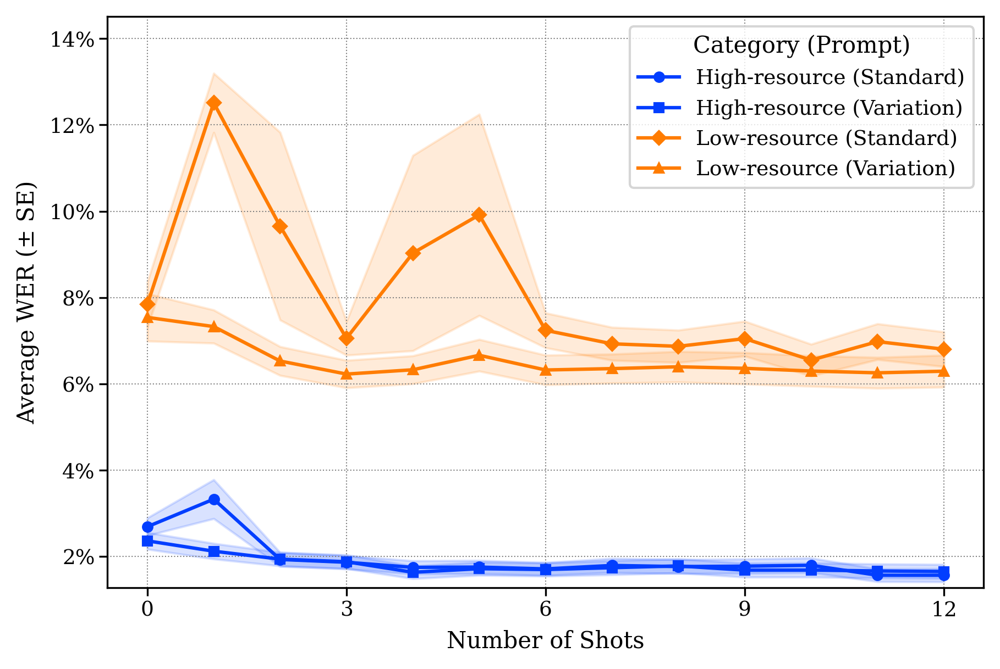

<ipython-input-166-6891501b3fc3>:559: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis_r", len(unique_shot_n_values) if unique_shot_n_values else 1); norm = mcolors.Normalize(vmin=min(unique_shot_n_values, default=0), vmax=max(unique_shot_n_values, default=0))


Saved: my_analysis_output_final/plots/plot2_iterative_shot_effect.pdf


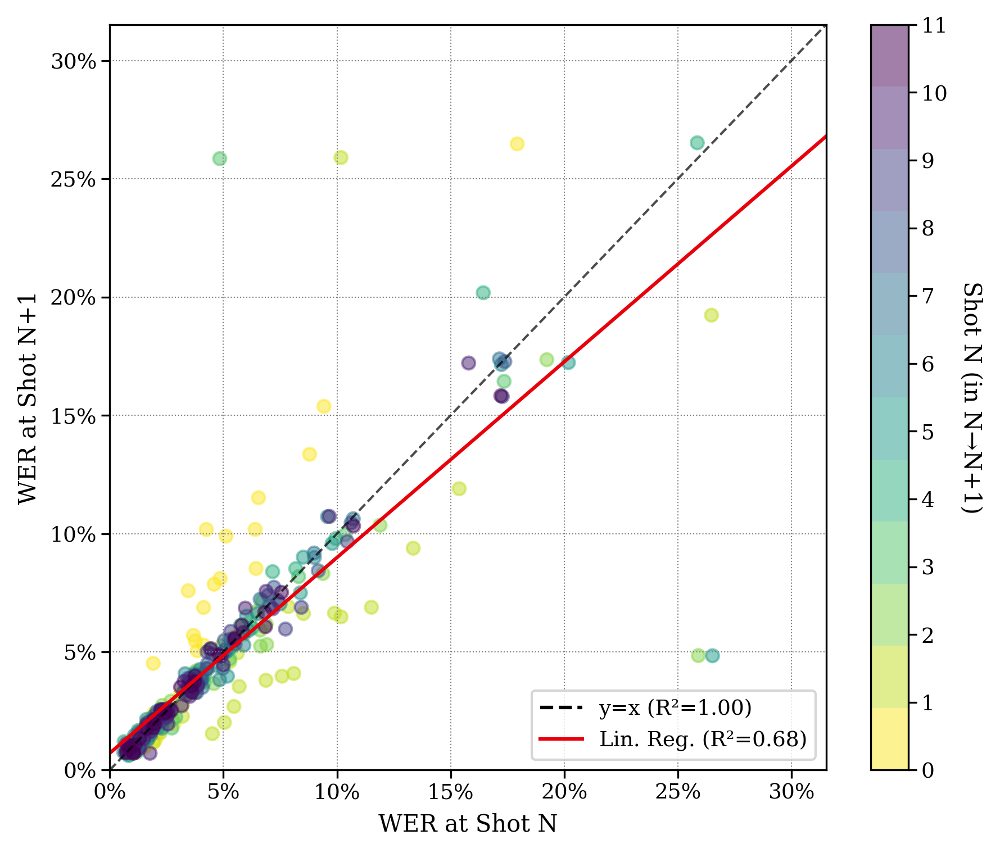

<ipython-input-166-6891501b3fc3>:593: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-166-6891501b3fc3>:593: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='ResourceCategory', y='WER_Trial_Log', hue='ResourceCategory', data=shot_data, ax=ax, palette=RESOURCE_CATEGORY_PALETTE, order=resource_order, legend=False, inner=None, cut=0, linewidth=1.2, scale="width", fill=False)
<ipython-input-166-6891501b3fc3>:593: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
 

Saved: my_analysis_output_final/plots/plot4_agg_speaker_var_violin_log.pdf


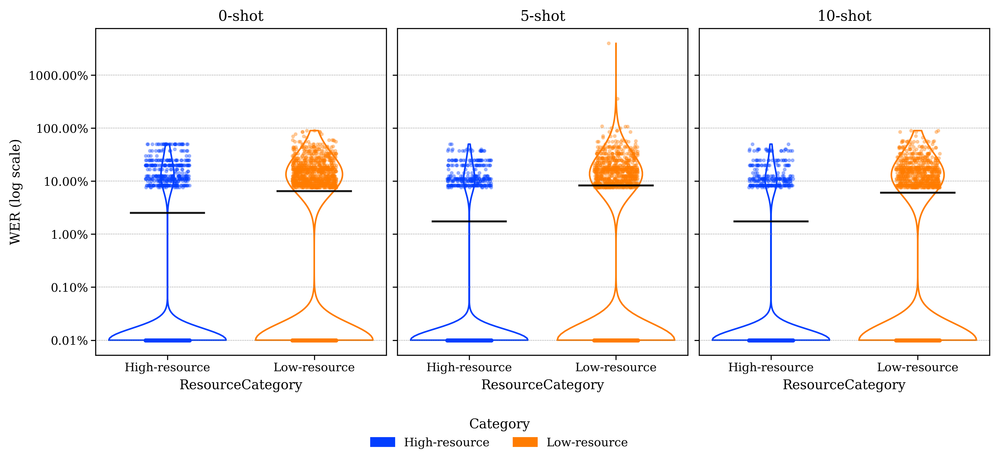

plot6_corpus_aggregated_shot_bins_02_36_710.pdf: No data found for any shot group label (['0-2 shot', '3-6 shot', '7-10 shot']). Skipping plot.
Saved: my_analysis_output_final/plots/plot_marginal_wer_by_shot_corpus_lines.pdf


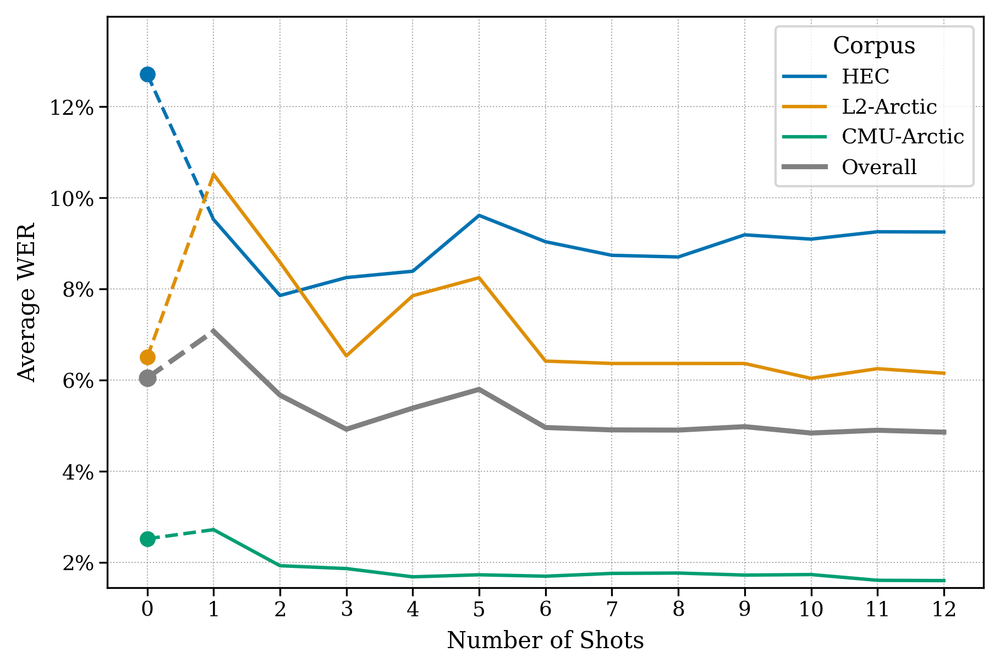

Saved: my_analysis_output_final/plots/plot_overall_shot_bins_05_610.pdf


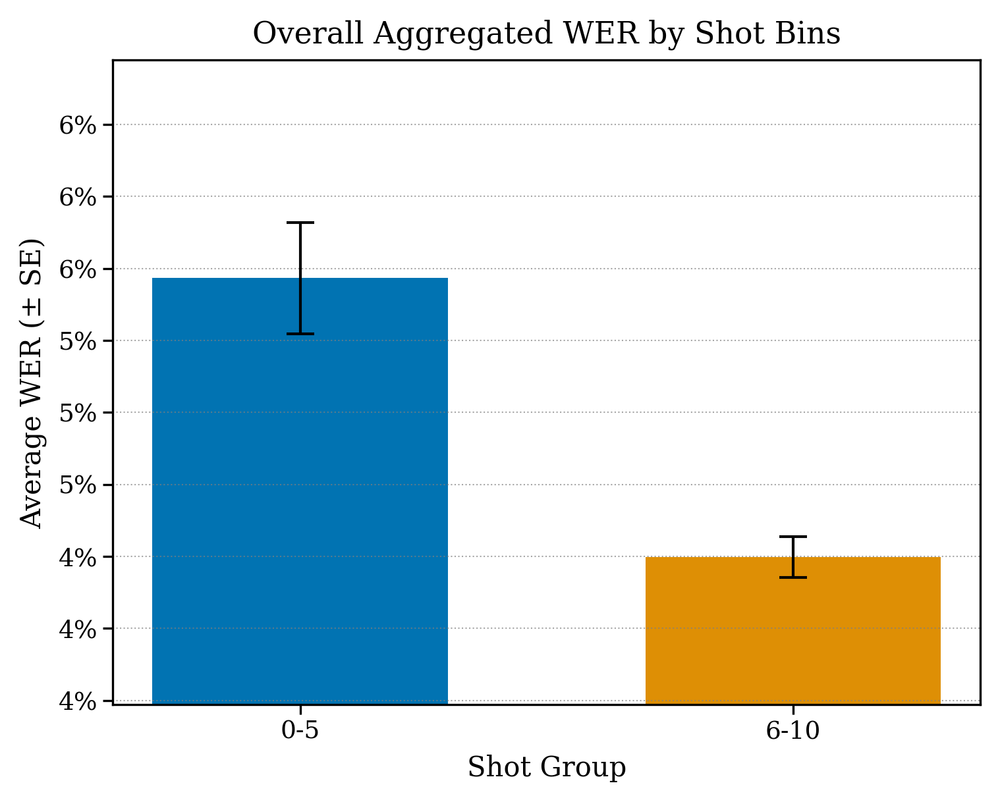

Saved: my_analysis_output_final/plots/new_plot3_overall_shot_bins_three.pdf


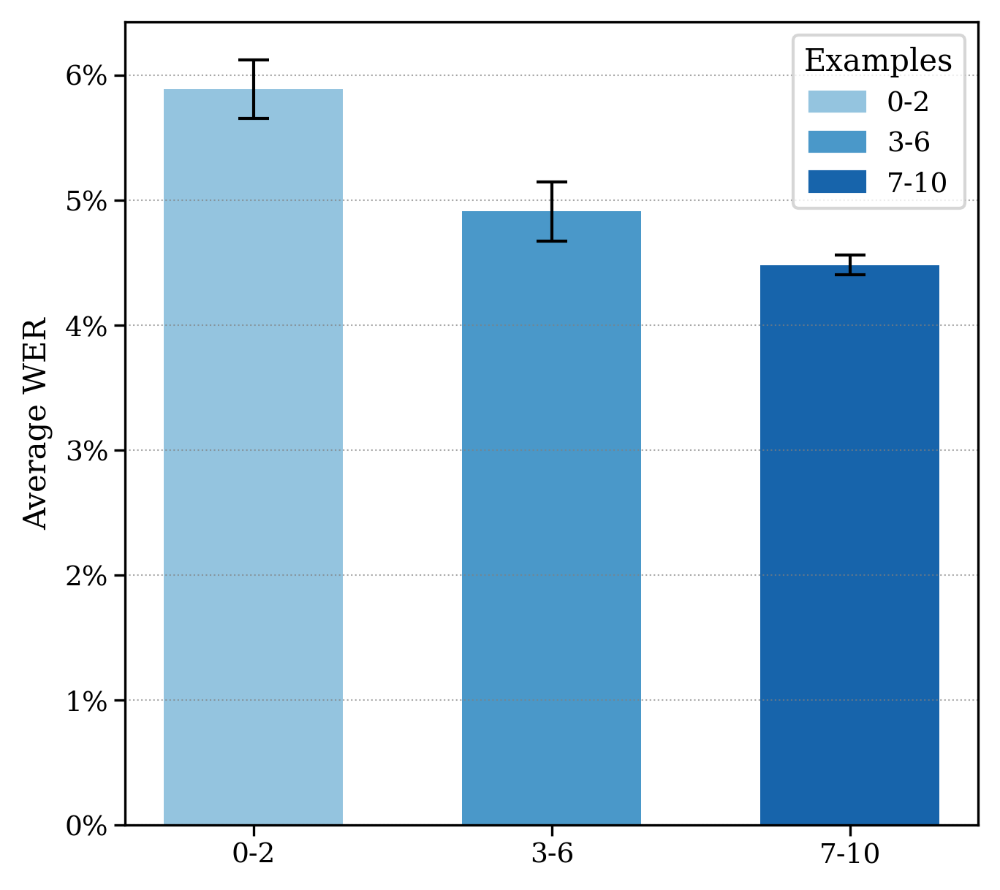

Saved: my_analysis_output_final/plots/plot6_corpus_bins_combined_final.pdf


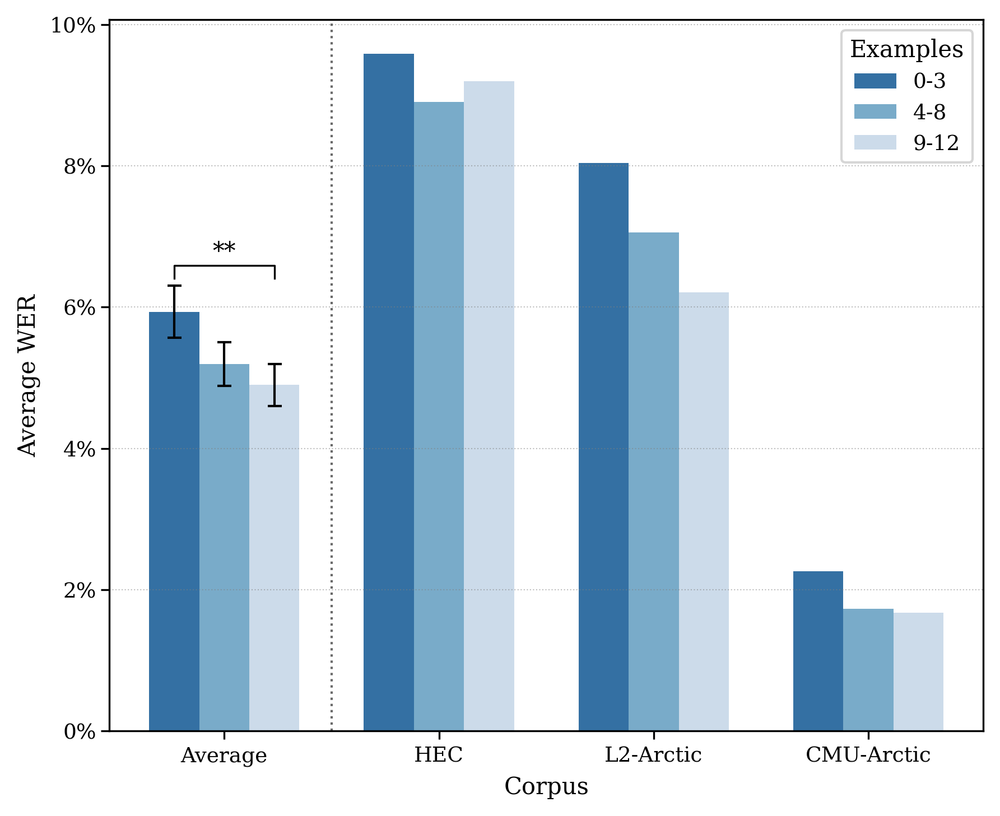

Saved: my_analysis_output_final/plots/plot_compound_marginal_plot6.pdf


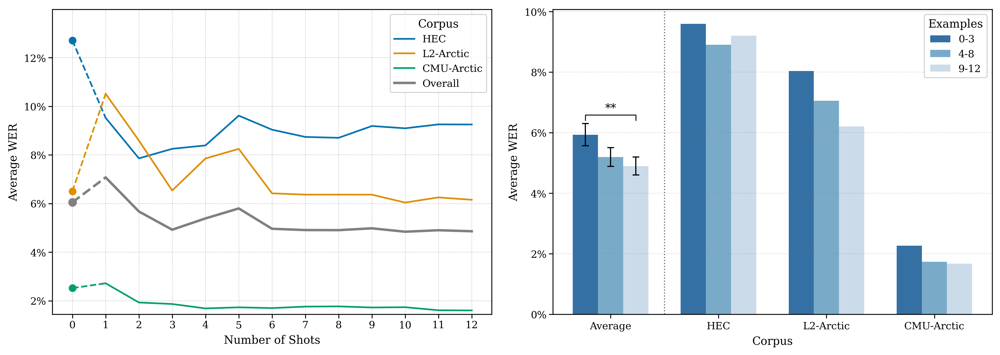

Saved: my_analysis_output_final/plots/same_vs_diff_speaker_comparison.pdf


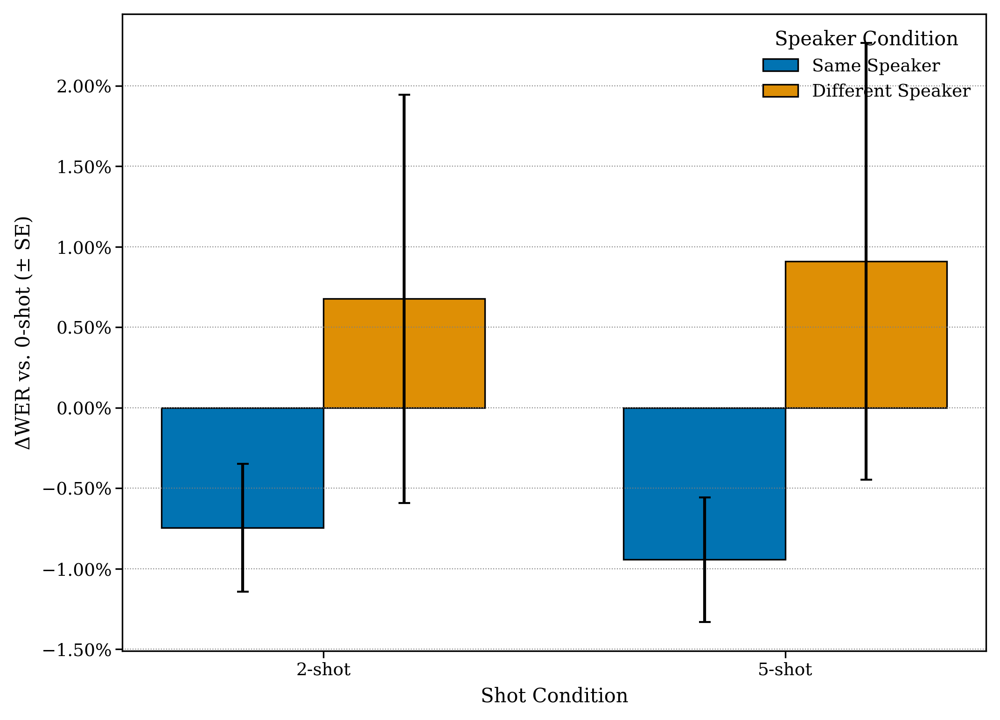


4. Generating LaTeX tables...
Saved table: my_analysis_output_final/tables/tab:core_results.tex
Saved table: my_analysis_output_final/tables/tab:appendix_full.tex
Saved table: my_analysis_output_final/tables/tab:best_worst.tex
Saved table: my_analysis_output_final/tables/tab:l1_groups_custom.tex
Saved table: my_analysis_output_final/tables/tab:corpus_variety.tex
Saved table: my_analysis_output_final/tables/tab:detailed_shot_groups_custom_bins.tex
Saved table: my_analysis_output_final/tables/tab:same_vs_diff.tex

5. Printing tables to console...

%% ----- tab:core_results -----
\begin{table*}[htbp]
\centering
\caption{Core Results (Pooled Data)}
\label{tab:core_results}
\begin{tabular}{lccc}
\toprule
Resource Category & 0-shot WER (\%) & 5-shot WER (\%) & 10-shot WER (\%) \\
\midrule
High\textnormal{-}resource & 2.5~($\pm$0.1) & 1.7~($\pm$0.1) & 1.7~($\pm$0.1) \\
Low\textnormal{-}resource & 8.6~($\pm$1.4) & 8.7~($\pm$1.4) & 7.1~($\pm$0.9) \\
\bottomrule
\end{tabular}
\end{table*}

%---

In [ ]:
generated_tables = analyze_data(
    same_json_path="/content/all_results_summary_same.json",
    diff_json_path="/content/all_results_summary_diff.json",
    out_root="my_analysis_output_final",
    show_plots=True # Set to True to display plots interactively
)

In [ ]:
import json
import pandas as pd
import numpy as np

# Manual variety mappings
L2_VAR_MAP = {
    '1': 'Hindi',
    '2': 'Korean',
    '3': 'Mandarin',
    '4': 'Spanish',
    '5': 'Vietnamese'
}

CMU_ARCTIC_VARIETIES = {
    'aew': 'US English',
    'ahw': 'German English',
    'aup': 'Indian English',
    'axb': 'Indian English',
    'eey': 'US English',
    'fem': 'German English',
    'gka': 'Indian English',
    'ljm': 'US English',
    'lnh': 'US English',
    'rxr': 'Israeli English',
    'slp': 'Indian English'
}

HISP_ENG_ORIGINS = {
    '0': None, '1': 'Argentina', '2': 'Mexico', '3': 'Argentina', '4': 'Argentina',
    '5': 'Argentina', '6': 'Argentina', '7': None, '8': None, '9': None, '10': None,
    '11': None, '12': None, '13': None, '14': None, '15': None, '16': None, '17': None,
    '18': 'Argentina', '19': 'Chile'
}

def create_main_table(same_json_path: str, diff_json_path: str):
    # 1. load JSONs
    with open(same_json_path, 'r') as f:
        same_data = json.load(f)
    with open(diff_json_path, 'r') as f:
        diff_data = json.load(f)

    # 2. extract DataFrames
    df_spk_same, df_tr_same = extract_full_data_with_trials(same_data, SPEAKER_METADATA, RESOURCE_MAPPING)
    df_spk_diff, df_tr_diff = extract_full_data_with_trials(diff_data, SPEAKER_METADATA, RESOURCE_MAPPING)

    # 3. pool speaker‐ and trial‐level
    df_spk = pd.concat([df_spk_same, df_spk_diff], ignore_index=True)
    df_tr  = pd.concat([df_tr_same, df_tr_diff], ignore_index=True)

    # 4. assign Variety to both
    def assign_variety(row):
        dk = row['DatasetKey']
        if dk == 'cmu-arctic':
            return CMU_ARCTIC_VARIETIES.get(row['Speaker'].lower(), '–')
        elif dk == 'l2-arctic':
            return L2_VAR_MAP.get(str(row['VarietyID']), '–')
        elif dk == 'hisp-eng':
            return HISP_ENG_ORIGINS.get(str(row['VarietyID']), '–')
        else:
            return '–'

    df_spk['Variety'] = df_spk.apply(assign_variety, axis=1)
    df_tr ['Variety'] = df_tr .apply(assign_variety, axis=1)

    # 5. shot counts
    shots = sorted(df_spk['Shot'].unique())

    # 6. pivot mean WER
    pivot_corp = df_spk.groupby(['Corpus','Shot'])['WER_Speaker_Mean'].mean().unstack().reindex(columns=shots)
    pivot_var  = df_spk.groupby(['Corpus','Variety','Shot'])['WER_Speaker_Mean'].mean().unstack().reindex(columns=shots)

    # 7. relative change
    def rel_change(s, a, b):
        return (s[a]-s[b])/s[a]*100 if a in s and b in s and pd.notna(s[a]) else np.nan

    rc5_c   = pivot_corp.apply(lambda r: rel_change(r,0,5), axis=1)
    rc12_c  = pivot_corp.apply(lambda r: rel_change(r,0,12), axis=1)
    rc5_v   = pivot_var .apply(lambda r: rel_change(r,0,5), axis=1)
    rc12_v  = pivot_var .apply(lambda r: rel_change(r,0,12), axis=1)

    # 8. print LaTeX table without N and Samples
    print(r"\begin{table*}[htbp]")
    print(r"\centering")
    print(r"\small")
    print(r"\caption{WER by shot count and relative change from 0\(\rightarrow\)5 and 0\(\rightarrow\)12 shots.}")
    print(r"\label{tab:main_results}")
    # one 'l' for corpus/variety, one 'c' per shot, plus two 'c' for the relative-change cols
    colspec = "l" + "c"*len(shots) + "cc"
    print(r"\begin{tabular}{" + colspec + "}")
    print(r"\toprule")
    # header: no N & Samples
    print(
        "Corpus / Variety & " +
        r"\multicolumn{" + f"{len(shots)}" + r"}{c|}{WER} & 0 vs 5 & 0 vs 12 \\"
    )
    print(r"\cmidrule(lr){2-" + f"{1+len(shots)}" + "}")
    # second line: shot labels, plus blanks under change cols
    print(
        "& " + " & ".join(f"{s}-shot" for s in shots) + " & & \\\\"
    )
    print(r"\midrule")

    for corp in pivot_corp.index:
        row = pivot_corp.loc[corp]
        wers = [f"{row[s]*100:.2f}" if pd.notna(row[s]) else "-" for s in shots]
        c5  = f"{rc5_c[corp]:+.1f}\\%" if pd.notna(rc5_c[corp]) else "-"
        c12 = f"{rc12_c[corp]:+.1f}\\%" if pd.notna(rc12_c[corp]) else "-"
        print(
            r"\textbf{" + corp + r"} & " +
            " & ".join(wers) + " & " +
            c5 + " & " + c12 + r" \\"
        )
        for var in sorted(pivot_var.loc[corp].index):
            rowv = pivot_var.loc[(corp,var)]
            wersv = [f"{rowv[s]*100:.2f}" if pd.notna(rowv[s]) else "-" for s in shots]
            v5 = f"{rc5_v[(corp,var)]:+.1f}\\%" if pd.notna(rc5_v[(corp,var)]) else "-"
            v12= f"{rc12_v[(corp,var)]:+.1f}\\%" if pd.notna(rc12_v[(corp,var)]) else "-"
            print(
                r"\hspace*{1em}\textit{" + var + r"} & " +
                " & ".join(wersv) + " & " +
                v5 + " & " + v12 + r" \\"
            )
        print(r"\midrule")

    print(r"\bottomrule")
    print(r"\end{tabular}")
    print(r"\end{table*}")


In [ ]:
generated_tables = create_main_table(
    same_json_path="/content/all_results_summary_same.json",
    diff_json_path="/content/all_results_summary_diff.json"
)

\begin{table*}[htbp]
\centering
\small
\caption{WER by shot count and relative change from 0\(\rightarrow\)5 and 0\(\rightarrow\)12 shots.}
\label{tab:main_results}
\begin{tabular}{lccccccccccccccc}
\toprule
Corpus / Variety & \multicolumn{13}{c|}{WER} & 0 vs 5 & 0 vs 12 \\
\cmidrule(lr){2-14}
& 0-shot & 1-shot & 2-shot & 3-shot & 4-shot & 5-shot & 6-shot & 7-shot & 8-shot & 9-shot & 10-shot & 11-shot & 12-shot & & \\
\midrule
\textbf{CMU-Arctic} & 2.52 & 2.72 & 1.93 & 1.87 & 1.69 & 1.73 & 1.70 & 1.77 & 1.77 & 1.73 & 1.74 & 1.61 & 1.61 & +31.3\% & +36.4\% \\
\hspace*{1em}\textit{German English} & 3.47 & 3.62 & 2.89 & 2.55 & 2.72 & 2.49 & 2.45 & 2.84 & 2.59 & 2.51 & 2.58 & 2.34 & 2.25 & +28.3\% & +35.4\% \\
\hspace*{1em}\textit{Indian English} & 3.16 & 4.56 & 2.13 & 2.18 & 1.96 & 2.04 & 2.02 & 1.91 & 2.14 & 1.99 & 2.09 & 1.84 & 1.92 & +35.5\% & +39.2\% \\
\hspace*{1em}\textit{US English} & 1.96 & 1.80 & 1.74 & 1.79 & 1.47 & 1.57 & 1.61 & 1.71 & 1.57 & 1.60 & 1.66 & 1.43 & 1.53 & +19.9\%

In [ ]:
def prompt_stability_plot(same_json_path: str, diff_json_path: str,
                          max_shot_plot: int = 12,
                          output_filename="prompt_stability_by_corpus.pdf",
                          show=True):
    """
    Creates a plot showing WER by shot count for each corpus,
    split by prompt variation (similar to marginal corpus lines but with prompt types).

    Args:
        same_json_path: Path to same speaker results JSON
        diff_json_path: Path to different speaker results JSON
        max_shot_plot: Maximum shot to plot
        output_filename: Name of output file
        show: Whether to display the plot
    """

    # Load data from both JSONs
    same_results = load_results(same_json_path)
    diff_results = load_results(diff_json_path)

    # Extract data from both
    df_same_spk, _ = extract_full_data_with_trials(same_results, SPEAKER_METADATA, RESOURCE_MAPPING)
    df_diff_spk, _ = extract_full_data_with_trials(diff_results, SPEAKER_METADATA, RESOURCE_MAPPING)

    # Pool the data
    df_speaker_shot = pd.concat([df_same_spk, df_diff_spk], ignore_index=True)

    if df_speaker_shot.empty:
        print(f"{output_filename}: No speaker data.")
        return

    # Filter by max shot
    shot_range = set(range(max_shot_plot + 1))
    df_speaker_shot_filtered = df_speaker_shot[df_speaker_shot["Shot"] <= max_shot_plot]

    # Group by Corpus, PromptType, Speaker, Shot and take mean WER per speaker
    per_spk_shot_prompt = df_speaker_shot_filtered.groupby(
        ["Corpus", "PromptType", "Speaker", "Shot"]
    )["WER_Speaker_Mean"].mean().reset_index()

    # Group by Corpus, PromptType, Shot and take mean across speakers
    corpus_prompt_means = per_spk_shot_prompt.groupby(
        ["Corpus", "PromptType", "Shot"]
    )["WER_Speaker_Mean"].mean().reset_index()

    # Find corpora that have complete shot ranges for at least one prompt type
    valid_corpus_prompt_combinations = []
    for (corpus, prompt_type), group in corpus_prompt_means.groupby(["Corpus", "PromptType"]):
        if set(group["Shot"]) >= shot_range:
            valid_corpus_prompt_combinations.append((corpus, prompt_type))

    # Filter to only valid combinations
    corpus_prompt_means = corpus_prompt_means[
        corpus_prompt_means.apply(
            lambda row: (row["Corpus"], row["PromptType"]) in valid_corpus_prompt_combinations,
            axis=1
        )
    ]

    if corpus_prompt_means.empty:
        print(f"{output_filename}: No corpus-prompt combinations have complete shots 0…{max_shot_plot}")
        return

    # Set up the plot
    fig, ax = plt.subplots(figsize=(5.5, 4.1))

    # Get unique corpora and prompt types
    available_corpora = corpus_prompt_means["Corpus"].unique()
    # Order corpora as HEC, L2-Arctic, then CMU-Arctic
    desired_order = ["HEC", "L2-Arctic", "CMU-Arctic"]
    unique_corpora = [corpus for corpus in desired_order if corpus in available_corpora]
    unique_prompt_types = sorted(corpus_prompt_means["PromptType"].unique())

    # Create color palette for corpora (same as original function)
    corpus_palette = {c: colors[i % len(colors)] for i, c in enumerate(unique_corpora)}

    # Create opacity and line styles for prompt types
    prompt_alphas = {pt: 1.0 - (i * 0.3) for i, pt in enumerate(unique_prompt_types)}
    prompt_linestyles = {pt: ['-', '--'][i % 2] for i, pt in enumerate(unique_prompt_types)}

    # Plot lines for each corpus-prompt combination
    for corpus in unique_corpora:
        corpus_data = corpus_prompt_means[corpus_prompt_means["Corpus"] == corpus]
        base_color = corpus_palette[corpus]

        for i, prompt_type in enumerate(unique_prompt_types):
            prompt_data = corpus_data[corpus_data["PromptType"] == prompt_type].sort_values("Shot")

            if prompt_data.empty:
                continue

            alpha = prompt_alphas[prompt_type]
            linestyle = prompt_linestyles[prompt_type]

            # Plot 0-shot point
            shot_0_data = prompt_data[prompt_data["Shot"] == 0]
            if not shot_0_data.empty:
                y0 = shot_0_data["WER_Speaker_Mean"].iloc[0]
                ax.scatter(0, y0, s=35, color=base_color, alpha=alpha, zorder=5)

            # Plot 1+ shots with solid line
            shots_1_plus = prompt_data[prompt_data["Shot"] >= 1]
            if not shots_1_plus.empty:
                # Only label first prompt type for each corpus to avoid duplicate labels
                label = corpus if i == 0 else "_nolegend_"
                ax.plot(shots_1_plus["Shot"], shots_1_plus["WER_Speaker_Mean"],
                       color=base_color, linewidth=1.5, linestyle=linestyle,
                       alpha=alpha, label=label)

    # Calculate overall means by prompt type
    overall_means_by_prompt = corpus_prompt_means.groupby(["PromptType", "Shot"])["WER_Speaker_Mean"].mean().reset_index()

    # Store legend handles for prompt types with higher alpha
    legend_prompt_handles = {}

    # Plot overall averages by prompt type
    for i, prompt_type in enumerate(unique_prompt_types):
        prompt_overall = overall_means_by_prompt[overall_means_by_prompt["PromptType"] == prompt_type].sort_values("Shot")
        alpha = prompt_alphas[prompt_type]
        linestyle = prompt_linestyles[prompt_type]

        if not prompt_overall.empty:
            # Plot 0-shot point
            y0_o = prompt_overall.loc[prompt_overall["Shot"] == 0, "WER_Speaker_Mean"].iloc[0]
            ax.scatter(0, y0_o, s=45, color="grey", alpha=alpha, zorder=6, label="_nolegend_")

            # Plot 1+ shots
            shots_1_plus_overall = prompt_overall[prompt_overall["Shot"] >= 1]
            if not shots_1_plus_overall.empty:
                # Label prompt types for the overall average
                label = f"{prompt_type.title()}"
                handle = ax.plot(shots_1_plus_overall["Shot"],
                               shots_1_plus_overall["WER_Speaker_Mean"],
                               color="grey", linewidth=2.2, linestyle=linestyle,
                               alpha=alpha, label=label)[0]
                # Set different alpha for legend based on prompt type
                # Standard gets full opacity, variation gets slightly higher than plot alpha
                if i == 0:  # First prompt type (standard)
                    legend_alpha = 1.0
                else:  # Other prompt types (variation)
                    legend_alpha = min(1.0, alpha + 0.15)  # Slightly less transparent than plot

                legend_prompt_handles[label] = plt.Line2D([0], [0], color="black",
                                                        linestyle=linestyle, linewidth=2.2,
                                                        alpha=legend_alpha)

    # Format plot
    ax.set_xlabel("Number of Shots", fontsize=10)
    ax.set_ylabel("Average WER", fontsize=10)
    ax.grid(True, linestyle=":", alpha=0.7)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_xticks(range(max_shot_plot + 1))
    ax.tick_params(axis='both', labelsize=9)

    # Set y-axis limits
    y_min = corpus_prompt_means["WER_Speaker_Mean"].min() * 0.9
    y_max = min(1.0, corpus_prompt_means["WER_Speaker_Mean"].max() * 1.1)
    if y_min >= y_max:
        y_max = y_min + 0.1
    ax.set_ylim(max(0, y_min), y_max)

    # Create custom legend
    handles, labels = ax.get_legend_handles_labels()

    # Filter to unique labels and organize
    corpus_handles = []

    for handle, label in zip(handles, labels):
        if label in unique_corpora:
            corpus_handles.append((handle, label))

    # Add an "Average" legend entry
    average_handle = plt.Line2D([0], [0], color="grey", linewidth=2.2, alpha=1.0)

    # Combine prompt handles (with higher alpha), average handle, and corpus handles
    legend_handles = list(legend_prompt_handles.values()) + [average_handle] + [h for h, l in corpus_handles]
    legend_labels = list(legend_prompt_handles.keys()) + ["Average"] + [l for h, l in corpus_handles]

    ax.legend(legend_handles, legend_labels,
             title="Prompt Type / Corpus", loc="best", fontsize=9, title_fontsize=10)

    plt.tight_layout(pad=0.5)

    # Save and show
    if _ANALYSIS_OUTPUT_DIR:
        save_path = os.path.join(_ANALYSIS_OUTPUT_DIR, output_filename)
        try:
            plt.savefig(save_path)
            print(f"Saved: {save_path}")
        except Exception as e:
            print(f"Error saving plot {save_path}: {e}")
    else:
        print(f"Plot '{output_filename}' will be shown but not saved (_ANALYSIS_OUTPUT_DIR is None).")

    if show:
        plt.show()
    plt.close(fig)

Saved: my_analysis_output_final/plots/prompt_stability_by_corpus.pdf


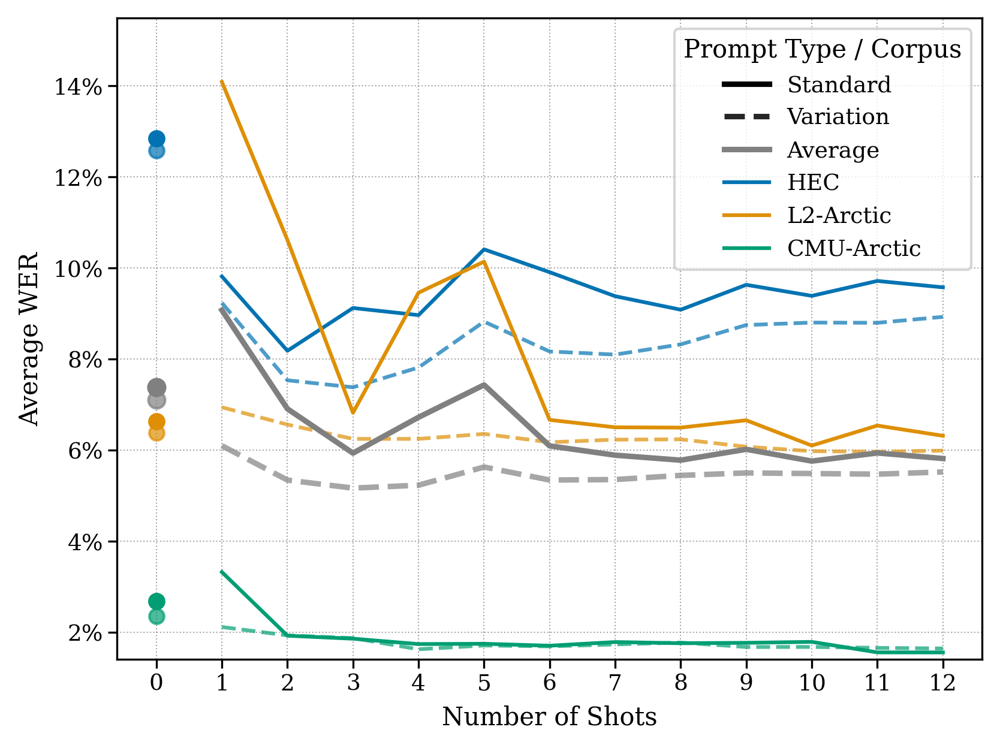

In [ ]:
prompt_stability_plot(
    same_json_path="/content/all_results_summary_same.json",
    diff_json_path="/content/all_results_summary_diff.json"
    )

In [ ]:
# --- NEW FUNCTION AS REQUESTED ---
def generate_speaker_0_12_shot_latex_table(
    same_json_path: str,
    diff_json_path: str,
    speaker_meta: dict = SPEAKER_METADATA,
    resource_map: dict = RESOURCE_MAPPING
) -> None:
    """
    Generates and prints a LaTeX table showing 0-shot and 12-shot WER
    for every speaker in every dataset, with a grand average.
    """
    print(f"\nGenerating speaker-specific 0-shot and 12-shot WER table...")
    print(f"Using 'same' data: {same_json_path}")
    print(f"Using 'diff' data: {diff_json_path}")

    # 1. Load and explode JSONs
    if not os.path.exists(same_json_path):
        print(f"ERROR: File not found: {same_json_path}")
        return
    if not os.path.exists(diff_json_path):
        print(f"ERROR: File not found: {diff_json_path}")
        return

    same_results = load_results(same_json_path)
    diff_results = load_results(diff_json_path)

    # Extract speaker-shot level data (contains WER_Speaker_Mean per prompt type)
    df_same_spk, _ = extract_full_data_with_trials(same_results, speaker_meta, resource_map)
    df_diff_spk, _ = extract_full_data_with_trials(diff_results, speaker_meta, resource_map)

    # 2. Pool data
    df_spkshot_all = pd.concat([df_same_spk, df_diff_spk], ignore_index=True)

    if df_spkshot_all.empty:
        print("\\textit{No data available after pooling for the speaker 0/12 shot table.}")
        return

    # 3. Filter for 0-shot and 12-shot conditions
    target_shots = [0, 12]
    df_filtered = df_spkshot_all[df_spkshot_all['Shot'].isin(target_shots)]

    if df_filtered.empty:
        print(f"\\textit{{No data found for {target_shots[0]}-shot or {target_shots[1]}-shot conditions.}}")
        return

    # 4. Aggregate data
    df_pivot = df_filtered.pivot_table(
        index=['Corpus', 'Speaker'],
        columns='Shot',
        values='WER_Speaker_Mean',
        aggfunc=np.mean
    ).reset_index()

    col_0_shot = target_shots[0]
    col_12_shot = target_shots[1]

    df_pivot = df_pivot.rename(columns={col_0_shot: 'WER_0_shot', col_12_shot: 'WER_12_shot'})

    if 'WER_0_shot' not in df_pivot.columns:
        df_pivot['WER_0_shot'] = np.nan
    if 'WER_12_shot' not in df_pivot.columns:
        df_pivot['WER_12_shot'] = np.nan
        print(f"Note: No data found for {col_12_shot}-shot. WER_{col_12_shot}_shot column will show '–'.")

    df_pivot = df_pivot.sort_values(['Corpus', 'Speaker'])

    # 5. Calculate Grand Average
    grand_avg_0_shot = df_pivot['WER_0_shot'].mean()
    grand_avg_12_shot = df_pivot['WER_12_shot'].mean()

    # 6. Format LaTeX Table
    latex_str = "\\begin{table*}[htbp]\n\\centering\n\\small\n"
    latex_str += f"\\caption{{Speaker-level Word Error Rates (WER) for {col_0_shot}-shot and {col_12_shot}-shot conditions. All WERs are percentages.}}\n"
    latex_str += f"\\label{{tab:speaker_{col_0_shot}_{col_12_shot}_shot_wers}}\n"
    latex_str += "\\begin{tabular}{llcc}\n\\toprule\n"
    latex_str += f"Dataset (Corpus) & Speaker & {col_0_shot}-shot WER (\\%) & {col_12_shot}-shot WER (\\%) \\\\\n\\midrule\n"

    for _, row in df_pivot.iterrows():
        corpus = str(row['Corpus'])
        speaker = str(row['Speaker'])
        wer_0 = format_wer_latex_simple(row['WER_0_shot'], precision=1)
        wer_12 = format_wer_latex_simple(row['WER_12_shot'], precision=1)
        latex_str += f"{corpus} & {speaker} & {wer_0} & {wer_12} \\\\\n"

    latex_str += "\\midrule\n"
    avg_0_str = format_wer_latex_simple(grand_avg_0_shot, precision=1)
    avg_12_str = format_wer_latex_simple(grand_avg_12_shot, precision=1)

    # --- CORRECTED LINE ---
    latex_str += f"\\multicolumn{{2}}{{l}}{{\\textbf{{Grand Average (across listed speakers)}}}} & \\textbf{{{avg_0_str}}} & \\textbf{{{avg_12_str}}} \\\\\n"
    # --- END OF CORRECTION ---

    latex_str += "\\bottomrule\n\\end{tabular}\n\\end{table*}\n"

    print("\n--- LaTeX Table: Speaker 0-shot and 12-shot WERs ---")
    print(latex_str)
    print("--- End of LaTeX Table ---")

In [ ]:
generate_speaker_0_12_shot_latex_table(
    same_json_path="/content/all_results_summary_same.json",
    diff_json_path="/content/all_results_summary_diff.json"
)


Generating speaker-specific 0-shot and 12-shot WER table...
Using 'same' data: /content/all_results_summary_same.json
Using 'diff' data: /content/all_results_summary_diff.json

--- LaTeX Table: Speaker 0-shot and 12-shot WERs ---
\begin{table*}[htbp]
\centering
\small
\caption{Speaker-level Word Error Rates (WER) for 0-shot and 12-shot conditions. All WERs are percentages.}
\label{tab:speaker_0_12_shot_wers}
\begin{tabular}{llcc}
\toprule
Dataset (Corpus) & Speaker & 0-shot WER (\%) & 12-shot WER (\%) \\
\midrule
CMU-Arctic & aew & 1.5 & 0.7 \\
CMU-Arctic & ahw & 2.8 & 2.0 \\
CMU-Arctic & aup & 3.1 & 2.1 \\
CMU-Arctic & axb & 3.8 & 2.4 \\
CMU-Arctic & bdl & 1.4 & 0.9 \\
CMU-Arctic & clb & 1.9 & 0.7 \\
CMU-Arctic & eey & 1.9 & 2.6 \\
CMU-Arctic & fem & 4.1 & 2.5 \\
CMU-Arctic & gka & 1.9 & 1.3 \\
CMU-Arctic & ksp & 3.4 & 2.4 \\
CMU-Arctic & ljm & 2.2 & 1.8 \\
CMU-Arctic & lnh & 2.2 & 1.0 \\
CMU-Arctic & rms & 2.0 & 0.7 \\
CMU-Arctic & slp & 3.9 & 1.8 \\
CMU-Arctic & slt & 1.7 & 1.1 \\


<ipython-input-169-3f17258f63ca>:47: FutureWarning: The provided callable <function mean at 0x791e473e9da0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_pivot = df_filtered.pivot_table(


In [ ]:
import json
import os
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import ttest_ind

# Constants for shot groups (updated to 1-3, 4-6, 7-9, 10-12)
SHOT_GROUPS_PRIMARY = {
    '1-3': (1, 3),
    '4-6': (4, 6),
    '7-9': (7, 9),
    '10-12': (10, 12)
}

# Speaker metadata and resource mapping (same as in main code)
SPEAKER_METADATA = {
    'ABA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'SKA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'YBAA': {'l1': 'Arabic', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ZHAA': {'l1': 'Arabic', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'BWC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'LXC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'NCC': {'l1': 'Mandarin', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TXHC': {'l1': 'Mandarin', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'ASI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'RRBI': {'l1': 'Hindi', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'SVBI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TNI': {'l1': 'Hindi', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HJK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'HKK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'YDCK': {'l1': 'Korean', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'YKWK': {'l1': 'Korean', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'EBVS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'ERMS': {'l1': 'Spanish', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'MBMPS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'NJS': {'l1': 'Spanish', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'HQTV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'}, 'PNV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'},
    'THV': {'l1': 'Vietnamese', 'gender': 'F', 'dataset_group': 'L2-Arctic'}, 'TLV': {'l1': 'Vietnamese', 'gender': 'M', 'dataset_group': 'L2-Arctic'},
    'bdl': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slt': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'jmk': {'l1': 'Canadian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'awb': {'l1': 'Scottish English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'rms': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'clb': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'ksp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aew': {'l1': 'US English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ahw': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'aup': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'axb': {'l1': 'Indian English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'eey': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'fem': {'l1': 'German English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'gka': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
    'ljm': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'}, 'lnh': {'l1': 'US English', 'gender': 'F', 'dataset_group': 'CMU-Arctic'},
    'rxr': {'l1': 'Israeli English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'}, 'slp': {'l1': 'Indian English', 'gender': 'M', 'dataset_group': 'CMU-Arctic'},
}

RESOURCE_MAPPING = {
    'l2-arctic': {'name': 'L2-Arctic', 'category': 'Low-resource'},
    'hisp-eng': {'name': 'HEC', 'category': 'Low-resource'},
    'saa': {'name': 'SAA', 'category': 'Low-resource'},
    'sandi': {'name': 'SANDI', 'category': 'Low-resource'},
    'cmu-arctic': {'name': 'CMU-Arctic', 'category': 'High-resource'},
}


def assign_shot_group(shot: int, shot_groups_map: dict = SHOT_GROUPS_PRIMARY) -> str | None:
    """
    Assign shot groups consistently.

    Args:
        shot: The shot number
        shot_groups_map: Dictionary mapping group names to (min_shot, max_shot) tuples
    """
    for group_name, (min_shot, max_shot) in shot_groups_map.items():
        if min_shot <= shot <= max_shot:
            return group_name
    return None


def split_composite_speaker(s):
    """Split composite speaker ID like '1_speaker' into variety and speaker codes."""
    if isinstance(s, str) and '_' in s:
        code, speaker = s.split('_', 1)
        return code, speaker
    return None, s


def calculate_mean_se(wer_values):
    """Calculate mean and standard error for a list of WER values."""
    if not isinstance(wer_values, (list, np.ndarray, pd.Series)):
        if isinstance(wer_values, (int, float)) and pd.notna(wer_values) and wer_values >= 0:
            return wer_values, 0.0, 1
        return np.nan, np.nan, 0

    if isinstance(wer_values, pd.Series):
        wer_values = wer_values.tolist()
    elif isinstance(wer_values, np.ndarray):
        wer_values = wer_values.tolist()

    if not wer_values:
        return np.nan, np.nan, 0

    valid_wers = [w for w in wer_values if pd.notna(w) and w >= 0]
    n = len(valid_wers)

    if n == 0:
        return np.nan, np.nan, 0
    elif n == 1:
        return valid_wers[0], 0.0, 1
    else:
        mean = np.mean(valid_wers)
        se = stats.sem(valid_wers, ddof=1, nan_policy='omit')
        if pd.isna(se) or np.isclose(se, 0):
            se = 0.0
        return mean, se, n


def load_results(file_path):
    """Load results from JSON file."""
    with open(file_path, 'r') as f:
        return json.load(f)


def extract_trial_data(results_data, speaker_metadata_map, resource_map):
    """
    Extract trial-level data from JSON results.
    """
    trial_records = []

    for dataset_key, ds_content in results_data.items():
        if dataset_key not in resource_map:
            continue
        ds_meta = resource_map[dataset_key]

        for prompt_type, prompt_content in ds_content.items():
            for shot_tag, shot_block in prompt_content.items():
                if not shot_tag.startswith("shot"):
                    continue
                shot = int(shot_tag[4:])

                if "speakers" not in shot_block:
                    continue

                for raw_key, spk_json in shot_block["speakers"].items():
                    var_code, spk_code = split_composite_speaker(raw_key)
                    meta = speaker_metadata_map.get(spk_code.upper(), {})
                    l1 = meta.get("l1", "Unknown")
                    gender = meta.get("gender", "Unknown")

                    wer_vals = spk_json.get(f"{shot_tag}_wer_values", [])

                    for w in wer_vals:
                        if pd.notna(w) and w >= 0:
                            trial_records.append({
                                "DatasetKey": dataset_key,
                                "Corpus": ds_meta["name"],
                                "ResourceCategory": ds_meta["category"],
                                "Speaker": spk_code,
                                "VarietyID": var_code,
                                "L1": l1,
                                "Gender": gender,
                                "PromptType": prompt_type,
                                "Shot": shot,
                                "WER_Trial": w,
                            })

    df_trials = pd.DataFrame(trial_records)

    if not df_trials.empty:
        numeric_cols = ['WER_Trial', 'Shot']
        for col in numeric_cols:
            if col in df_trials.columns:
                df_trials[col] = pd.to_numeric(df_trials[col], errors='coerce')

    return df_trials


def create_same_vs_diff_shot_groups_table(
    same_json_path: str,
    diff_json_path: str,
    output_path: str = None,
    speaker_meta: dict = SPEAKER_METADATA,
    resource_map: dict = RESOURCE_MAPPING,
    shot_groups_map: dict = SHOT_GROUPS_PRIMARY
) -> str:
    """
    Create a LaTeX table comparing same vs different speaker performance by shot groups,
    with a third column showing same speaker advantage.

    Args:
        same_json_path: Path to JSON file with same speaker results
        diff_json_path: Path to JSON file with different speaker results
        output_path: Optional path to save the LaTeX table
        speaker_meta: Speaker metadata dictionary
        resource_map: Resource mapping dictionary
        shot_groups_map: Shot groups mapping (default uses SHOT_GROUPS_PRIMARY)

    Returns:
        str: LaTeX table as string
    """

    # Load and extract data
    print("Loading same speaker results...")
    same_results = load_results(same_json_path)
    df_same_trials = extract_trial_data(same_results, speaker_meta, resource_map)

    print("Loading different speaker results...")
    diff_results = load_results(diff_json_path)
    df_diff_trials = extract_trial_data(diff_results, speaker_meta, resource_map)

    # Assign shot groups
    df_same_trials['ShotGroup'] = df_same_trials['Shot'].apply(
        lambda x: assign_shot_group(x, shot_groups_map)
    )
    df_diff_trials['ShotGroup'] = df_diff_trials['Shot'].apply(
        lambda x: assign_shot_group(x, shot_groups_map)
    )

    # Add condition labels
    df_same_trials['Condition'] = 'Same Speaker'
    df_diff_trials['Condition'] = 'Different Speaker'

    # Combine data
    df_combined = pd.concat([df_same_trials, df_diff_trials], ignore_index=True)

    if df_combined.empty:
        raise ValueError("No combined data for same/diff table.")

    # Get all shots for calculation (including 0-shot for baseline)
    all_shots = list(range(13))
    shot_groups_for_calc = all_shots

    # All shot groups should be displayed
    shot_groups_for_display = list(shot_groups_map.keys())

    # Filter data
    df_filtered = df_combined[df_combined['Shot'].isin(shot_groups_for_calc)].copy()
    df_filtered = df_filtered.dropna(subset=['ShotGroup', 'WER_Trial'])

    # Calculate statistics by condition and shot group
    # For each shot group, calculate the average WER across all shots in that group

    group_stats = []

    for group_name in shot_groups_for_display:
        min_shot, max_shot = shot_groups_map[group_name]

        for condition in ['Same Speaker', 'Different Speaker']:
            condition_data = df_filtered[df_filtered['Condition'] == condition]

            # Get all shots in this group
            group_shots = list(range(min_shot, max_shot + 1))

            # Get data for shots in this group
            group_data = condition_data[
                condition_data['Shot'].isin(group_shots)
            ]['WER_Trial'].tolist()
            group_mean, group_se, group_n = calculate_mean_se(group_data)

            group_stats.append({
                'ShotGroup': group_name,
                'Condition': condition,
                'mean_wer': group_mean,
                'se_wer': group_se,
                'n_trials': group_n
            })

    agg_stats_display = pd.DataFrame(group_stats)

    # Create pivot tables for WERs
    wer_pivot = agg_stats_display.pivot_table(
        index='ShotGroup', columns='Condition', values='mean_wer'
    )
    wer_se_pivot = agg_stats_display.pivot_table(
        index='ShotGroup', columns='Condition', values='se_wer'
    )

    # Calculate same speaker advantage (difference in WERs: diff - same)
    # Positive advantage means same speaker is better
    advantage_data = []
    relative_advantage_data = []

    for group in shot_groups_for_display:
        if group in wer_pivot.index:
            same_wer = wer_pivot.loc[group, 'Same Speaker']
            diff_wer = wer_pivot.loc[group, 'Different Speaker']

            # Advantage = diff WER - same WER (positive means same speaker is better)
            advantage = diff_wer - same_wer
            # Relative advantage as percentage of different speaker WER
            relative_advantage = (advantage / diff_wer) * 100 if not pd.isna(diff_wer) and diff_wer != 0 else np.nan

            advantage_data.append(advantage)
            relative_advantage_data.append(relative_advantage)
        else:
            advantage_data.append(np.nan)
            relative_advantage_data.append(np.nan)

    # Find best and worst advantages for coloring
    valid_advantages = [a for a in advantage_data if not pd.isna(a)]
    best_advantage = max(valid_advantages) if valid_advantages else None
    worst_advantage = min(valid_advantages) if valid_advantages else None

    # Perform significance tests
    significance_results = {}
    for group in shot_groups_for_display:
        min_shot, max_shot = shot_groups_map[group]

        # Get all shots in this group
        test_shots = list(range(min_shot, max_shot + 1))

        same_data = df_same_trials[
            df_same_trials['Shot'].isin(test_shots)
        ]['WER_Trial'].dropna()
        diff_data = df_diff_trials[
            df_diff_trials['Shot'].isin(test_shots)
        ]['WER_Trial'].dropna()

        if len(same_data) > 1 and len(diff_data) > 1:
            t_stat, p_val = ttest_ind(same_data, diff_data, equal_var=False)
            significance = "***" if p_val < 0.01 else "**" if p_val < 0.05 else "*" if p_val < 0.1 else ""
            significance_results[group] = {
                't_stat': t_stat,
                'p_val': p_val,
                'significance': significance
            }
        else:
            significance_results[group] = {
                't_stat': None,
                'p_val': None,
                'significance': ""
            }

    # Generate LaTeX table
    latex_lines = [
        "\\begin{table}[ht]",
        "\\centering",
        "\\fontsize{9.8pt}{12pt}\\selectfont",
        "\\begin{tabular}{lccc}",
        "\\toprule",
        " & \\multicolumn{2}{c}{Speaker Condition} & \\\\",
        "\\cmidrule(lr){2-3}",
        "Shot Group & \\textit{Same} & \\textit{Different} & \\textit{Same} Advantage \\\\",
        "\\midrule"
    ]

    # Order shot groups by their minimum shot number
    ordered_groups = sorted(shot_groups_for_display, key=lambda g: shot_groups_map[g][0])

    for i, group in enumerate(ordered_groups):
        # Format group name for display
        group_display = group.replace('-', '--')

        # Get values (without standard errors, remove % symbol)
        if group in wer_pivot.index and 'Same Speaker' in wer_pivot.columns:
            same_wer = wer_pivot.loc[group, 'Same Speaker']
            same_cell = f"{same_wer:.1%}"  # Keep % for now, will remove later
        else:
            same_cell = "–"

        if group in wer_pivot.index and 'Different Speaker' in wer_pivot.columns:
            diff_wer = wer_pivot.loc[group, 'Different Speaker']
            diff_cell = f"{diff_wer:.1%}"  # Keep % for now, will remove later

            # Add significance marker
            if group in significance_results and significance_results[group]['significance']:
                diff_cell += f"$^{{{significance_results[group]['significance']}}}$"
        else:
            diff_cell = "–"

        # Same speaker advantage (flipped sign: positive means same speaker is better)
        if not pd.isna(advantage_data[i]):
            advantage = advantage_data[i]
            relative_advantage = relative_advantage_data[i]

            # Format advantage value
            if advantage >= 0:
                advantage_cell = f"{advantage:.1%}"
            else:
                advantage_cell = f"{advantage:.1%}"  # Negative sign will be included

            # Add relative advantage in parentheses
            if not pd.isna(relative_advantage):
                advantage_cell += f" ({relative_advantage:+.1f}\\%)"

            # Apply coloring for best/worst
            if best_advantage is not None and advantage == best_advantage:
                advantage_cell = f"\\textbf{{\\textcolor{{MidnightBlue}}{{{advantage_cell}}}}}"
            elif worst_advantage is not None and advantage == worst_advantage:
                advantage_cell = f"\\textbf{{\\textcolor{{RedOrange}}{{{advantage_cell}}}}}"
        else:
            advantage_cell = "–"

        # Remove % symbols but keep \% for LaTeX
        same_cell = same_cell.replace('%', '\\%')
        diff_cell = diff_cell.replace('%', '\\%')

        latex_lines.append(f"{group_display} & {same_cell} & {diff_cell} & {advantage_cell} \\\\")

    latex_lines.extend([
        "\\bottomrule",
        "\\end{tabular}",
        f"\\caption{{Comparison of same speaker vs. different speaker few-shot performance by shot groups. Values show average WER within each shot group. Same Speaker Advantage = Same Speaker WER - Different Speaker WER (negative values indicate same speaker performs better). Statistical significance of differences between conditions indicated by $^*$\\,$p < 0.1$, $^{{**}}$\\,$p < 0.05$, $^{{***}}$\\,$p < 0.01$.}}",
        "\\label{tab:same_vs_diff_shot_groups}",
        "\\end{table}"
    ])

    latex_table = "\n".join(latex_lines)

    # Save to file if path provided
    if output_path:
        with open(output_path, 'w', encoding='utf-8') as f:
            f.write(latex_table)
        print(f"Saved LaTeX table to: {output_path}")

    return latex_table


In [ ]:

table = create_same_vs_diff_shot_groups_table(
    '/content/all_results_summary_same.json',
    '/content/all_results_summary_diff.json',
    ''
)
print("LaTeX Table Generated:")
print(table)


Loading same speaker results...
Loading different speaker results...
LaTeX Table Generated:
\begin{table}[ht]
\centering
\fontsize{9.8pt}{12pt}\selectfont
\begin{tabular}{lccc}
\toprule
 & \multicolumn{2}{c}{Speaker Condition} & \\
\cmidrule(lr){2-3}
Shot Group & \textit{Same} & \textit{Different} & \textit{Same} Advantage \\
\midrule
1--3 & 5.6\% & 5.7\% & 0.1% (+2.1\%) \\
4--6 & 4.5\% & 5.6\%$^{*}$ & \textbf{\textcolor{MidnightBlue}{1.1% (+20.3\%)}} \\
7--9 & 4.6\% & 4.5\% & -0.1% (-1.7\%) \\
10--12 & 4.5\% & 4.3\% & \textbf{\textcolor{RedOrange}{-0.3% (-6.2\%)}} \\
\bottomrule
\end{tabular}
\caption{Comparison of same speaker vs. different speaker few-shot performance by shot groups. Values show average WER within each shot group. Same Speaker Advantage = Same Speaker WER - Different Speaker WER (negative values indicate same speaker performs better). Statistical significance of differences between conditions indicated by $^*$\,$p < 0.1$, $^{**}$\,$p < 0.05$, $^{***}$\,$p < 0.01$.}
